## Error로 분류
1. 중앙에 위치한 파동 **앞, 뒤에 다른 파동** 있는 경우
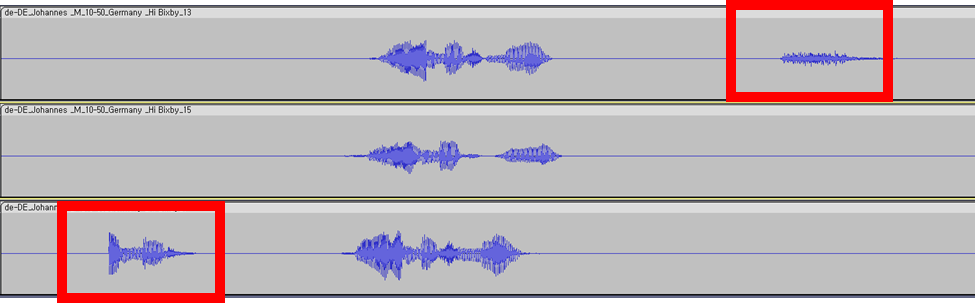 
<br>
2. 파동 앞 또는 뒤에 **공백이 너무 없는** 경우(0.5~1초 미만)
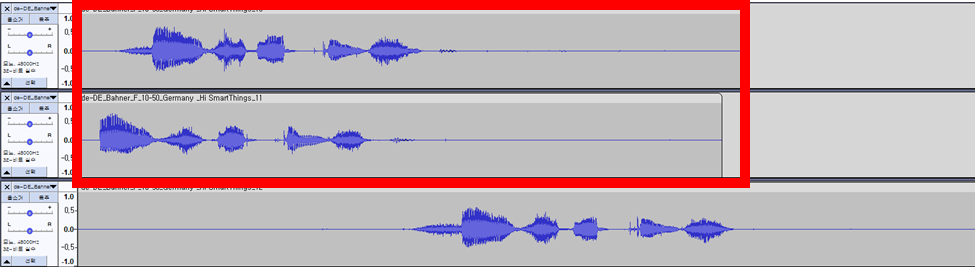 
<br>
3. **파장이 아예 없는** 경우
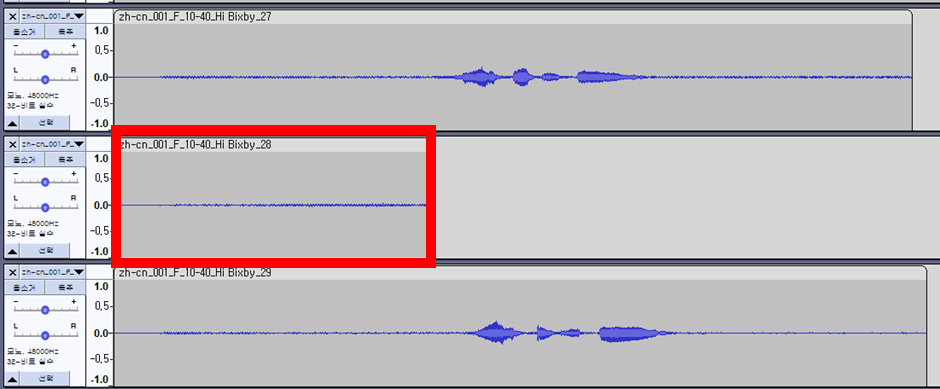 

In [264]:
import os
import shutil
from tqdm import tqdm

import IPython
from scipy.io import wavfile
import scipy.signal
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler

import librosa
import librosa.display
import librosa.util
from scipy.signal import hilbert, chirp, argrelextrema, find_peaks

%matplotlib inline
# scaler = StandardScaler()

## Train Test Split

In [2]:
SAMPLE_DIR = './../data/samples/'
TRAIN_DIR = './../data/train/'
TEST_DIR = './../data/test/'

if not os.path.isdir(TRAIN_DIR):
    os.makedirs(TRAIN_DIR)
if not os.path.isdir(TEST_DIR):
    os.makedirs(TEST_DIR)

In [3]:
# sample_folders = os.listdir(SAMPLE_DIR)  # 'Chris, F'와 같은 샘플 폴더

# for folder in sample_folders:
#     wav_list = os.listdir(SAMPLE_DIR + folder)
#     train_list = [file for file in wav_list if wav_list.index(file)%2==0]
#     test_list = [file for file in wav_list if wav_list.index(file)%2!=0]
#     for train_file in train_list:
#         if not os.path.exists(TRAIN_DIR + '/' + train_file):
#             shutil.copy(SAMPLE_DIR + folder + '/' + train_file, 
#                         TRAIN_DIR + '/' + train_file)
#     for test_file in test_list:
#         if not os.path.exists(TEST_DIR + '/' + test_file):
#             shutil.copy(SAMPLE_DIR + folder + '/' + test_file, 
#                         TEST_DIR + '/' + test_file)

## Analysis

In [347]:
wav_loc = "./../zh-cn_001_F_10-40_Bixby_4.wav"
wav_loc = TRAIN_DIR + 'de-DE_Bahner_F_10-50_Germany _Bixby_2.wav'

sr, wav = wavfile.read(wav_loc)
wav.shape
wav = wav / np.abs(wav).max()
sec = np.arange(len(wav))/float(sr)
len(wav)

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\3148242323.py:4: WavFileWarning: Reached EOF prematurely; finished at 364800 bytes, expected 364836 bytes from header.
  sr, wav = wavfile.read(wav_loc)


182378

In [261]:
def plot_audio(wav_loc):
    try:
        sr, wav = wavfile.read(wav_loc)
    #     wav, sr = librosa.load(wav_loc,
    #                            sr=None
    #                           )
    except UnboundLocalError:
        return {'UnboundLocalError': wav_loc.split('/')[-1]}
    
    
    if len(wav)==0:
        wav = wav
        return {'Format Error': wav_loc.split('/')[-1]}
    elif np.abs(wav).max() <= 1000:
        print('Silence!', wav_loc.split('/')[-1])
        return {'Silence': wav_loc.split('/')[-1]}
    else:
        wav = wav / np.abs(wav).max()
    
    sec = np.arange(len(wav))/float(sr)
#     print(np.abs(wav).max())

    plt.figure(figsize=(20,6))
    plt.plot(sec, wav)
    plt.tick_params(length=3, labelsize=14, labelcolor='white', top=True)
    plt.xlabel('Time(sec)', fontdict={'color':'white', 'size':20})
    plt.ylabel('Scailed Amplitude', fontdict={'color':'white', 'size':20})
    plt.title(wav_loc.split('/')[-1], fontdict={'color':'white', 'size':20})
    plt.show()
    
    return None
    
#     IPython.display.Audio(data=wav, rate=sr)

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\4040368356.py:2: WavFileWarning: Reached EOF prematurely; finished at 403200 bytes, expected 403236 bytes from header.
  sr, wav = wavfile.read(wav_loc)


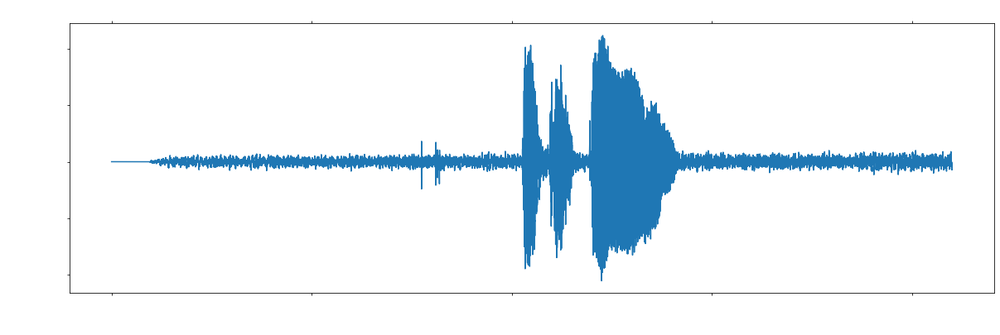

In [243]:
wav_loc = "./../zh-cn_001_F_10-40_Bixby_4.wav"
plot_audio(wav_loc)

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\4040368356.py:2: WavFileWarning: Reached EOF prematurely; finished at 364800 bytes, expected 364836 bytes from header.
  sr, wav = wavfile.read(wav_loc)


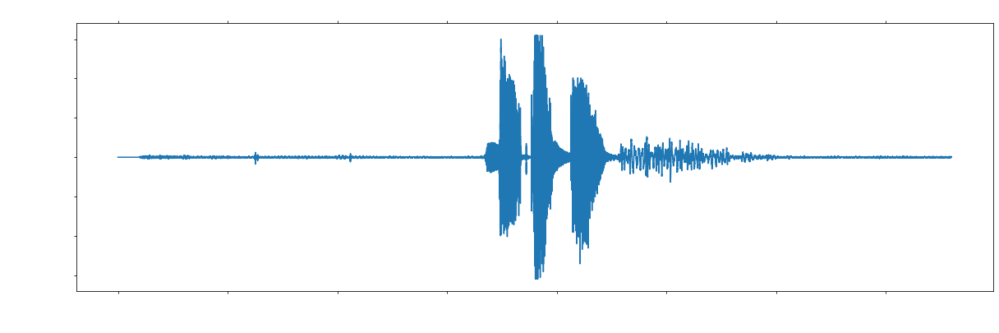

In [244]:
wav_loc = TRAIN_DIR + 'de-DE_Bahner_F_10-50_Germany _Bixby_8.wav'
plot_audio(wav_loc)

In [345]:
wav_loc = TRAIN_DIR + 'de-DE_Bahner_F_10-50_Germany _Bixby.wav'

### scipy.signal의 find_peaks
- height: peak의 minimum height
- threshold: peak와 그 이웃의 높이 차이, 노이즈가 많을 때 활용하기 좋음
- distance: peak의 minimum x축 거리
- prominence: the minimum height necessary to descend to get from the summit to any higher terrain, 클수록 해당 peak의 중요도가 큰 것을 의미

75 / 182378
541 / 182378
100 / 182378
3 / 182378


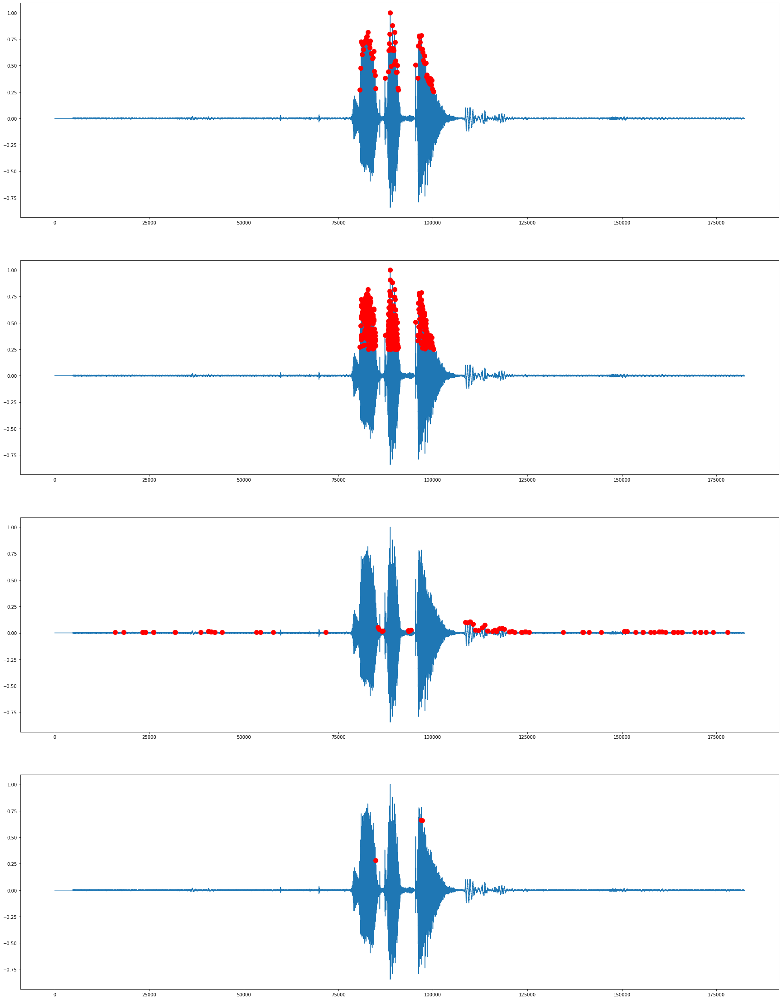

In [348]:
plt.figure(figsize=(30,40))

plt.subplot(4,1,1)
peaks, _ = find_peaks(wav, distance=100, height=0.25)
print(len(peaks), '/', len(wav))
plt.plot(wav)
plt.plot(peaks, wav[peaks], "or", markersize=10)

plt.subplot(4,1,2)
peaks, _ = find_peaks(wav, prominence=0.1, height=0.25)
print(len(peaks), '/', len(wav))
plt.plot(wav)
plt.plot(peaks, wav[peaks], "or", markersize=10)

plt.subplot(4,1,3)
peaks, _ = find_peaks(wav, width=100)
print(len(peaks), '/', len(wav))
plt.plot(wav)
plt.plot(peaks, wav[peaks], "or", markersize=10)

plt.subplot(4,1,4)
peaks, _ = find_peaks(wav, width=80, height=0.25)
print(len(peaks), '/', len(wav))
plt.plot(wav)
plt.plot(peaks, wav[peaks], "or", markersize=10)

6 / 182378


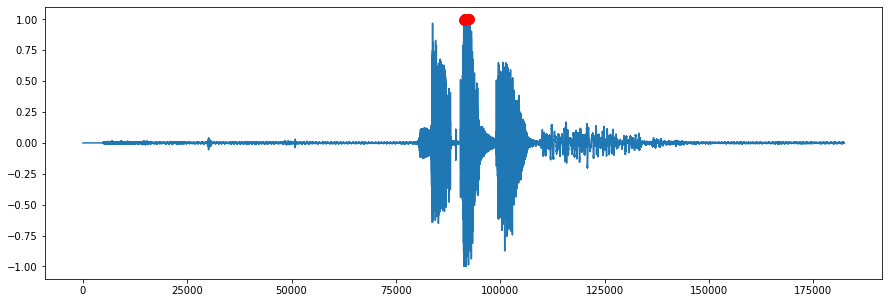

In [166]:
prominences = scipy.signal.peak_prominences(wav, peaks)[0]
prominence_new = np.percentile(prominences, [0, 25, 50, 75, 100], interpolation='nearest')[2]
peaks, _ = find_peaks(wav, prominence = prominence_new)
print(len(peaks), '/', len(wav))
plt.figure(figsize=(15,5))
plt.plot(wav)
plt.plot(peaks, wav[peaks], "or", markersize=10)

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 376320 bytes, expected 376356 bytes from header.
  sr, wav = wavfile.read(wav_loc)


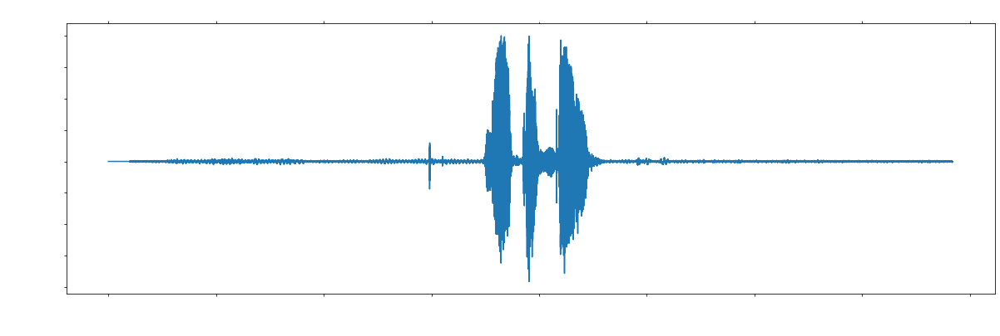

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 391680 bytes, expected 391716 bytes from header.
  sr, wav = wavfile.read(wav_loc)


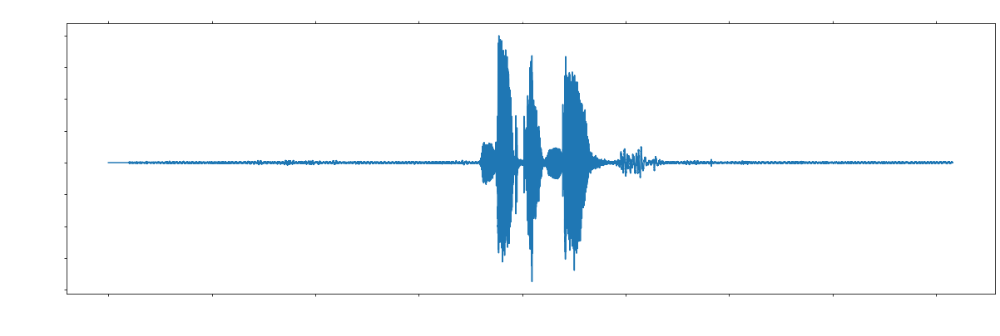

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 345600 bytes, expected 345636 bytes from header.
  sr, wav = wavfile.read(wav_loc)


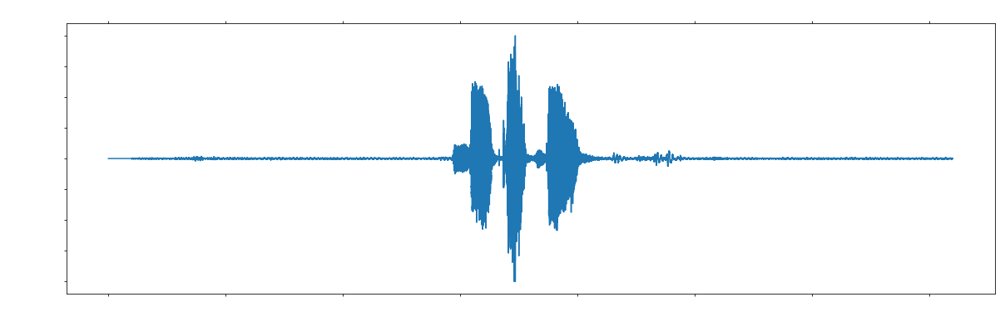

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 380160 bytes, expected 380196 bytes from header.
  sr, wav = wavfile.read(wav_loc)


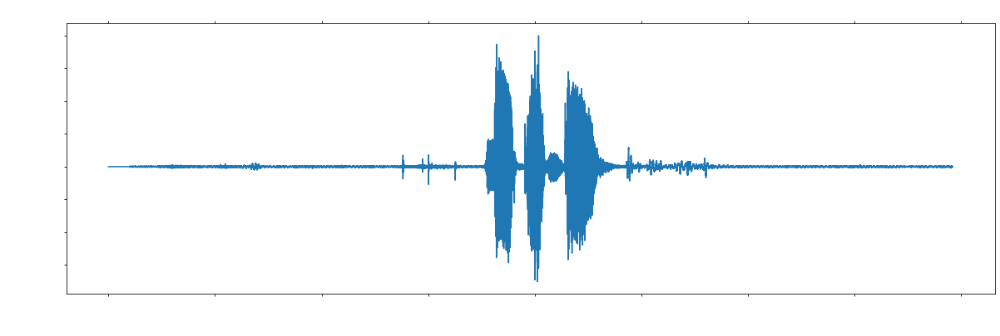

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 387840 bytes, expected 387876 bytes from header.
  sr, wav = wavfile.read(wav_loc)


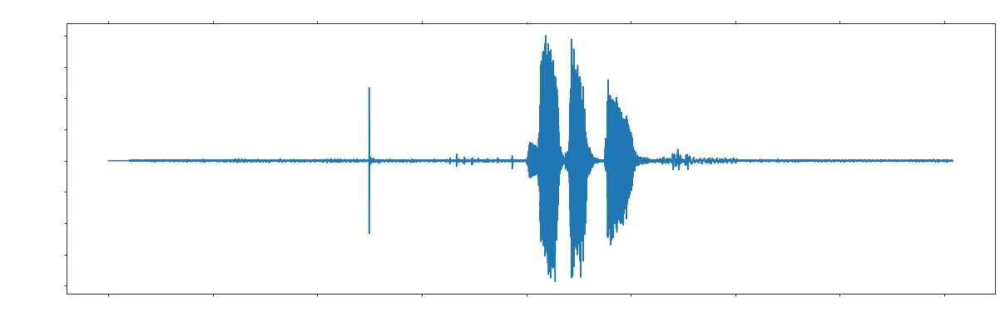

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 407040 bytes, expected 407076 bytes from header.
  sr, wav = wavfile.read(wav_loc)


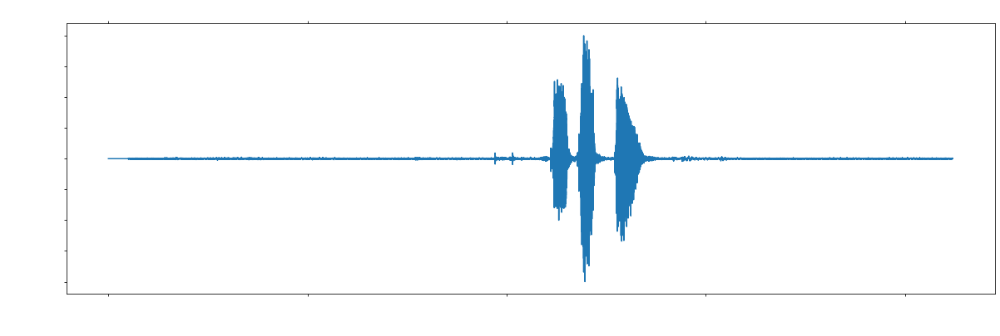

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 364800 bytes, expected 364836 bytes from header.
  sr, wav = wavfile.read(wav_loc)


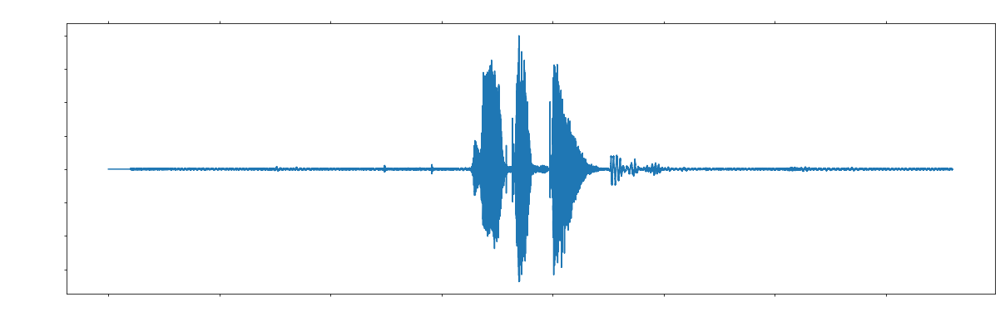

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 349440 bytes, expected 349476 bytes from header.
  sr, wav = wavfile.read(wav_loc)


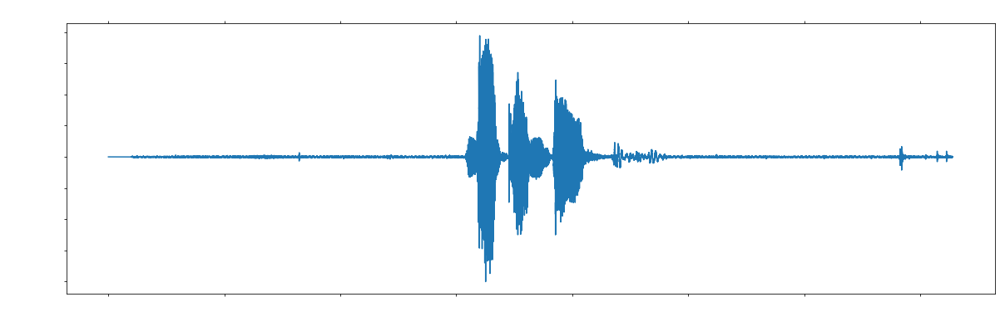

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 368640 bytes, expected 368676 bytes from header.
  sr, wav = wavfile.read(wav_loc)


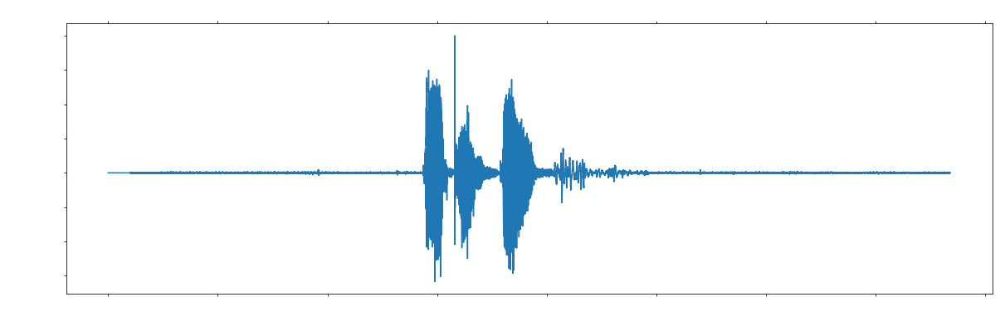

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 372480 bytes, expected 372516 bytes from header.
  sr, wav = wavfile.read(wav_loc)


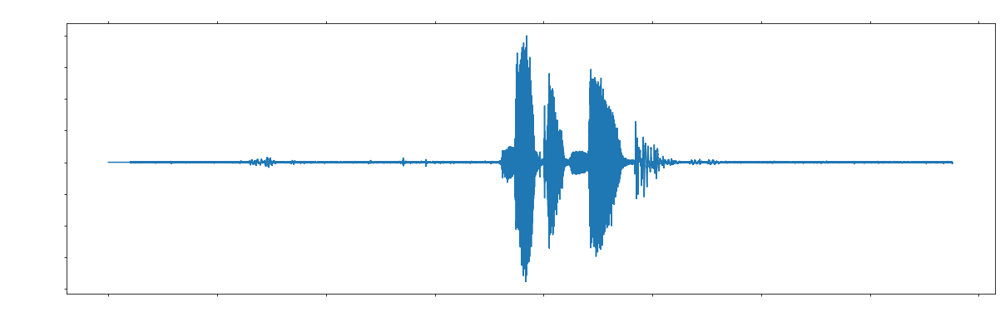

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 364800 bytes, expected 364836 bytes from header.
  sr, wav = wavfile.read(wav_loc)


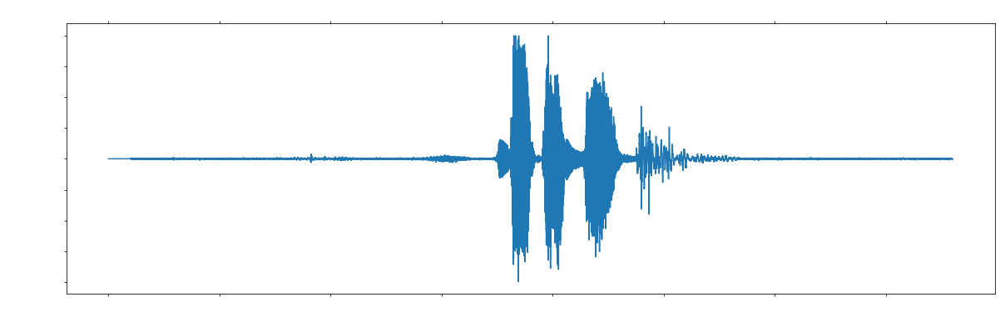

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 384000 bytes, expected 384036 bytes from header.
  sr, wav = wavfile.read(wav_loc)


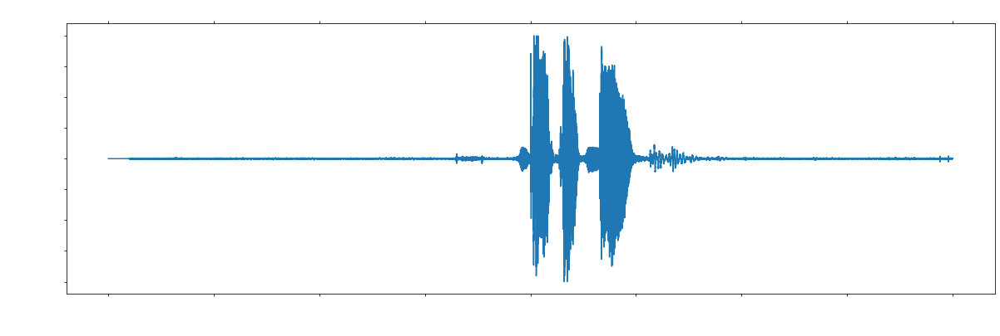

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 380160 bytes, expected 380196 bytes from header.
  sr, wav = wavfile.read(wav_loc)


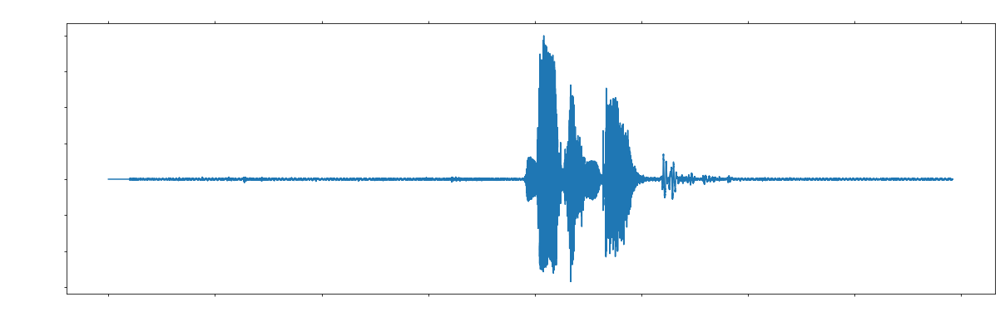

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 360960 bytes, expected 360996 bytes from header.
  sr, wav = wavfile.read(wav_loc)


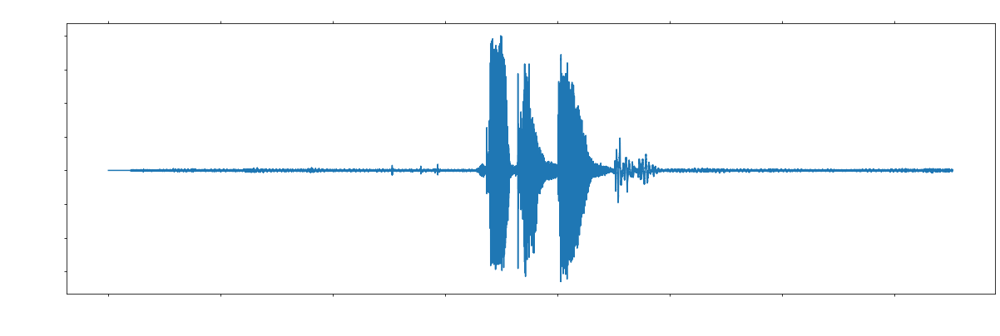

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 364800 bytes, expected 364836 bytes from header.
  sr, wav = wavfile.read(wav_loc)


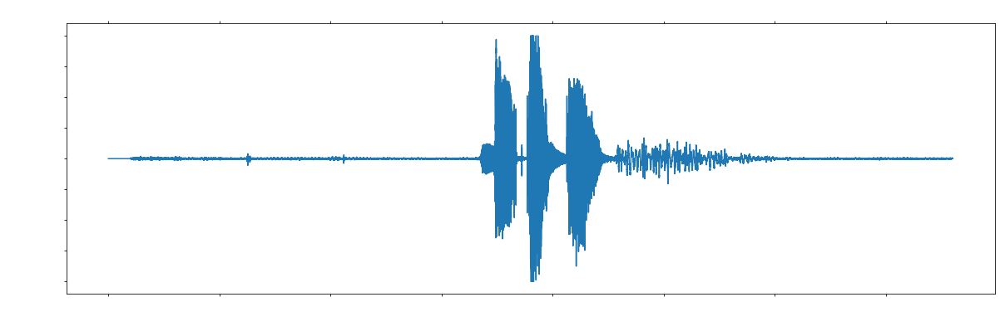

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 430080 bytes, expected 430116 bytes from header.
  sr, wav = wavfile.read(wav_loc)


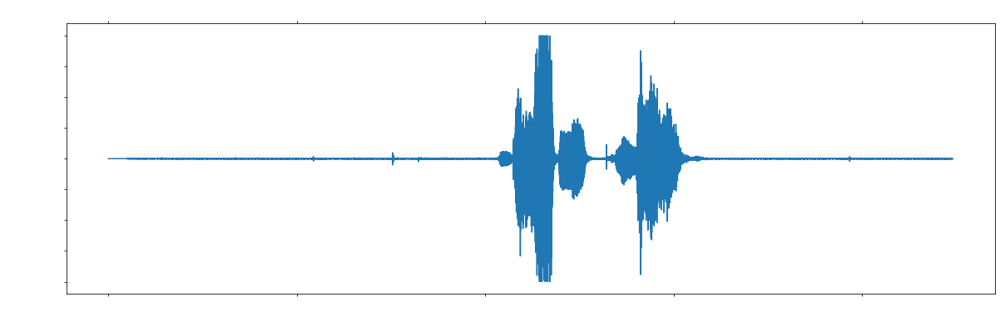

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 422400 bytes, expected 422436 bytes from header.
  sr, wav = wavfile.read(wav_loc)


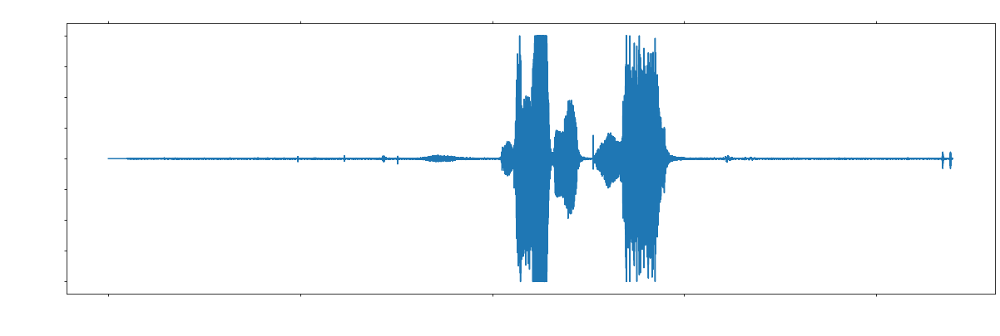

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 372480 bytes, expected 372516 bytes from header.
  sr, wav = wavfile.read(wav_loc)


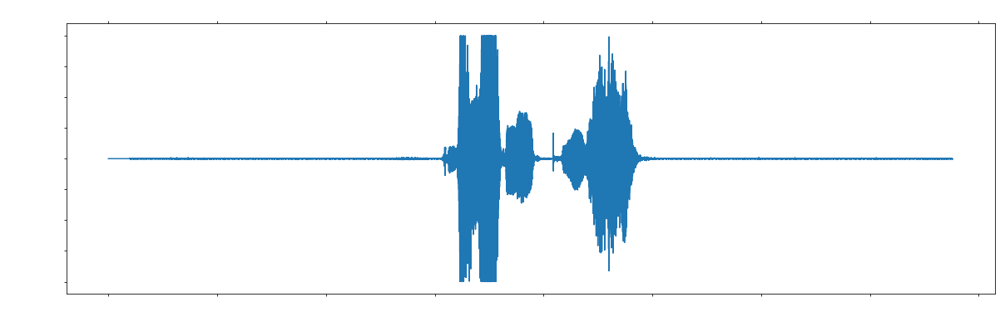

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 395520 bytes, expected 395556 bytes from header.
  sr, wav = wavfile.read(wav_loc)


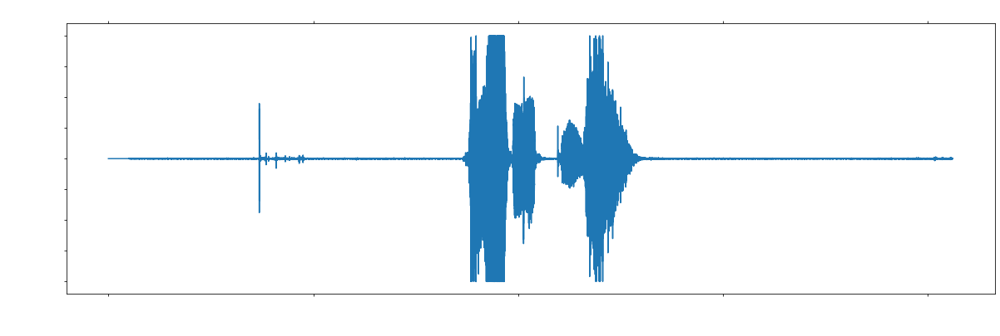

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 380160 bytes, expected 380196 bytes from header.
  sr, wav = wavfile.read(wav_loc)


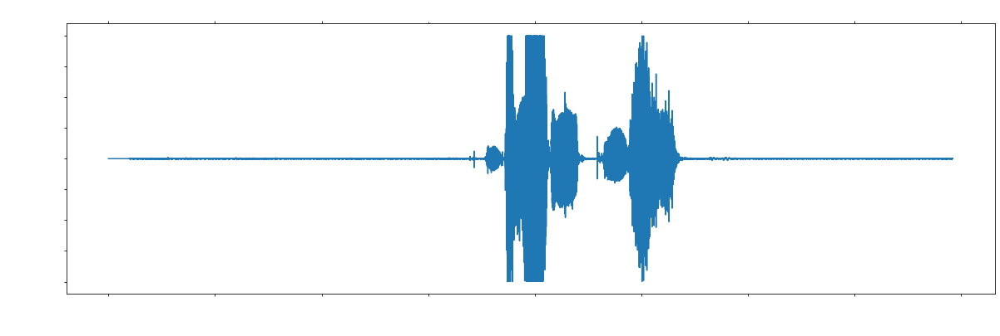

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 360960 bytes, expected 360996 bytes from header.
  sr, wav = wavfile.read(wav_loc)


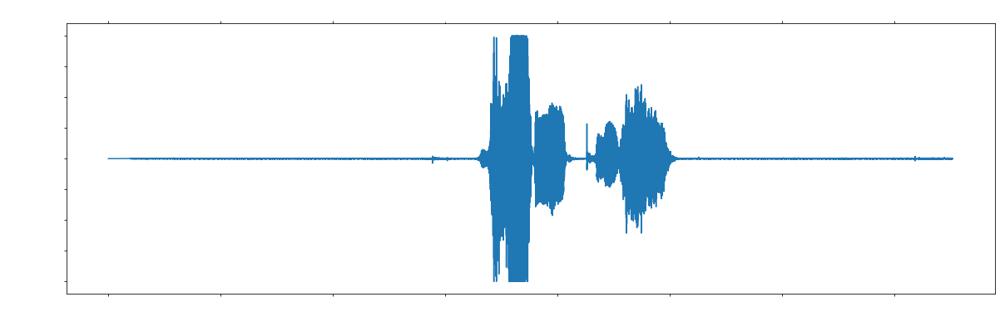

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 403200 bytes, expected 403236 bytes from header.
  sr, wav = wavfile.read(wav_loc)


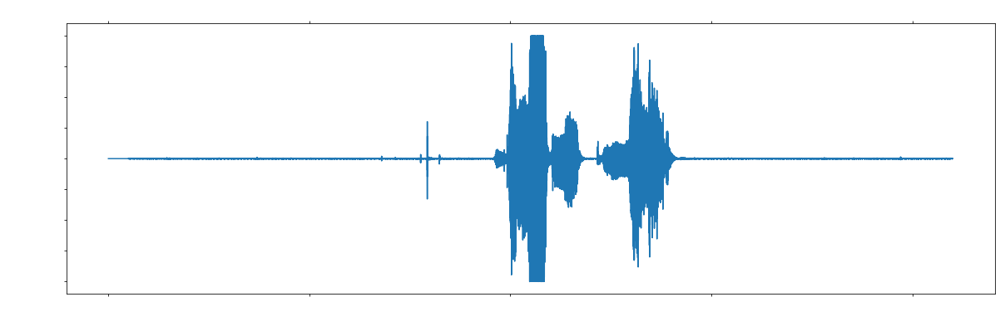

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 353280 bytes, expected 353316 bytes from header.
  sr, wav = wavfile.read(wav_loc)


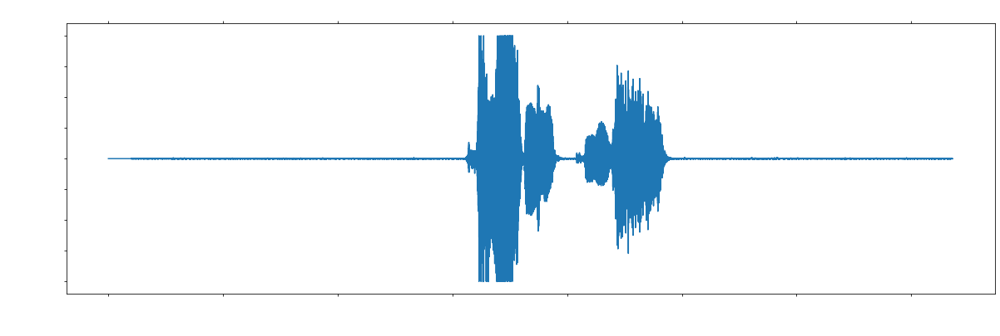

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 422400 bytes, expected 422436 bytes from header.
  sr, wav = wavfile.read(wav_loc)


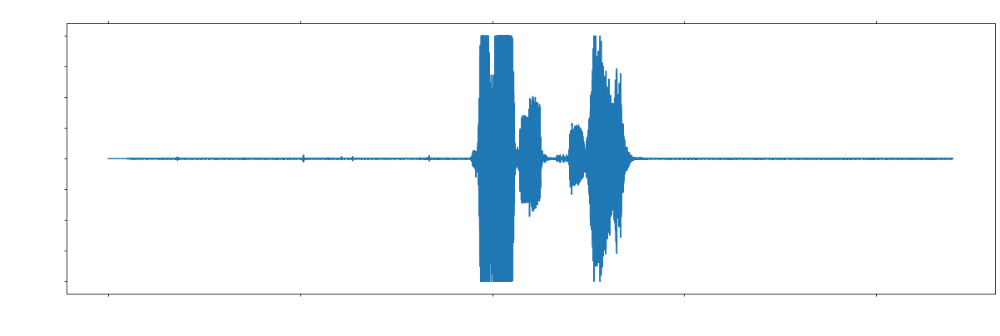

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 414720 bytes, expected 414756 bytes from header.
  sr, wav = wavfile.read(wav_loc)


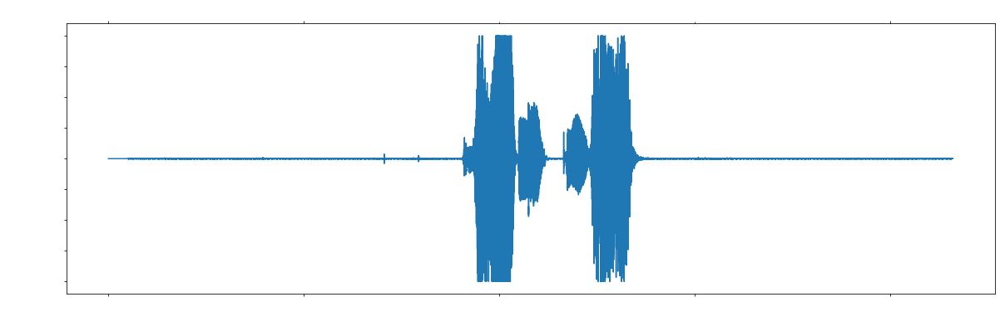

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 357120 bytes, expected 357156 bytes from header.
  sr, wav = wavfile.read(wav_loc)


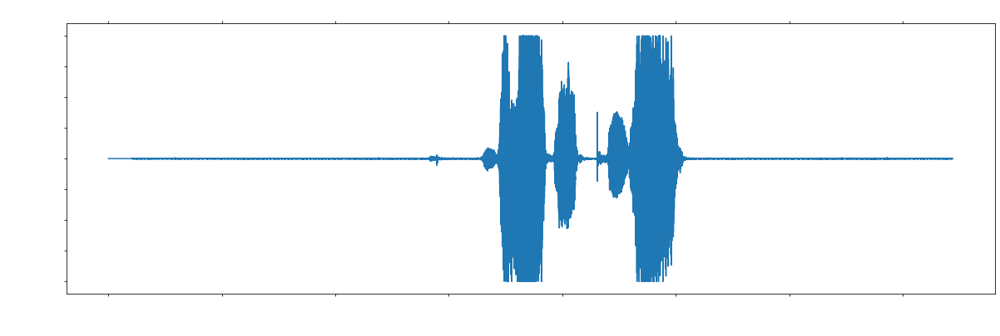

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 368640 bytes, expected 368676 bytes from header.
  sr, wav = wavfile.read(wav_loc)


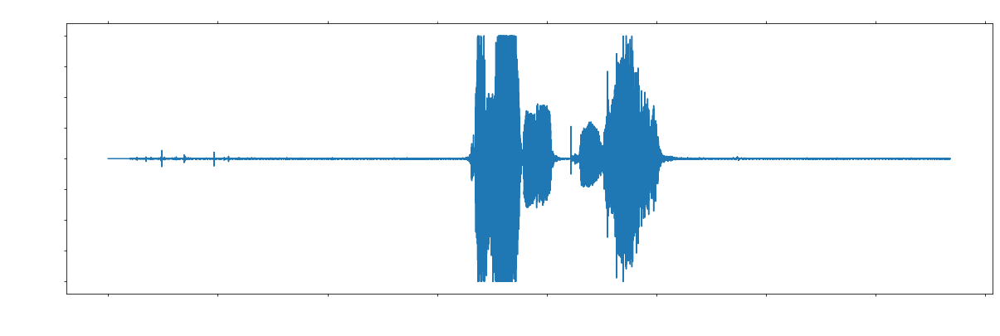

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 391680 bytes, expected 391716 bytes from header.
  sr, wav = wavfile.read(wav_loc)


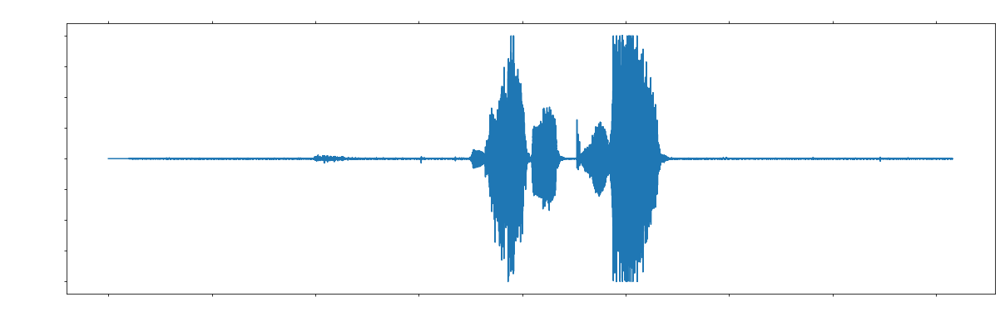

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 384000 bytes, expected 384036 bytes from header.
  sr, wav = wavfile.read(wav_loc)


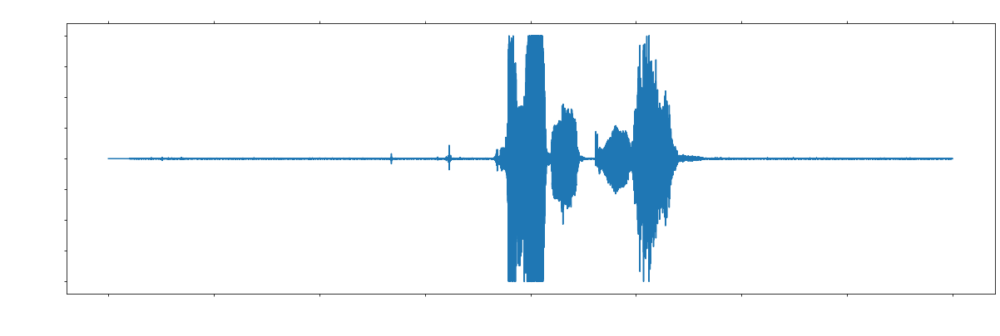

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 368640 bytes, expected 368676 bytes from header.
  sr, wav = wavfile.read(wav_loc)


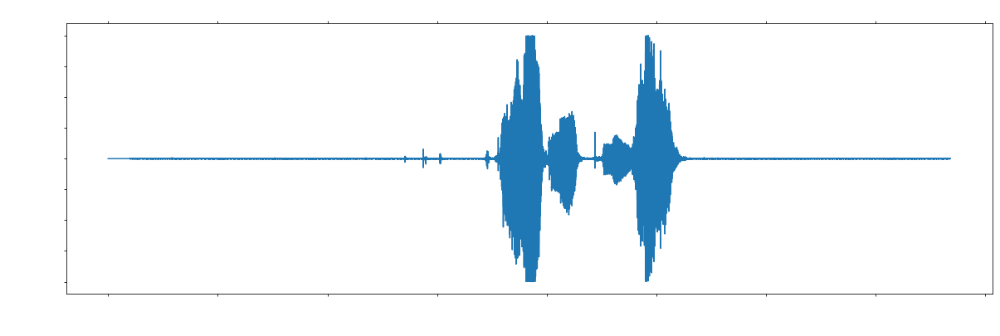

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 476160 bytes, expected 476196 bytes from header.
  sr, wav = wavfile.read(wav_loc)


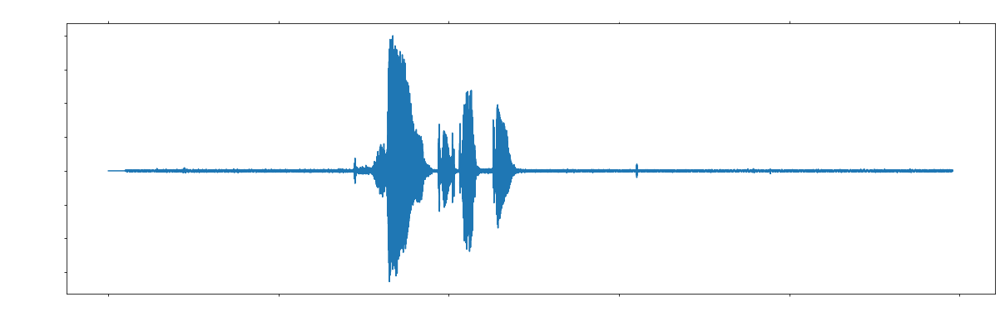

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 506880 bytes, expected 506916 bytes from header.
  sr, wav = wavfile.read(wav_loc)


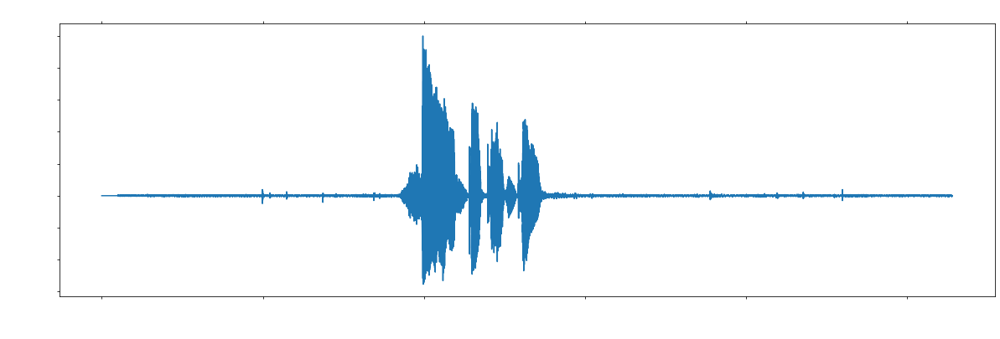

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 399360 bytes, expected 399396 bytes from header.
  sr, wav = wavfile.read(wav_loc)


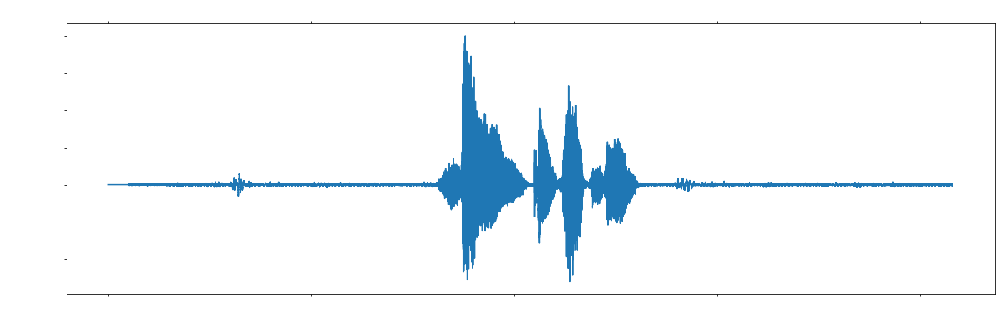

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 403200 bytes, expected 403236 bytes from header.
  sr, wav = wavfile.read(wav_loc)


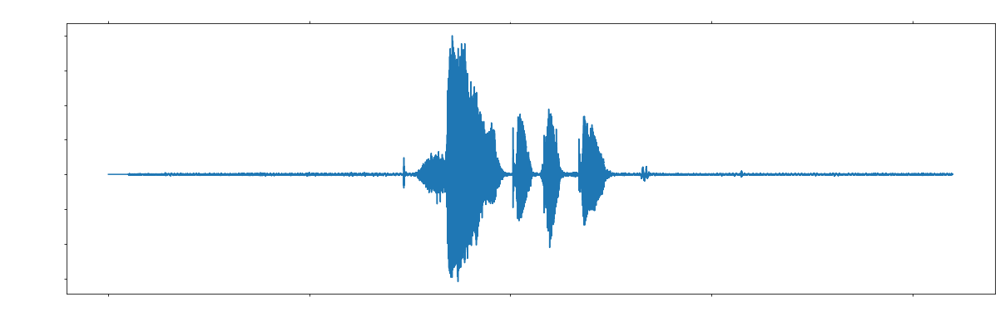

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 441600 bytes, expected 441636 bytes from header.
  sr, wav = wavfile.read(wav_loc)


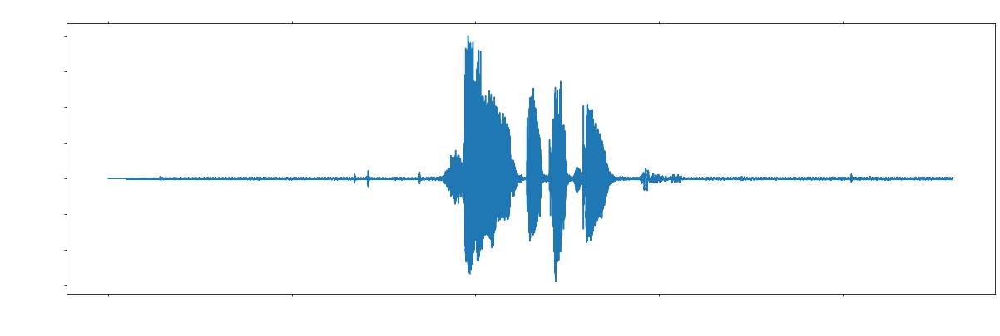

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 380160 bytes, expected 380196 bytes from header.
  sr, wav = wavfile.read(wav_loc)


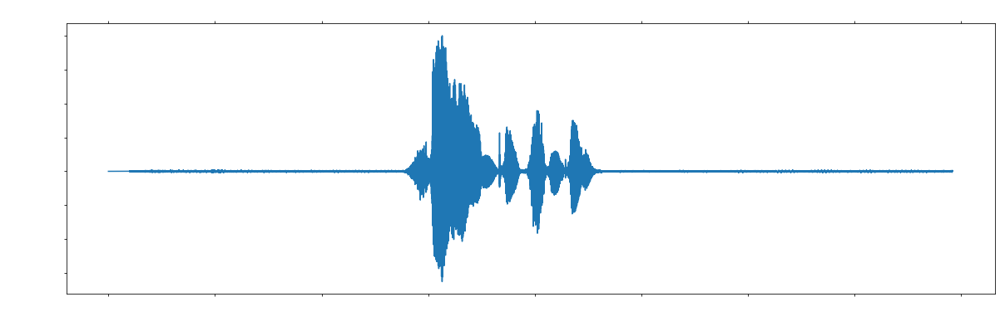

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 480000 bytes, expected 480036 bytes from header.
  sr, wav = wavfile.read(wav_loc)


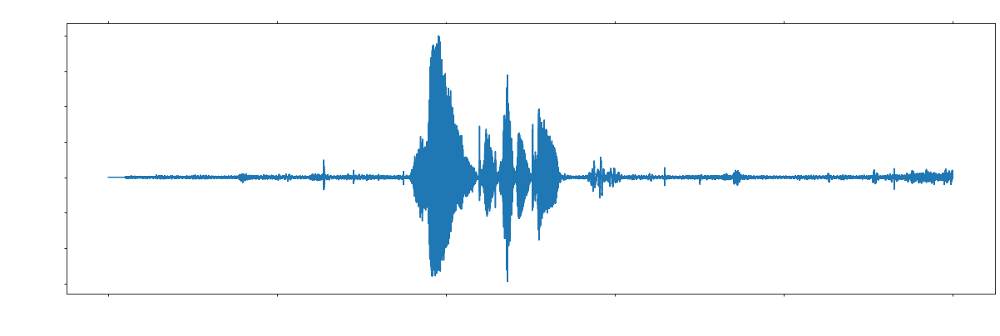

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 407040 bytes, expected 407076 bytes from header.
  sr, wav = wavfile.read(wav_loc)


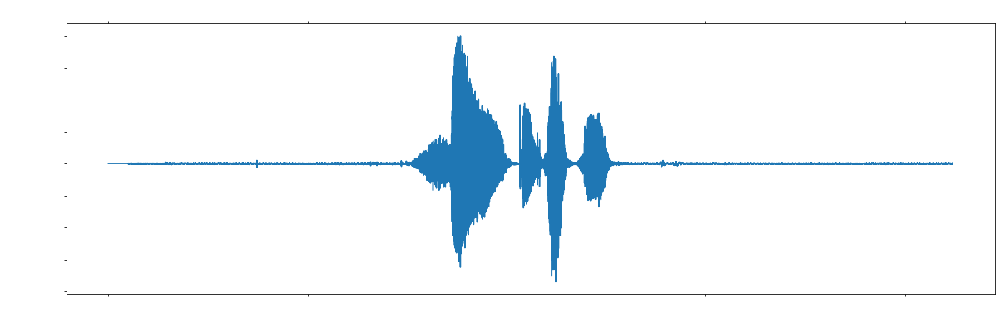

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 449280 bytes, expected 449316 bytes from header.
  sr, wav = wavfile.read(wav_loc)


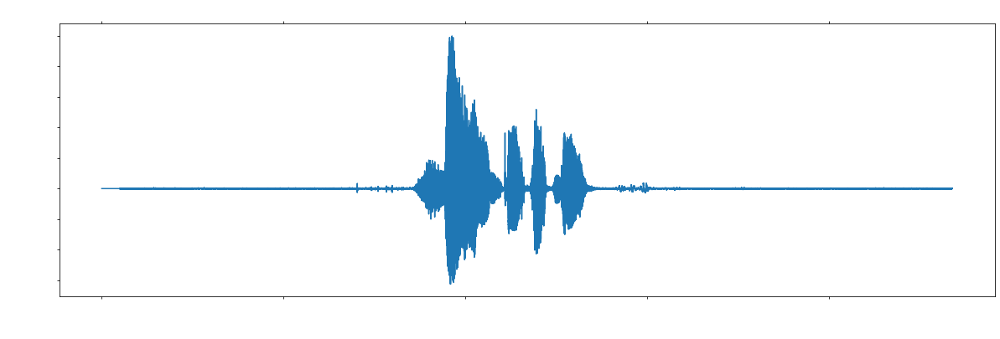

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 476160 bytes, expected 476196 bytes from header.
  sr, wav = wavfile.read(wav_loc)


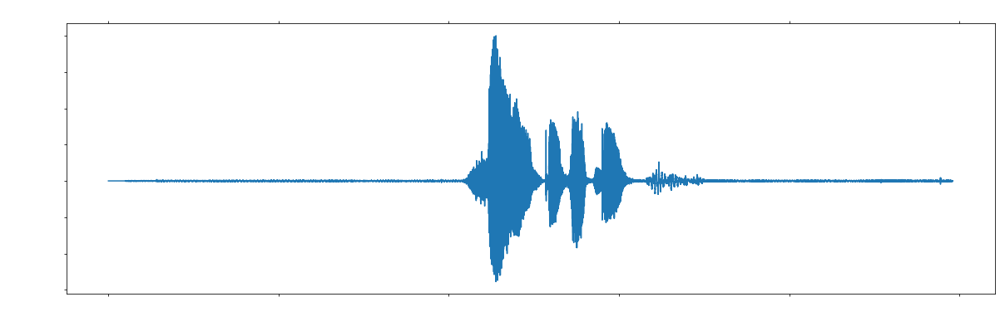

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 410880 bytes, expected 410916 bytes from header.
  sr, wav = wavfile.read(wav_loc)


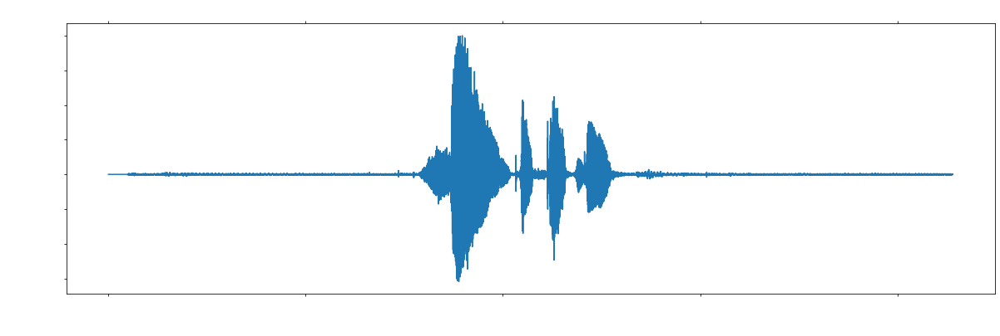

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 414720 bytes, expected 414756 bytes from header.
  sr, wav = wavfile.read(wav_loc)


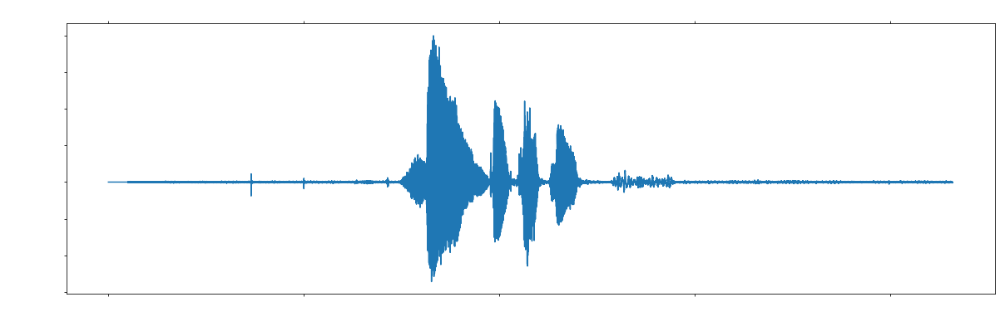

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 418560 bytes, expected 418596 bytes from header.
  sr, wav = wavfile.read(wav_loc)


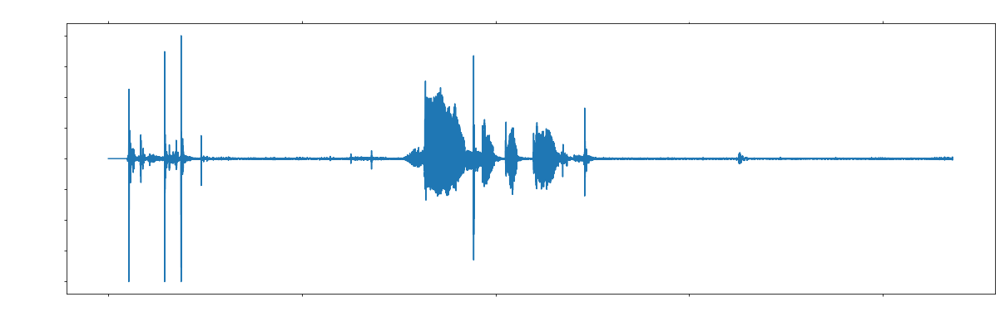

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 430080 bytes, expected 430116 bytes from header.
  sr, wav = wavfile.read(wav_loc)


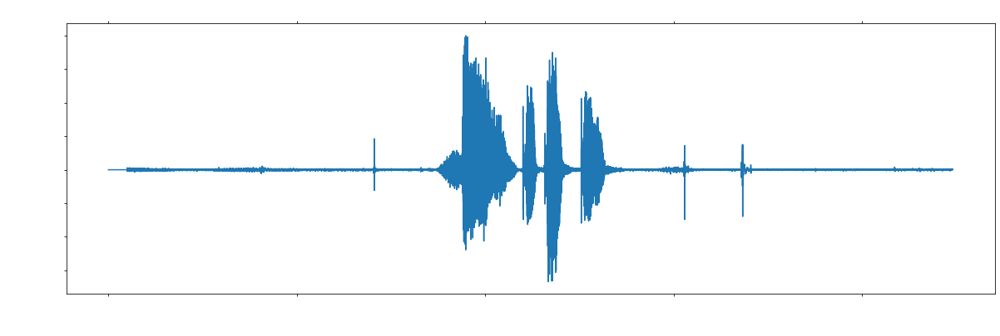

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 533760 bytes, expected 533796 bytes from header.
  sr, wav = wavfile.read(wav_loc)


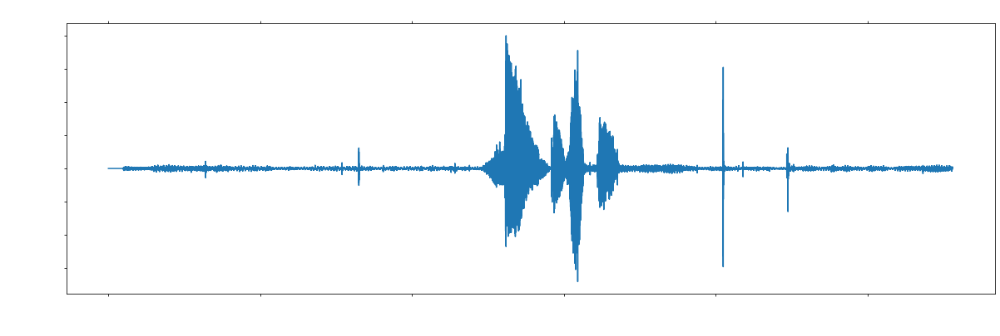

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 395520 bytes, expected 395556 bytes from header.
  sr, wav = wavfile.read(wav_loc)


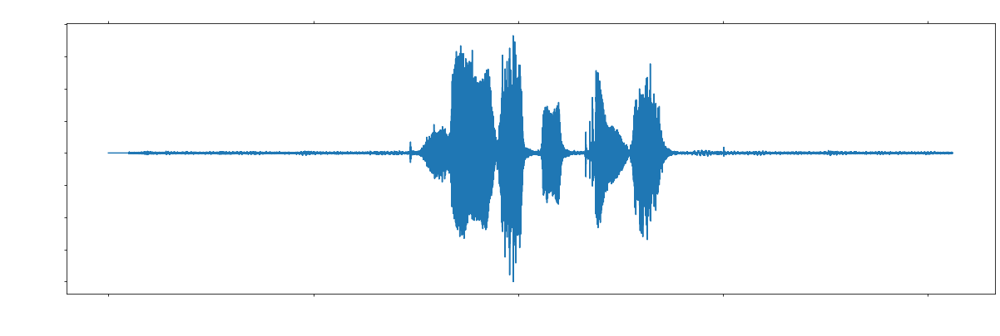

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 284160 bytes, expected 284196 bytes from header.
  sr, wav = wavfile.read(wav_loc)


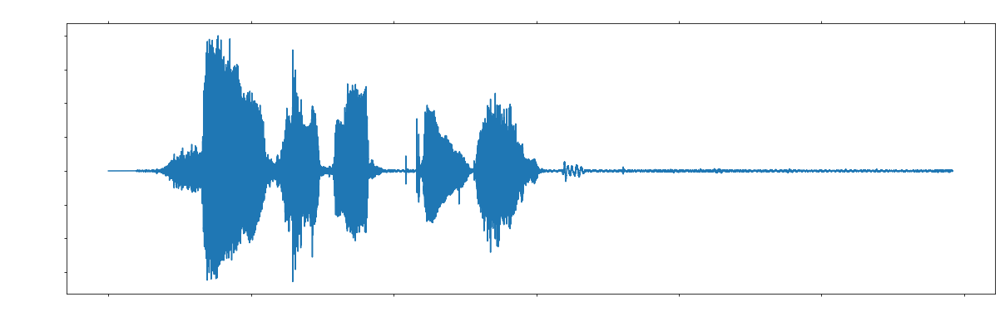

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 399360 bytes, expected 399396 bytes from header.
  sr, wav = wavfile.read(wav_loc)


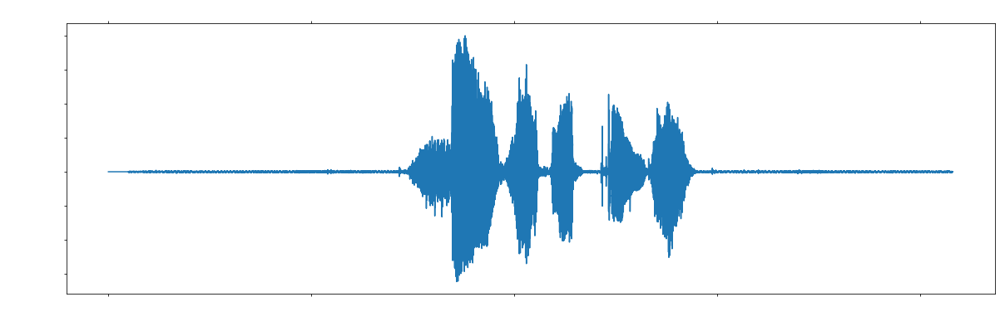

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 426240 bytes, expected 426276 bytes from header.
  sr, wav = wavfile.read(wav_loc)


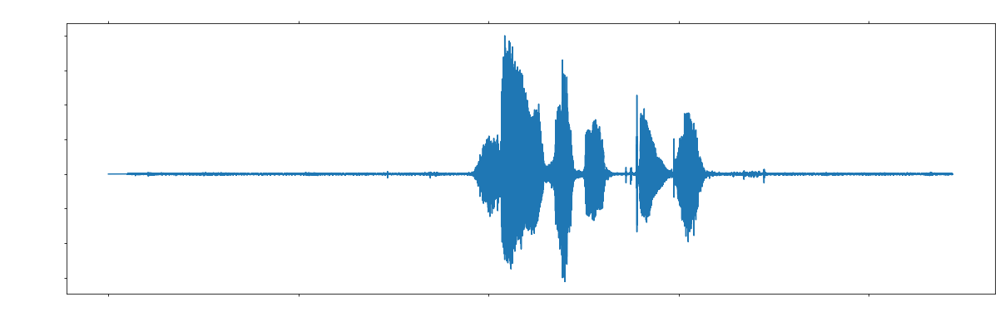

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 418560 bytes, expected 418596 bytes from header.
  sr, wav = wavfile.read(wav_loc)


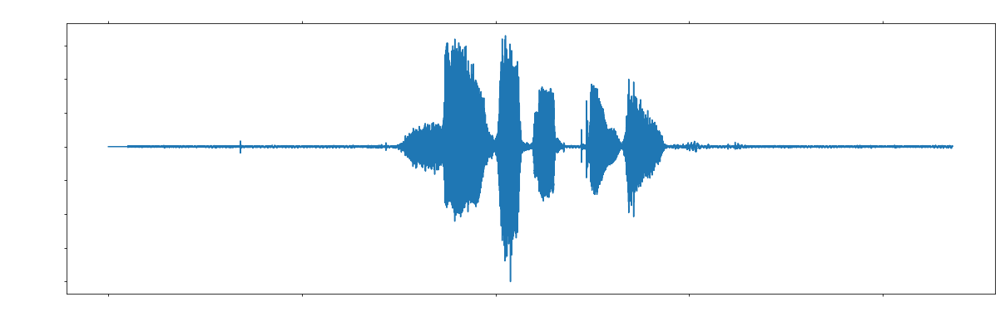

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 384000 bytes, expected 384036 bytes from header.
  sr, wav = wavfile.read(wav_loc)


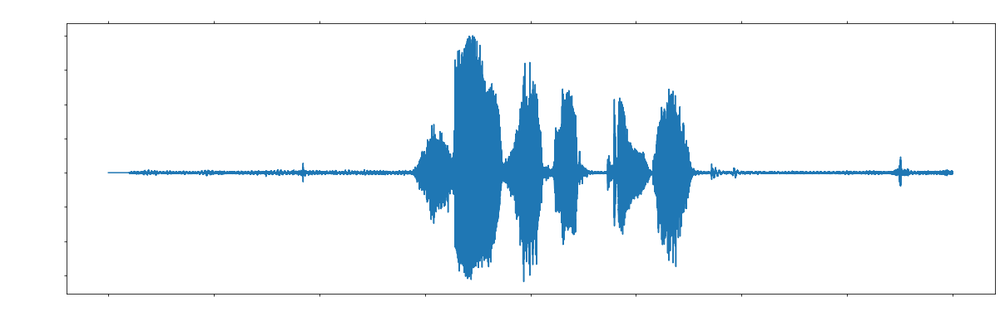

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 391680 bytes, expected 391716 bytes from header.
  sr, wav = wavfile.read(wav_loc)


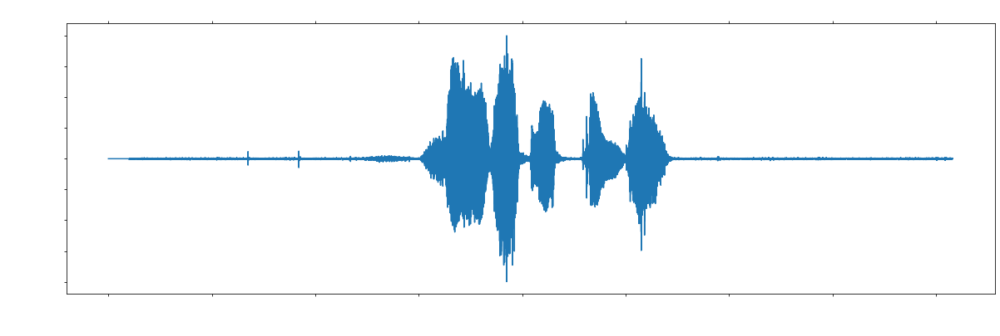

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 384000 bytes, expected 384036 bytes from header.
  sr, wav = wavfile.read(wav_loc)


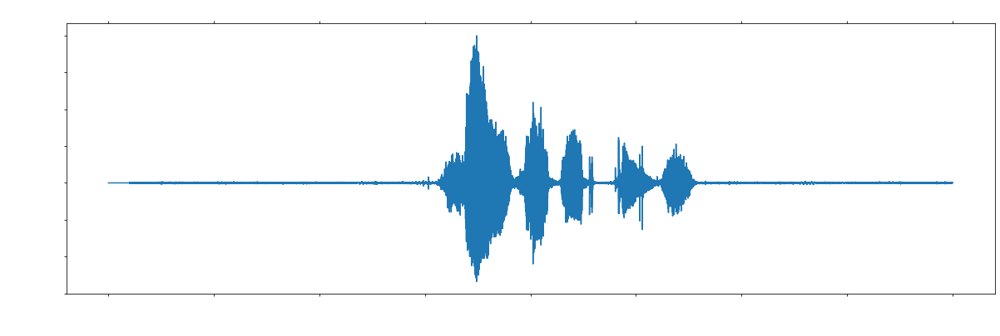

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 395520 bytes, expected 395556 bytes from header.
  sr, wav = wavfile.read(wav_loc)


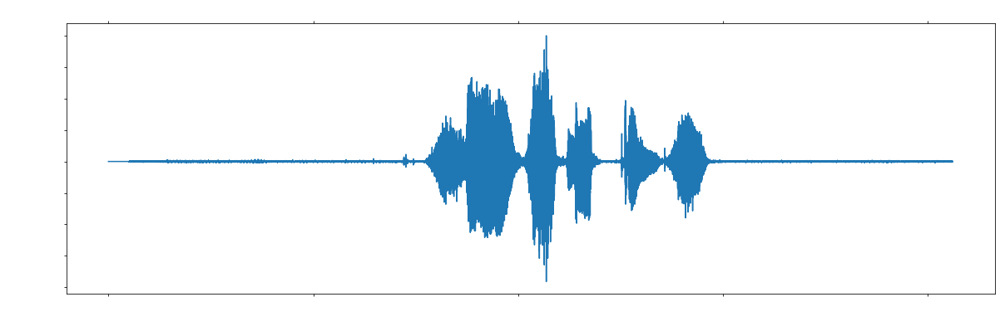

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 407040 bytes, expected 407076 bytes from header.
  sr, wav = wavfile.read(wav_loc)


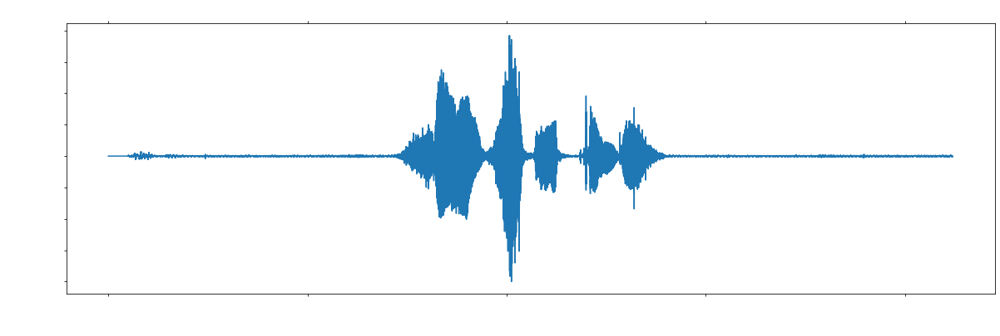

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 403200 bytes, expected 403236 bytes from header.
  sr, wav = wavfile.read(wav_loc)


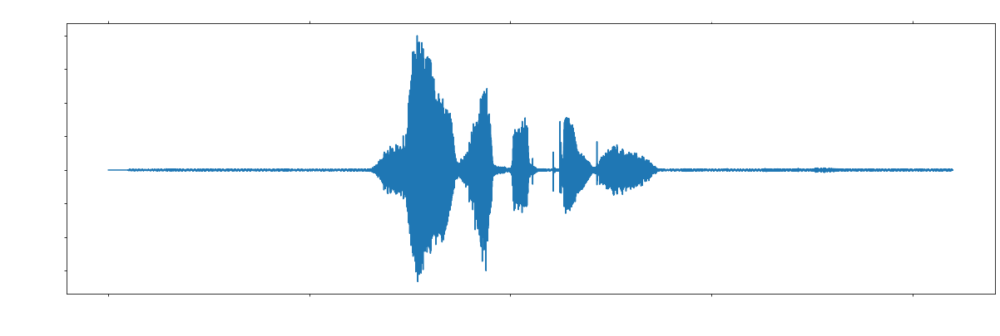

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 445440 bytes, expected 445476 bytes from header.
  sr, wav = wavfile.read(wav_loc)


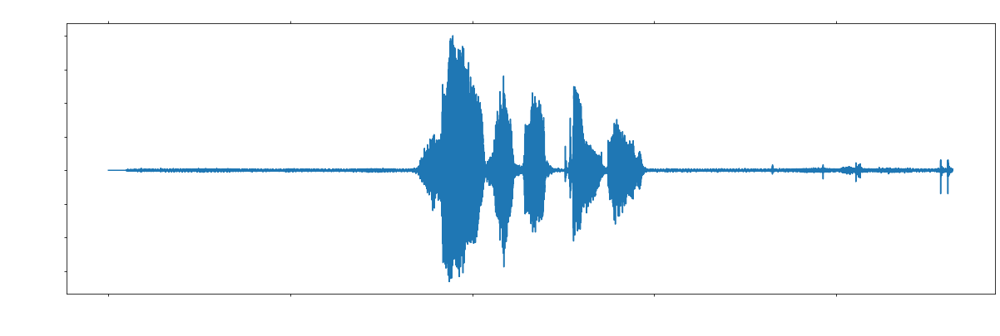

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 407040 bytes, expected 407076 bytes from header.
  sr, wav = wavfile.read(wav_loc)


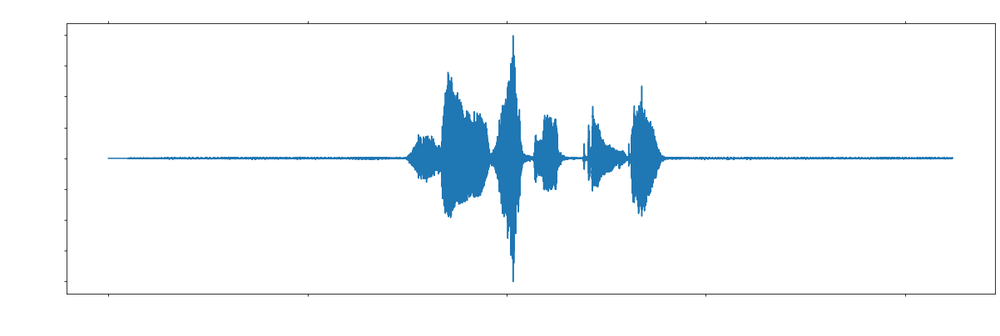

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 418560 bytes, expected 418596 bytes from header.
  sr, wav = wavfile.read(wav_loc)


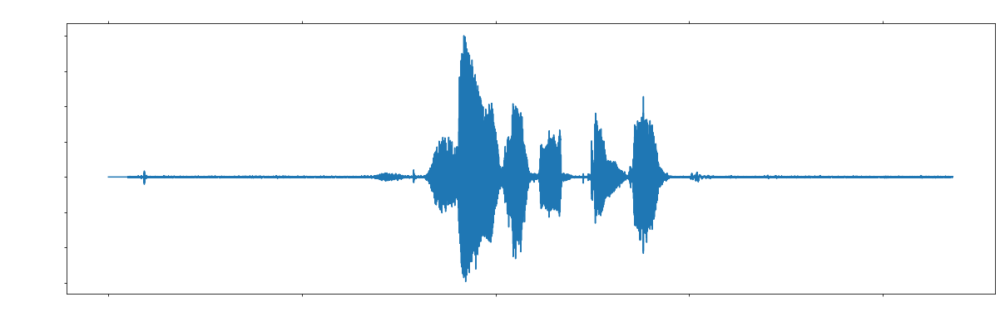

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 426240 bytes, expected 426276 bytes from header.
  sr, wav = wavfile.read(wav_loc)


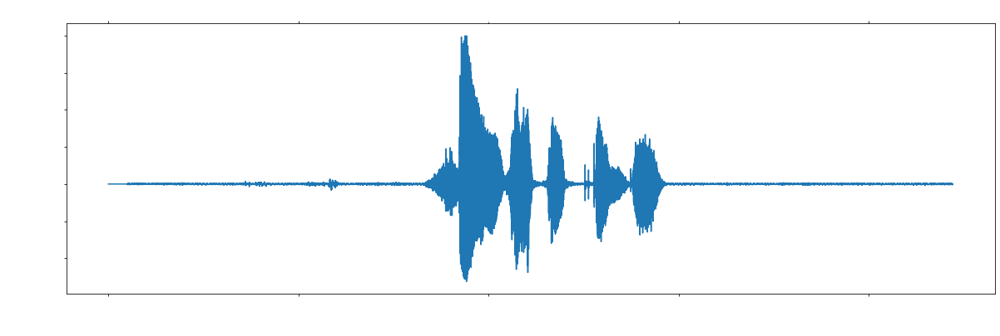

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 387840 bytes, expected 387876 bytes from header.
  sr, wav = wavfile.read(wav_loc)


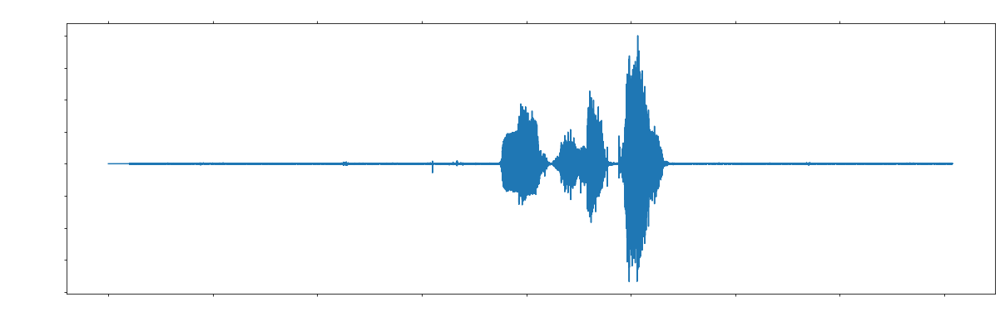

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 384000 bytes, expected 384036 bytes from header.
  sr, wav = wavfile.read(wav_loc)


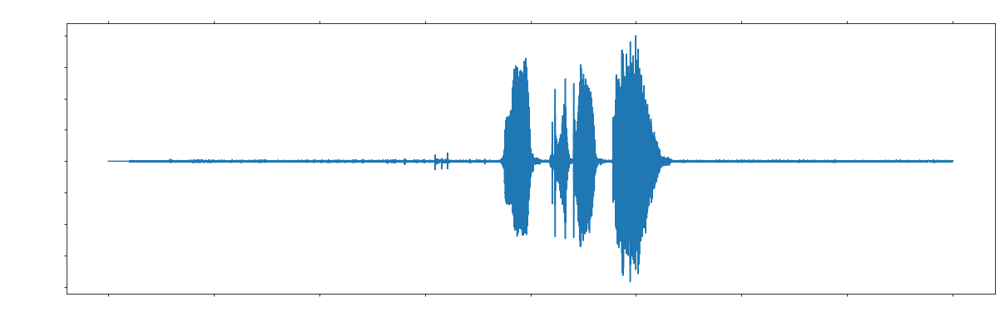

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 353280 bytes, expected 353316 bytes from header.
  sr, wav = wavfile.read(wav_loc)


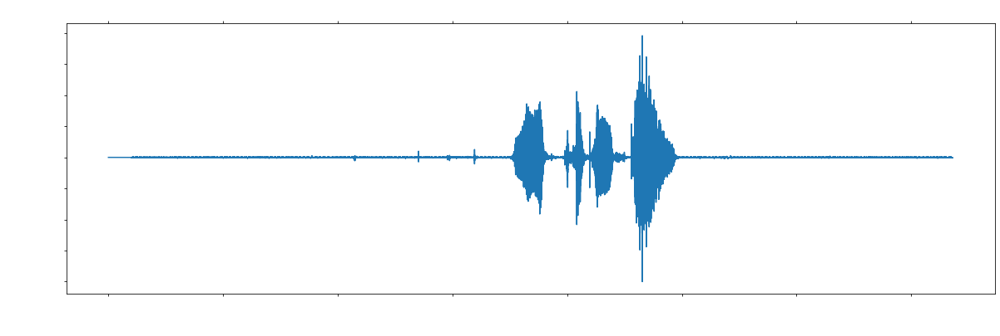

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 364800 bytes, expected 364836 bytes from header.
  sr, wav = wavfile.read(wav_loc)


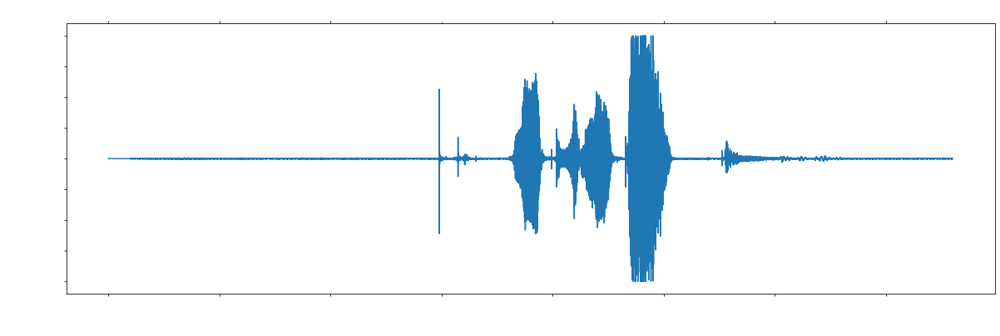

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 337920 bytes, expected 337956 bytes from header.
  sr, wav = wavfile.read(wav_loc)


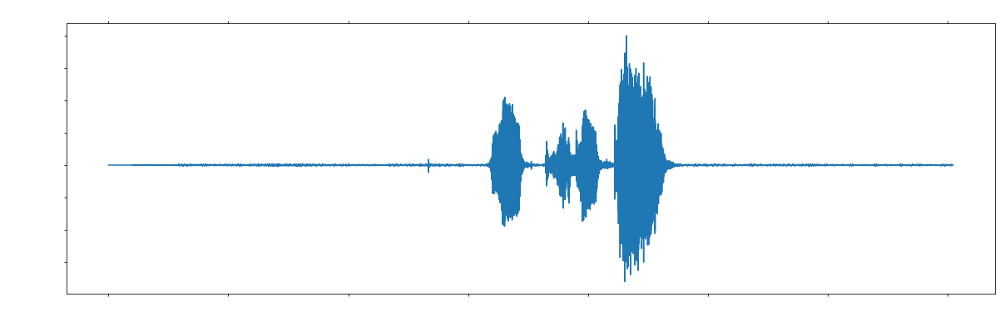

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 414720 bytes, expected 414756 bytes from header.
  sr, wav = wavfile.read(wav_loc)


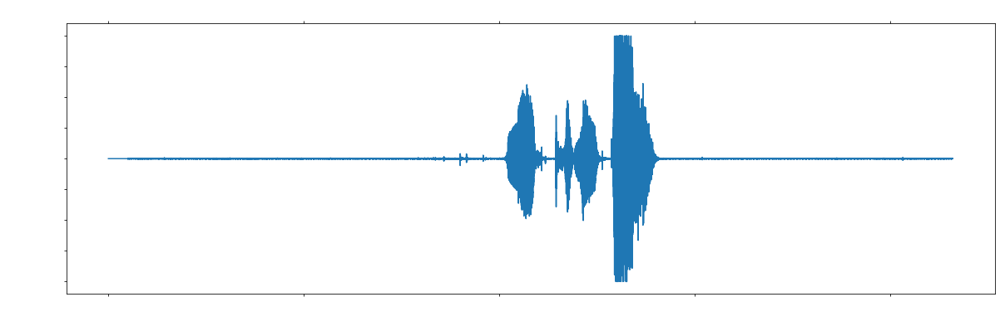

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 353280 bytes, expected 353316 bytes from header.
  sr, wav = wavfile.read(wav_loc)


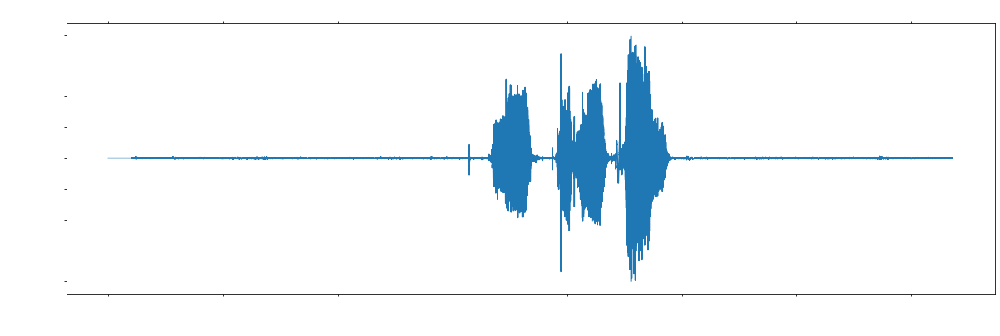

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 357120 bytes, expected 357156 bytes from header.
  sr, wav = wavfile.read(wav_loc)


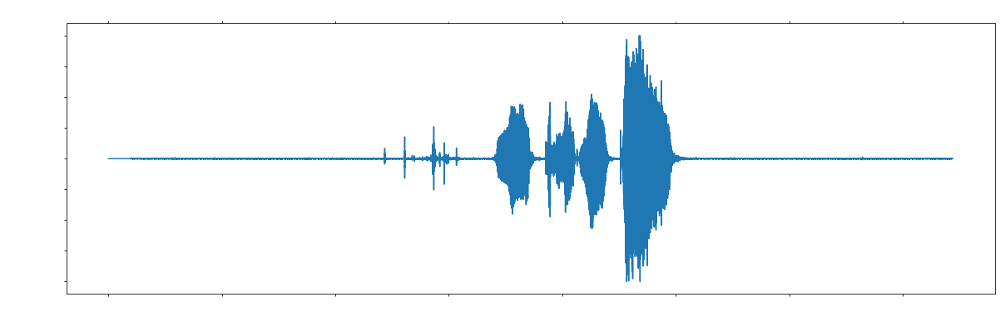

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 357120 bytes, expected 357156 bytes from header.
  sr, wav = wavfile.read(wav_loc)


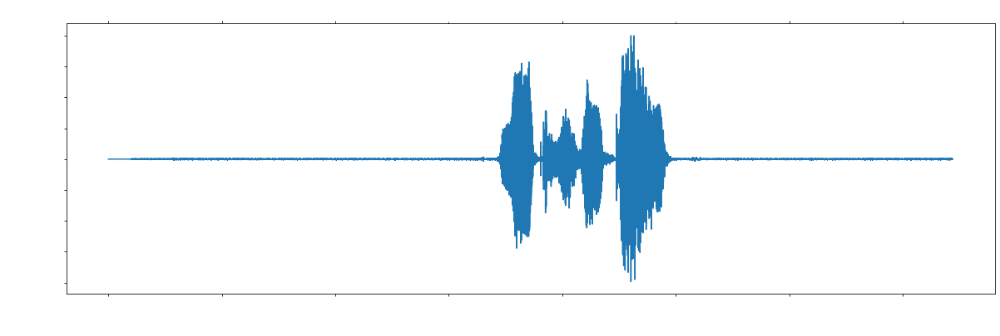

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 364800 bytes, expected 364836 bytes from header.
  sr, wav = wavfile.read(wav_loc)


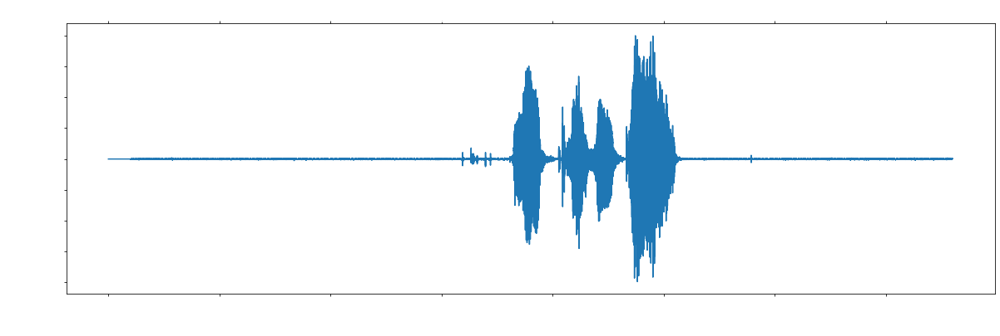

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 357120 bytes, expected 357156 bytes from header.
  sr, wav = wavfile.read(wav_loc)


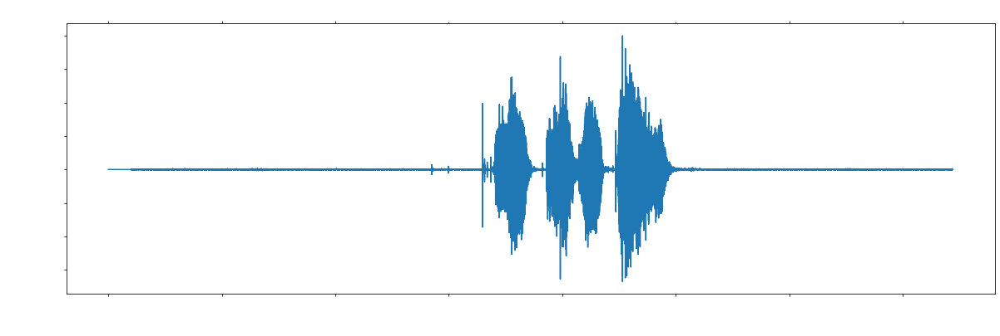

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 341760 bytes, expected 341796 bytes from header.
  sr, wav = wavfile.read(wav_loc)


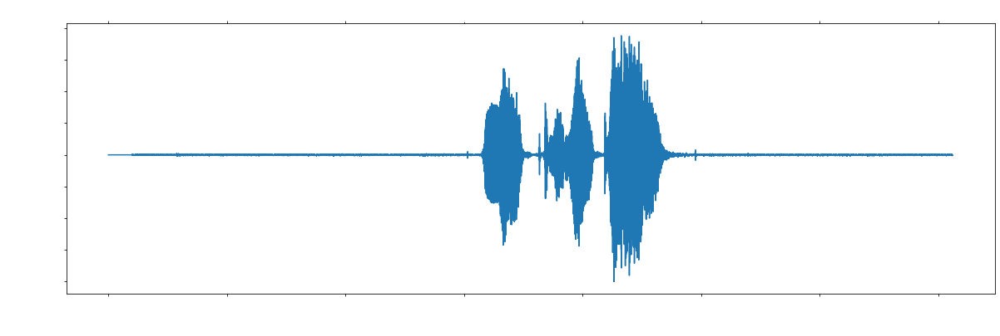

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 368640 bytes, expected 368676 bytes from header.
  sr, wav = wavfile.read(wav_loc)


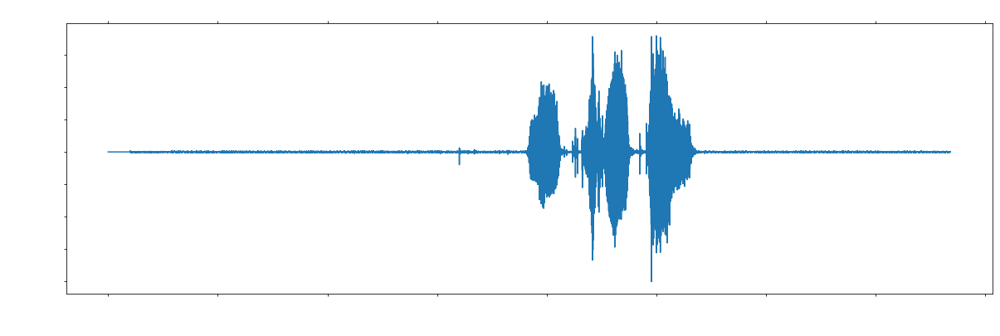

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 334080 bytes, expected 334116 bytes from header.
  sr, wav = wavfile.read(wav_loc)


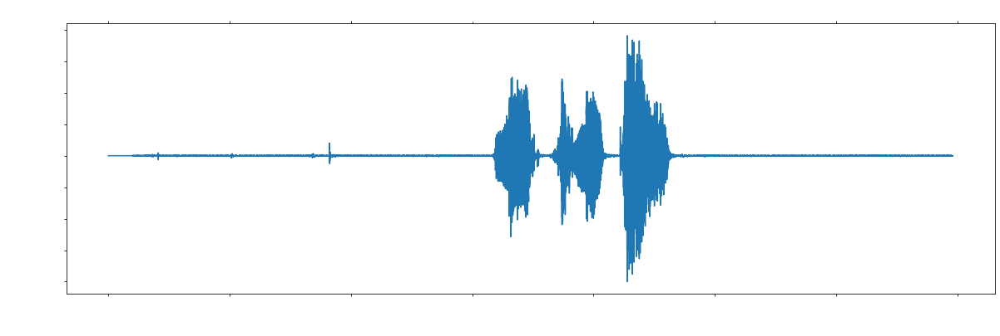

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 387840 bytes, expected 387876 bytes from header.
  sr, wav = wavfile.read(wav_loc)


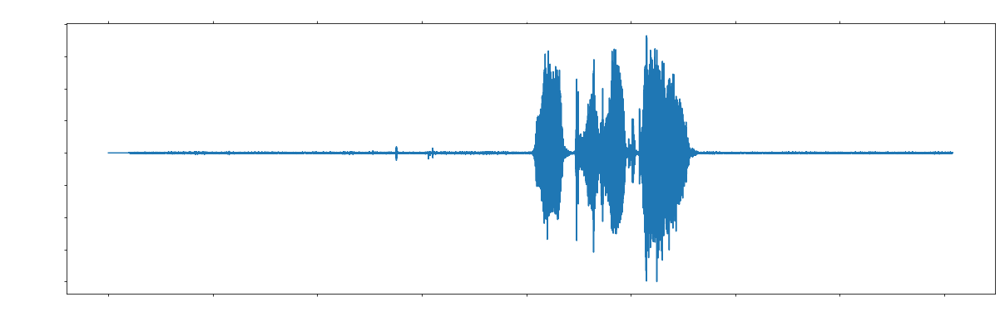

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 430080 bytes, expected 430116 bytes from header.
  sr, wav = wavfile.read(wav_loc)


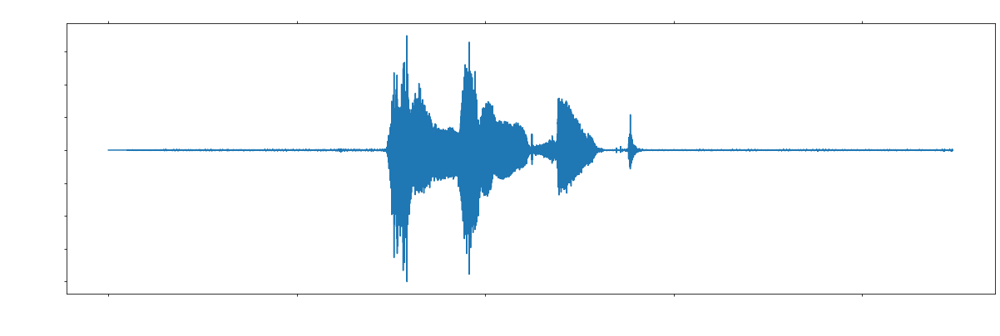

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 433920 bytes, expected 433956 bytes from header.
  sr, wav = wavfile.read(wav_loc)


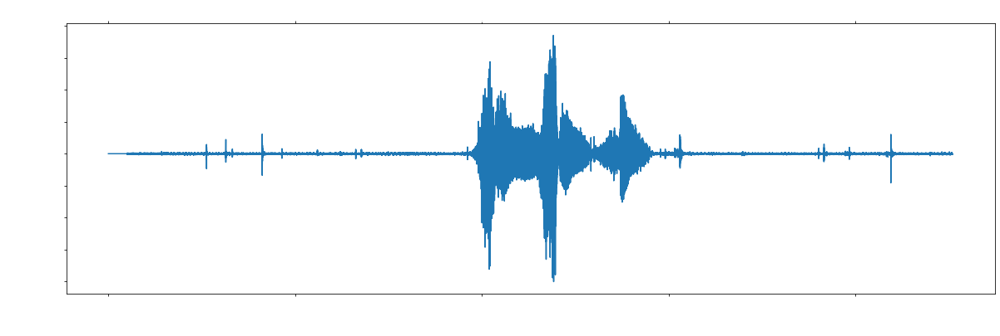

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 384000 bytes, expected 384036 bytes from header.
  sr, wav = wavfile.read(wav_loc)


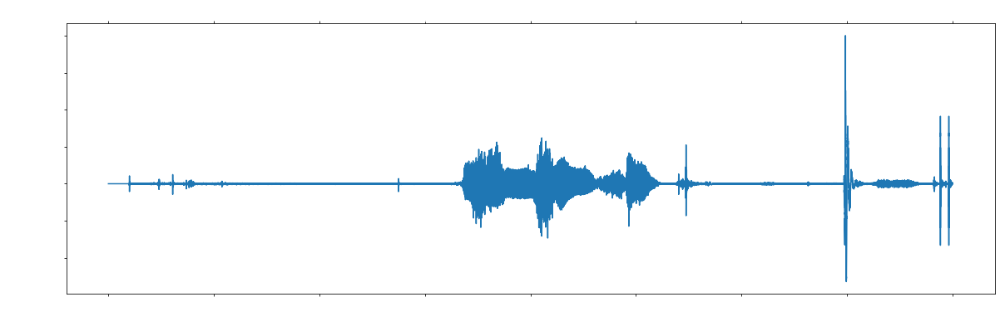

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 449280 bytes, expected 449316 bytes from header.
  sr, wav = wavfile.read(wav_loc)


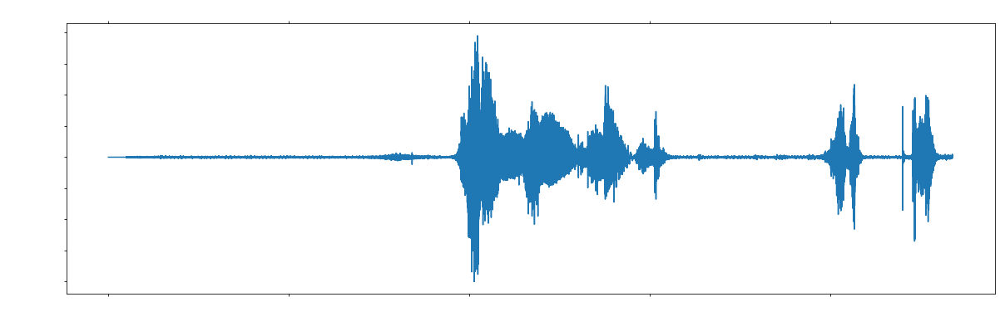

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 399360 bytes, expected 399396 bytes from header.
  sr, wav = wavfile.read(wav_loc)


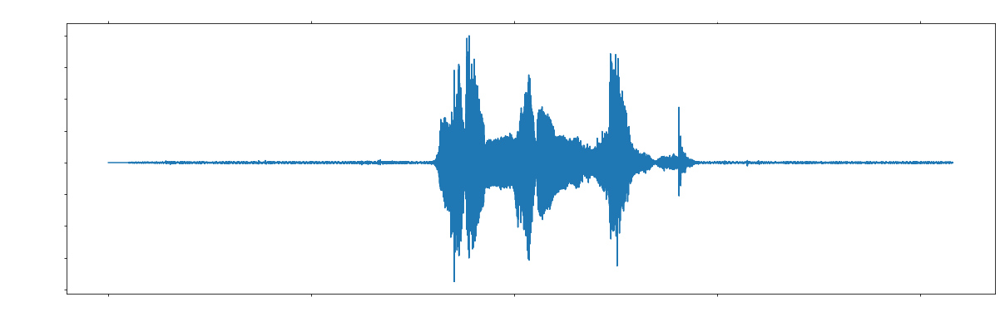

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 426240 bytes, expected 426276 bytes from header.
  sr, wav = wavfile.read(wav_loc)


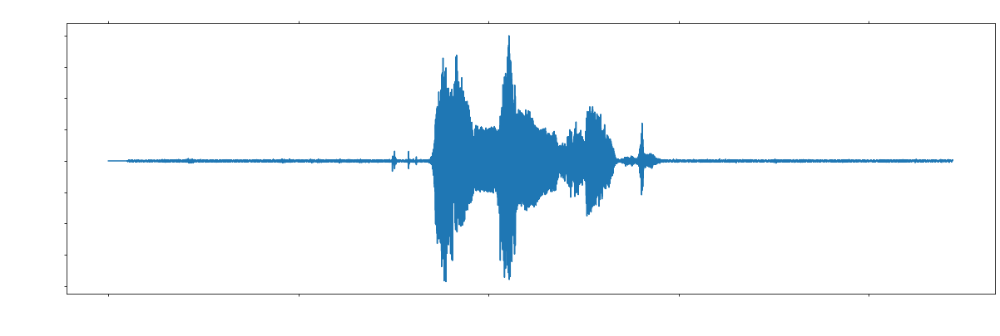

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 407040 bytes, expected 407076 bytes from header.
  sr, wav = wavfile.read(wav_loc)


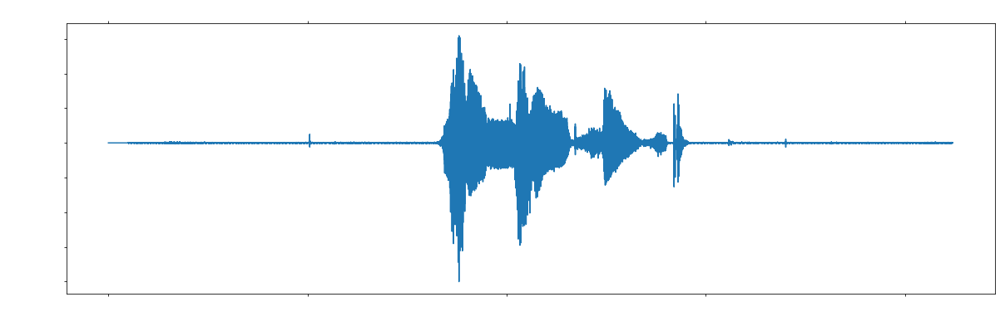

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 391680 bytes, expected 391716 bytes from header.
  sr, wav = wavfile.read(wav_loc)


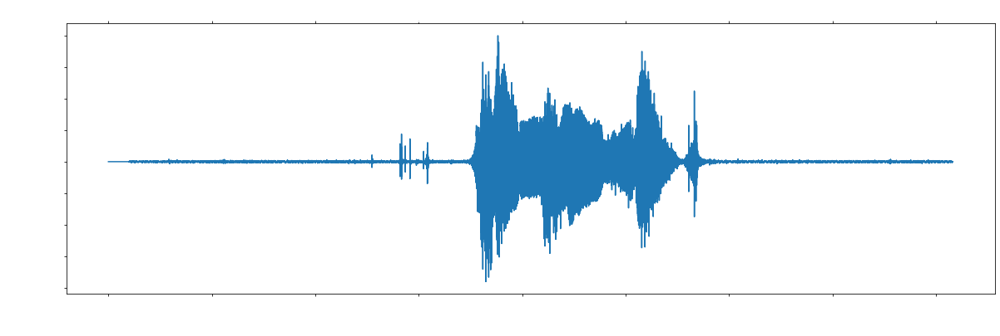

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 414720 bytes, expected 414756 bytes from header.
  sr, wav = wavfile.read(wav_loc)


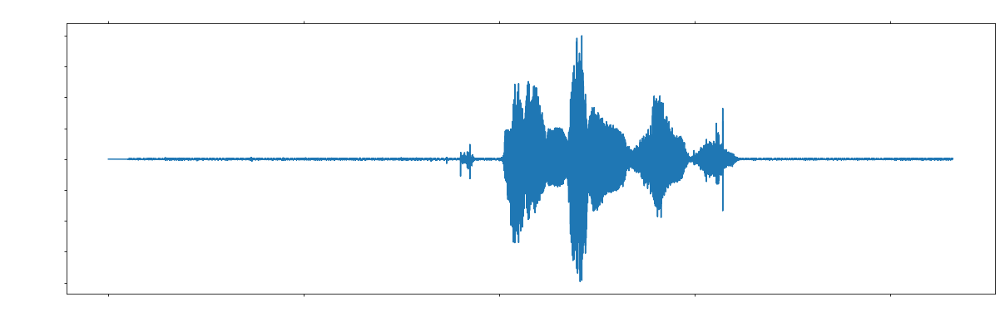

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 380160 bytes, expected 380196 bytes from header.
  sr, wav = wavfile.read(wav_loc)


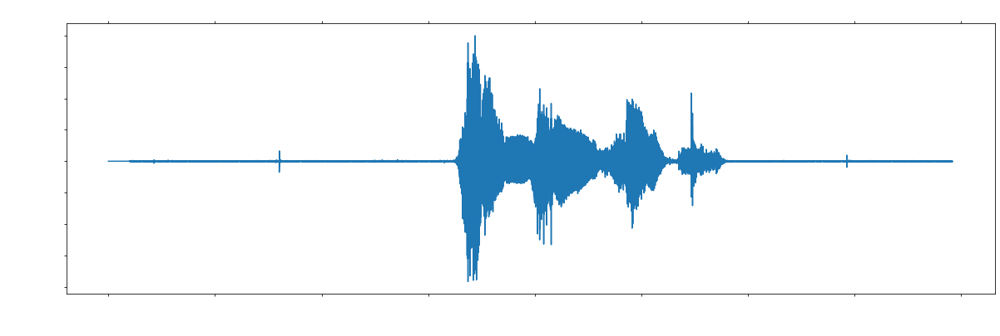

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 395520 bytes, expected 395556 bytes from header.
  sr, wav = wavfile.read(wav_loc)


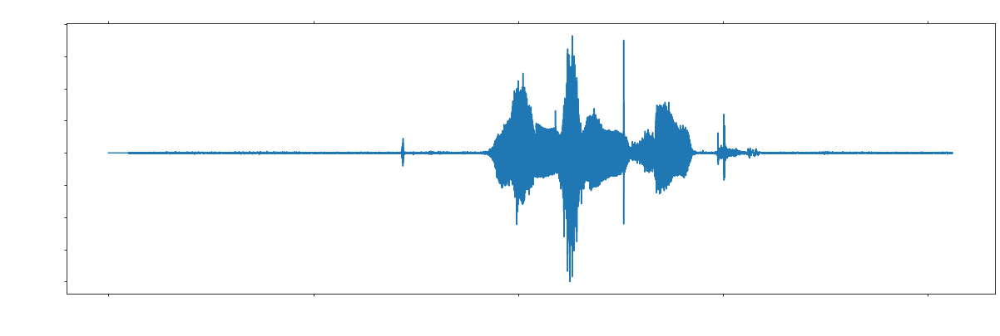

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 483840 bytes, expected 483876 bytes from header.
  sr, wav = wavfile.read(wav_loc)


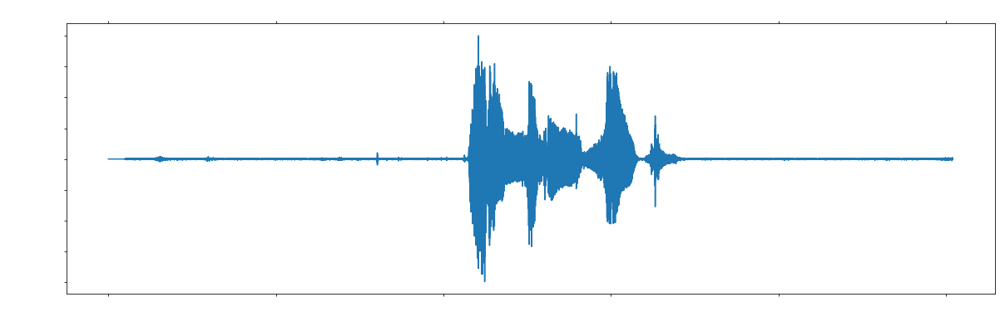

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 360960 bytes, expected 360996 bytes from header.
  sr, wav = wavfile.read(wav_loc)


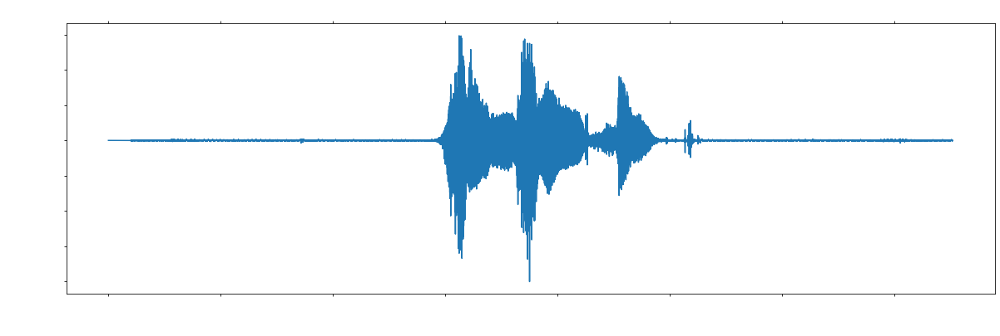

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 410880 bytes, expected 410916 bytes from header.
  sr, wav = wavfile.read(wav_loc)


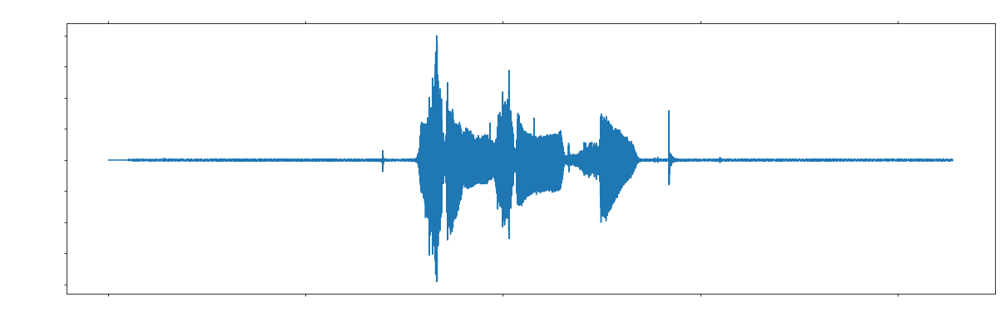

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 426240 bytes, expected 426276 bytes from header.
  sr, wav = wavfile.read(wav_loc)


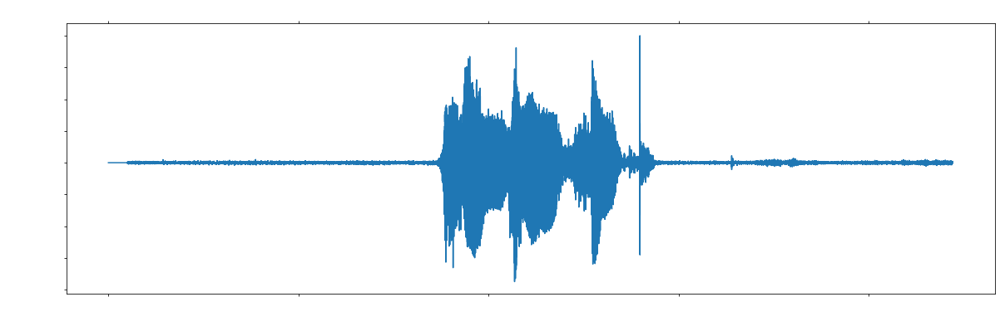

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 353280 bytes, expected 353316 bytes from header.
  sr, wav = wavfile.read(wav_loc)


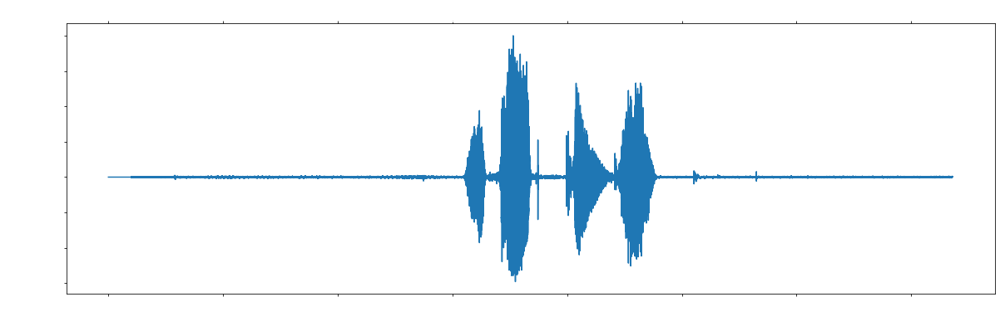

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 360960 bytes, expected 360996 bytes from header.
  sr, wav = wavfile.read(wav_loc)


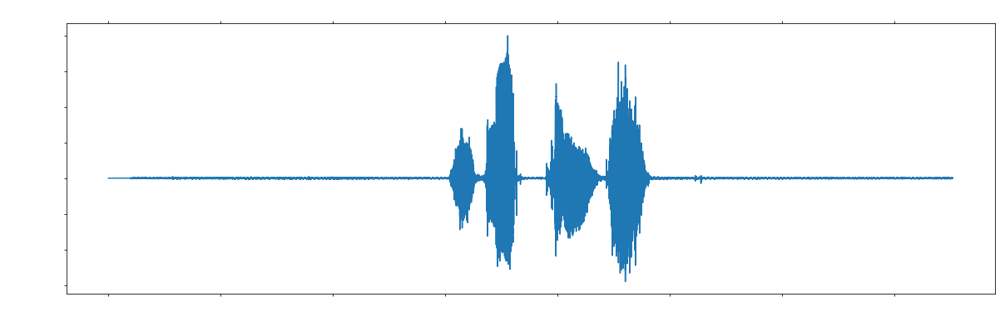

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 349440 bytes, expected 349476 bytes from header.
  sr, wav = wavfile.read(wav_loc)


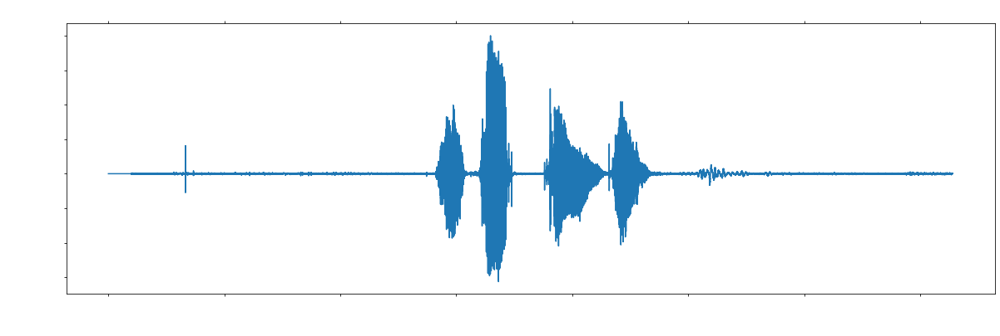

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 360960 bytes, expected 360996 bytes from header.
  sr, wav = wavfile.read(wav_loc)


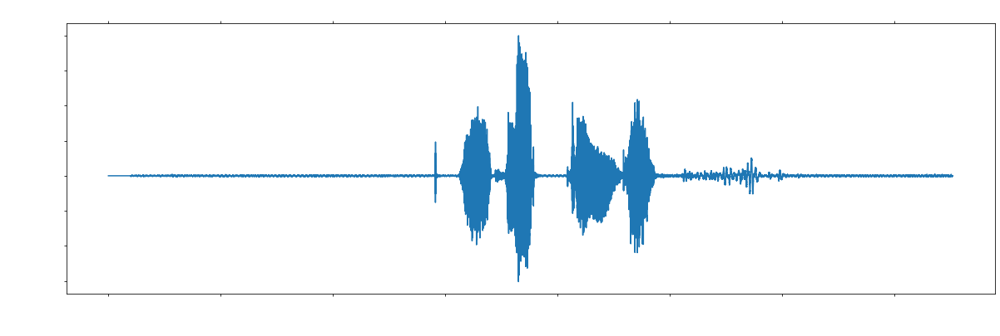

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 399360 bytes, expected 399396 bytes from header.
  sr, wav = wavfile.read(wav_loc)


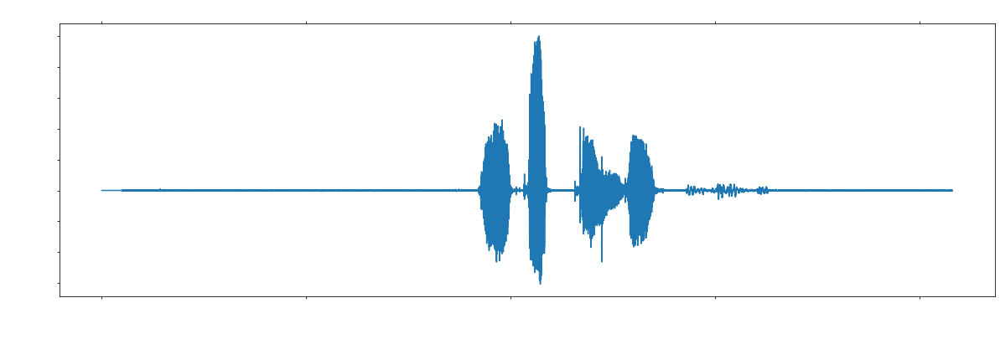

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 376320 bytes, expected 376356 bytes from header.
  sr, wav = wavfile.read(wav_loc)


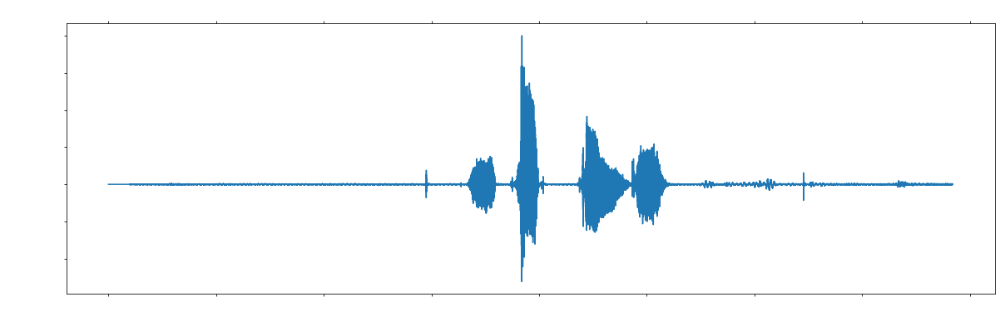

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 353280 bytes, expected 353316 bytes from header.
  sr, wav = wavfile.read(wav_loc)


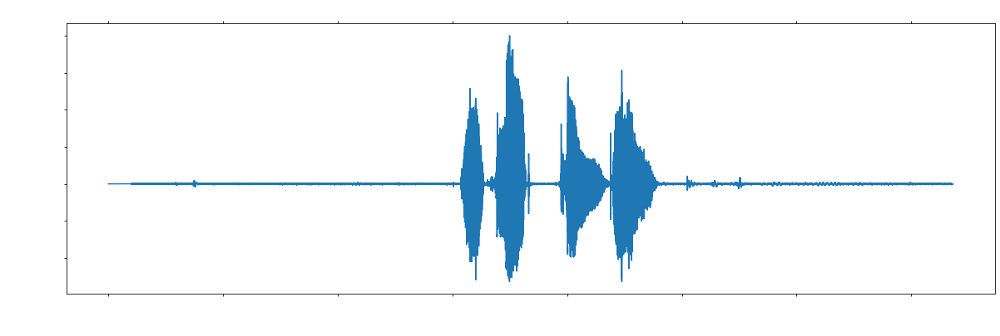

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 353280 bytes, expected 353316 bytes from header.
  sr, wav = wavfile.read(wav_loc)


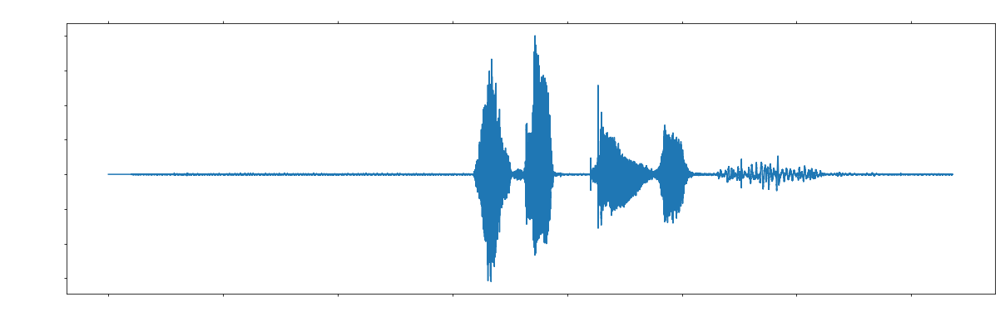

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 360960 bytes, expected 360996 bytes from header.
  sr, wav = wavfile.read(wav_loc)


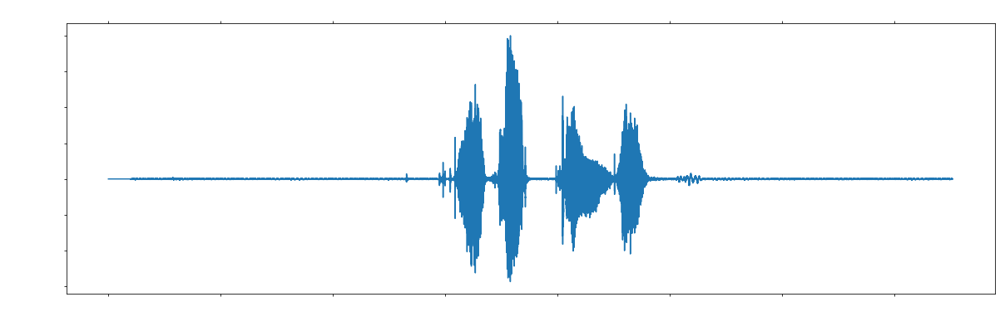

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 384000 bytes, expected 384036 bytes from header.
  sr, wav = wavfile.read(wav_loc)


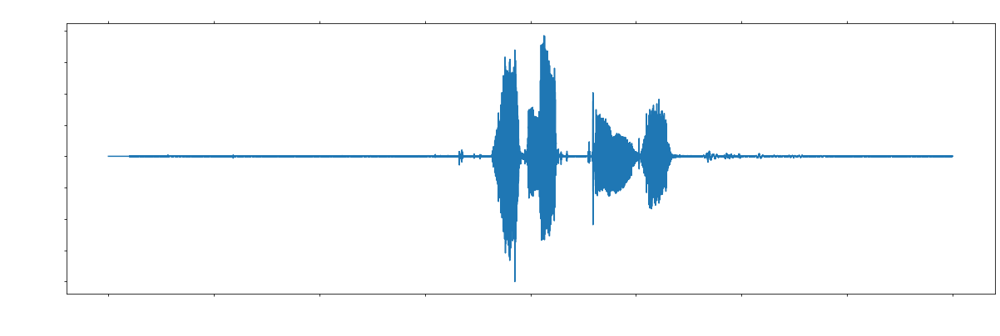

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 357120 bytes, expected 357156 bytes from header.
  sr, wav = wavfile.read(wav_loc)


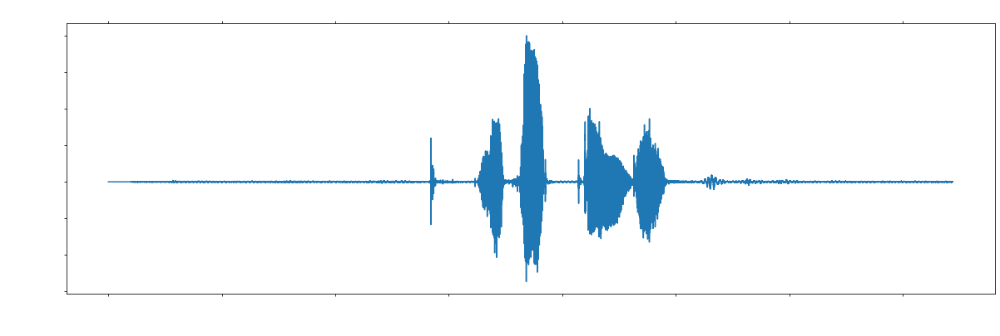

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 337920 bytes, expected 337956 bytes from header.
  sr, wav = wavfile.read(wav_loc)


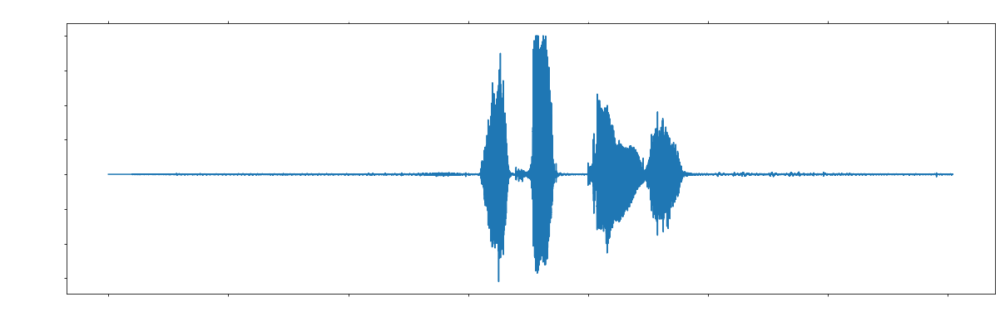

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 341760 bytes, expected 341796 bytes from header.
  sr, wav = wavfile.read(wav_loc)


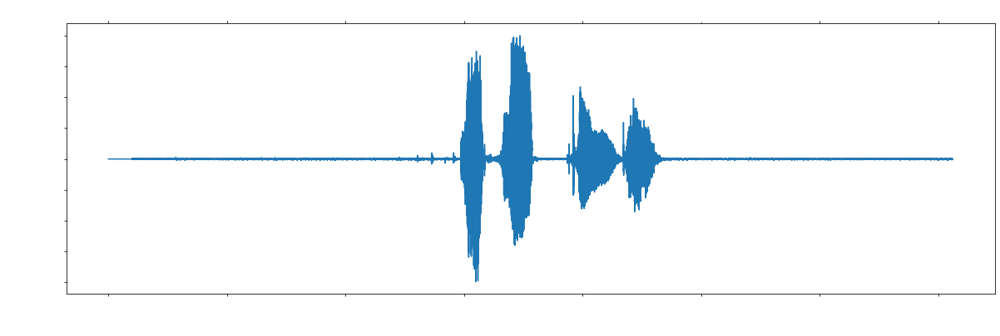

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 395520 bytes, expected 395556 bytes from header.
  sr, wav = wavfile.read(wav_loc)


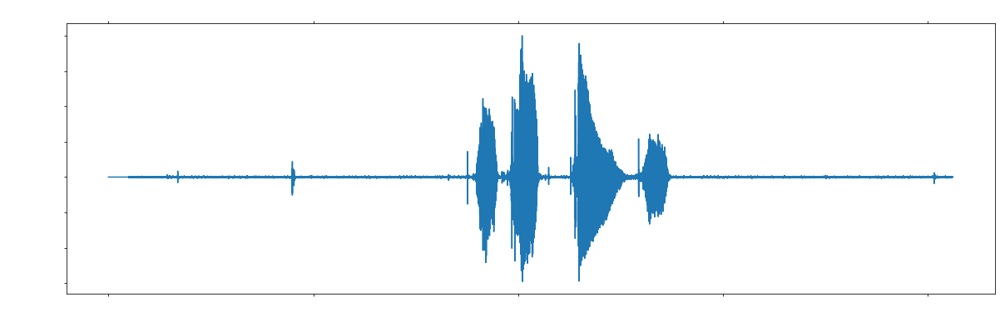

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 384000 bytes, expected 384036 bytes from header.
  sr, wav = wavfile.read(wav_loc)


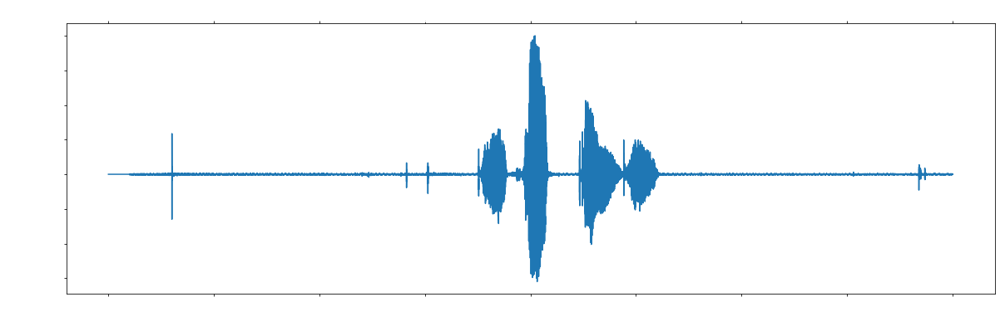

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 353280 bytes, expected 353316 bytes from header.
  sr, wav = wavfile.read(wav_loc)


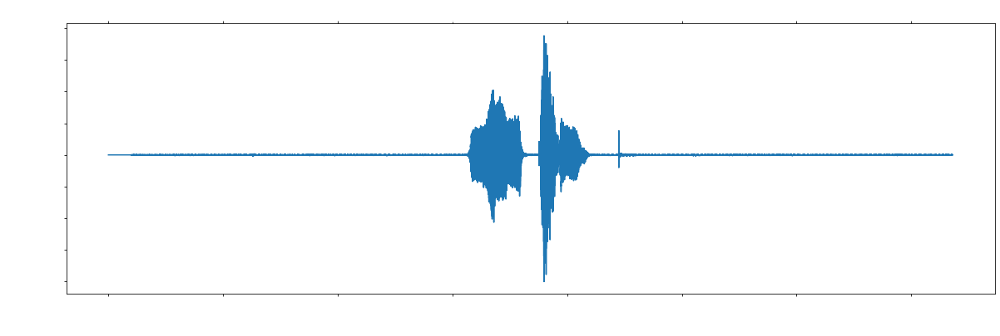

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 368640 bytes, expected 368676 bytes from header.
  sr, wav = wavfile.read(wav_loc)


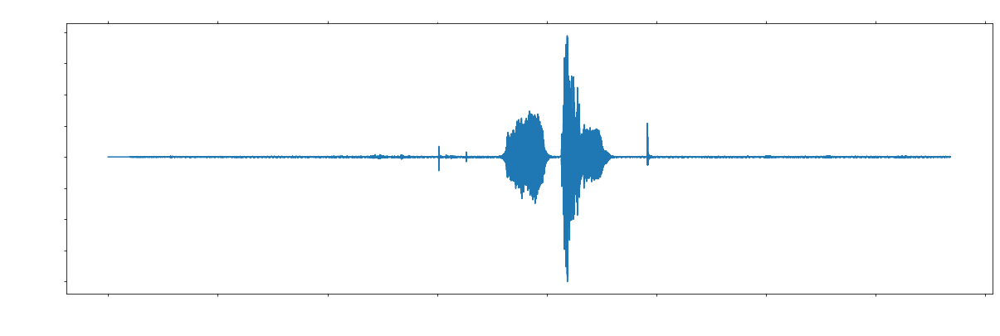

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 337920 bytes, expected 337956 bytes from header.
  sr, wav = wavfile.read(wav_loc)


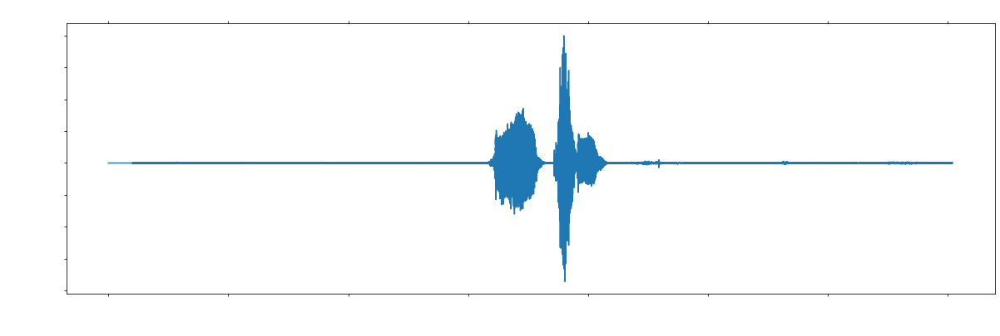

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 353280 bytes, expected 353316 bytes from header.
  sr, wav = wavfile.read(wav_loc)


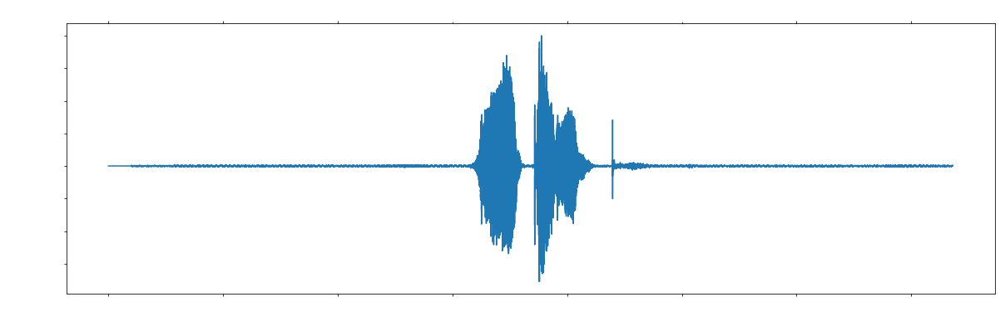

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 353280 bytes, expected 353316 bytes from header.
  sr, wav = wavfile.read(wav_loc)


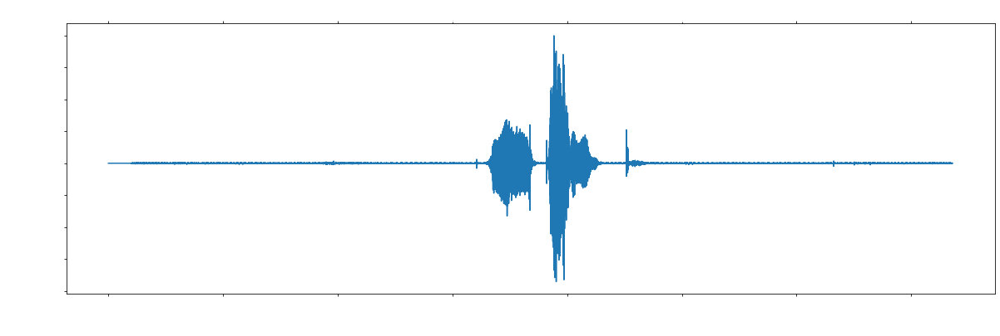

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 349440 bytes, expected 349476 bytes from header.
  sr, wav = wavfile.read(wav_loc)


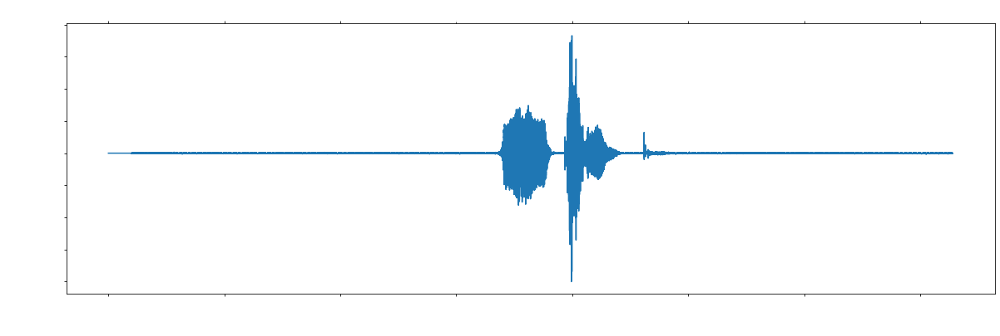

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 353280 bytes, expected 353316 bytes from header.
  sr, wav = wavfile.read(wav_loc)


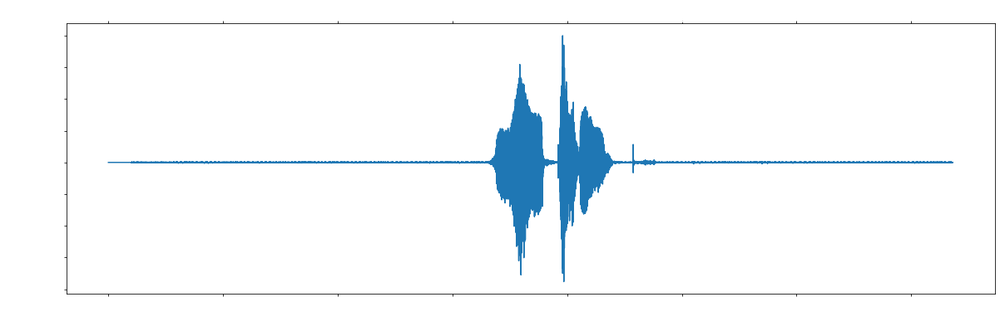

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 334080 bytes, expected 334116 bytes from header.
  sr, wav = wavfile.read(wav_loc)


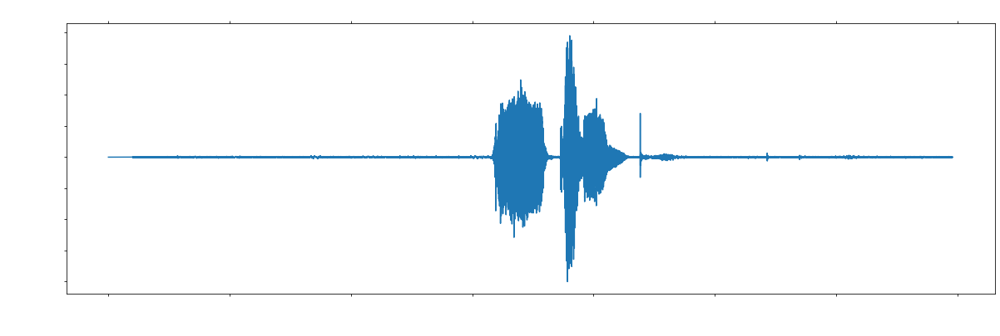

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 353280 bytes, expected 353316 bytes from header.
  sr, wav = wavfile.read(wav_loc)


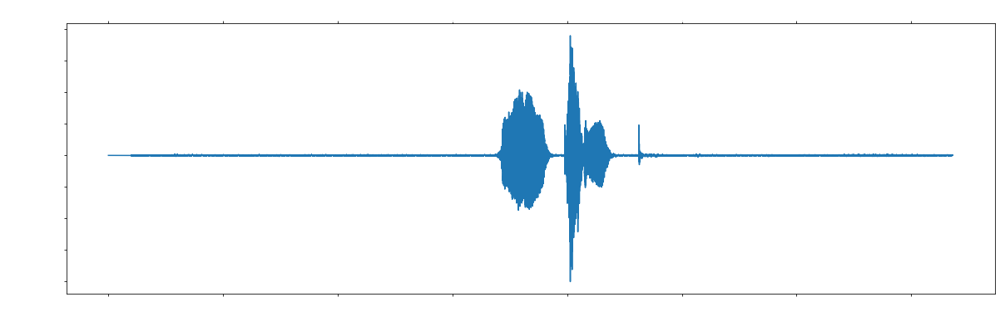

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 380160 bytes, expected 380196 bytes from header.
  sr, wav = wavfile.read(wav_loc)


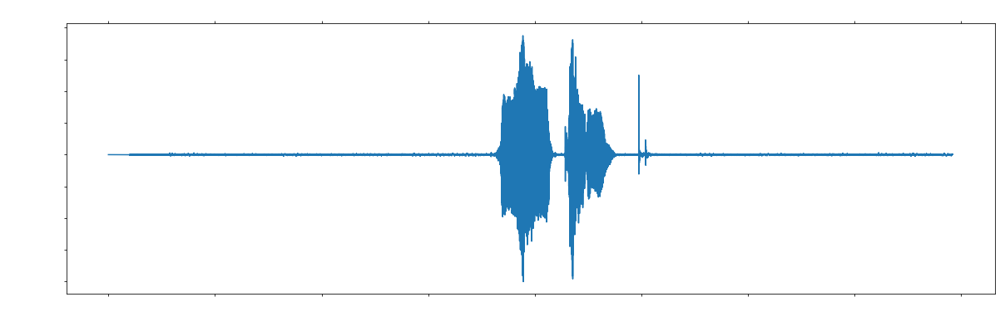

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 384000 bytes, expected 384036 bytes from header.
  sr, wav = wavfile.read(wav_loc)


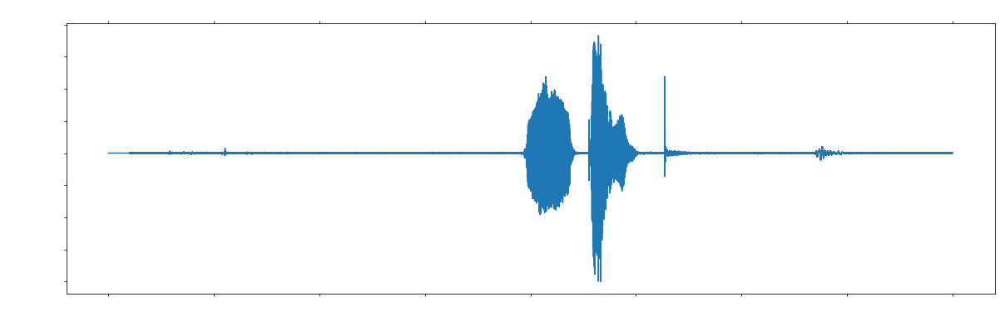

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 341760 bytes, expected 341796 bytes from header.
  sr, wav = wavfile.read(wav_loc)


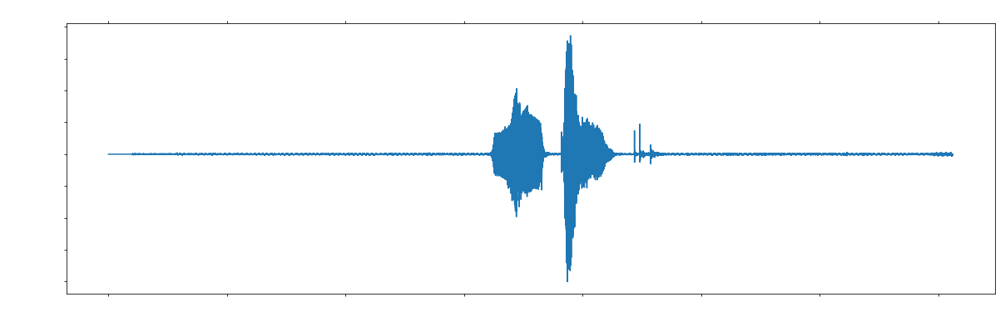

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 349440 bytes, expected 349476 bytes from header.
  sr, wav = wavfile.read(wav_loc)


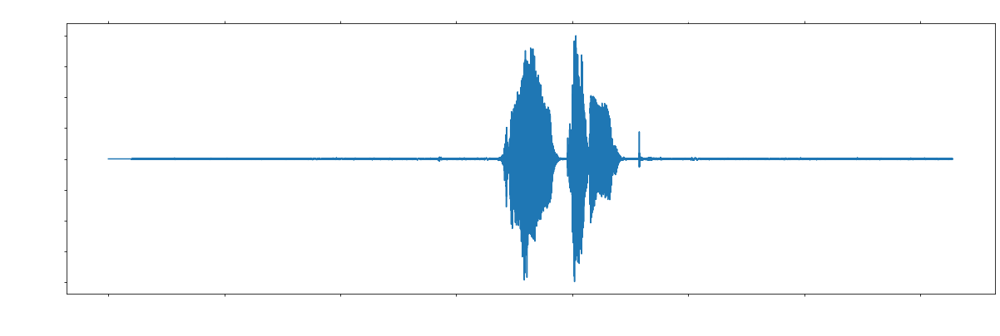

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 349440 bytes, expected 349476 bytes from header.
  sr, wav = wavfile.read(wav_loc)


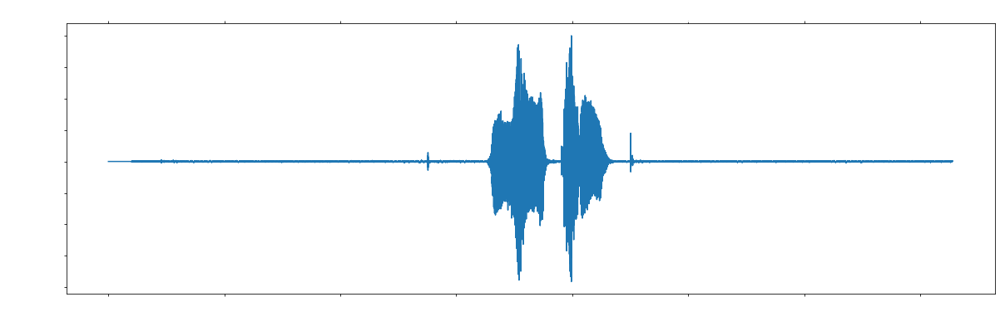

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 376320 bytes, expected 376356 bytes from header.
  sr, wav = wavfile.read(wav_loc)


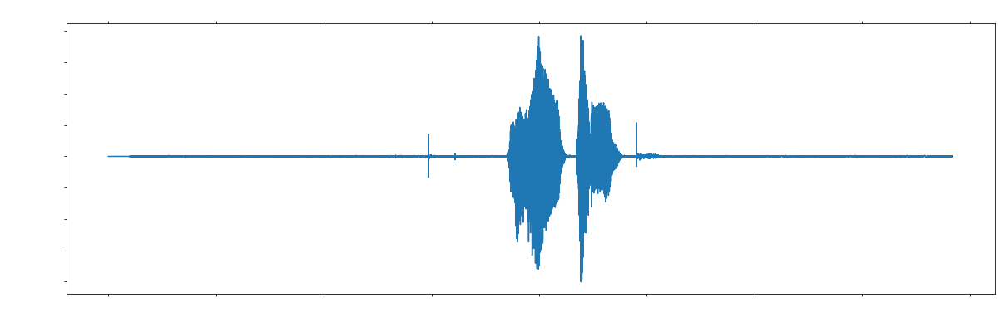

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 295680 bytes, expected 295716 bytes from header.
  sr, wav = wavfile.read(wav_loc)


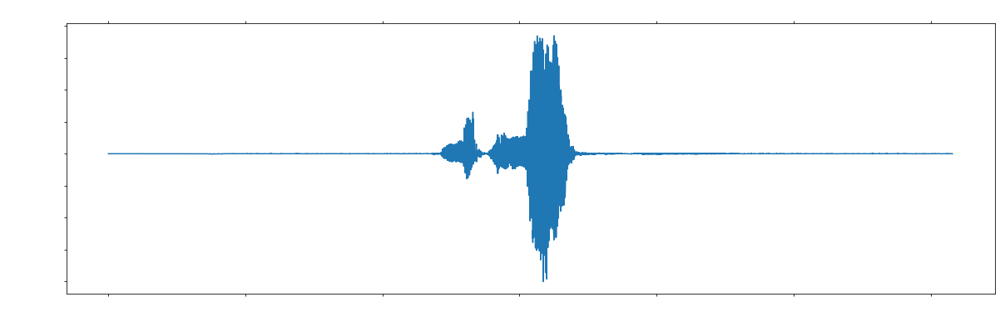

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 322560 bytes, expected 322596 bytes from header.
  sr, wav = wavfile.read(wav_loc)


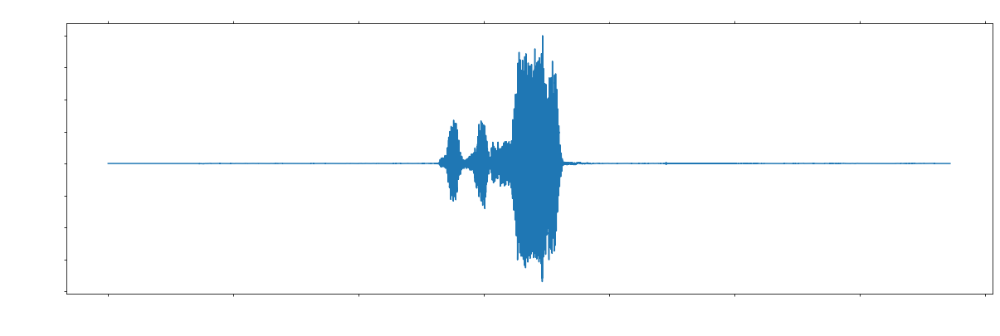

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 314880 bytes, expected 314916 bytes from header.
  sr, wav = wavfile.read(wav_loc)


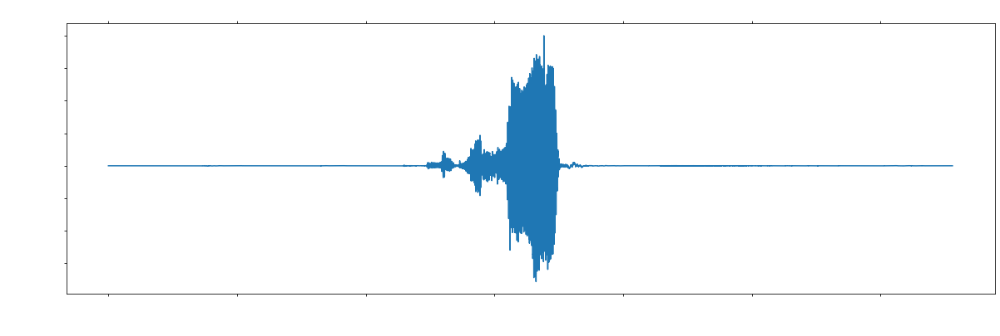

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 330240 bytes, expected 330276 bytes from header.
  sr, wav = wavfile.read(wav_loc)


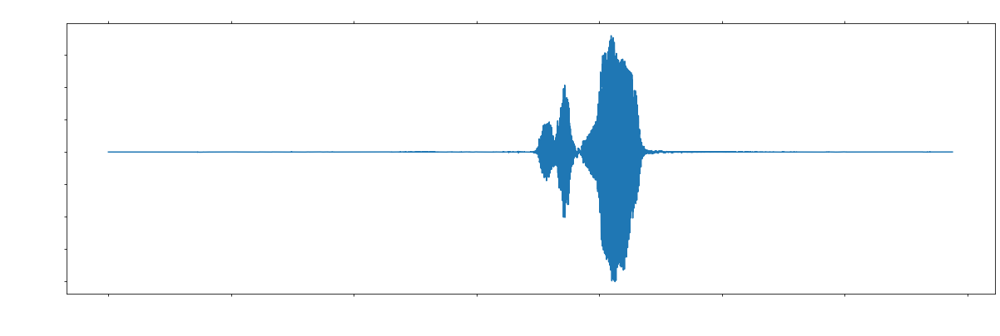

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 284160 bytes, expected 284196 bytes from header.
  sr, wav = wavfile.read(wav_loc)


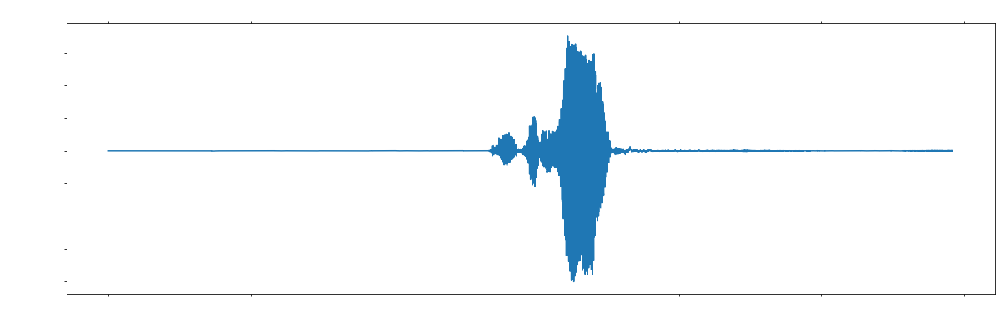

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 334080 bytes, expected 334116 bytes from header.
  sr, wav = wavfile.read(wav_loc)


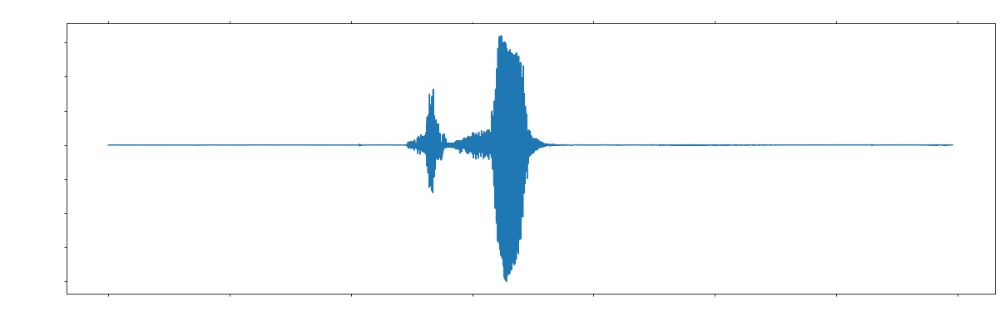

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 280320 bytes, expected 280356 bytes from header.
  sr, wav = wavfile.read(wav_loc)


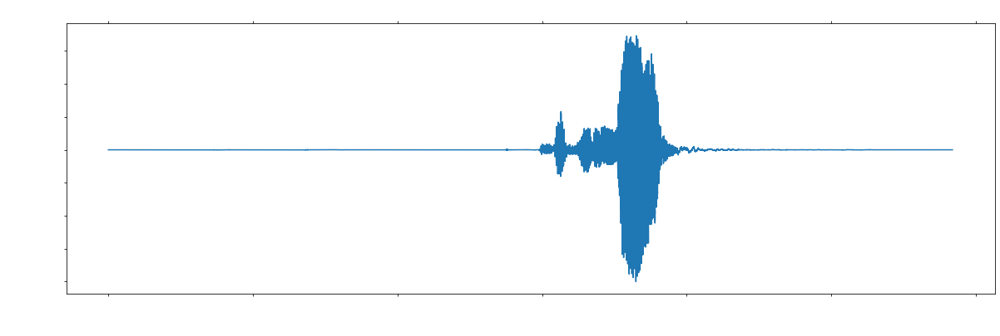

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 326400 bytes, expected 326436 bytes from header.
  sr, wav = wavfile.read(wav_loc)


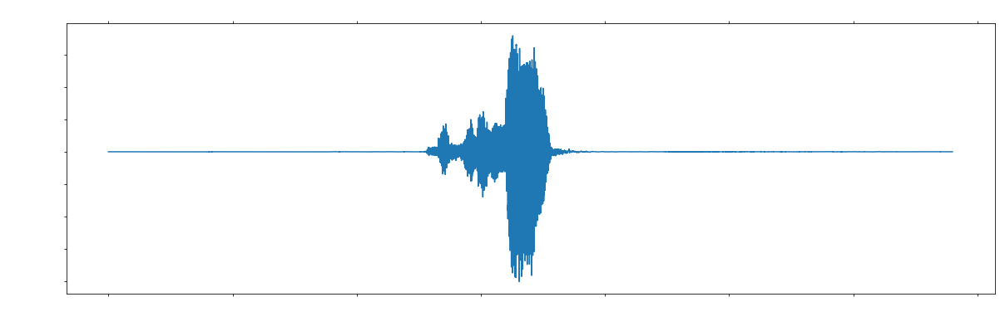

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 326400 bytes, expected 326436 bytes from header.
  sr, wav = wavfile.read(wav_loc)


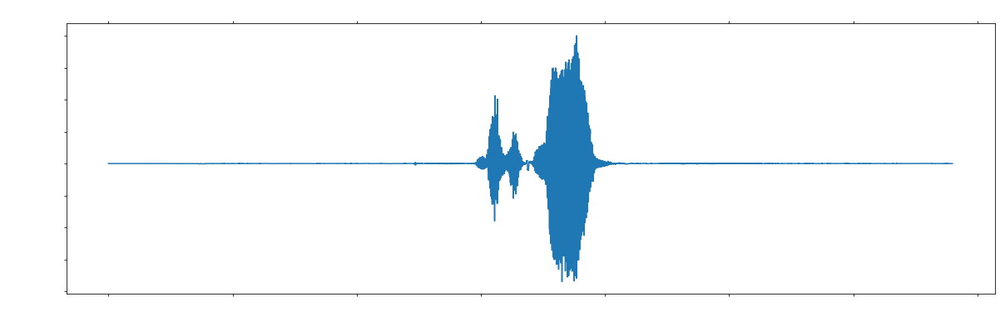

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 326400 bytes, expected 326436 bytes from header.
  sr, wav = wavfile.read(wav_loc)


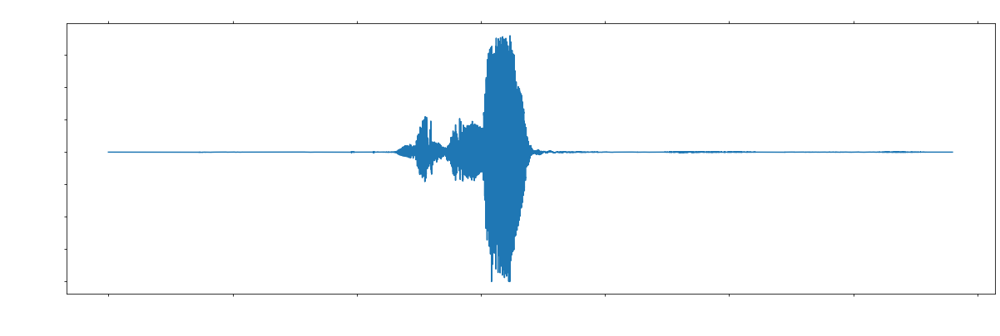

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 303360 bytes, expected 303396 bytes from header.
  sr, wav = wavfile.read(wav_loc)


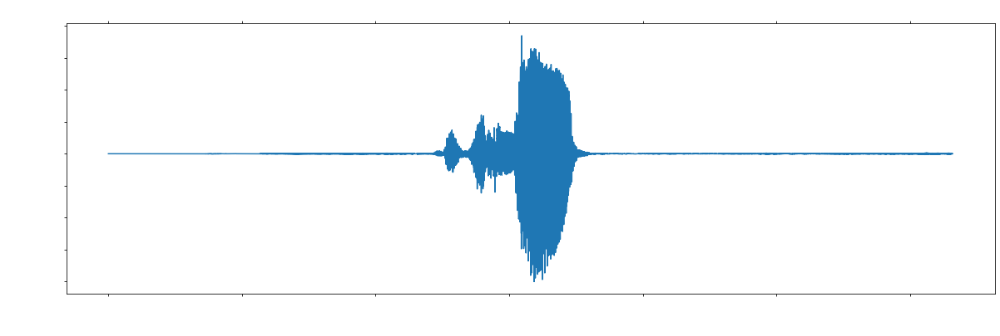

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 311040 bytes, expected 311076 bytes from header.
  sr, wav = wavfile.read(wav_loc)


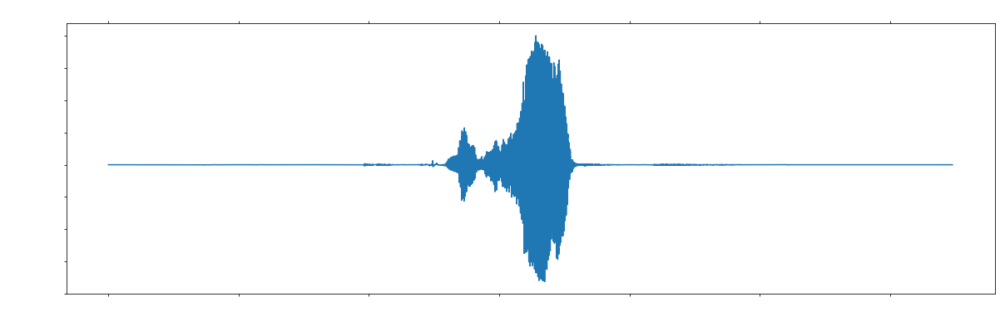

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 330240 bytes, expected 330276 bytes from header.
  sr, wav = wavfile.read(wav_loc)


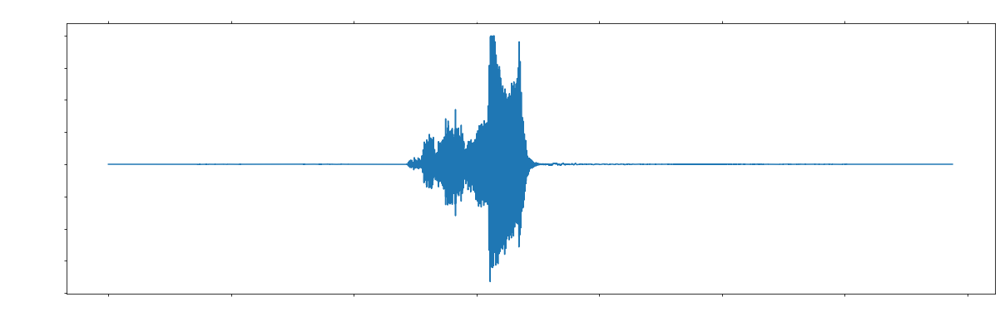

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 357120 bytes, expected 357156 bytes from header.
  sr, wav = wavfile.read(wav_loc)


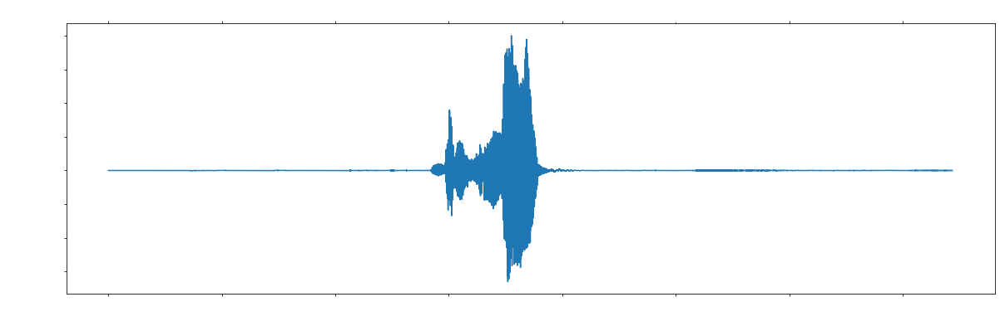

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 326400 bytes, expected 326436 bytes from header.
  sr, wav = wavfile.read(wav_loc)


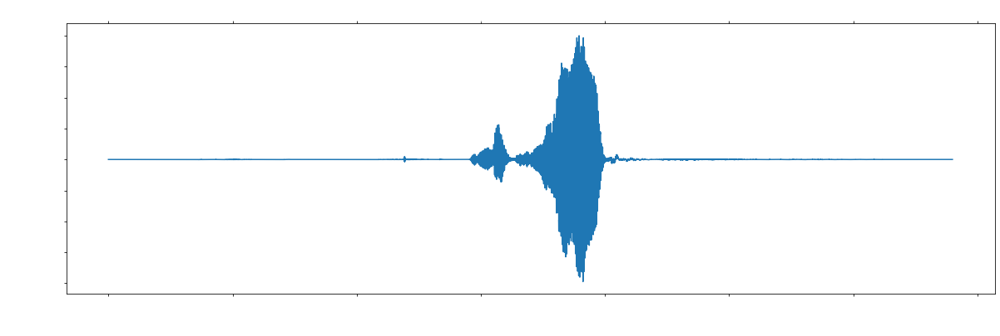

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 360960 bytes, expected 360996 bytes from header.
  sr, wav = wavfile.read(wav_loc)


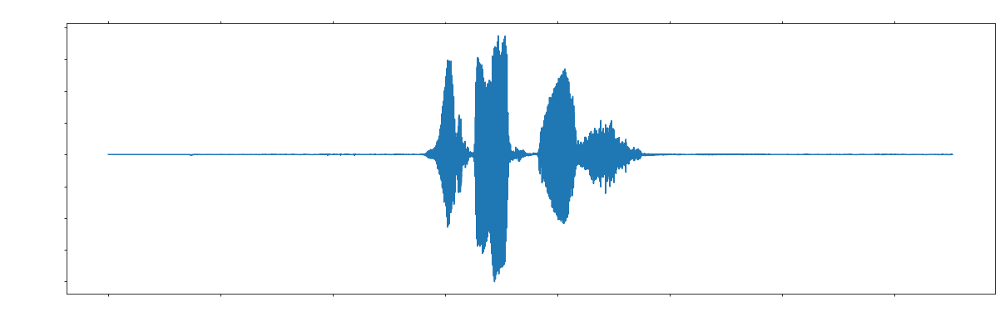

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 326400 bytes, expected 326436 bytes from header.
  sr, wav = wavfile.read(wav_loc)


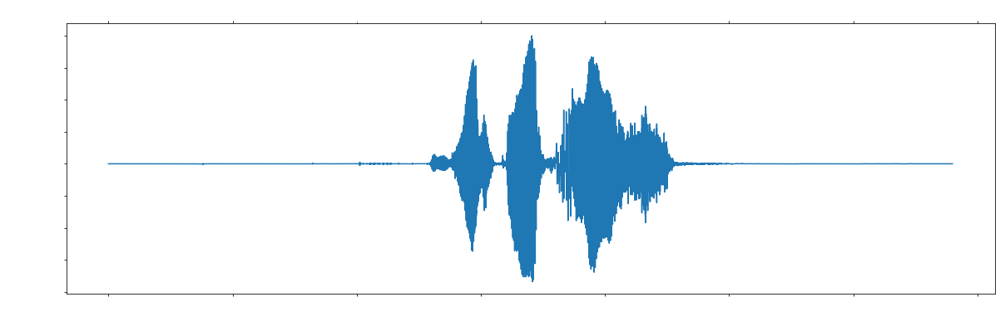

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 330240 bytes, expected 330276 bytes from header.
  sr, wav = wavfile.read(wav_loc)


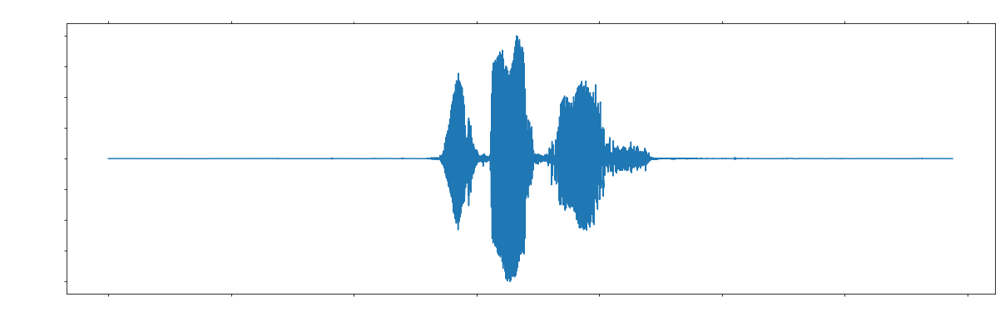

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 345600 bytes, expected 345636 bytes from header.
  sr, wav = wavfile.read(wav_loc)


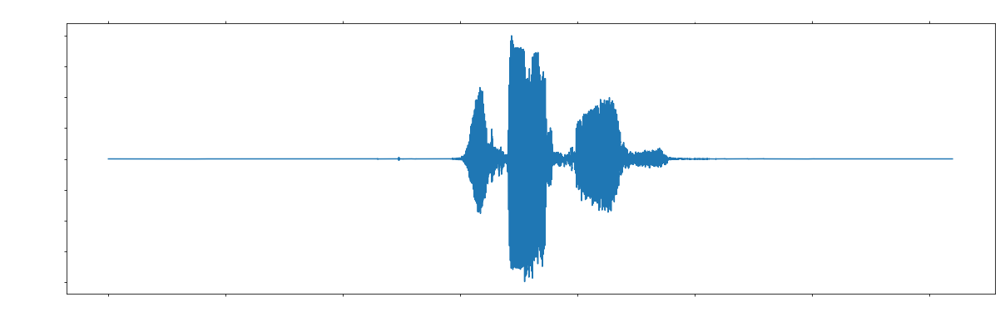

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 330240 bytes, expected 330276 bytes from header.
  sr, wav = wavfile.read(wav_loc)


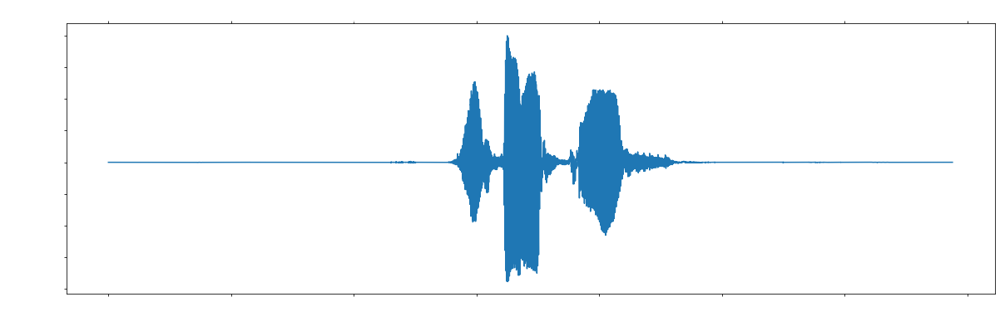

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 364800 bytes, expected 364836 bytes from header.
  sr, wav = wavfile.read(wav_loc)


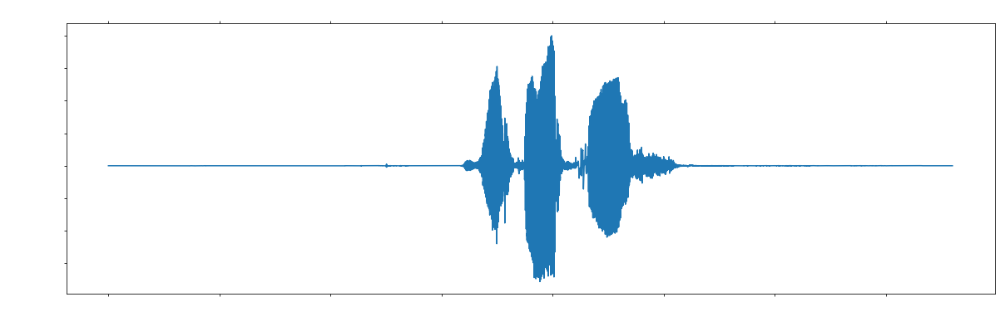

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 349440 bytes, expected 349476 bytes from header.
  sr, wav = wavfile.read(wav_loc)


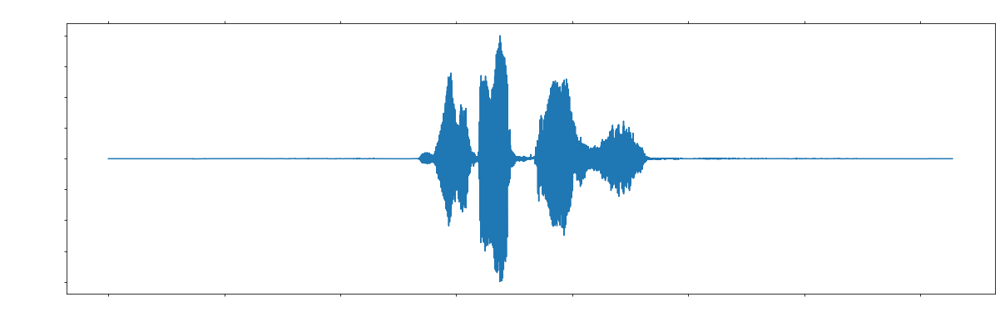

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 349440 bytes, expected 349476 bytes from header.
  sr, wav = wavfile.read(wav_loc)


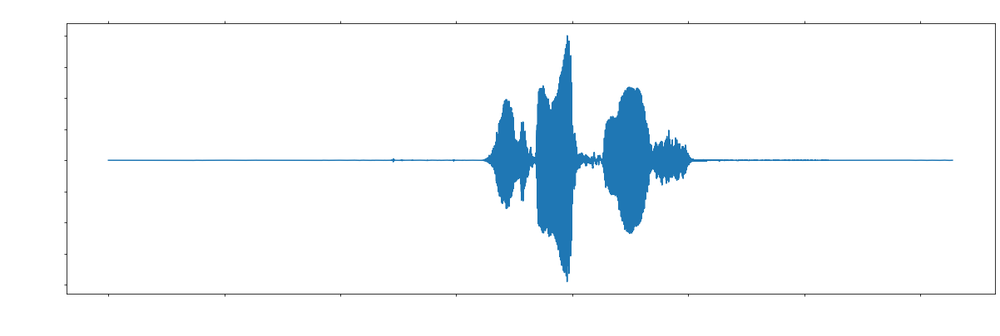

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 368640 bytes, expected 368676 bytes from header.
  sr, wav = wavfile.read(wav_loc)


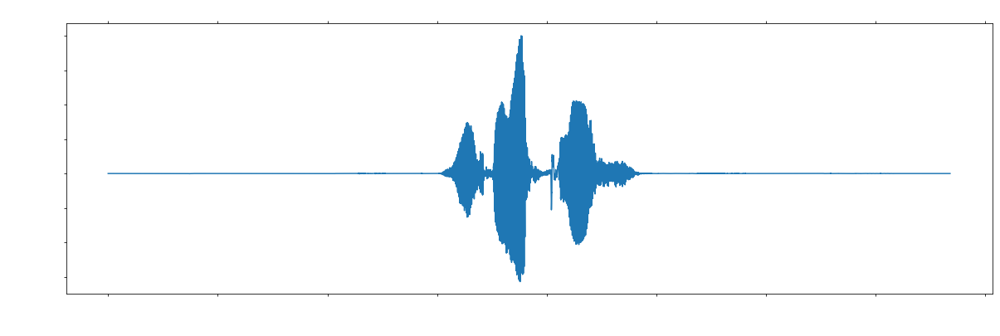

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 364800 bytes, expected 364836 bytes from header.
  sr, wav = wavfile.read(wav_loc)


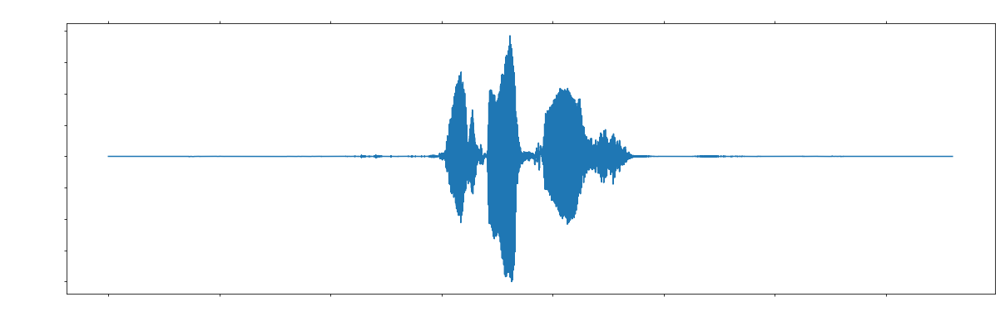

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 349440 bytes, expected 349476 bytes from header.
  sr, wav = wavfile.read(wav_loc)


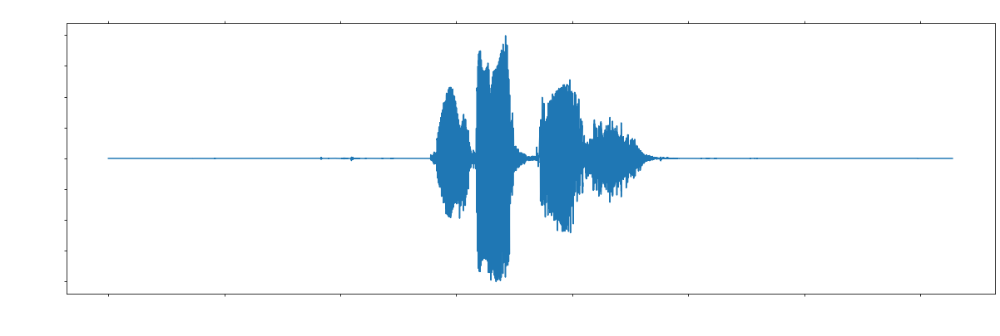

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 357120 bytes, expected 357156 bytes from header.
  sr, wav = wavfile.read(wav_loc)


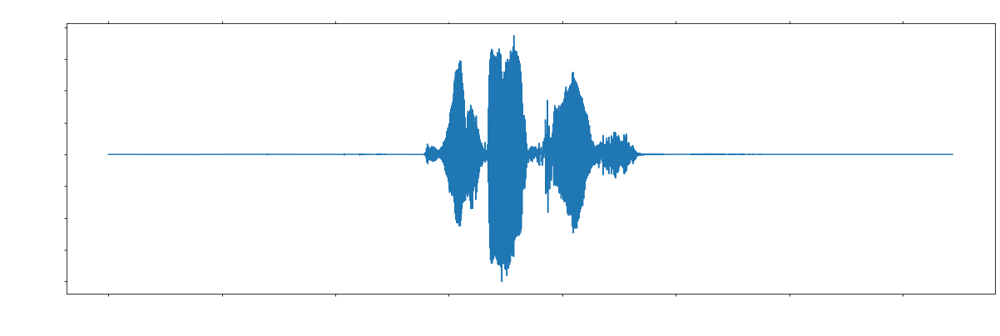

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 341760 bytes, expected 341796 bytes from header.
  sr, wav = wavfile.read(wav_loc)


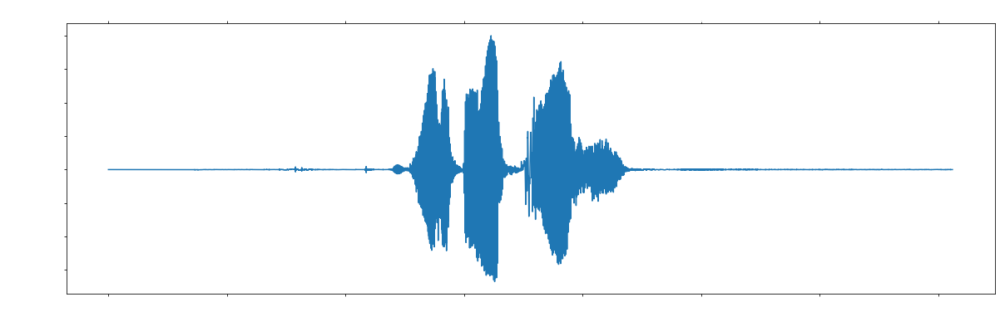

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 353280 bytes, expected 353316 bytes from header.
  sr, wav = wavfile.read(wav_loc)


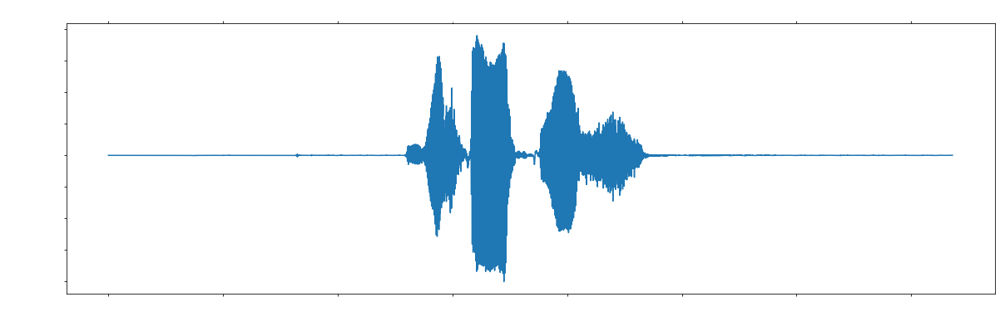

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 345600 bytes, expected 345636 bytes from header.
  sr, wav = wavfile.read(wav_loc)


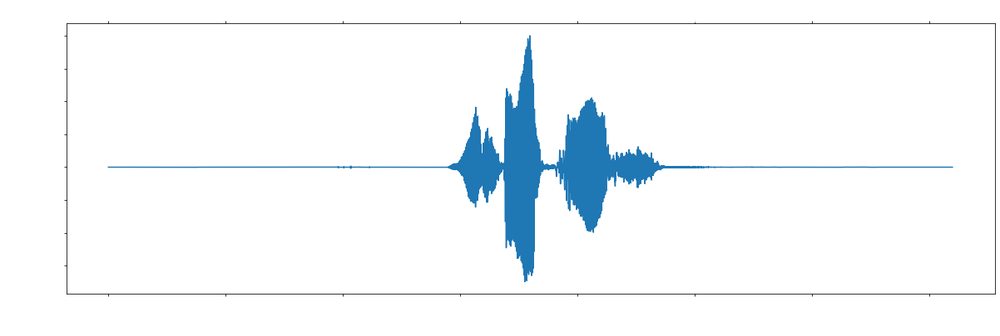

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 314880 bytes, expected 314916 bytes from header.
  sr, wav = wavfile.read(wav_loc)


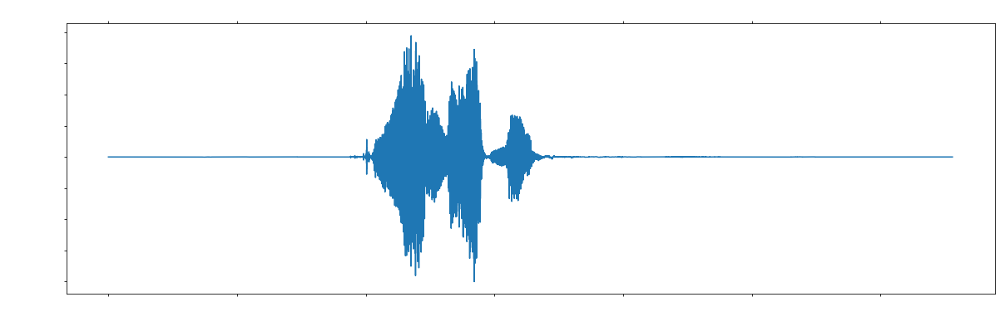

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 295680 bytes, expected 295716 bytes from header.
  sr, wav = wavfile.read(wav_loc)


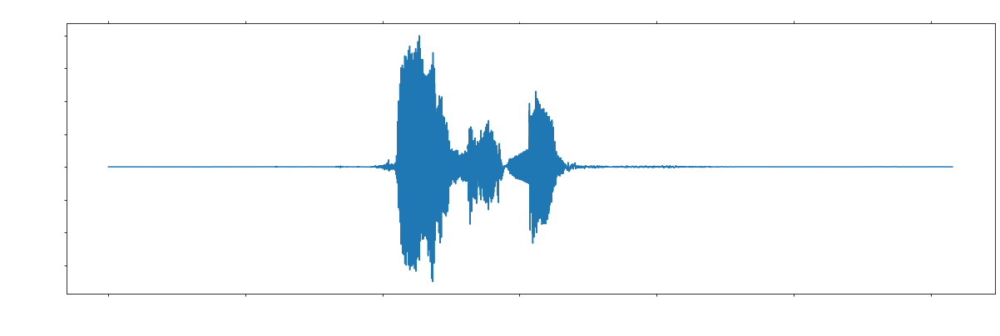

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 330240 bytes, expected 330276 bytes from header.
  sr, wav = wavfile.read(wav_loc)


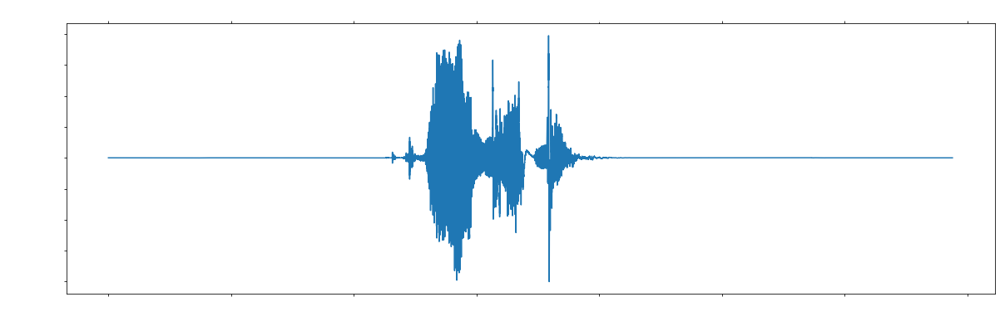

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 334080 bytes, expected 334116 bytes from header.
  sr, wav = wavfile.read(wav_loc)


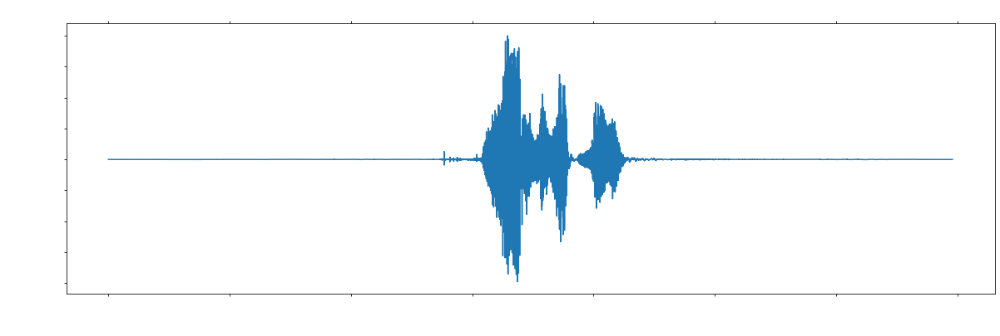

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 349440 bytes, expected 349476 bytes from header.
  sr, wav = wavfile.read(wav_loc)


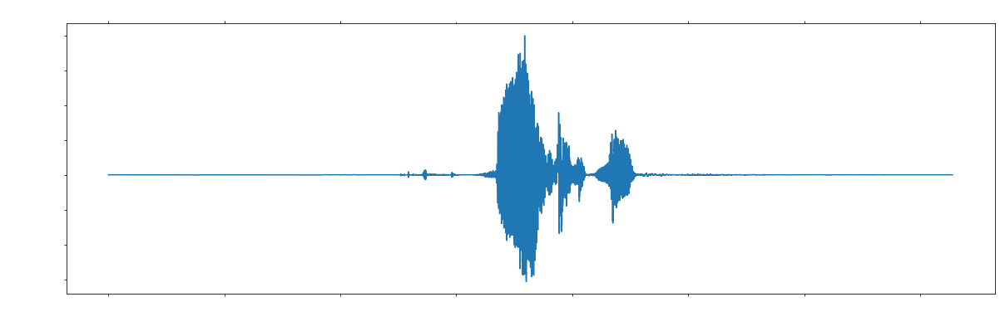

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 326400 bytes, expected 326436 bytes from header.
  sr, wav = wavfile.read(wav_loc)


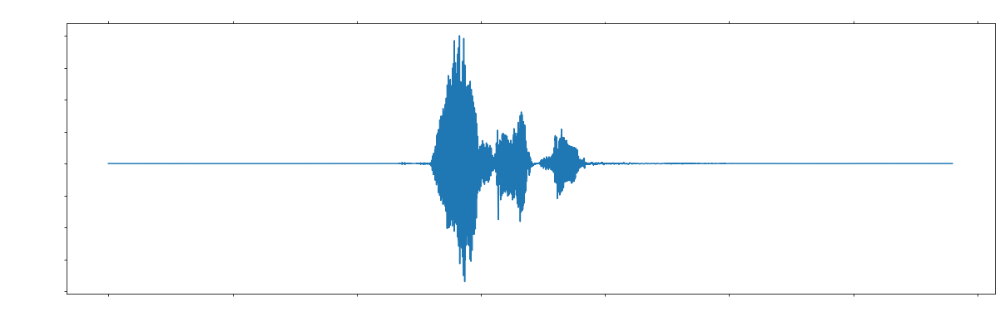

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 368640 bytes, expected 368676 bytes from header.
  sr, wav = wavfile.read(wav_loc)


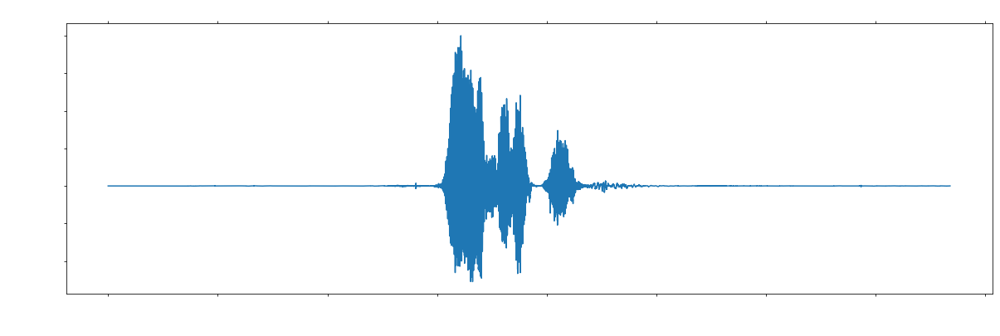

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 330240 bytes, expected 330276 bytes from header.
  sr, wav = wavfile.read(wav_loc)


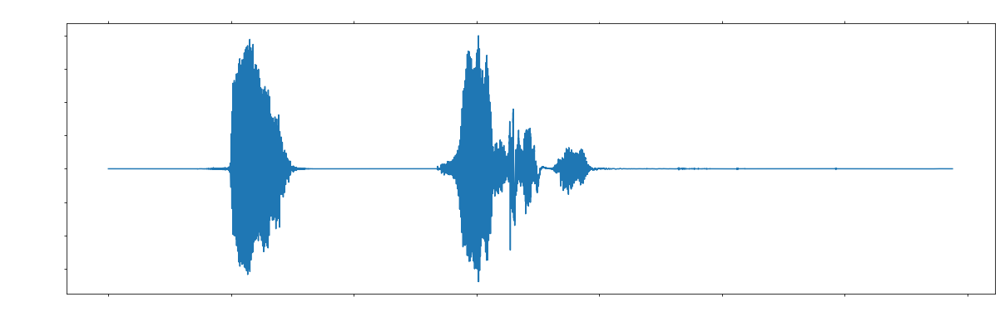

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 314880 bytes, expected 314916 bytes from header.
  sr, wav = wavfile.read(wav_loc)


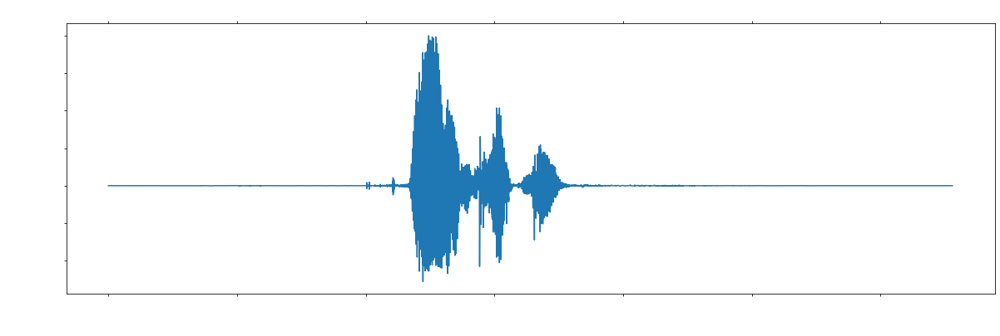

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 337920 bytes, expected 337956 bytes from header.
  sr, wav = wavfile.read(wav_loc)


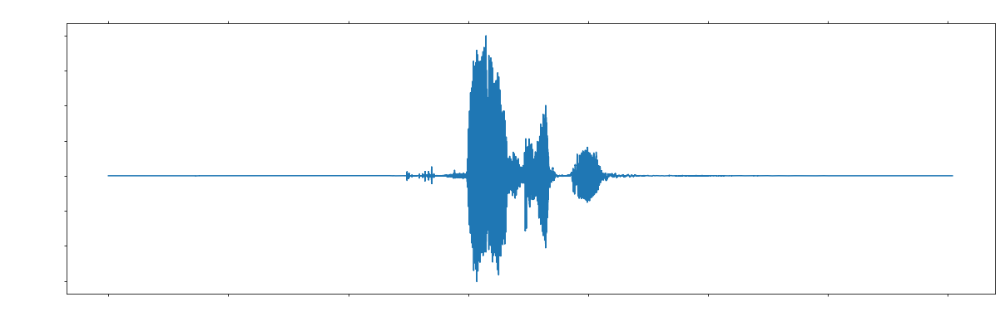

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 326400 bytes, expected 326436 bytes from header.
  sr, wav = wavfile.read(wav_loc)


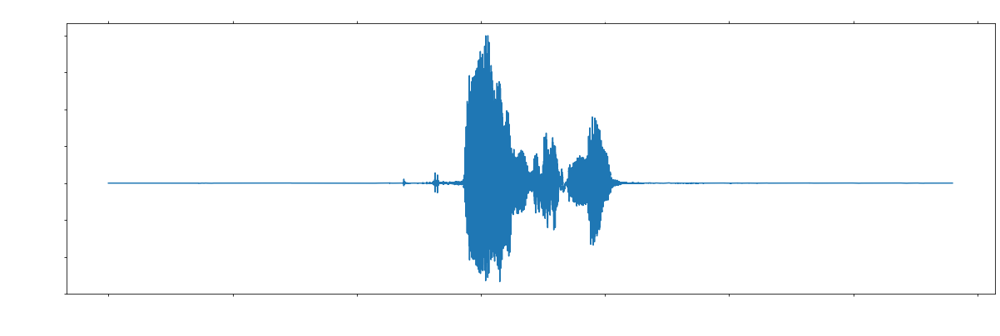

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 314880 bytes, expected 314916 bytes from header.
  sr, wav = wavfile.read(wav_loc)


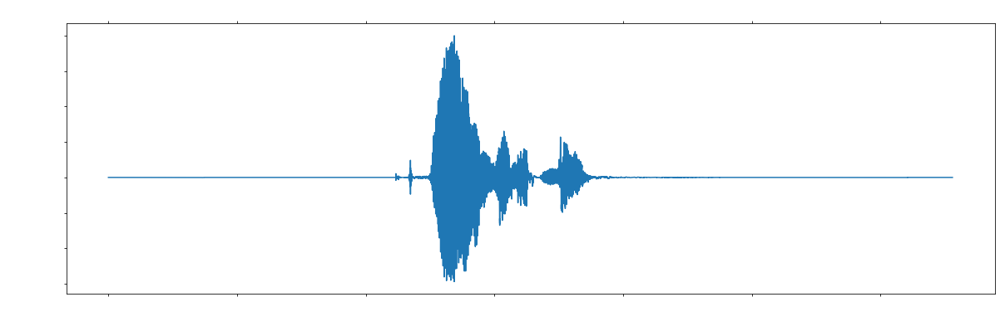

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 334080 bytes, expected 334116 bytes from header.
  sr, wav = wavfile.read(wav_loc)


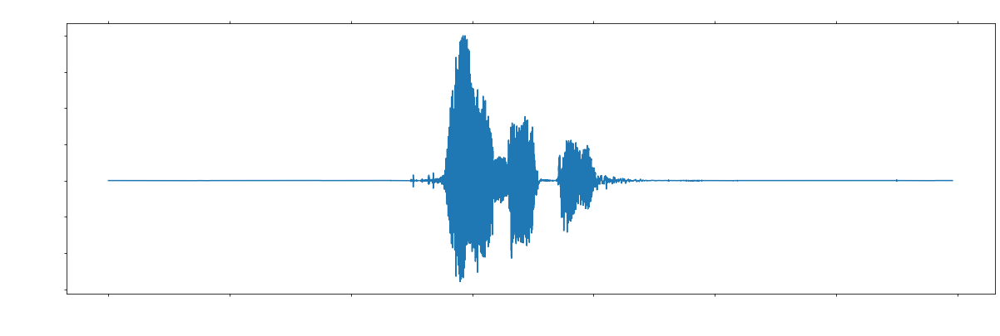

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 341760 bytes, expected 341796 bytes from header.
  sr, wav = wavfile.read(wav_loc)


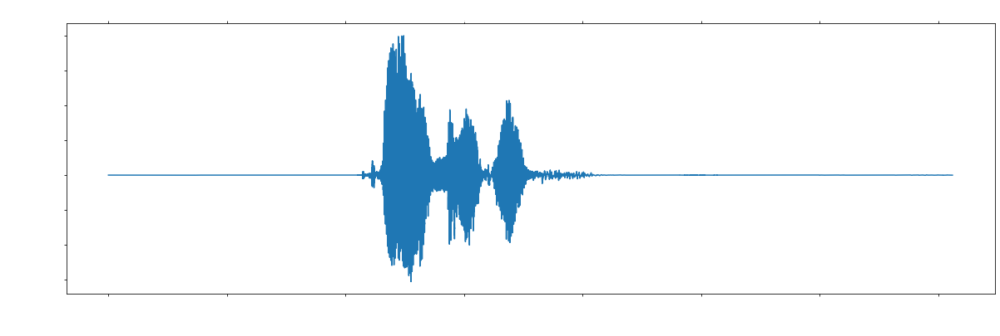

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 357120 bytes, expected 357156 bytes from header.
  sr, wav = wavfile.read(wav_loc)


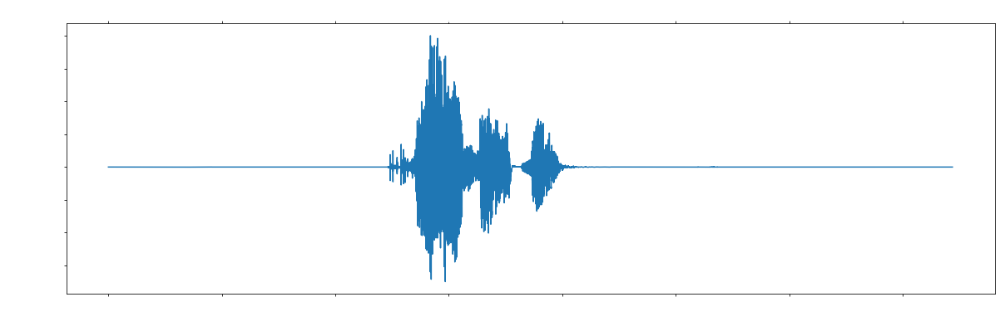

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 334080 bytes, expected 334116 bytes from header.
  sr, wav = wavfile.read(wav_loc)


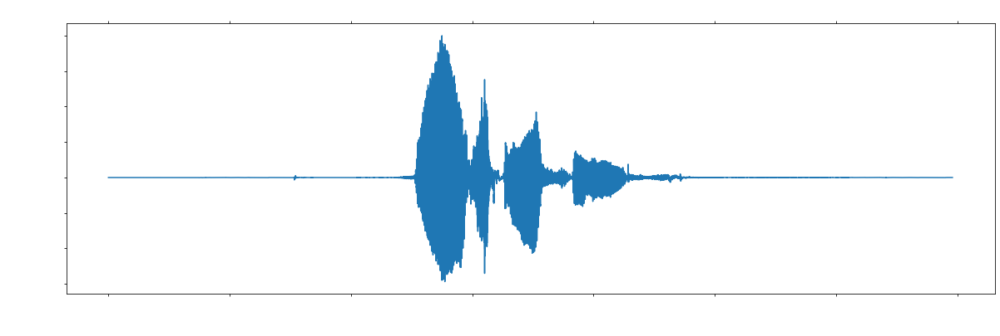

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 345600 bytes, expected 345636 bytes from header.
  sr, wav = wavfile.read(wav_loc)


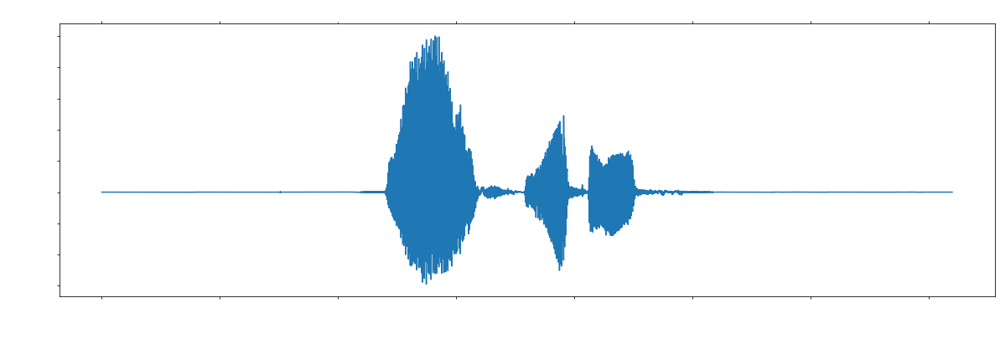

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 364800 bytes, expected 364836 bytes from header.
  sr, wav = wavfile.read(wav_loc)


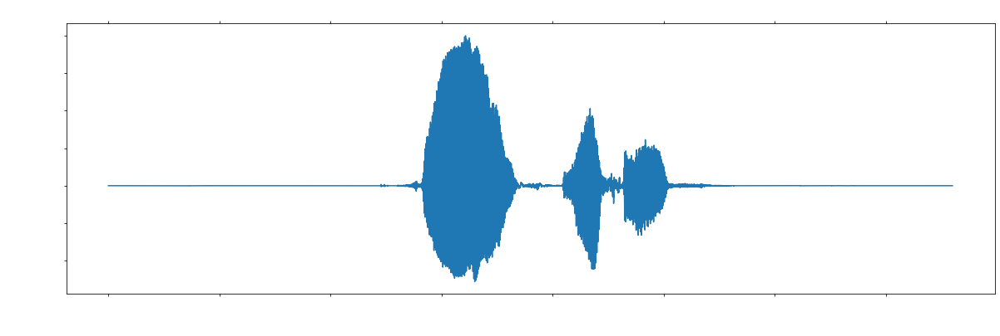

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 353280 bytes, expected 353316 bytes from header.
  sr, wav = wavfile.read(wav_loc)


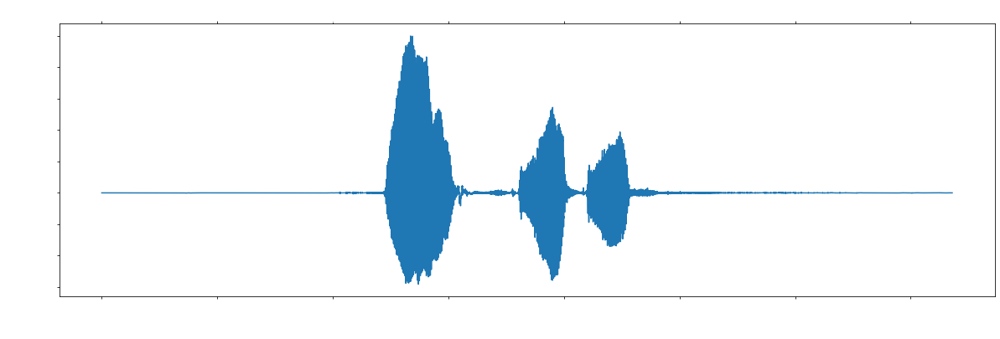

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 349440 bytes, expected 349476 bytes from header.
  sr, wav = wavfile.read(wav_loc)


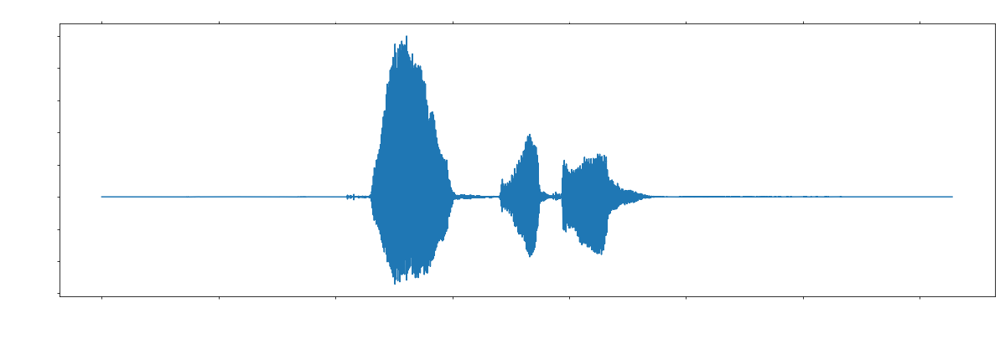

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 368640 bytes, expected 368676 bytes from header.
  sr, wav = wavfile.read(wav_loc)


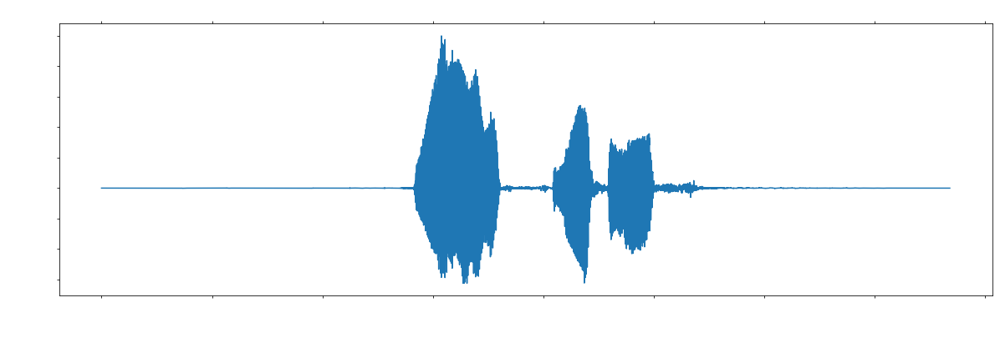

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 341760 bytes, expected 341796 bytes from header.
  sr, wav = wavfile.read(wav_loc)


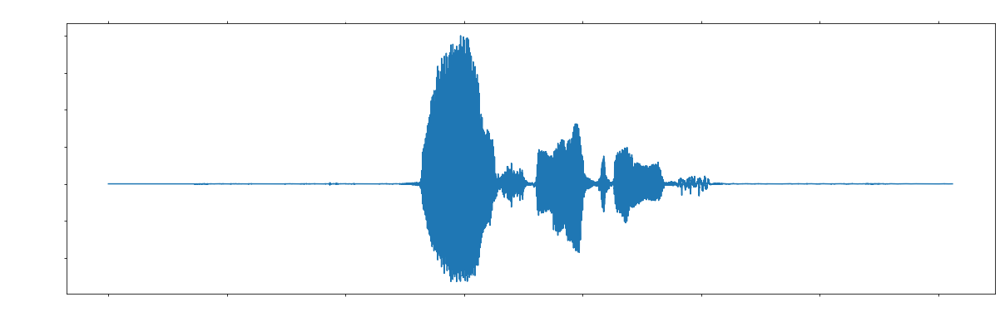

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 376320 bytes, expected 376356 bytes from header.
  sr, wav = wavfile.read(wav_loc)


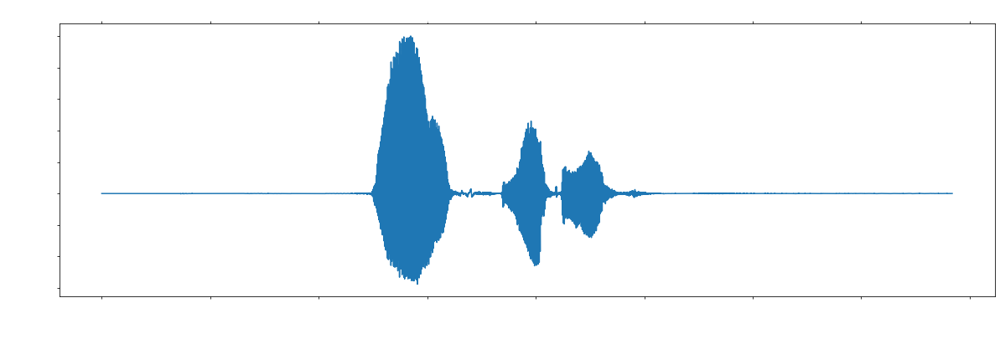

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 372480 bytes, expected 372516 bytes from header.
  sr, wav = wavfile.read(wav_loc)


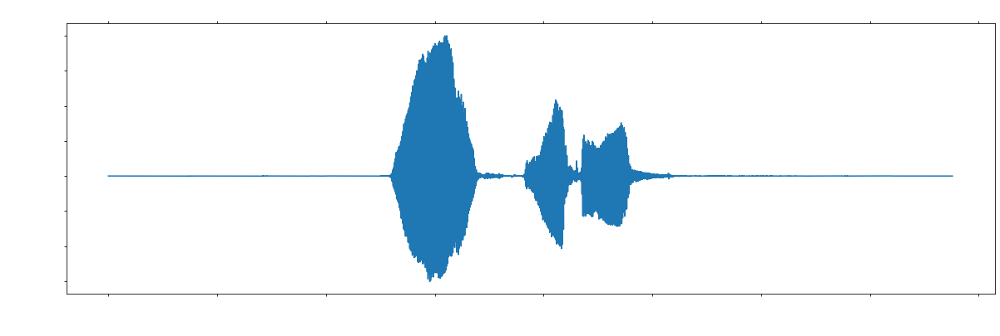

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 387840 bytes, expected 387876 bytes from header.
  sr, wav = wavfile.read(wav_loc)


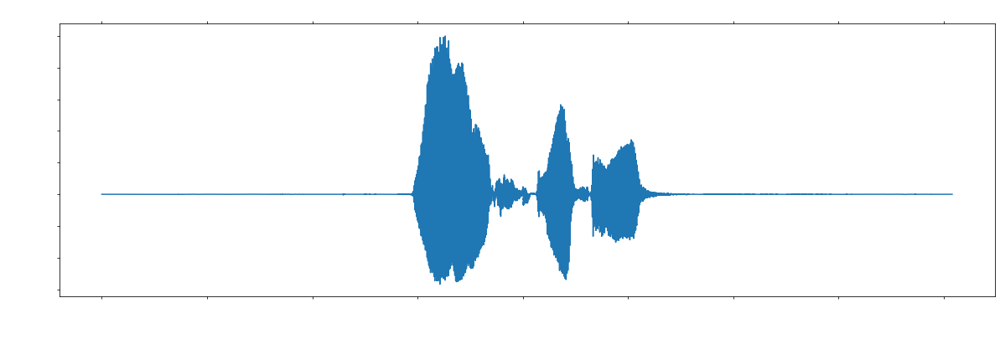

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 364800 bytes, expected 364836 bytes from header.
  sr, wav = wavfile.read(wav_loc)


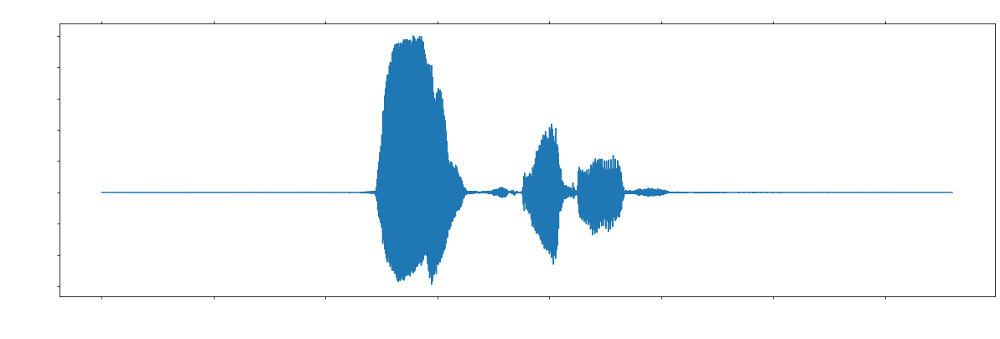

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 368640 bytes, expected 368676 bytes from header.
  sr, wav = wavfile.read(wav_loc)


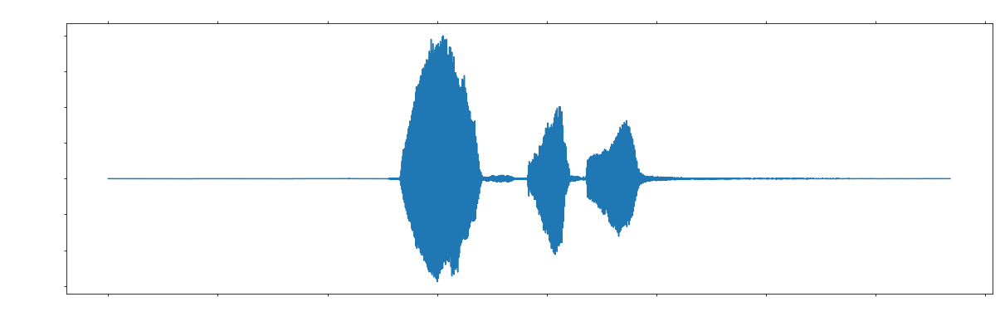

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 349440 bytes, expected 349476 bytes from header.
  sr, wav = wavfile.read(wav_loc)


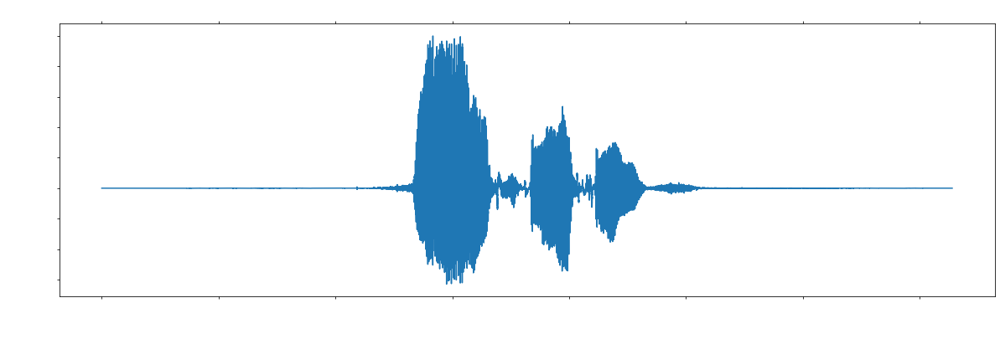

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 364800 bytes, expected 364836 bytes from header.
  sr, wav = wavfile.read(wav_loc)


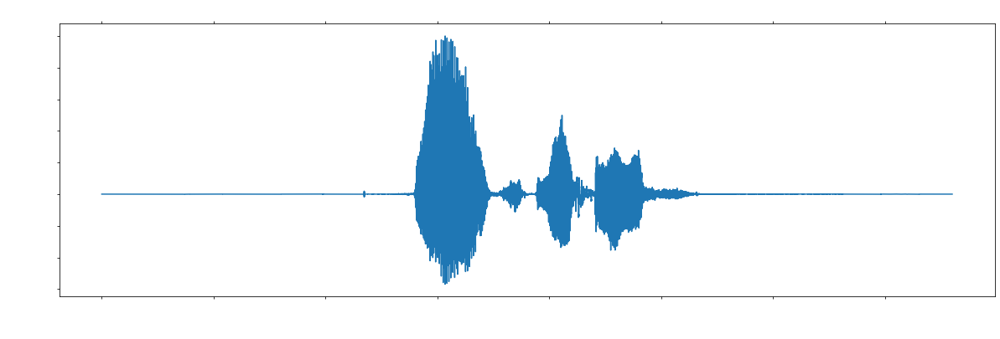

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 387840 bytes, expected 387876 bytes from header.
  sr, wav = wavfile.read(wav_loc)


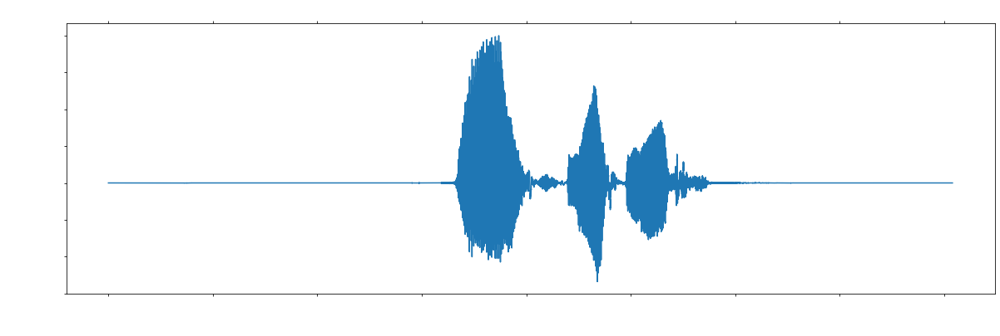

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 330240 bytes, expected 330276 bytes from header.
  sr, wav = wavfile.read(wav_loc)


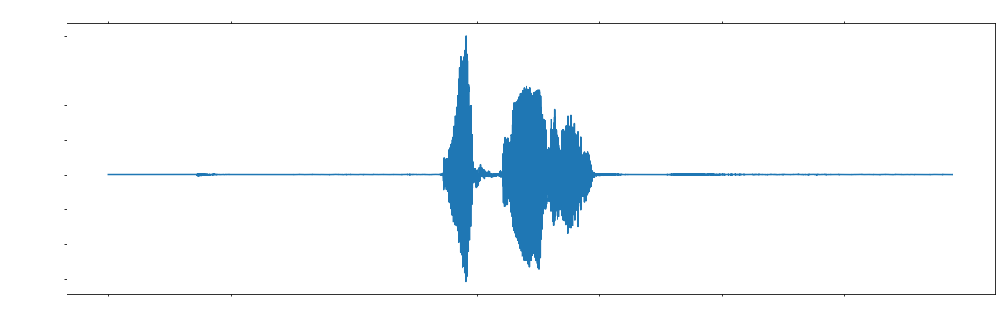

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 334080 bytes, expected 334116 bytes from header.
  sr, wav = wavfile.read(wav_loc)


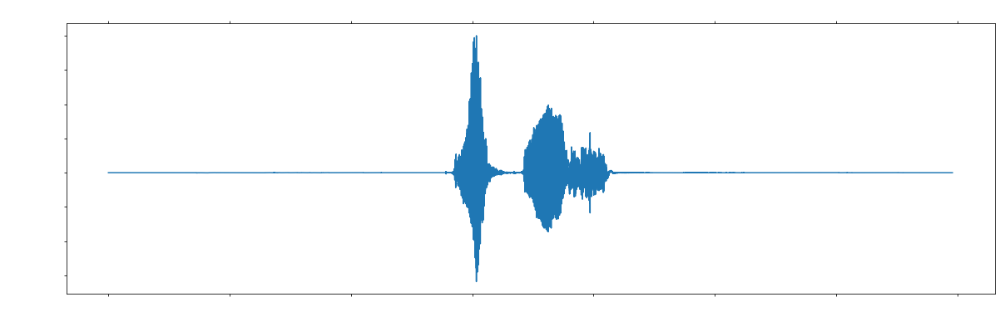

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 364800 bytes, expected 364836 bytes from header.
  sr, wav = wavfile.read(wav_loc)


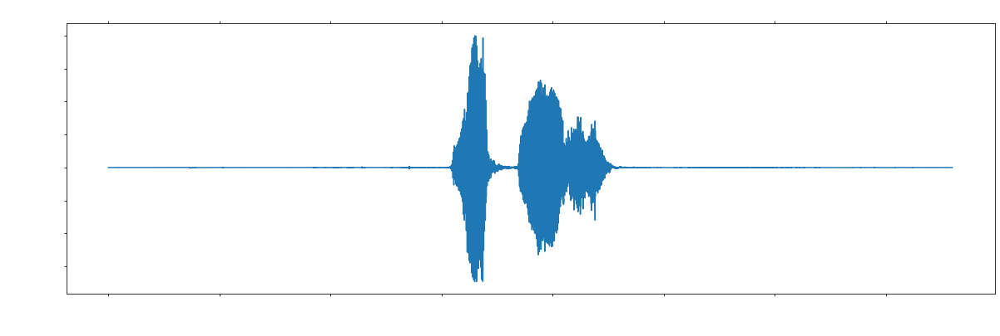

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 314880 bytes, expected 314916 bytes from header.
  sr, wav = wavfile.read(wav_loc)


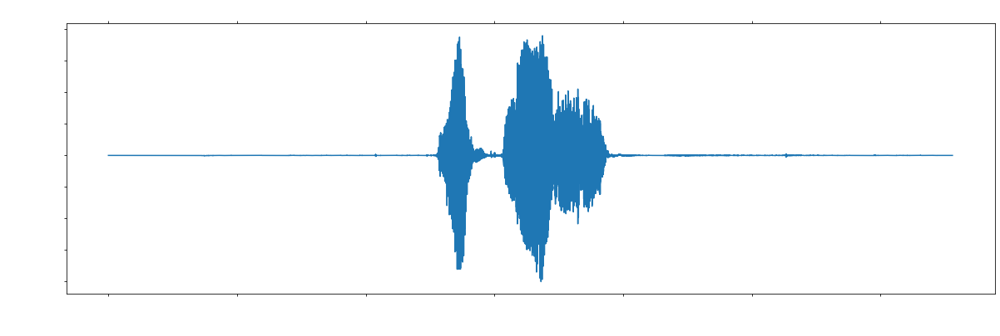

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 349440 bytes, expected 349476 bytes from header.
  sr, wav = wavfile.read(wav_loc)


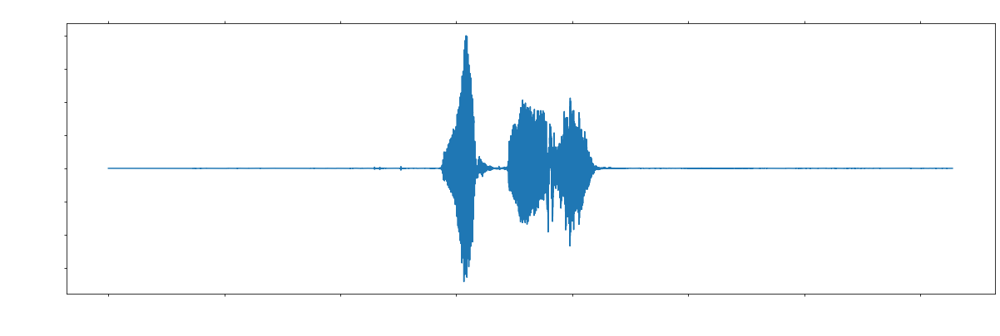

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 349440 bytes, expected 349476 bytes from header.
  sr, wav = wavfile.read(wav_loc)


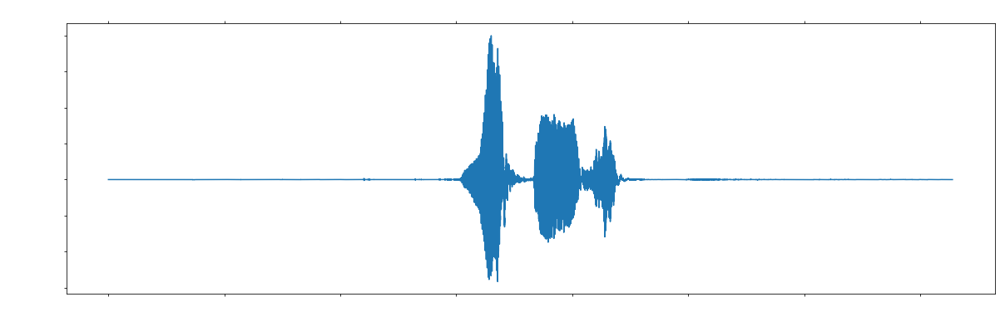

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 357120 bytes, expected 357156 bytes from header.
  sr, wav = wavfile.read(wav_loc)


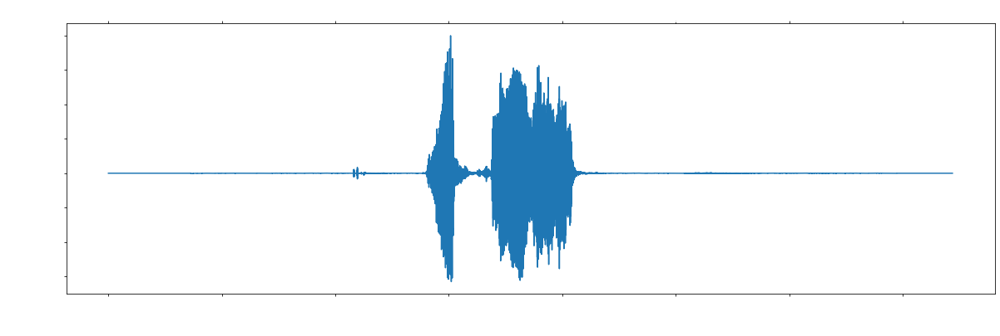

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 341760 bytes, expected 341796 bytes from header.
  sr, wav = wavfile.read(wav_loc)


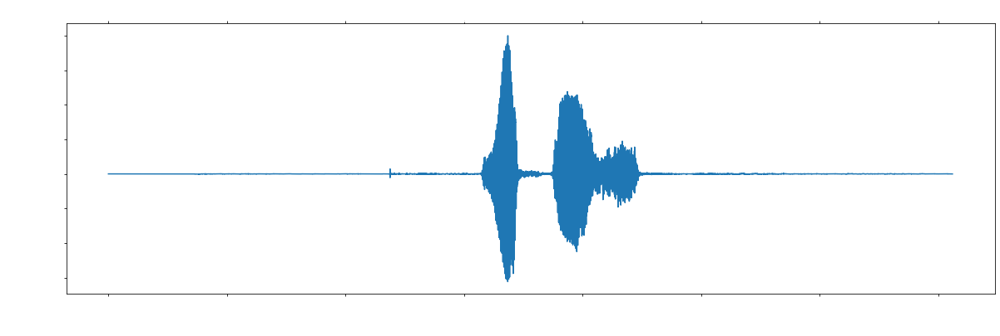

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 337920 bytes, expected 337956 bytes from header.
  sr, wav = wavfile.read(wav_loc)


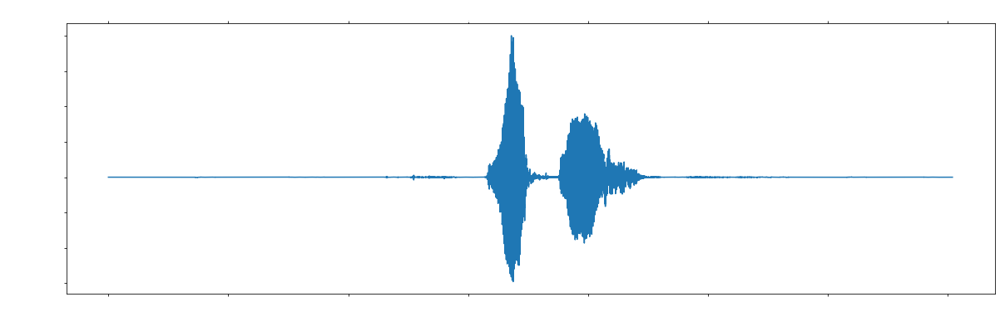

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 345600 bytes, expected 345636 bytes from header.
  sr, wav = wavfile.read(wav_loc)


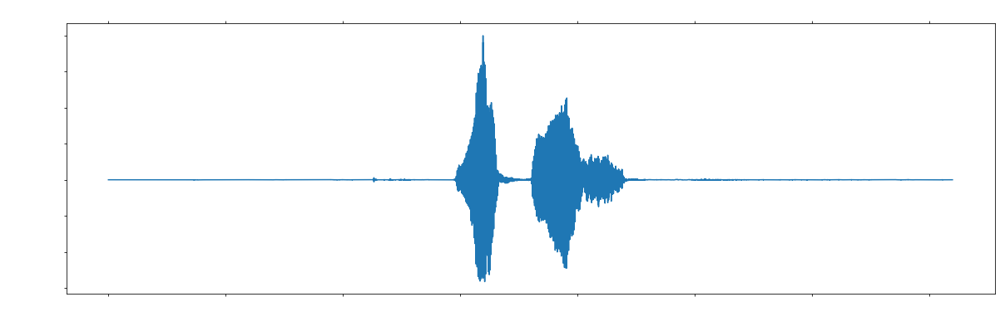

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 360960 bytes, expected 360996 bytes from header.
  sr, wav = wavfile.read(wav_loc)


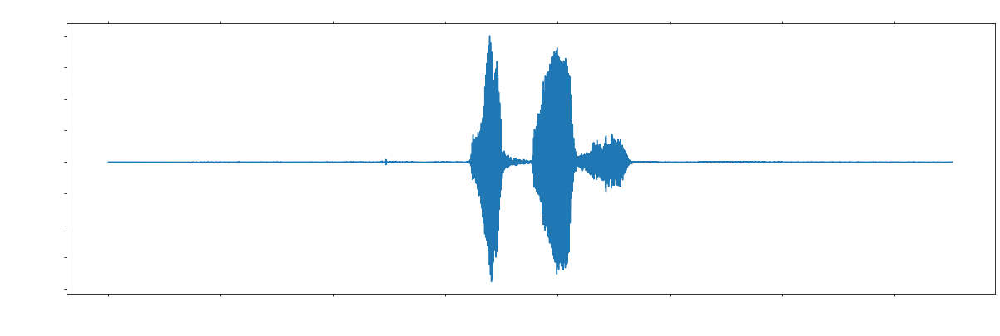

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 326400 bytes, expected 326436 bytes from header.
  sr, wav = wavfile.read(wav_loc)


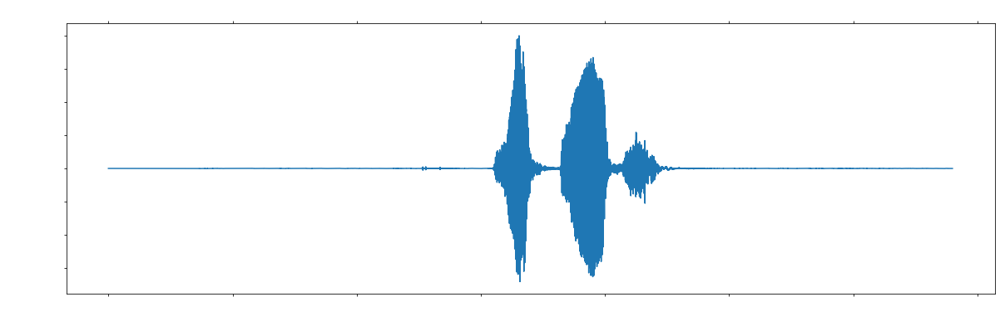

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 372480 bytes, expected 372516 bytes from header.
  sr, wav = wavfile.read(wav_loc)


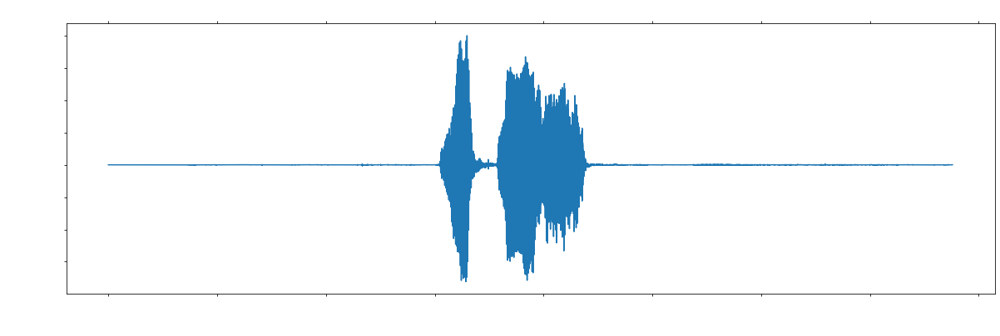

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 345600 bytes, expected 345636 bytes from header.
  sr, wav = wavfile.read(wav_loc)


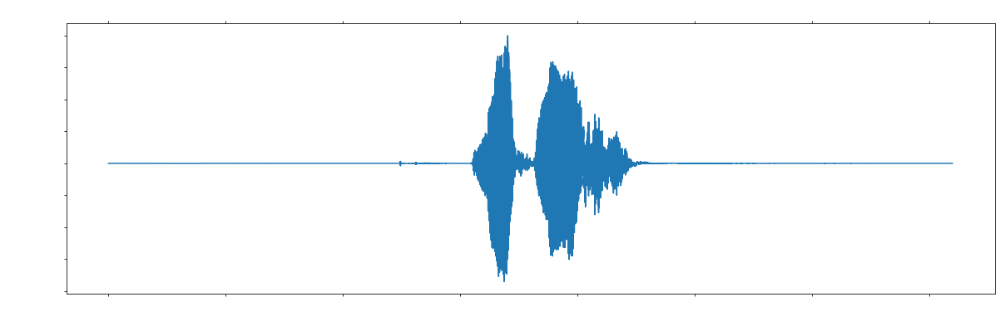

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 360960 bytes, expected 360996 bytes from header.
  sr, wav = wavfile.read(wav_loc)


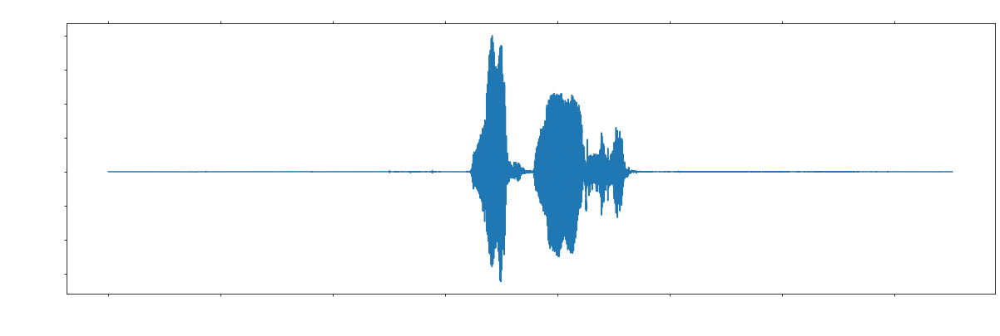

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 349440 bytes, expected 349476 bytes from header.
  sr, wav = wavfile.read(wav_loc)


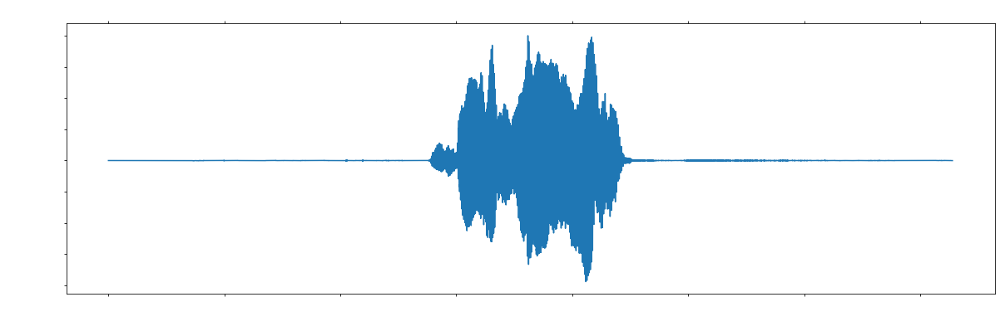

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 349440 bytes, expected 349476 bytes from header.
  sr, wav = wavfile.read(wav_loc)


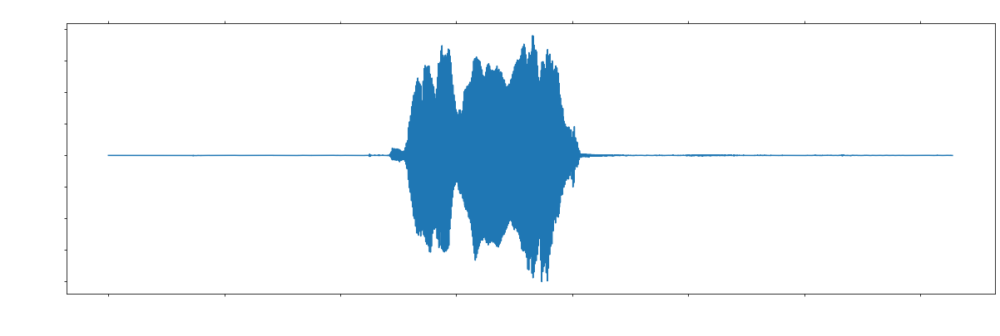

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 372480 bytes, expected 372516 bytes from header.
  sr, wav = wavfile.read(wav_loc)


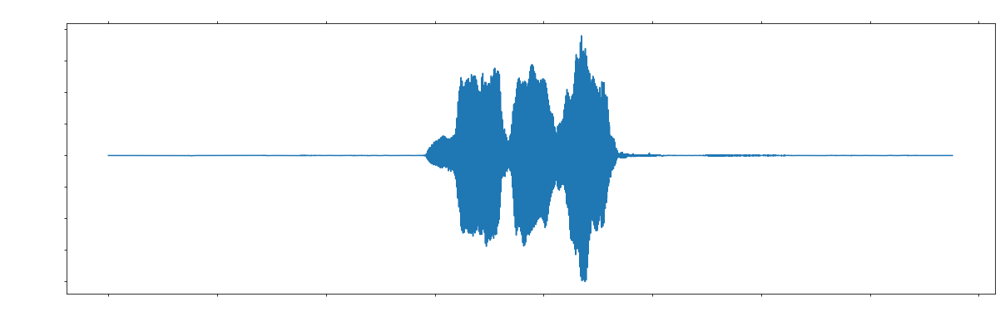

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 360960 bytes, expected 360996 bytes from header.
  sr, wav = wavfile.read(wav_loc)


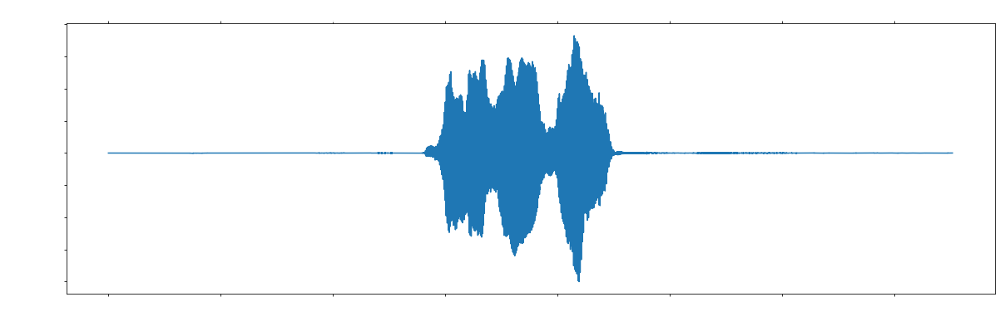

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 357120 bytes, expected 357156 bytes from header.
  sr, wav = wavfile.read(wav_loc)


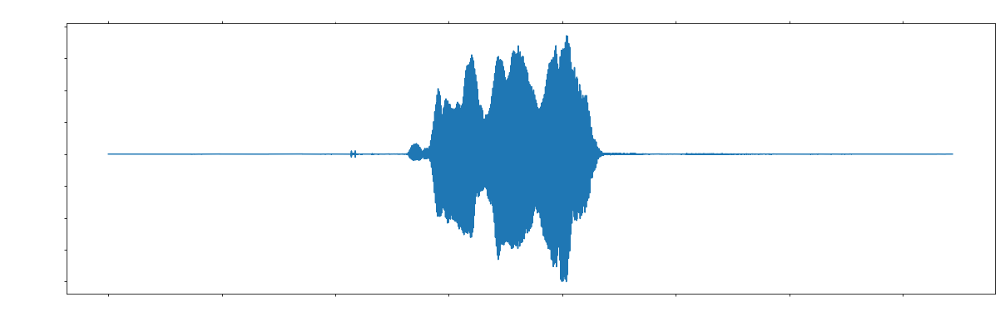

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 337920 bytes, expected 337956 bytes from header.
  sr, wav = wavfile.read(wav_loc)


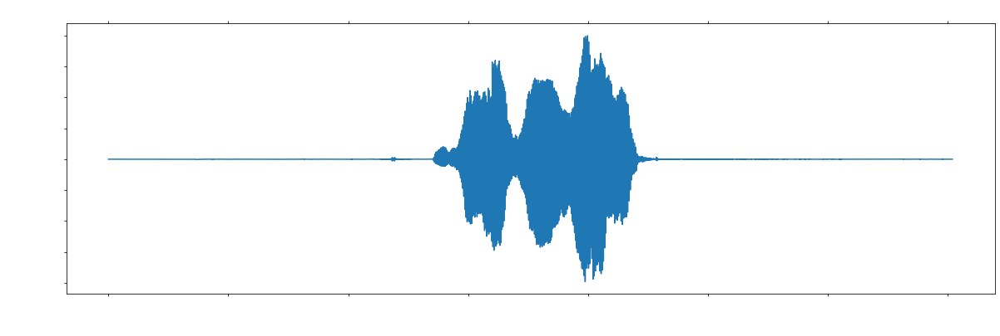

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 376320 bytes, expected 376356 bytes from header.
  sr, wav = wavfile.read(wav_loc)


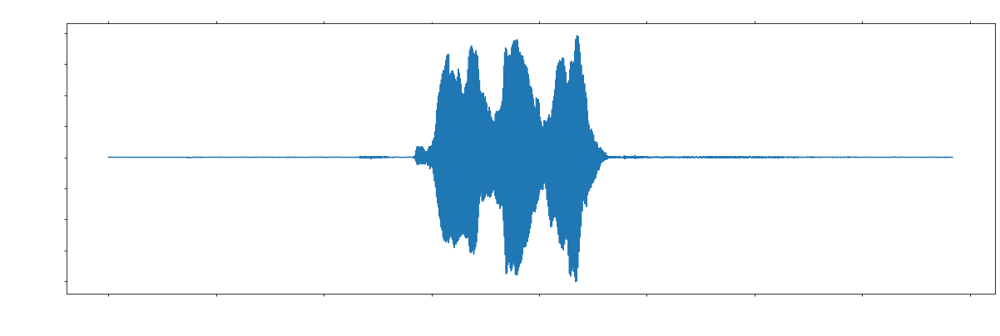

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 311040 bytes, expected 311076 bytes from header.
  sr, wav = wavfile.read(wav_loc)


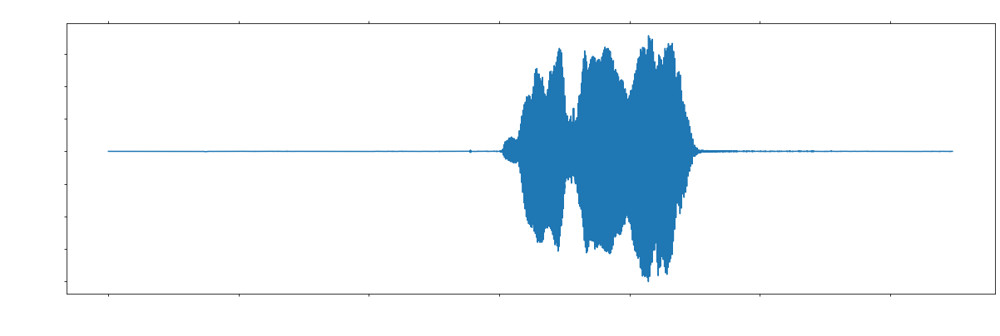

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 357120 bytes, expected 357156 bytes from header.
  sr, wav = wavfile.read(wav_loc)


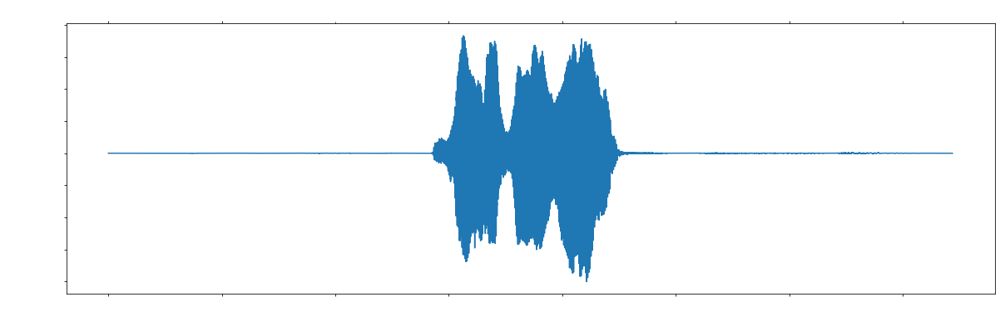

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 330240 bytes, expected 330276 bytes from header.
  sr, wav = wavfile.read(wav_loc)


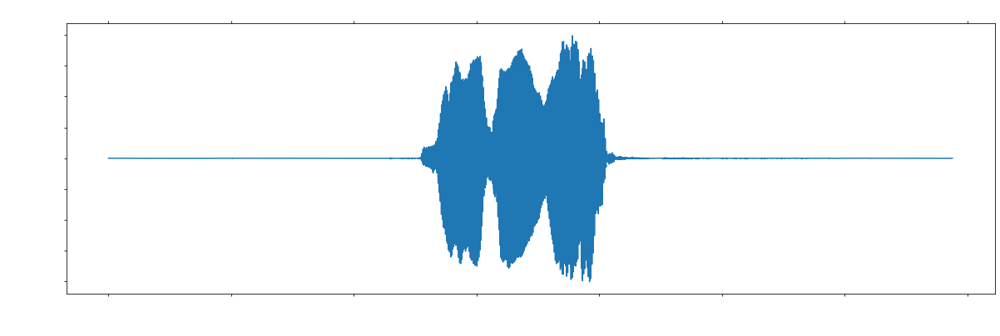

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 372480 bytes, expected 372516 bytes from header.
  sr, wav = wavfile.read(wav_loc)


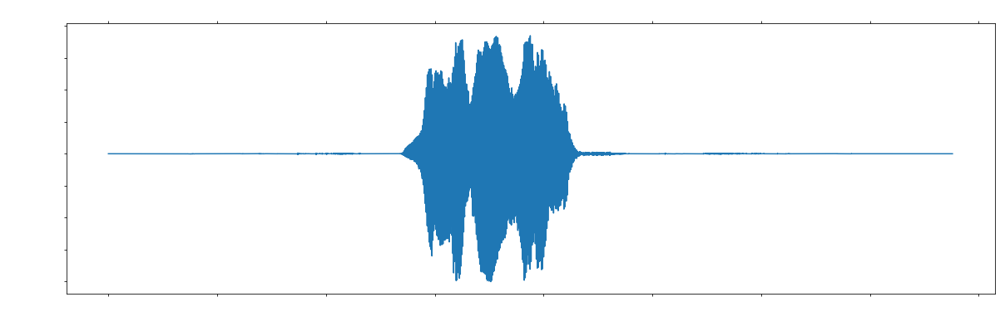

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 384000 bytes, expected 384036 bytes from header.
  sr, wav = wavfile.read(wav_loc)


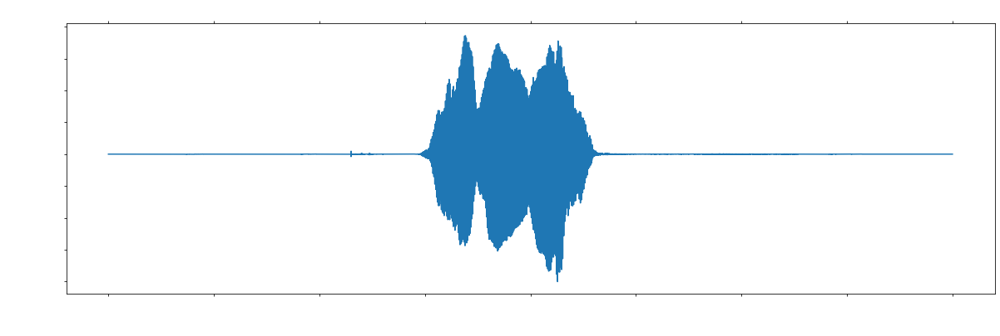

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 357120 bytes, expected 357156 bytes from header.
  sr, wav = wavfile.read(wav_loc)


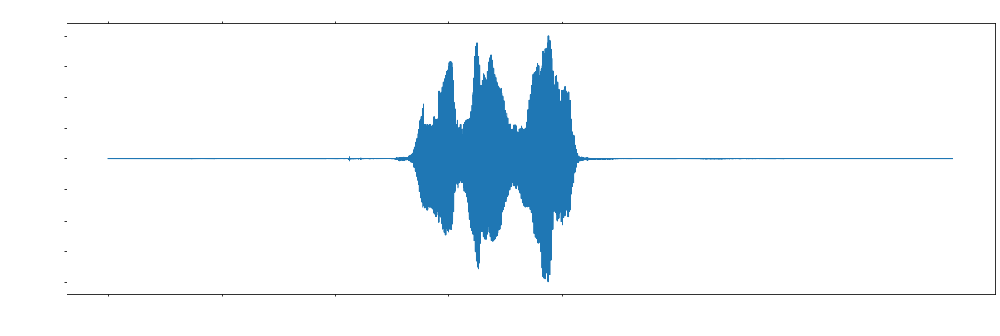

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 341760 bytes, expected 341796 bytes from header.
  sr, wav = wavfile.read(wav_loc)


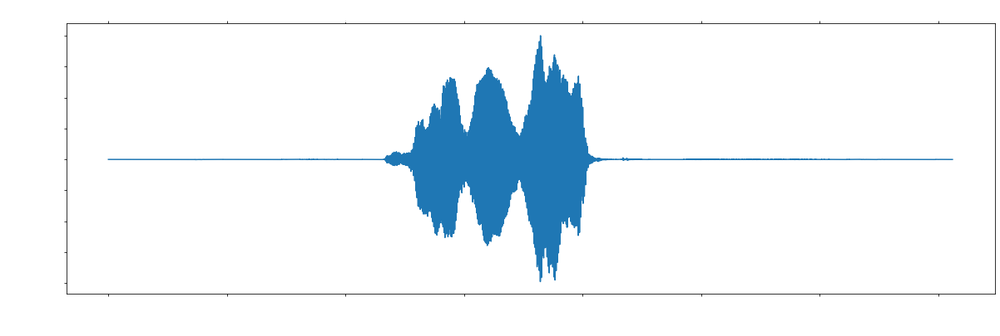

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 368640 bytes, expected 368676 bytes from header.
  sr, wav = wavfile.read(wav_loc)


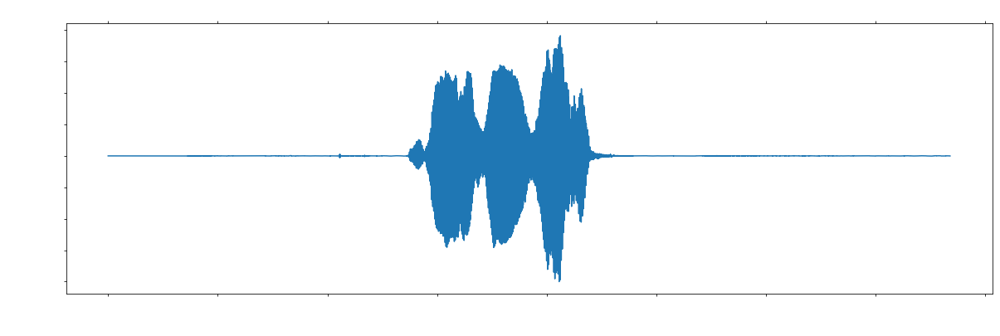

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 299520 bytes, expected 299556 bytes from header.
  sr, wav = wavfile.read(wav_loc)


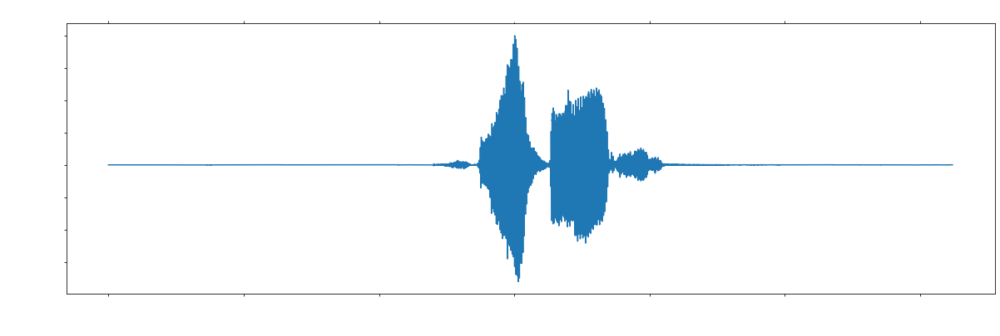

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 349440 bytes, expected 349476 bytes from header.
  sr, wav = wavfile.read(wav_loc)


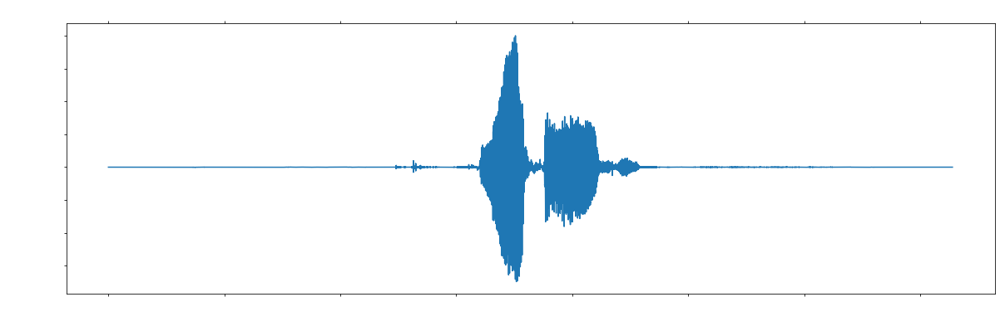

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 337920 bytes, expected 337956 bytes from header.
  sr, wav = wavfile.read(wav_loc)


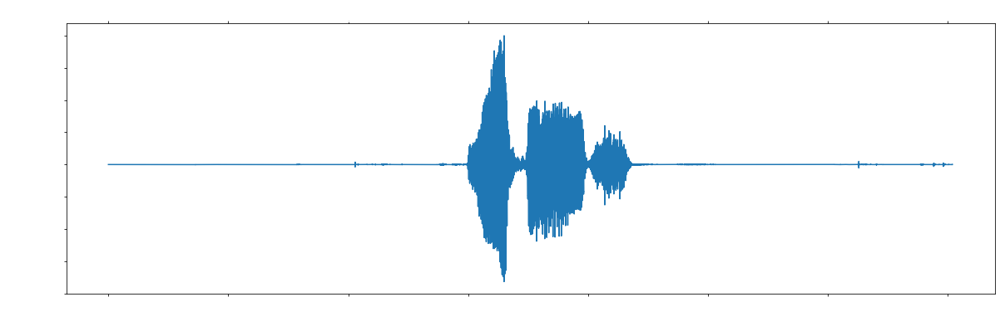

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 330240 bytes, expected 330276 bytes from header.
  sr, wav = wavfile.read(wav_loc)


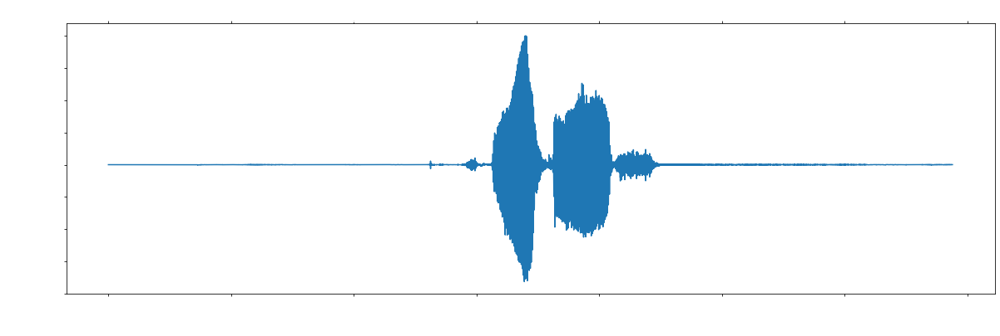

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 303360 bytes, expected 303396 bytes from header.
  sr, wav = wavfile.read(wav_loc)


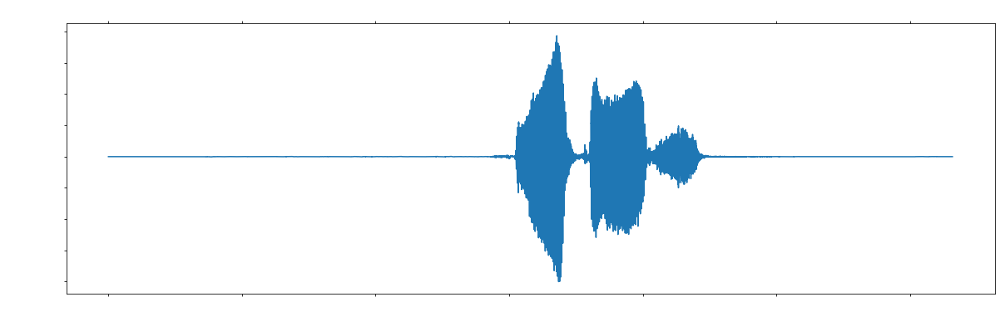

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 330240 bytes, expected 330276 bytes from header.
  sr, wav = wavfile.read(wav_loc)


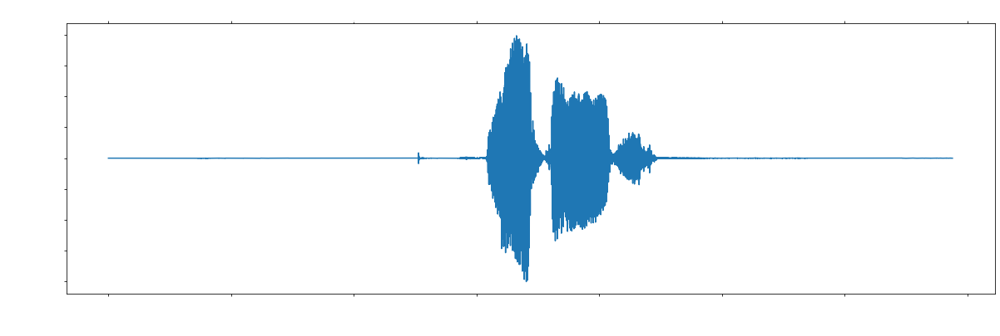

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 326400 bytes, expected 326436 bytes from header.
  sr, wav = wavfile.read(wav_loc)


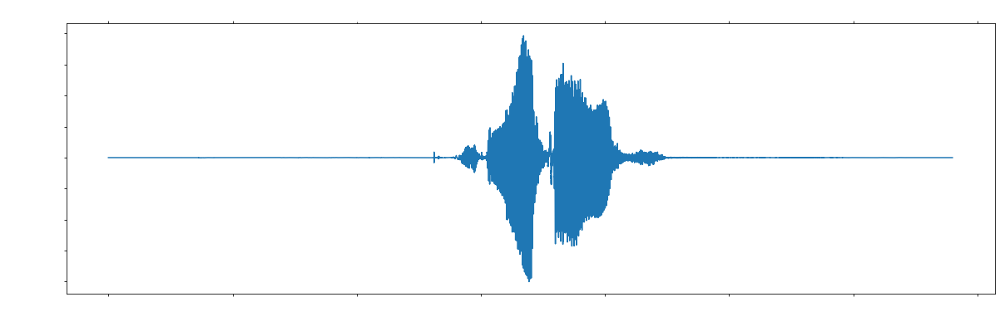

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 314880 bytes, expected 314916 bytes from header.
  sr, wav = wavfile.read(wav_loc)


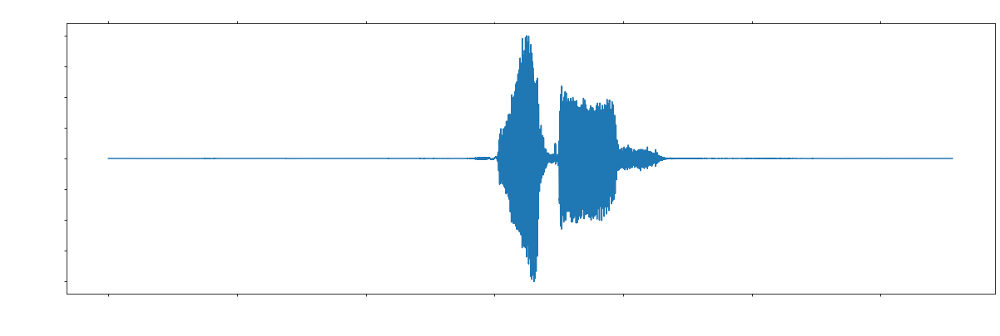

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 318720 bytes, expected 318756 bytes from header.
  sr, wav = wavfile.read(wav_loc)


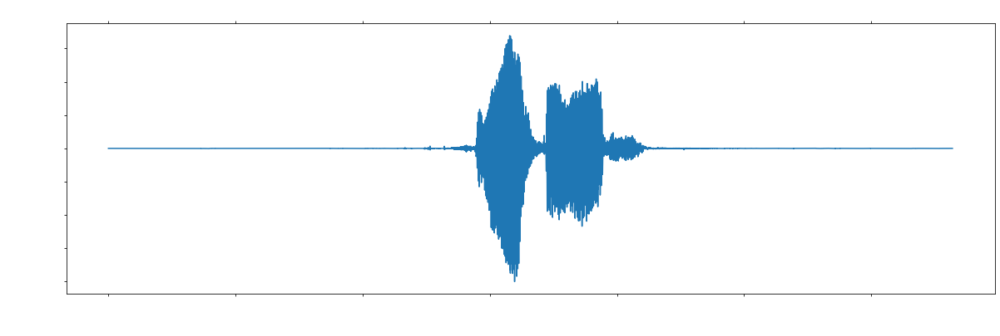

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 311040 bytes, expected 311076 bytes from header.
  sr, wav = wavfile.read(wav_loc)


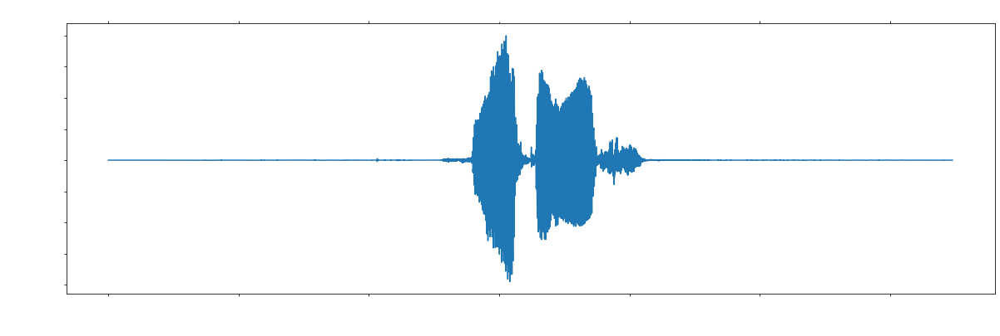

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 372480 bytes, expected 372516 bytes from header.
  sr, wav = wavfile.read(wav_loc)


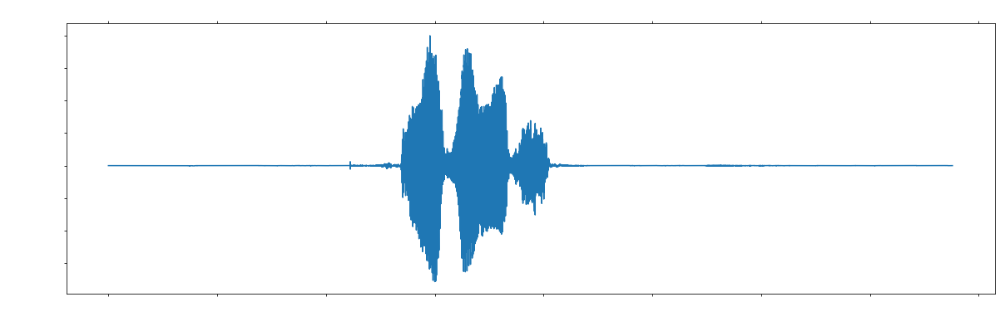

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 322560 bytes, expected 322596 bytes from header.
  sr, wav = wavfile.read(wav_loc)


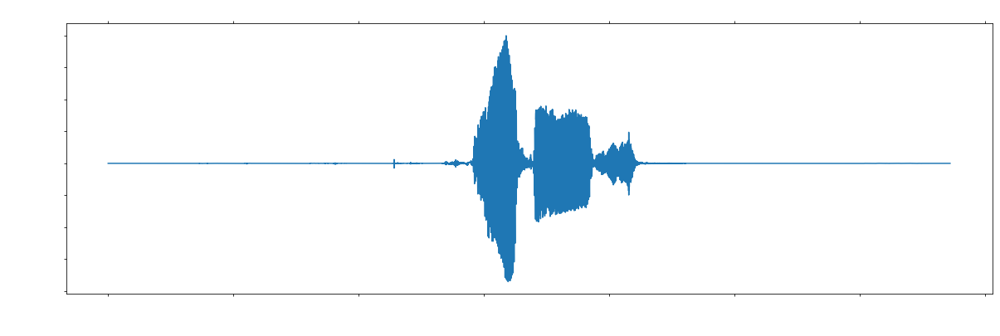

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 322560 bytes, expected 322596 bytes from header.
  sr, wav = wavfile.read(wav_loc)


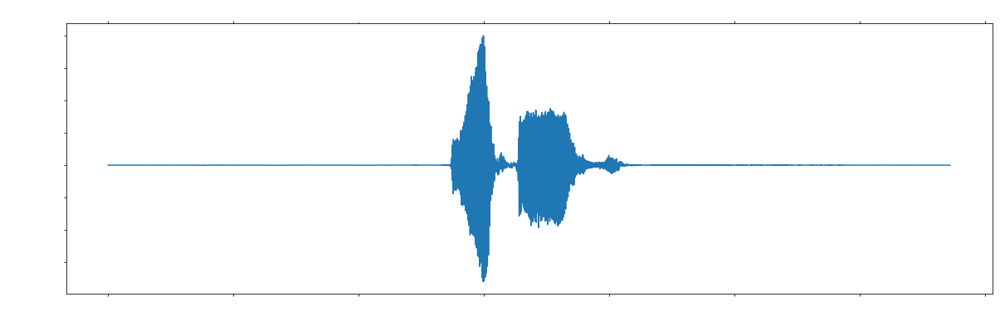

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 322560 bytes, expected 322596 bytes from header.
  sr, wav = wavfile.read(wav_loc)


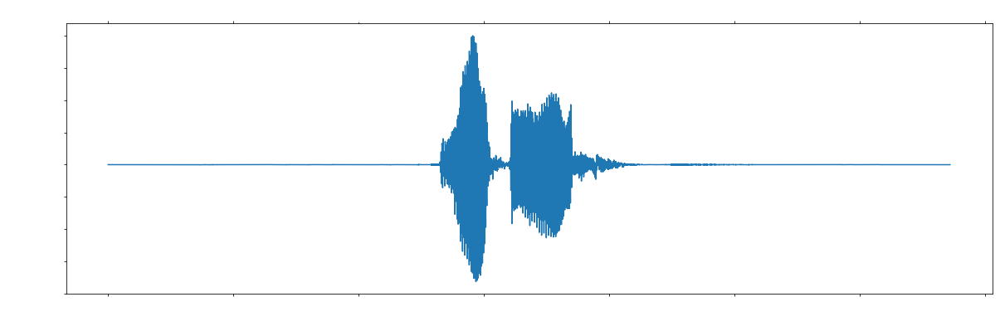

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 349440 bytes, expected 349476 bytes from header.
  sr, wav = wavfile.read(wav_loc)


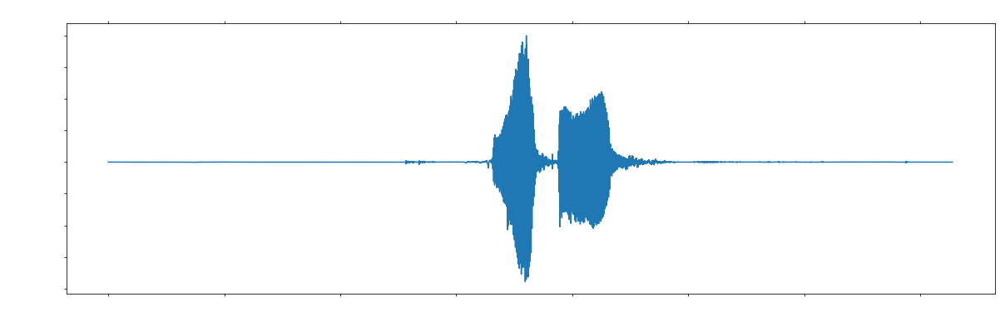

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 307200 bytes, expected 307236 bytes from header.
  sr, wav = wavfile.read(wav_loc)


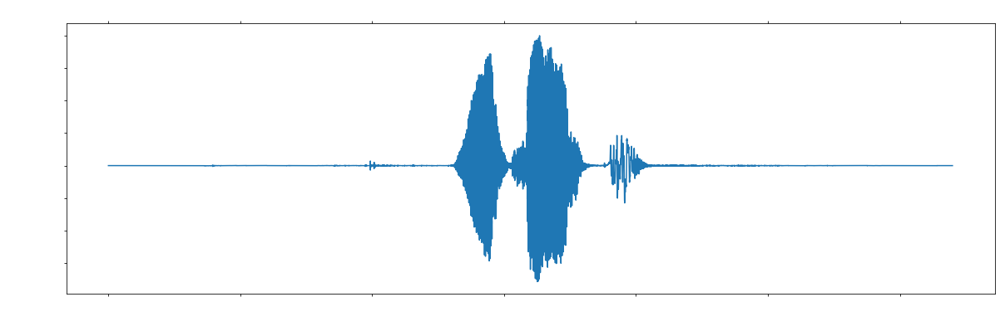

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 326400 bytes, expected 326436 bytes from header.
  sr, wav = wavfile.read(wav_loc)


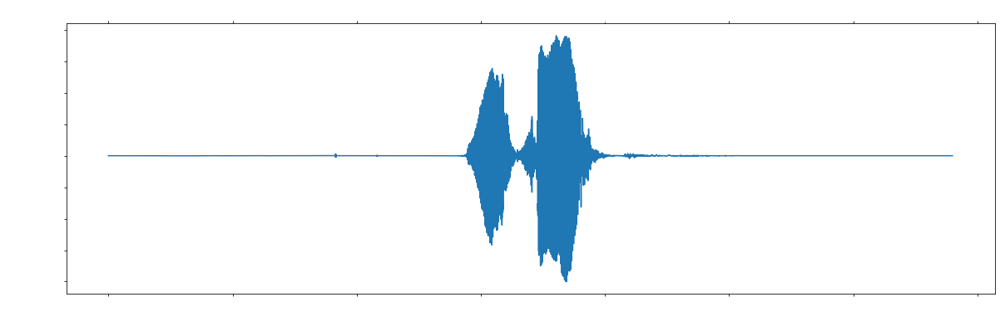

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 334080 bytes, expected 334116 bytes from header.
  sr, wav = wavfile.read(wav_loc)


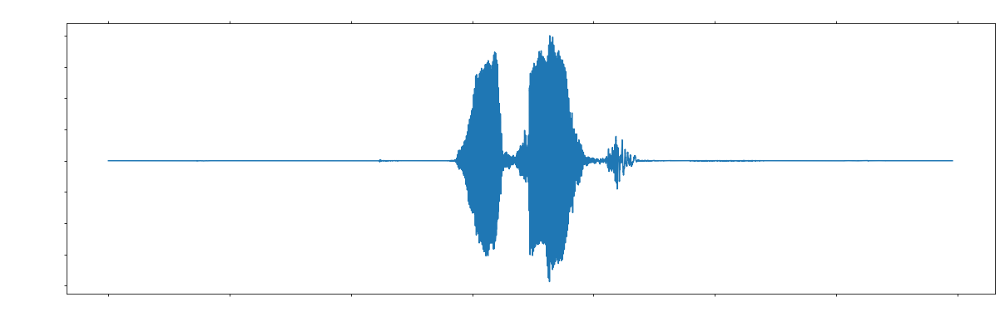

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 326400 bytes, expected 326436 bytes from header.
  sr, wav = wavfile.read(wav_loc)


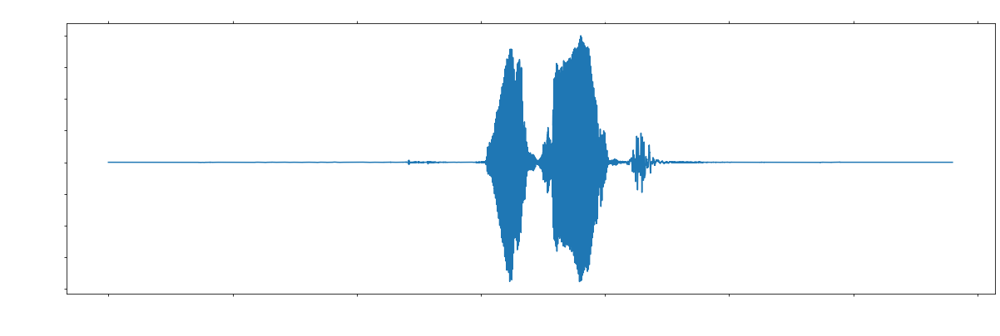

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 330240 bytes, expected 330276 bytes from header.
  sr, wav = wavfile.read(wav_loc)


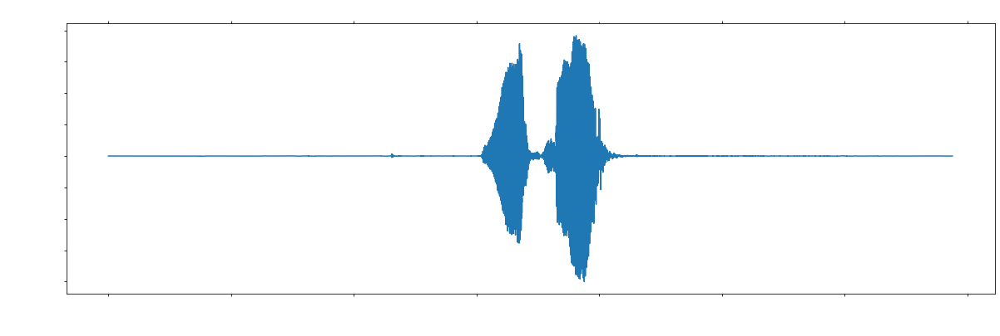

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 314880 bytes, expected 314916 bytes from header.
  sr, wav = wavfile.read(wav_loc)


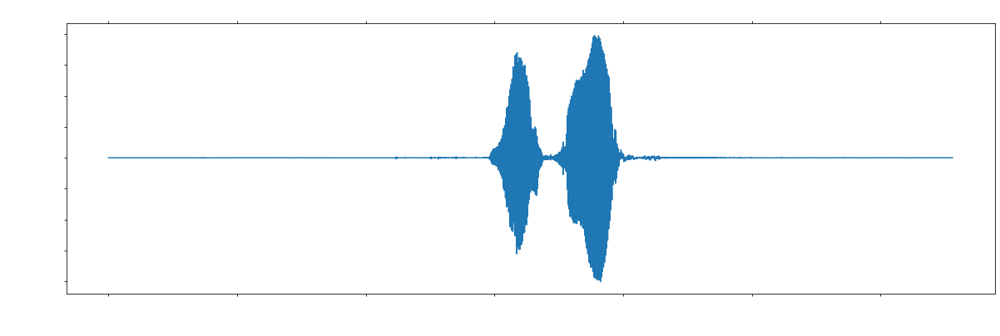

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 334080 bytes, expected 334116 bytes from header.
  sr, wav = wavfile.read(wav_loc)


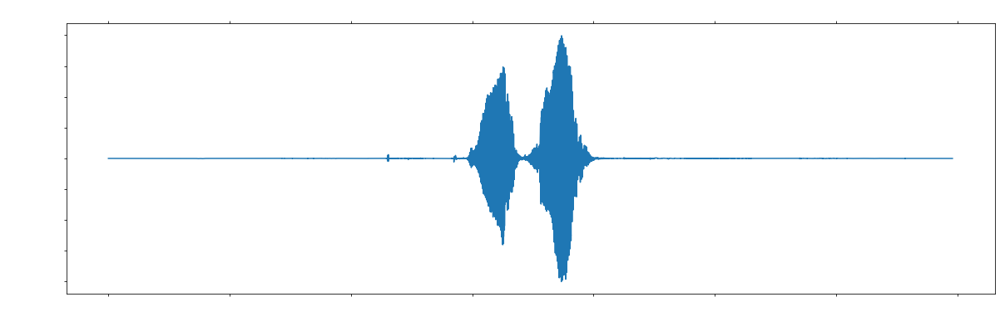

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 318720 bytes, expected 318756 bytes from header.
  sr, wav = wavfile.read(wav_loc)


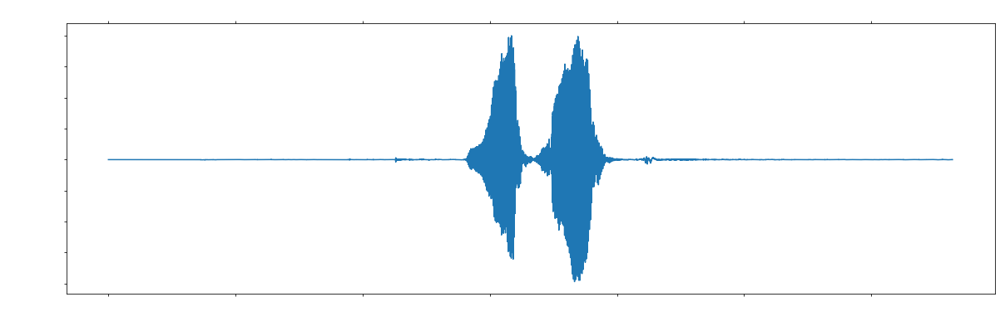

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 311040 bytes, expected 311076 bytes from header.
  sr, wav = wavfile.read(wav_loc)


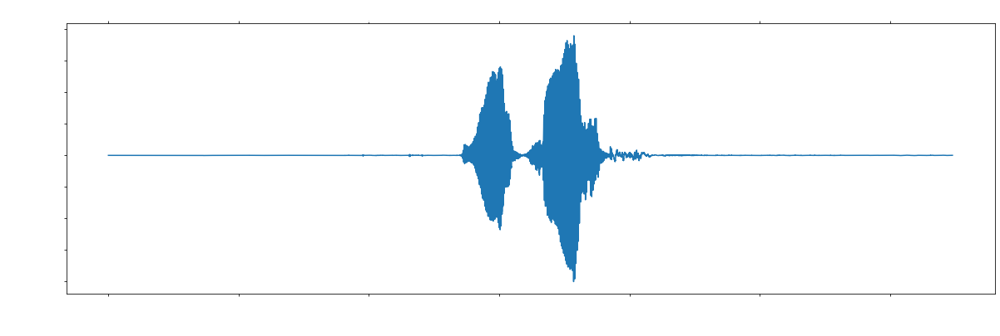

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 326400 bytes, expected 326436 bytes from header.
  sr, wav = wavfile.read(wav_loc)


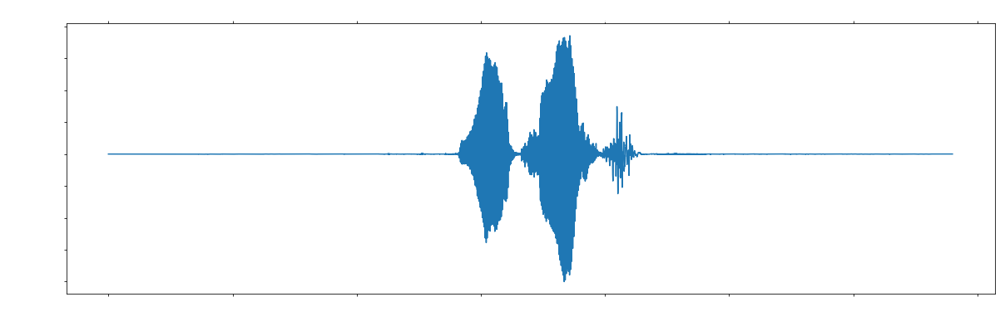

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 353280 bytes, expected 353316 bytes from header.
  sr, wav = wavfile.read(wav_loc)


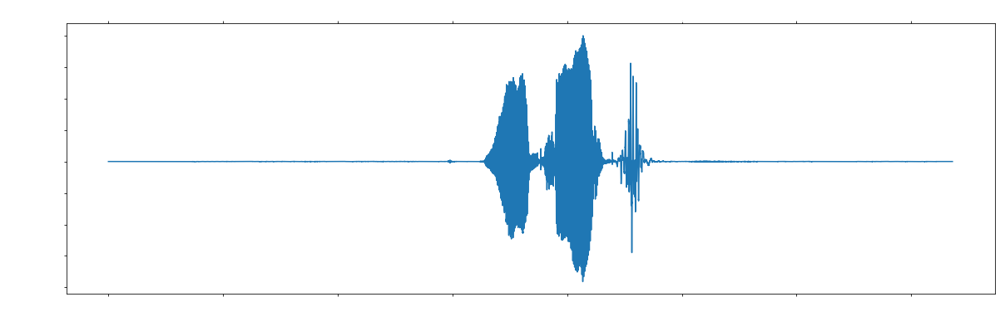

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 341760 bytes, expected 341796 bytes from header.
  sr, wav = wavfile.read(wav_loc)


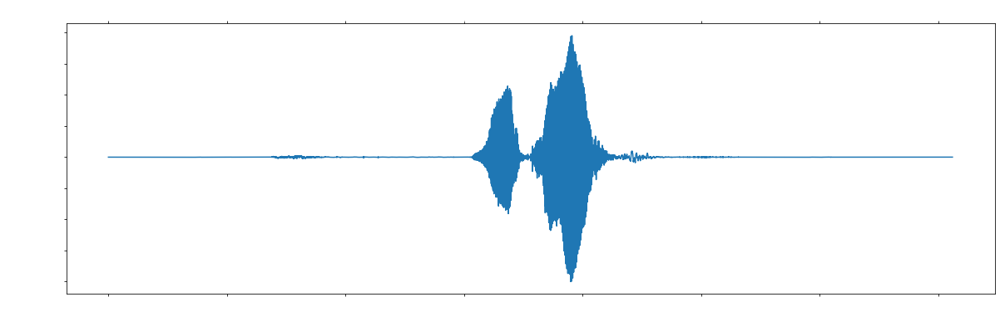

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 99840 bytes, expected 99876 bytes from header.
  sr, wav = wavfile.read(wav_loc)
C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 307200 bytes, expected 307236 bytes from header.
  sr, wav = wavfile.read(wav_loc)


Silence! de-DE_Becker _F_10-50_Germany_YouTube_4.wav


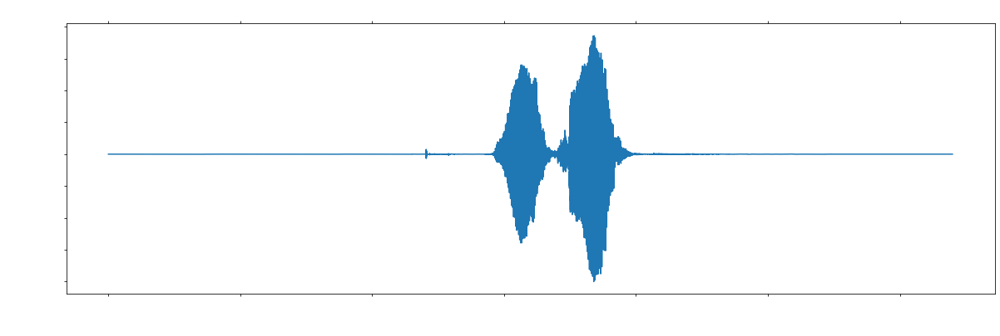

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 326400 bytes, expected 326436 bytes from header.
  sr, wav = wavfile.read(wav_loc)


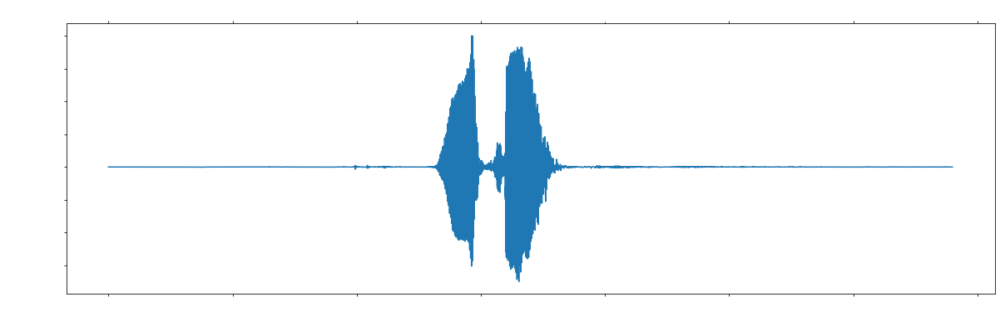

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 449280 bytes, expected 449316 bytes from header.
  sr, wav = wavfile.read(wav_loc)


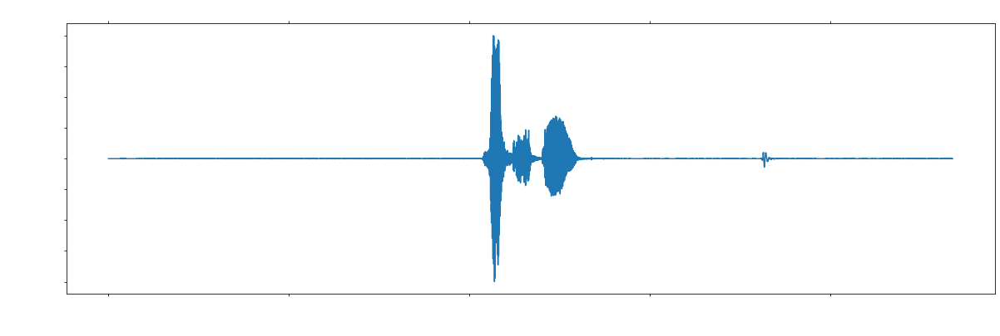

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 422400 bytes, expected 422436 bytes from header.
  sr, wav = wavfile.read(wav_loc)


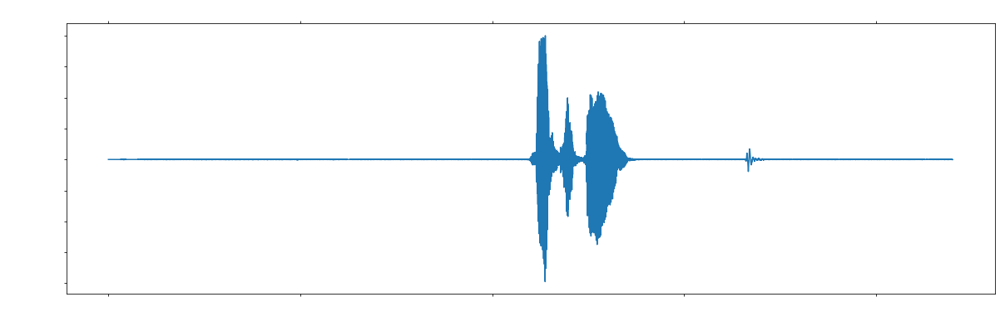

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 503040 bytes, expected 503076 bytes from header.
  sr, wav = wavfile.read(wav_loc)


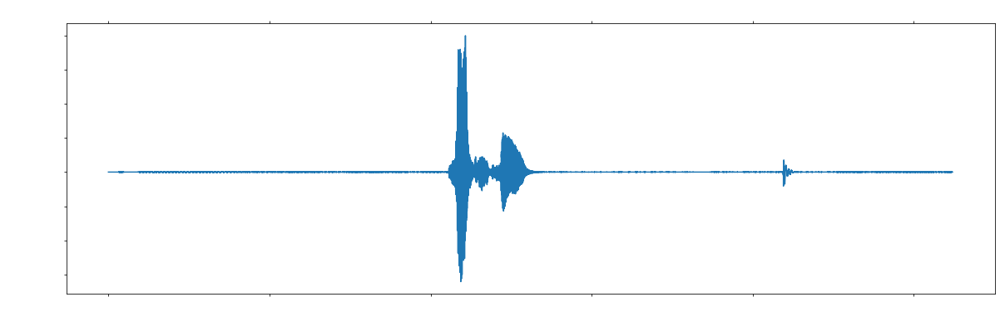

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 472320 bytes, expected 472356 bytes from header.
  sr, wav = wavfile.read(wav_loc)


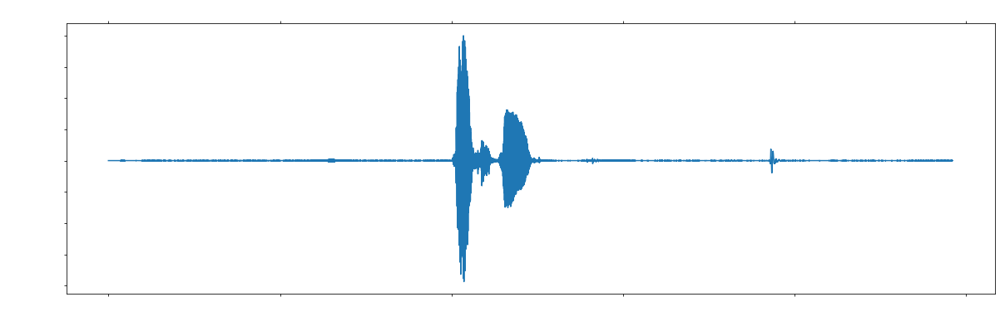

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 476160 bytes, expected 476196 bytes from header.
  sr, wav = wavfile.read(wav_loc)


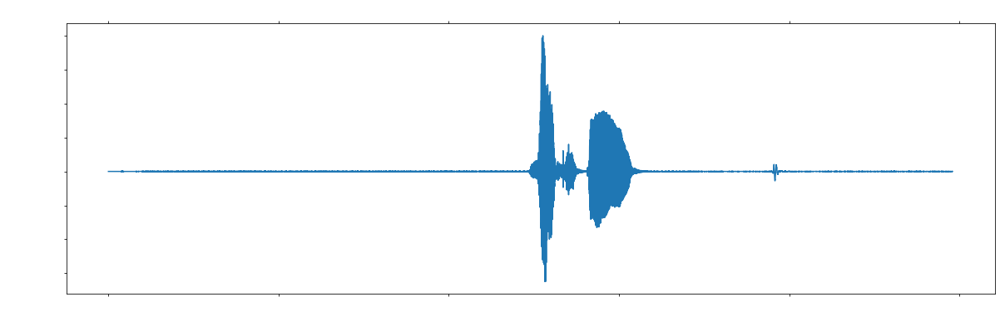

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 476160 bytes, expected 476196 bytes from header.
  sr, wav = wavfile.read(wav_loc)


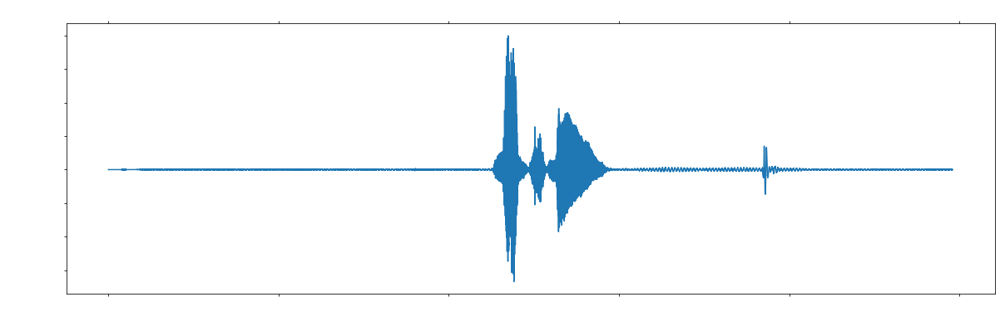

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 453120 bytes, expected 453156 bytes from header.
  sr, wav = wavfile.read(wav_loc)


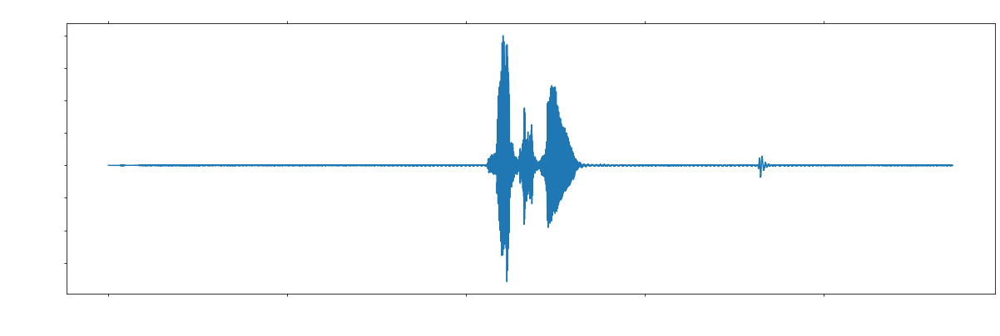

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 472320 bytes, expected 472356 bytes from header.
  sr, wav = wavfile.read(wav_loc)


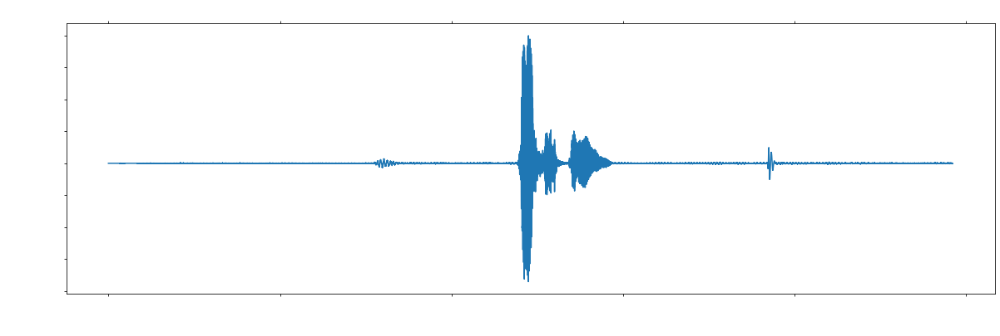

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 441600 bytes, expected 441636 bytes from header.
  sr, wav = wavfile.read(wav_loc)


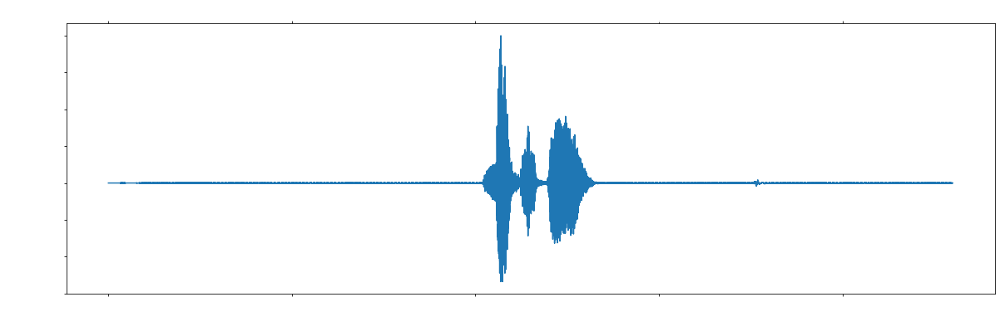

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 468480 bytes, expected 468516 bytes from header.
  sr, wav = wavfile.read(wav_loc)


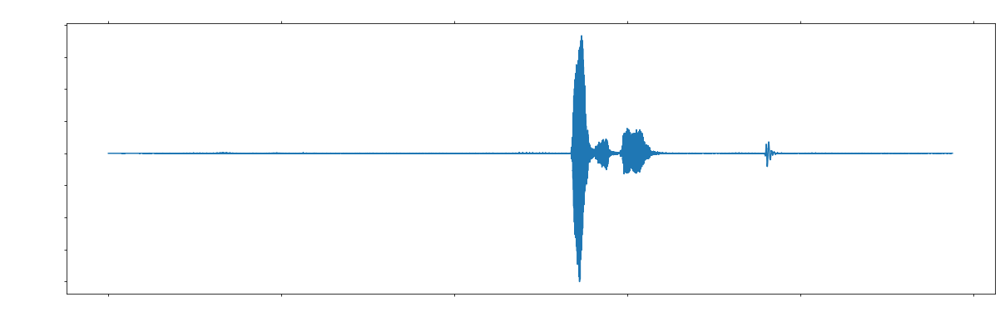

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 407040 bytes, expected 407076 bytes from header.
  sr, wav = wavfile.read(wav_loc)


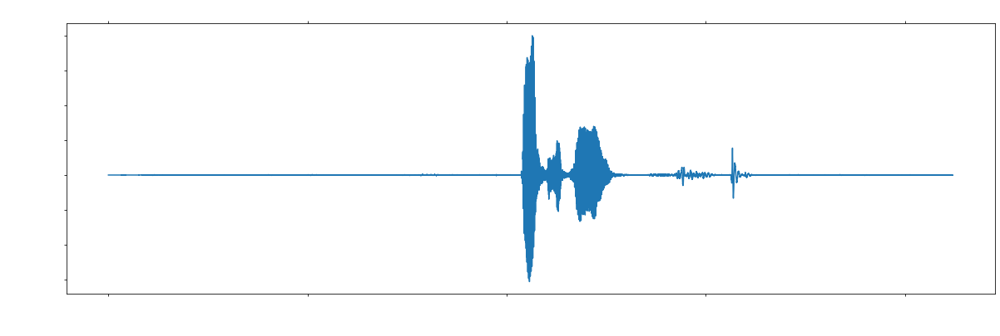

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 441600 bytes, expected 441636 bytes from header.
  sr, wav = wavfile.read(wav_loc)


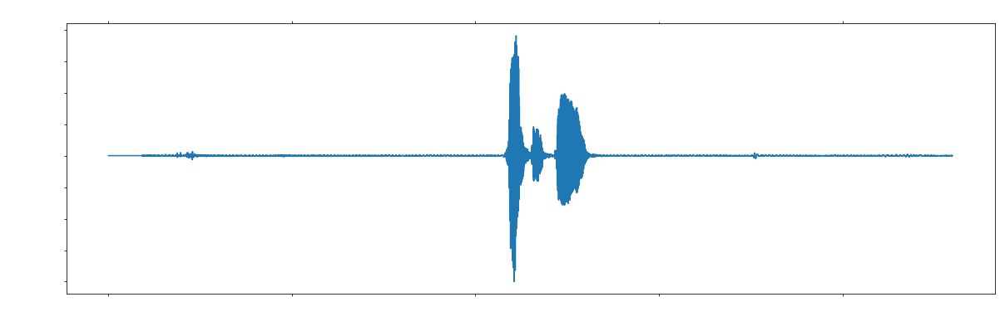

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 384000 bytes, expected 384036 bytes from header.
  sr, wav = wavfile.read(wav_loc)


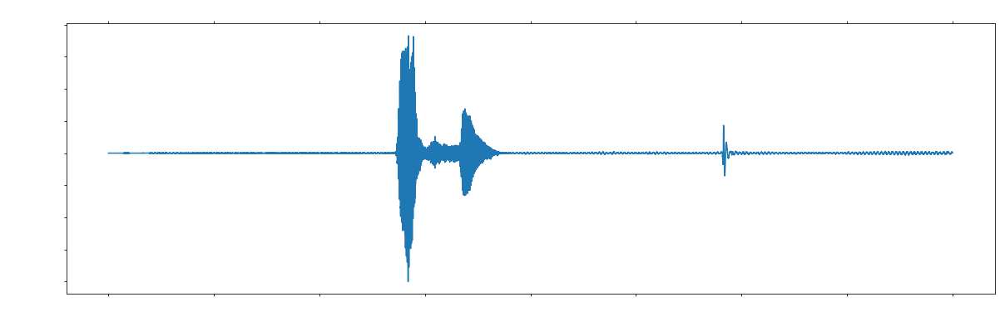

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 472320 bytes, expected 472356 bytes from header.
  sr, wav = wavfile.read(wav_loc)


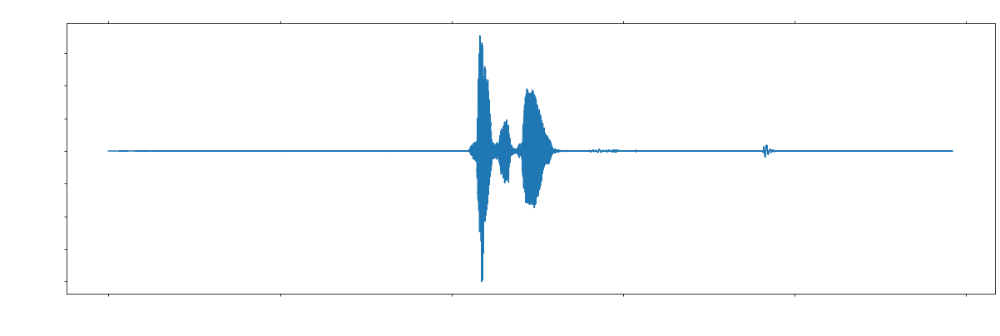

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 445440 bytes, expected 445476 bytes from header.
  sr, wav = wavfile.read(wav_loc)


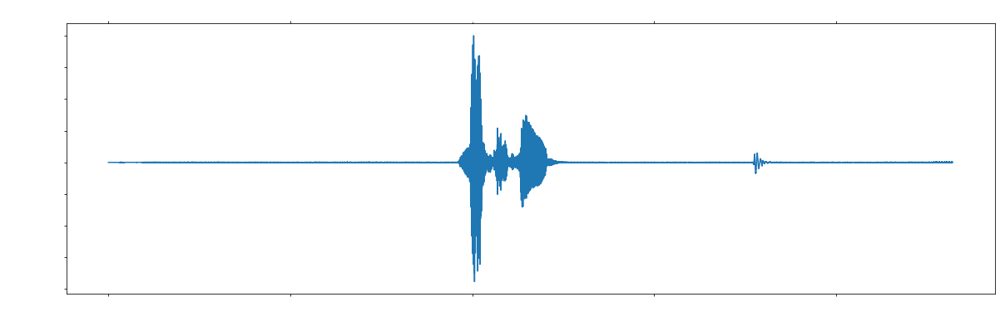

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 449280 bytes, expected 449316 bytes from header.
  sr, wav = wavfile.read(wav_loc)


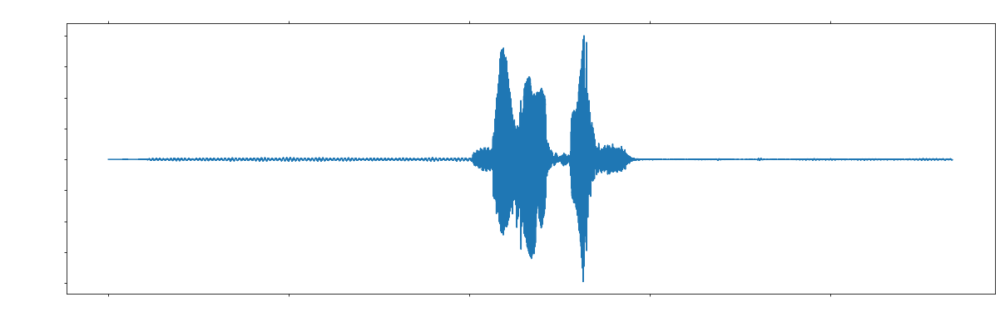

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 445440 bytes, expected 445476 bytes from header.
  sr, wav = wavfile.read(wav_loc)


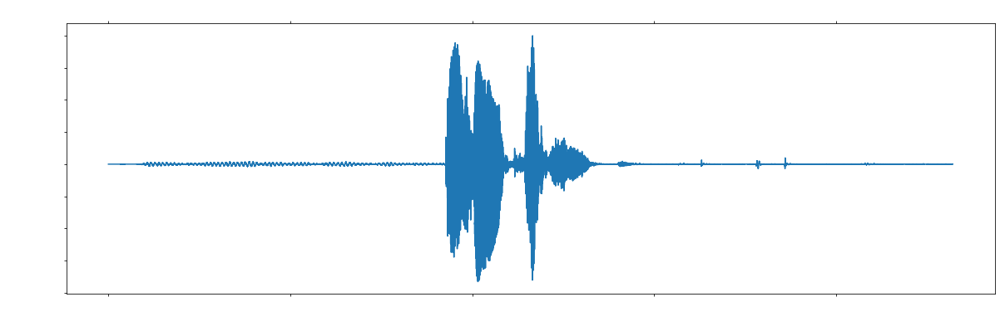

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 453120 bytes, expected 453156 bytes from header.
  sr, wav = wavfile.read(wav_loc)


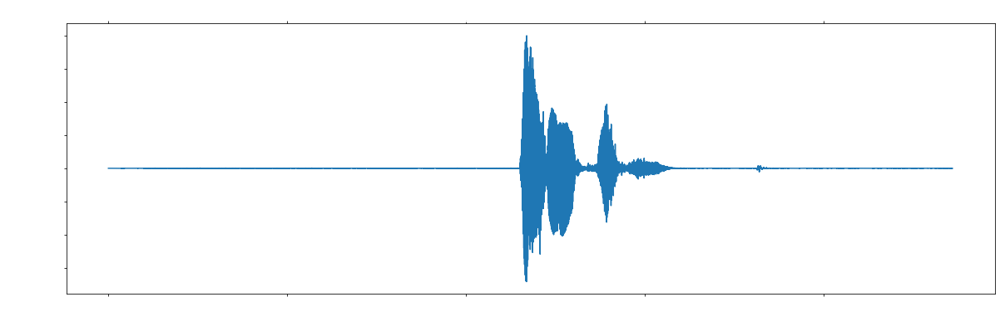

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 491520 bytes, expected 491556 bytes from header.
  sr, wav = wavfile.read(wav_loc)


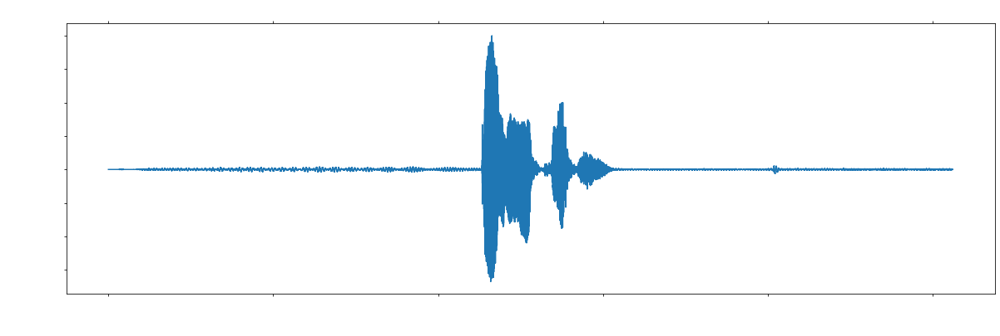

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 391680 bytes, expected 391716 bytes from header.
  sr, wav = wavfile.read(wav_loc)


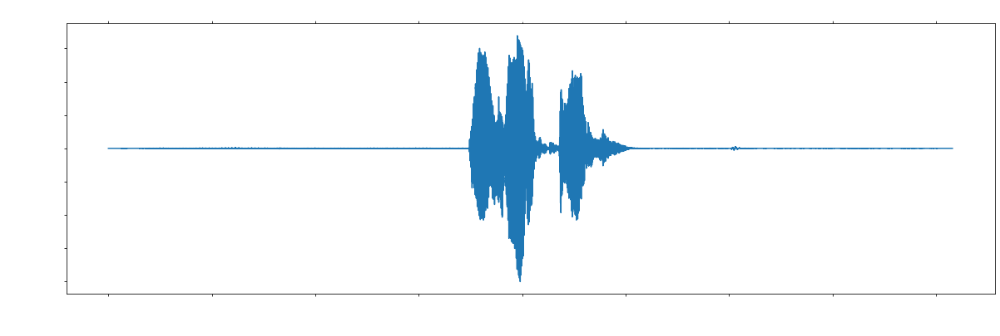

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 395520 bytes, expected 395556 bytes from header.
  sr, wav = wavfile.read(wav_loc)


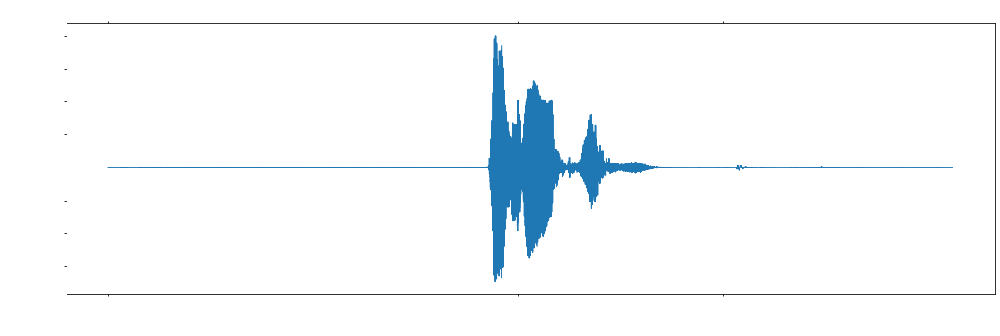

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 376320 bytes, expected 376356 bytes from header.
  sr, wav = wavfile.read(wav_loc)


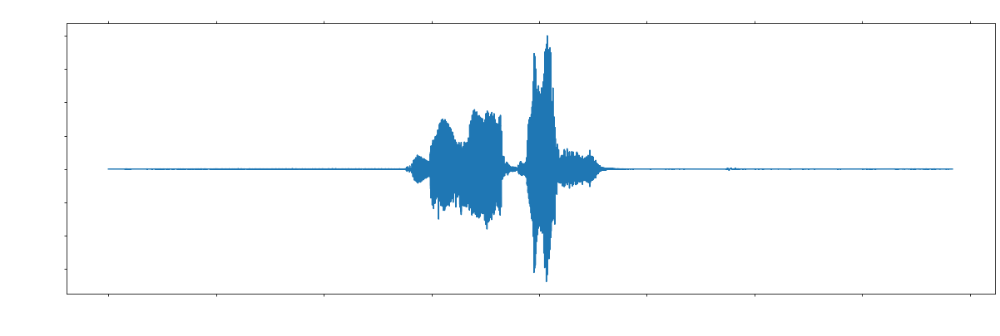

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 426240 bytes, expected 426276 bytes from header.
  sr, wav = wavfile.read(wav_loc)


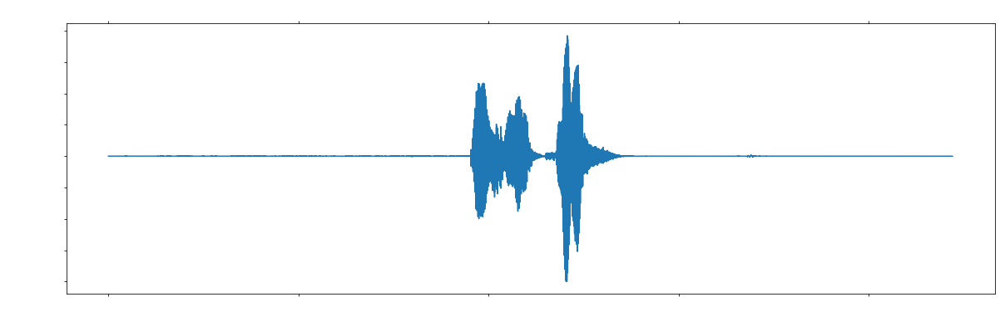

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 391680 bytes, expected 391716 bytes from header.
  sr, wav = wavfile.read(wav_loc)


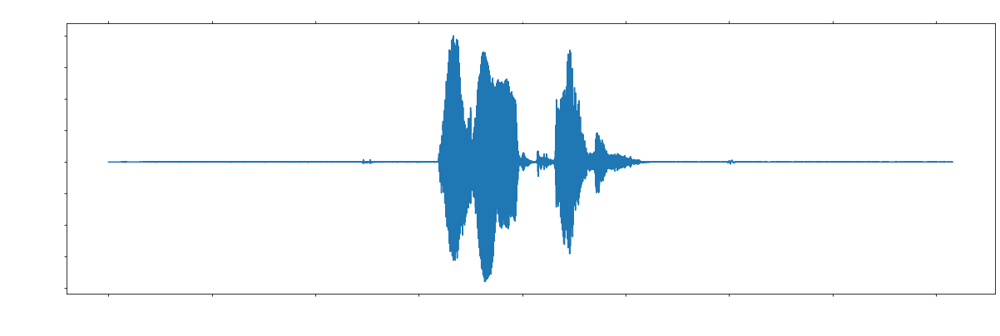

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 380160 bytes, expected 380196 bytes from header.
  sr, wav = wavfile.read(wav_loc)


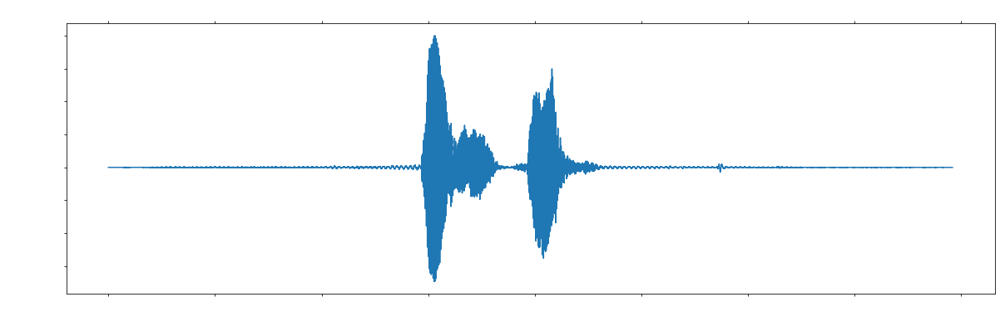

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 395520 bytes, expected 395556 bytes from header.
  sr, wav = wavfile.read(wav_loc)


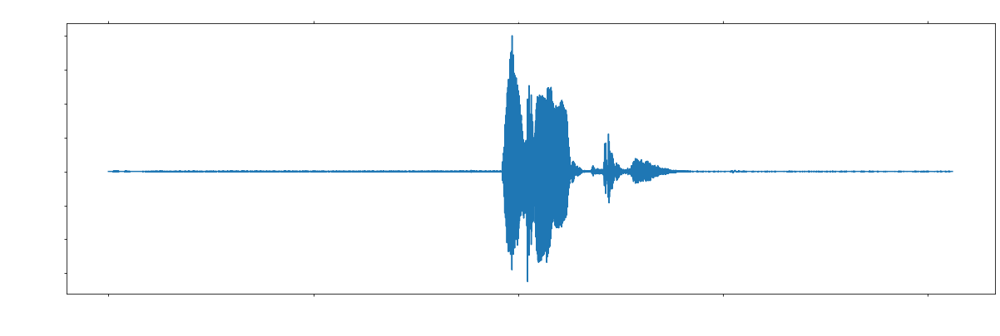

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 403200 bytes, expected 403236 bytes from header.
  sr, wav = wavfile.read(wav_loc)


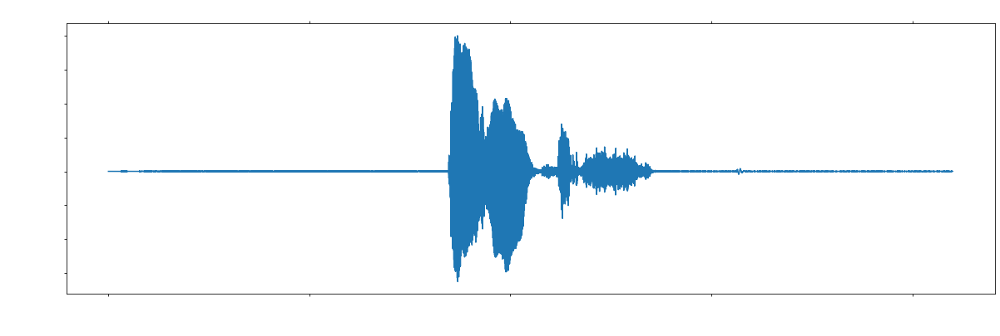

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 395520 bytes, expected 395556 bytes from header.
  sr, wav = wavfile.read(wav_loc)


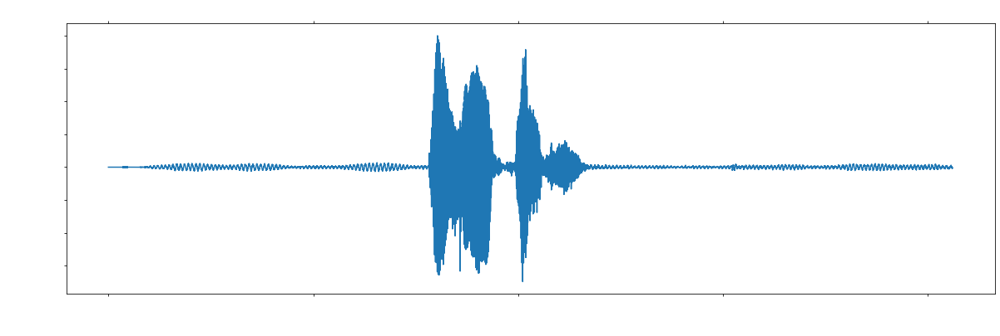

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 368640 bytes, expected 368676 bytes from header.
  sr, wav = wavfile.read(wav_loc)


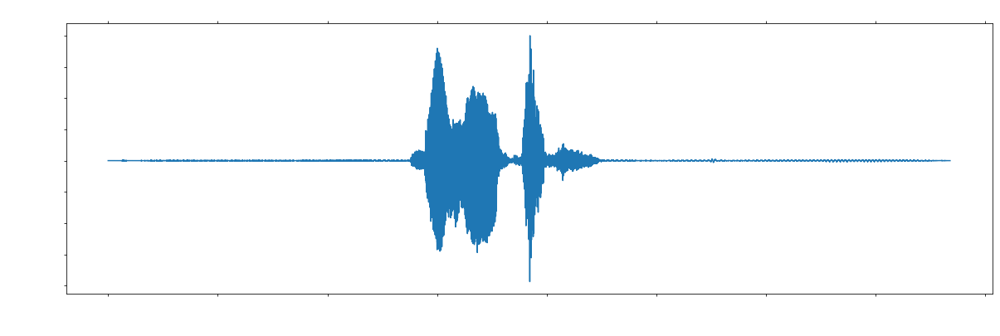

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 422400 bytes, expected 422436 bytes from header.
  sr, wav = wavfile.read(wav_loc)


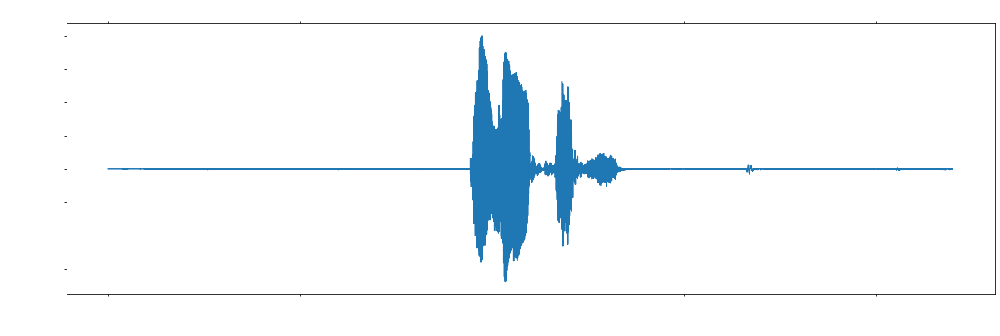

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 426240 bytes, expected 426276 bytes from header.
  sr, wav = wavfile.read(wav_loc)


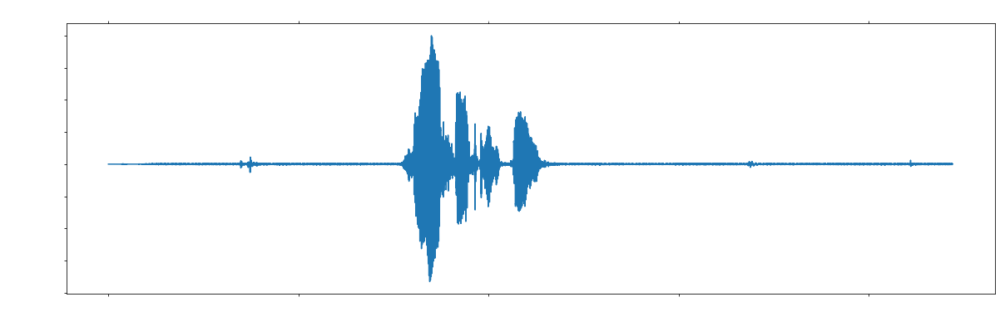

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 468480 bytes, expected 468516 bytes from header.
  sr, wav = wavfile.read(wav_loc)


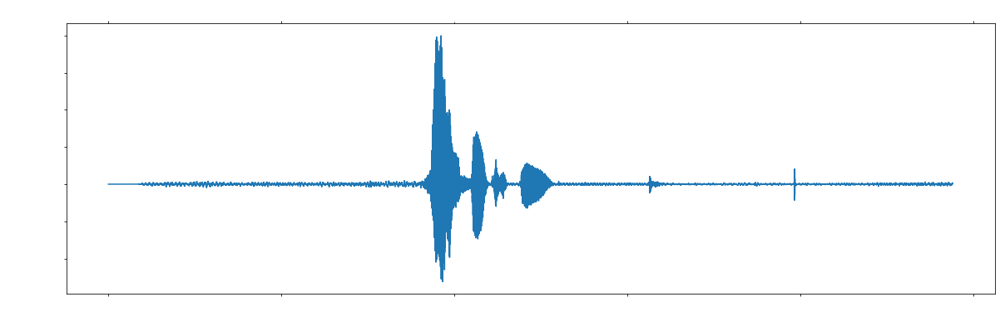

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 426240 bytes, expected 426276 bytes from header.
  sr, wav = wavfile.read(wav_loc)


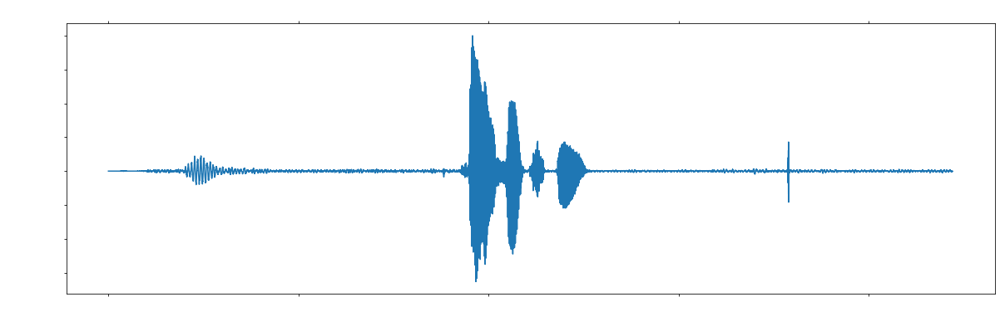

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 476160 bytes, expected 476196 bytes from header.
  sr, wav = wavfile.read(wav_loc)


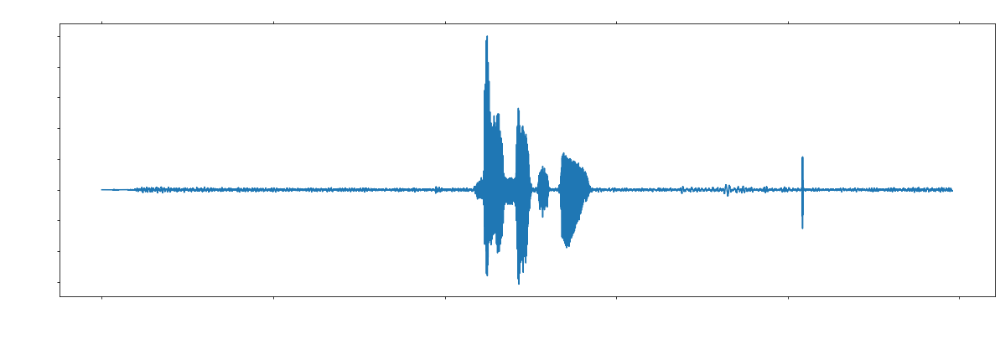

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 441600 bytes, expected 441636 bytes from header.
  sr, wav = wavfile.read(wav_loc)


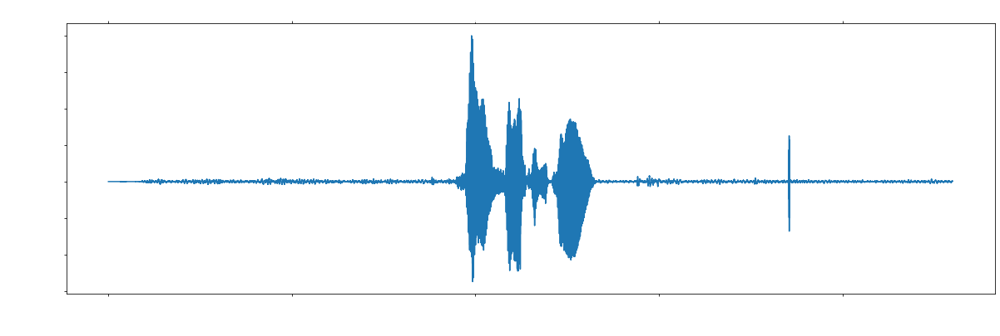

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 464640 bytes, expected 464676 bytes from header.
  sr, wav = wavfile.read(wav_loc)


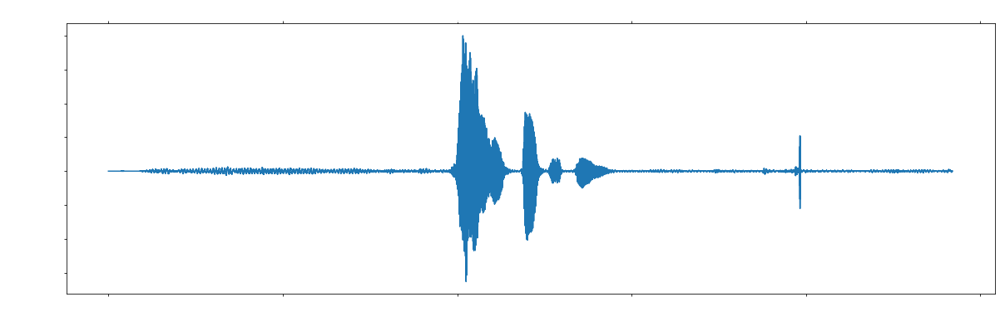

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 480000 bytes, expected 480036 bytes from header.
  sr, wav = wavfile.read(wav_loc)


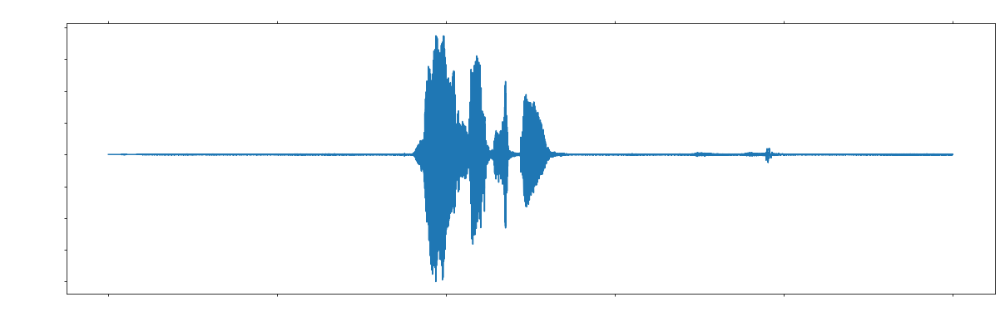

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 522240 bytes, expected 522276 bytes from header.
  sr, wav = wavfile.read(wav_loc)


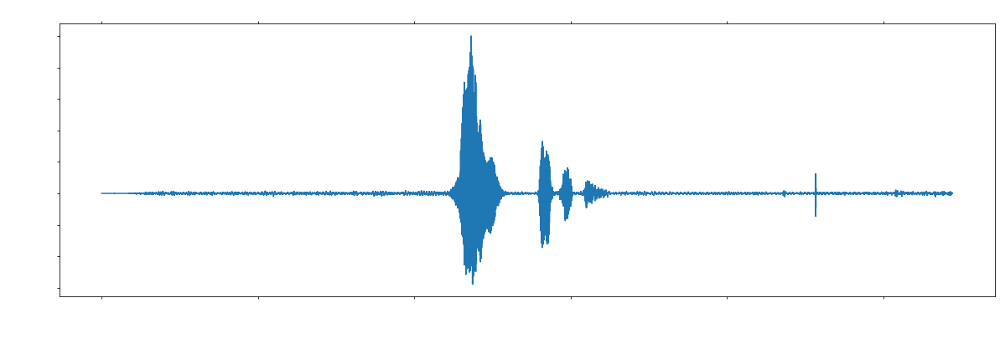

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 456960 bytes, expected 456996 bytes from header.
  sr, wav = wavfile.read(wav_loc)


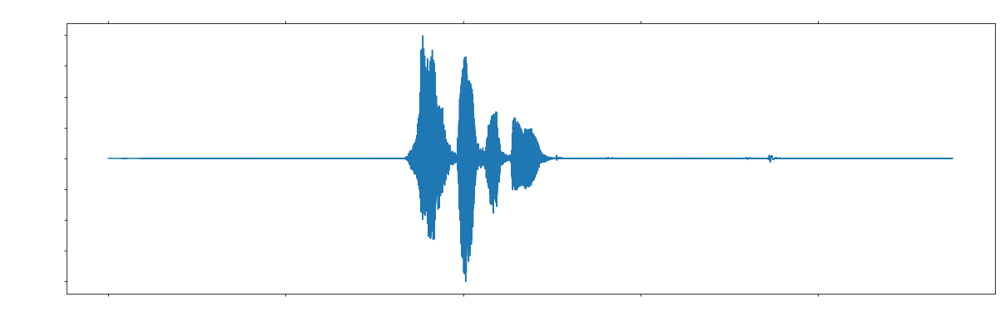

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 483840 bytes, expected 483876 bytes from header.
  sr, wav = wavfile.read(wav_loc)


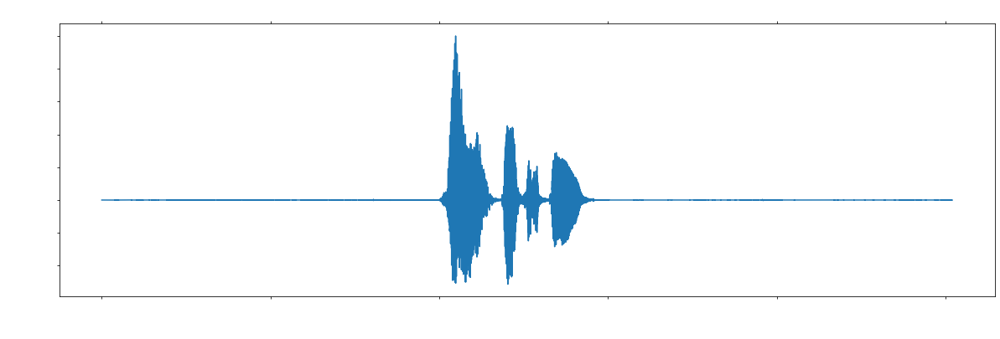

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 456960 bytes, expected 456996 bytes from header.
  sr, wav = wavfile.read(wav_loc)


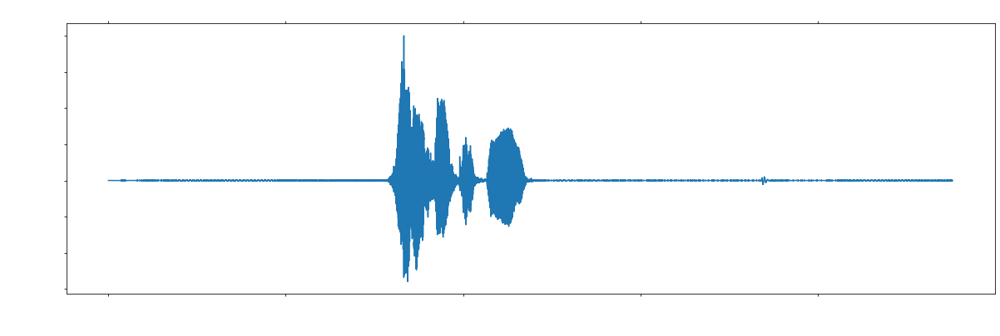

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 526080 bytes, expected 526116 bytes from header.
  sr, wav = wavfile.read(wav_loc)


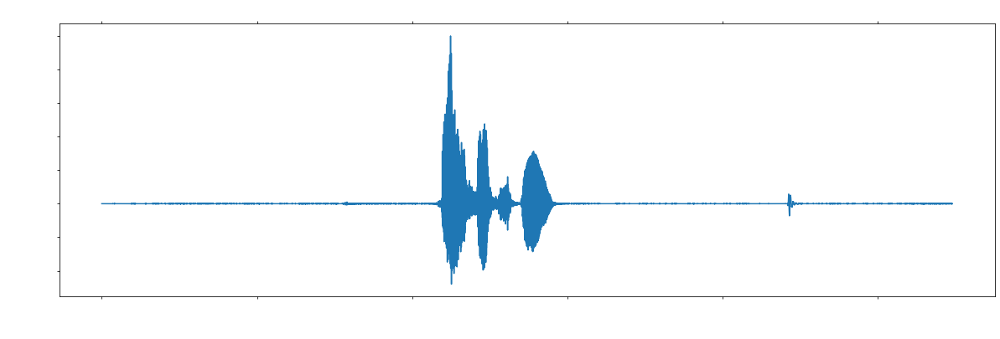

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 491520 bytes, expected 491556 bytes from header.
  sr, wav = wavfile.read(wav_loc)


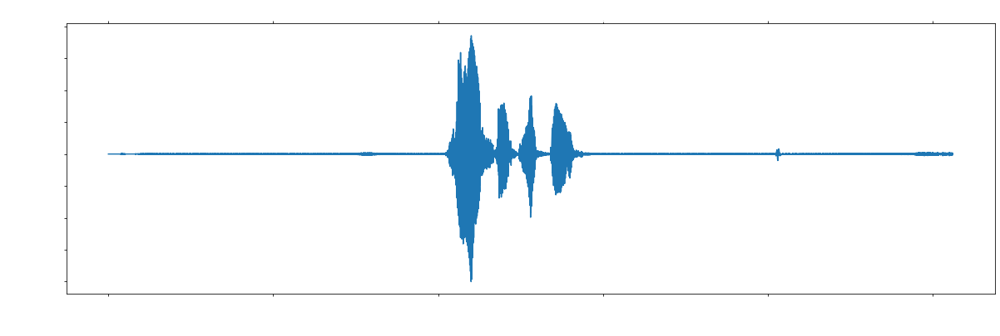

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 460800 bytes, expected 460836 bytes from header.
  sr, wav = wavfile.read(wav_loc)


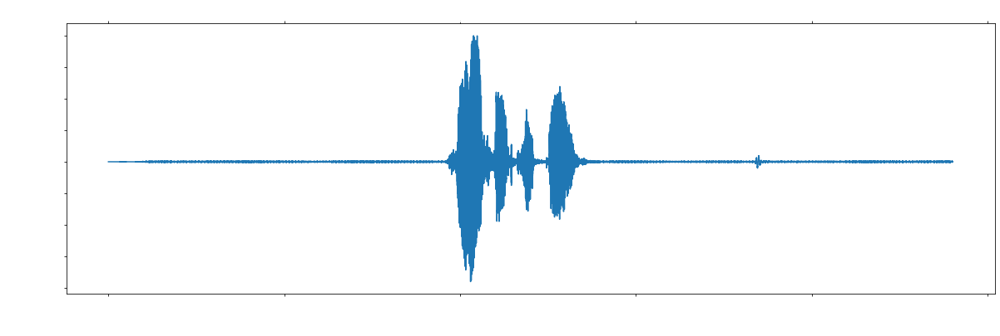

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 526080 bytes, expected 526116 bytes from header.
  sr, wav = wavfile.read(wav_loc)


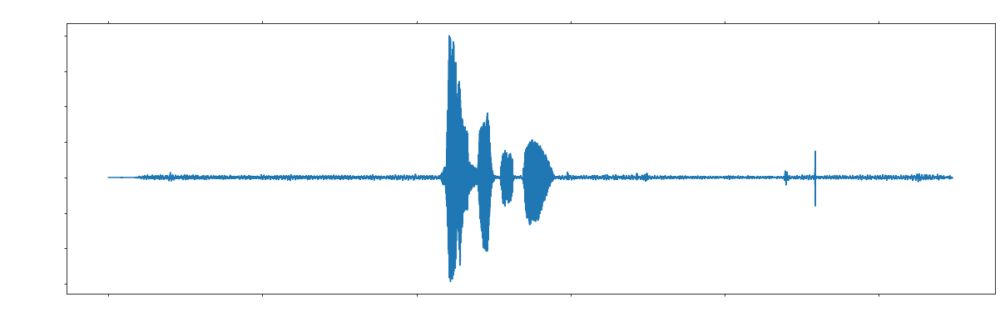

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 522240 bytes, expected 522276 bytes from header.
  sr, wav = wavfile.read(wav_loc)


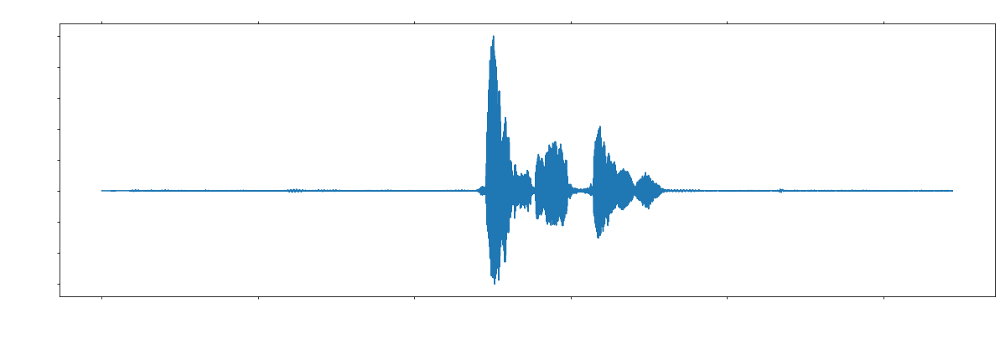

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 526080 bytes, expected 526116 bytes from header.
  sr, wav = wavfile.read(wav_loc)


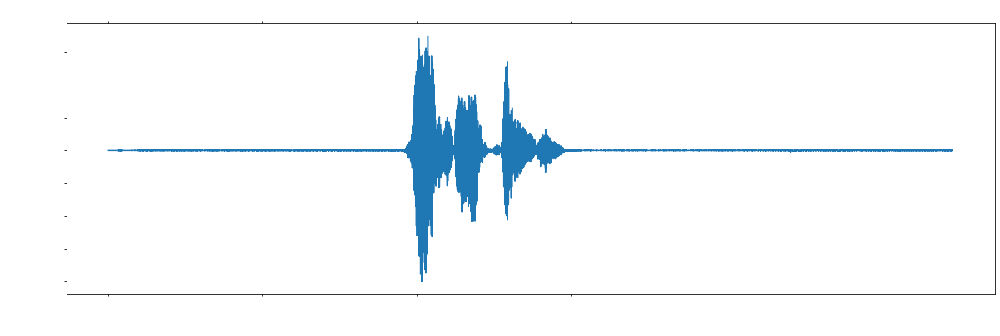

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 449280 bytes, expected 449316 bytes from header.
  sr, wav = wavfile.read(wav_loc)


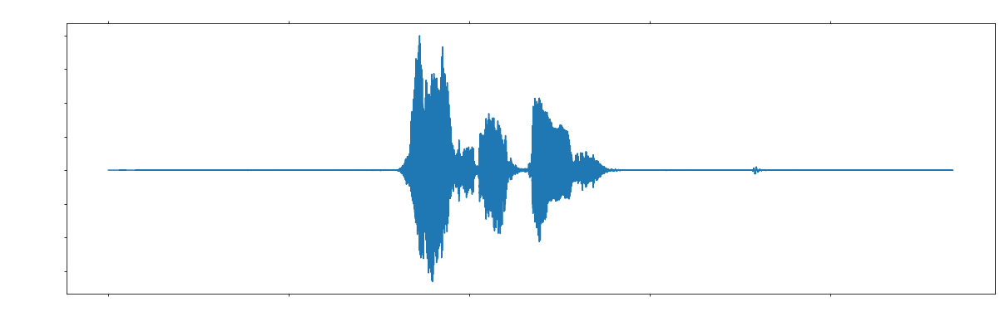

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 430080 bytes, expected 430116 bytes from header.
  sr, wav = wavfile.read(wav_loc)


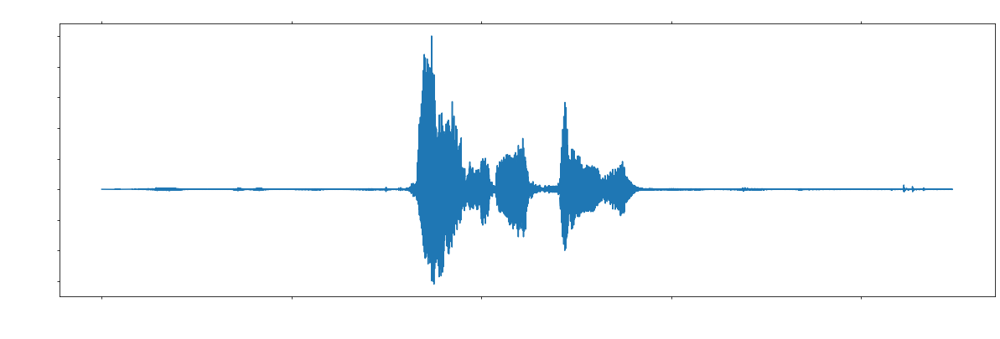

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 437760 bytes, expected 437796 bytes from header.
  sr, wav = wavfile.read(wav_loc)


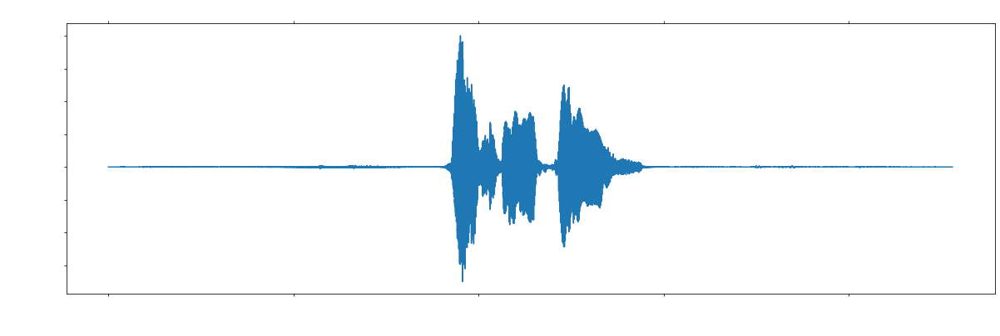

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 552960 bytes, expected 552996 bytes from header.
  sr, wav = wavfile.read(wav_loc)


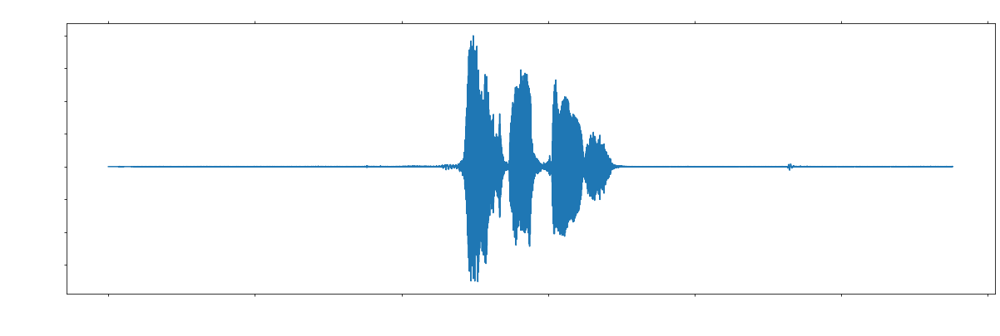

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 426240 bytes, expected 426276 bytes from header.
  sr, wav = wavfile.read(wav_loc)


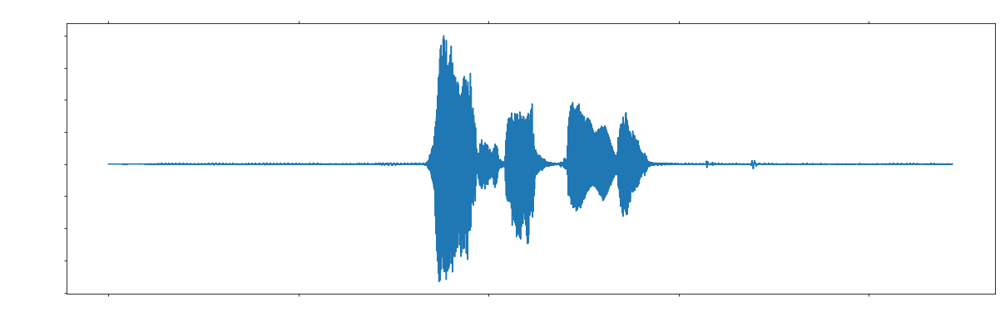

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 422400 bytes, expected 422436 bytes from header.
  sr, wav = wavfile.read(wav_loc)


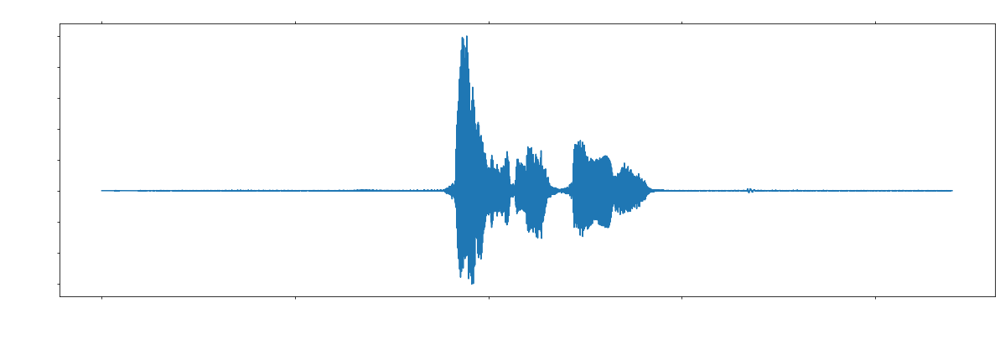

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 503040 bytes, expected 503076 bytes from header.
  sr, wav = wavfile.read(wav_loc)


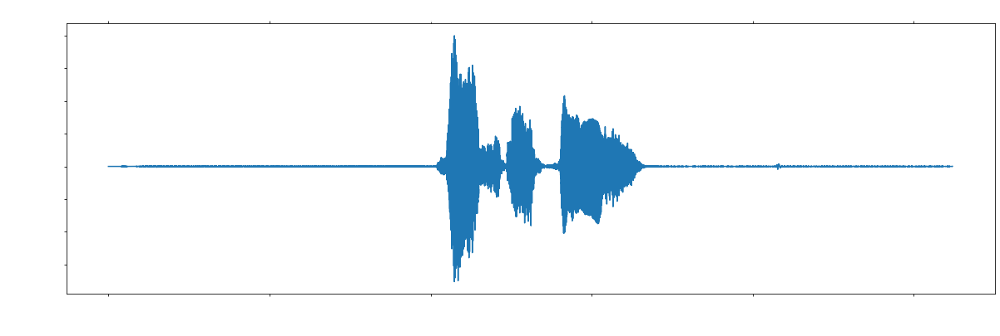

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 487680 bytes, expected 487716 bytes from header.
  sr, wav = wavfile.read(wav_loc)


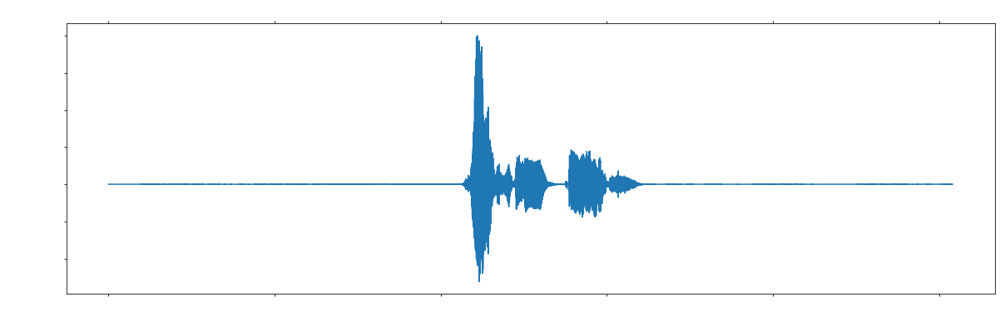

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 472320 bytes, expected 472356 bytes from header.
  sr, wav = wavfile.read(wav_loc)


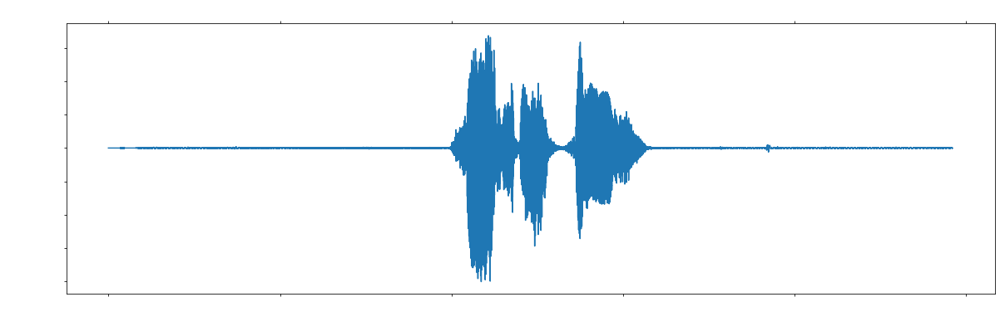

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 506880 bytes, expected 506916 bytes from header.
  sr, wav = wavfile.read(wav_loc)


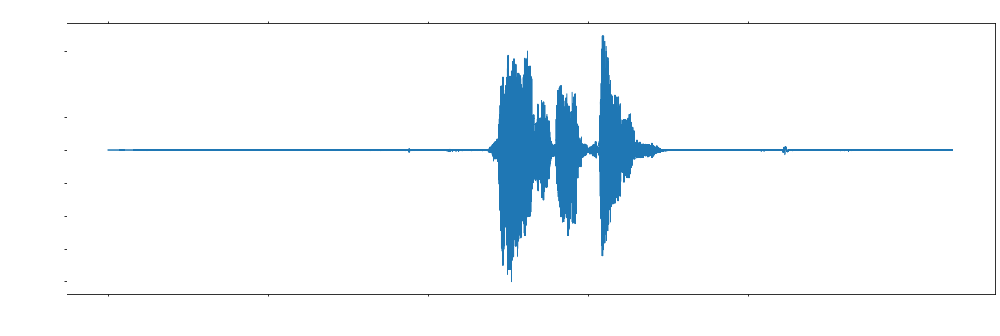

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 433920 bytes, expected 433956 bytes from header.
  sr, wav = wavfile.read(wav_loc)


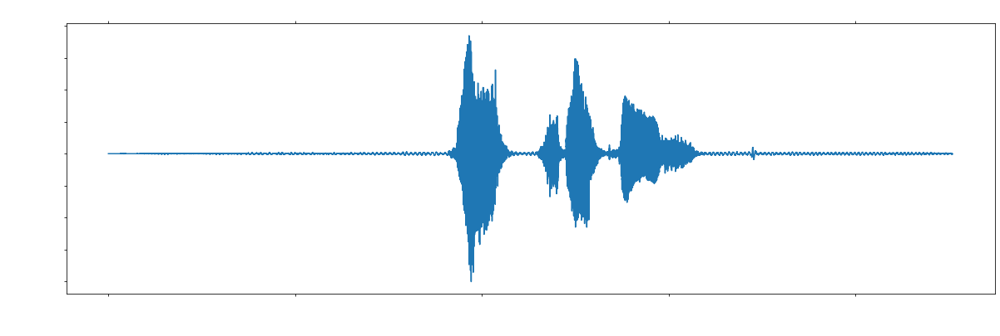

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 437760 bytes, expected 437796 bytes from header.
  sr, wav = wavfile.read(wav_loc)


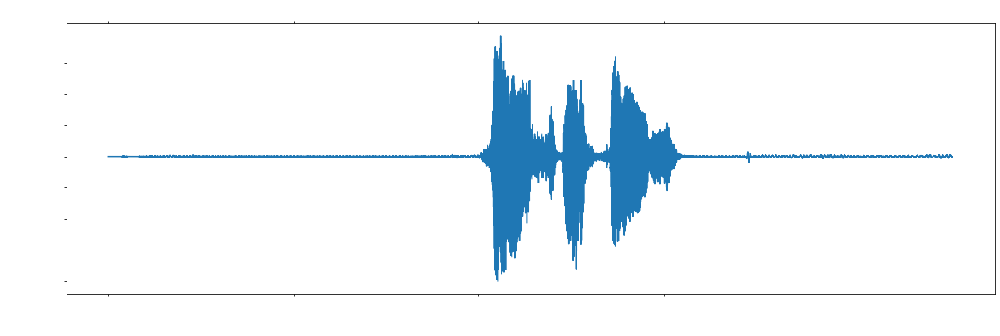

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 453120 bytes, expected 453156 bytes from header.
  sr, wav = wavfile.read(wav_loc)


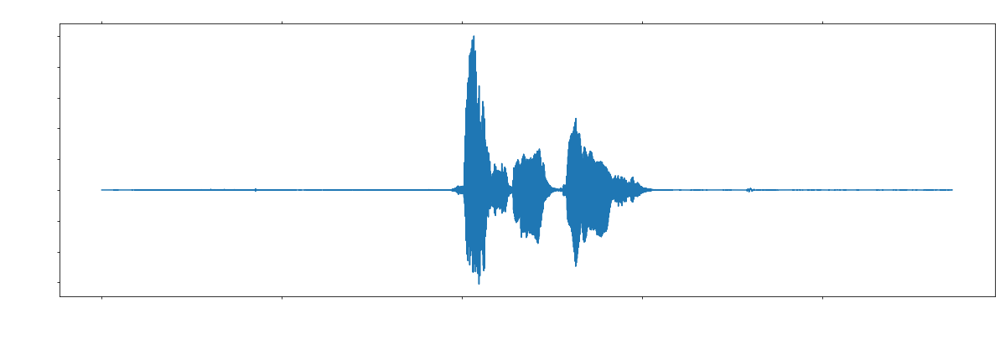

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 430080 bytes, expected 430116 bytes from header.
  sr, wav = wavfile.read(wav_loc)


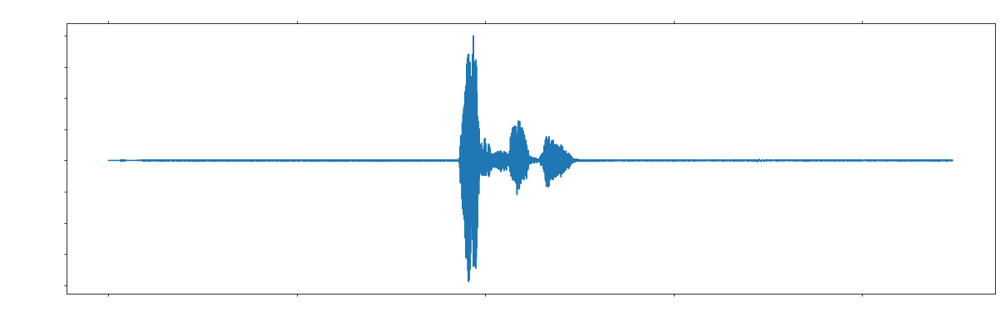

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 384000 bytes, expected 384036 bytes from header.
  sr, wav = wavfile.read(wav_loc)


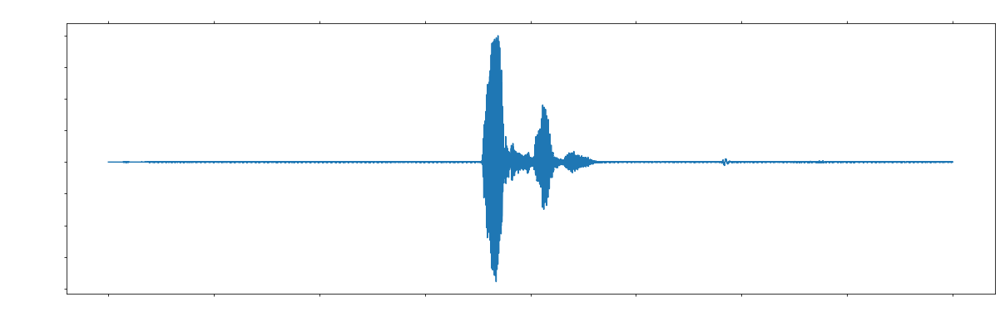

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 426240 bytes, expected 426276 bytes from header.
  sr, wav = wavfile.read(wav_loc)


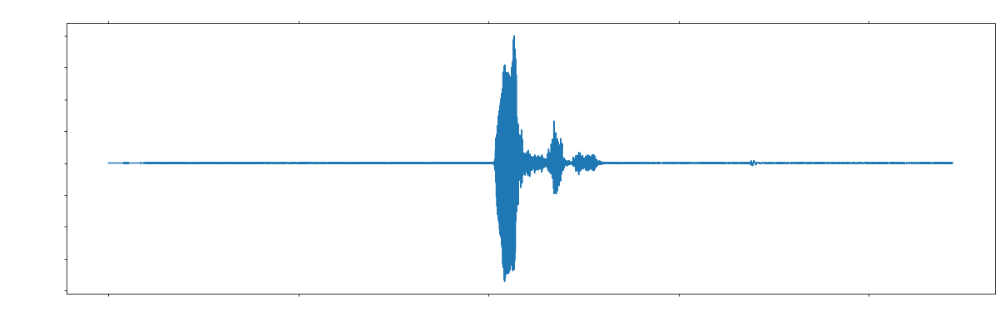

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 391680 bytes, expected 391716 bytes from header.
  sr, wav = wavfile.read(wav_loc)


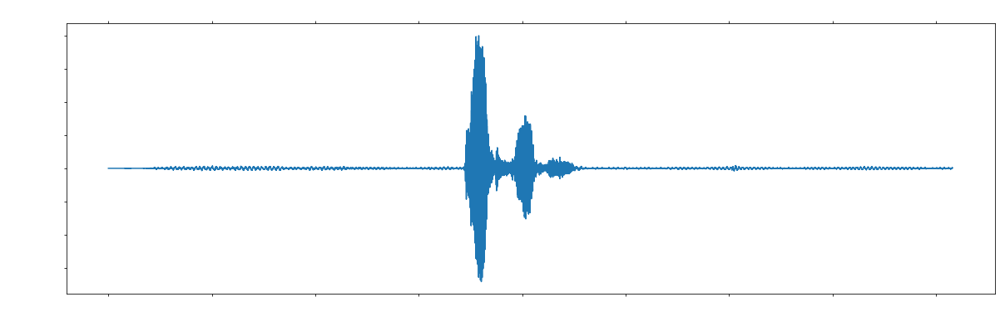

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 380160 bytes, expected 380196 bytes from header.
  sr, wav = wavfile.read(wav_loc)


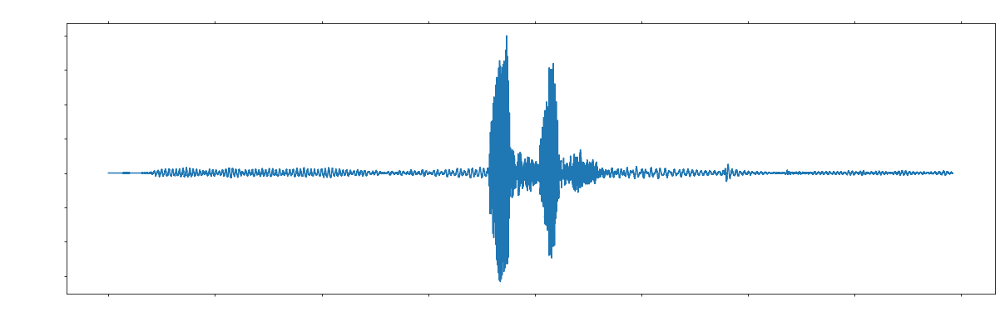

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 353280 bytes, expected 353316 bytes from header.
  sr, wav = wavfile.read(wav_loc)


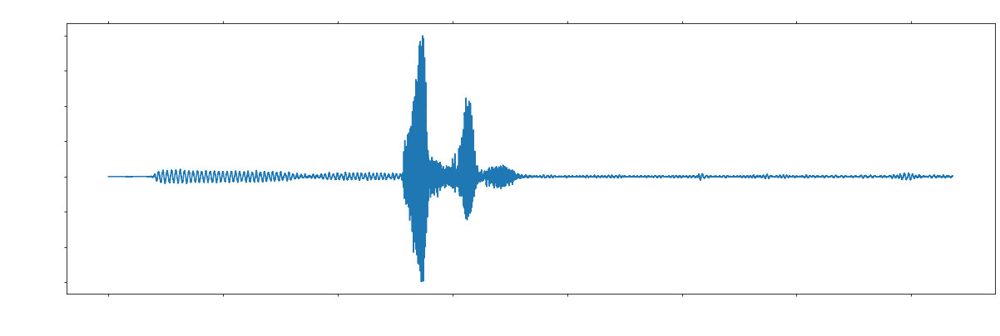

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 410880 bytes, expected 410916 bytes from header.
  sr, wav = wavfile.read(wav_loc)


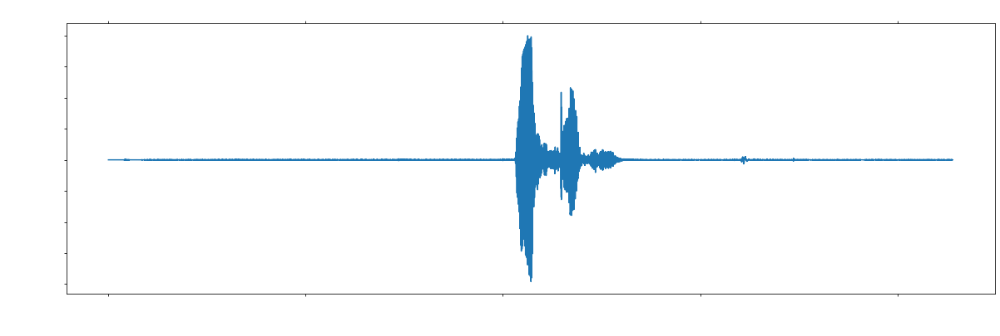

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 368640 bytes, expected 368676 bytes from header.
  sr, wav = wavfile.read(wav_loc)


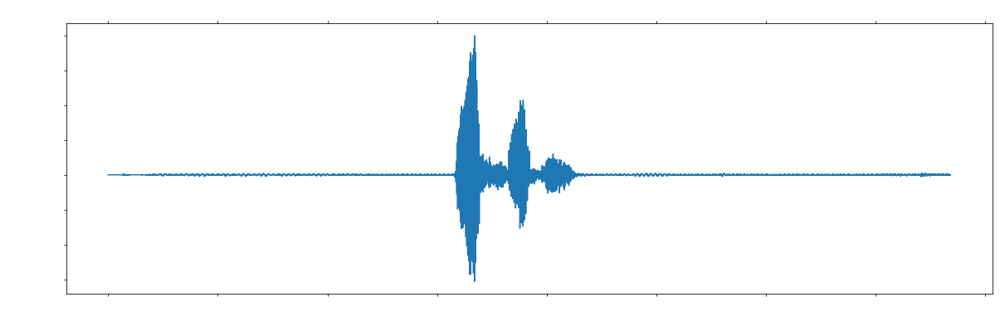

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 376320 bytes, expected 376356 bytes from header.
  sr, wav = wavfile.read(wav_loc)


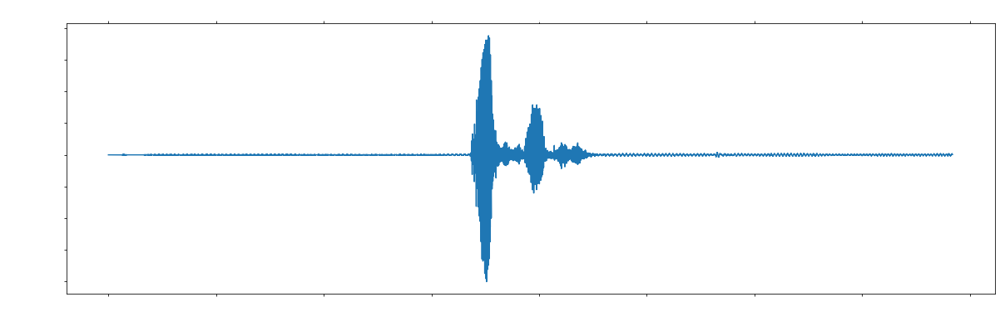

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 368640 bytes, expected 368676 bytes from header.
  sr, wav = wavfile.read(wav_loc)


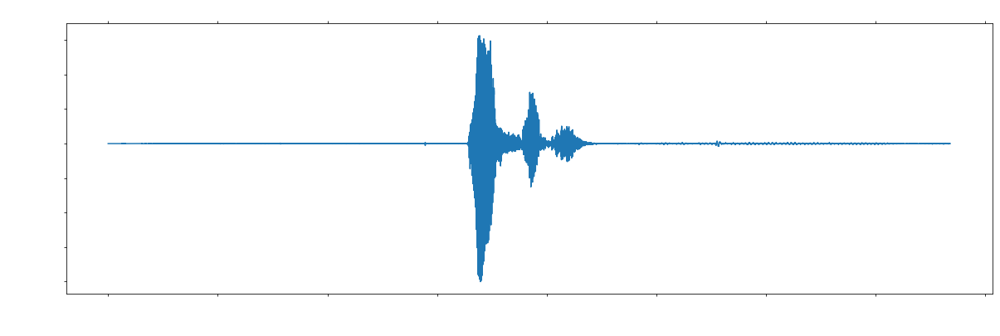

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 410880 bytes, expected 410916 bytes from header.
  sr, wav = wavfile.read(wav_loc)


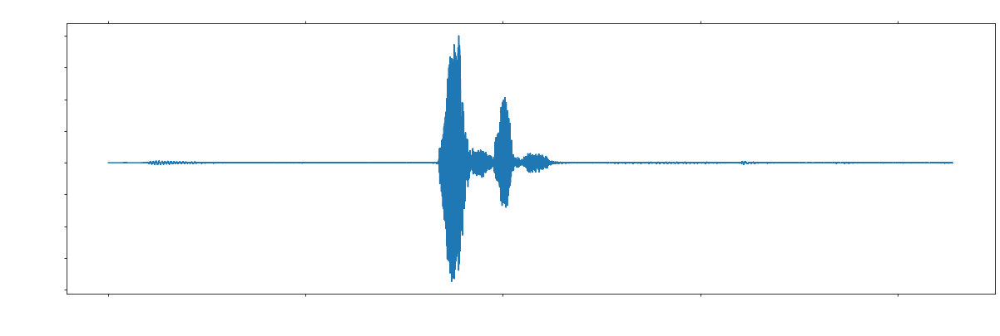

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 395520 bytes, expected 395556 bytes from header.
  sr, wav = wavfile.read(wav_loc)


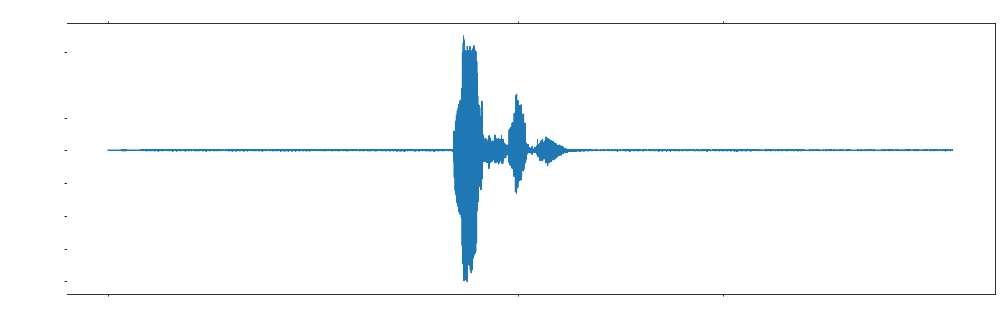

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 387840 bytes, expected 387876 bytes from header.
  sr, wav = wavfile.read(wav_loc)


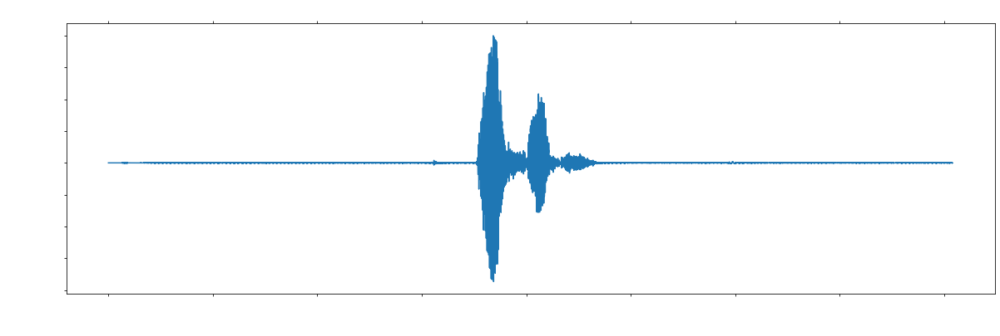

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 391680 bytes, expected 391716 bytes from header.
  sr, wav = wavfile.read(wav_loc)


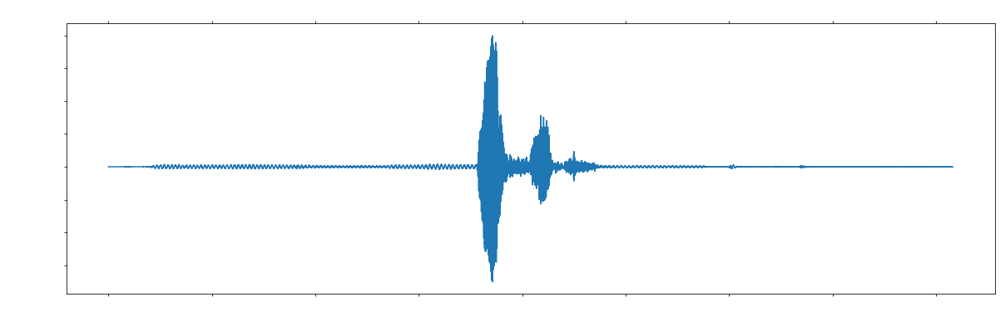

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 410880 bytes, expected 410916 bytes from header.
  sr, wav = wavfile.read(wav_loc)


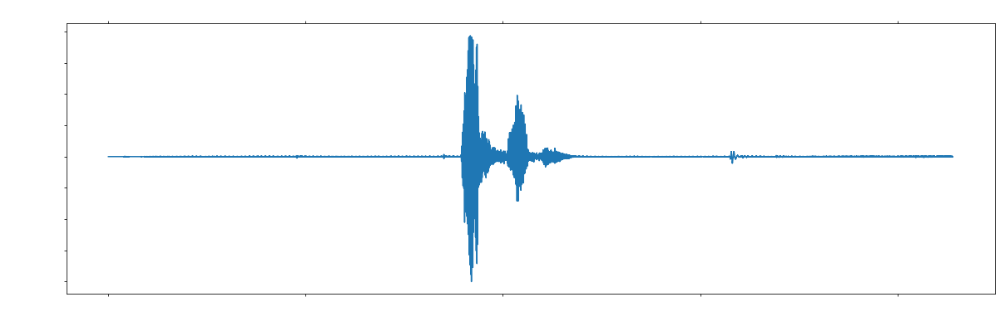

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 441600 bytes, expected 441636 bytes from header.
  sr, wav = wavfile.read(wav_loc)


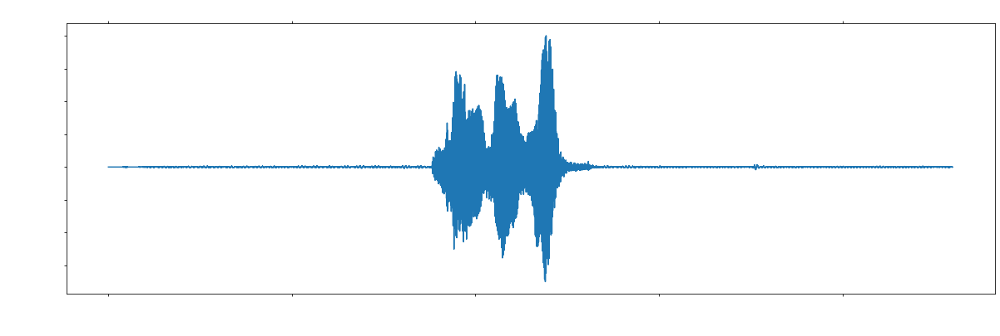

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 453120 bytes, expected 453156 bytes from header.
  sr, wav = wavfile.read(wav_loc)


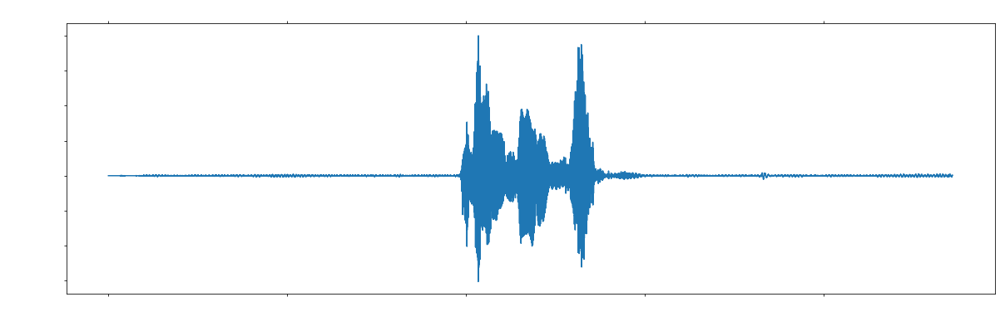

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 453120 bytes, expected 453156 bytes from header.
  sr, wav = wavfile.read(wav_loc)


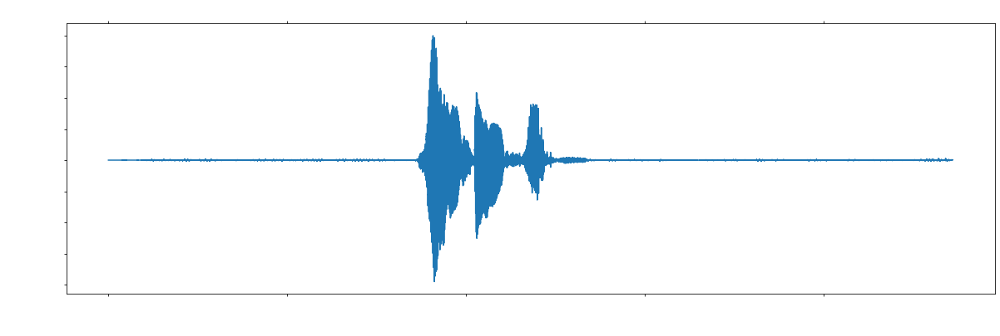

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 472320 bytes, expected 472356 bytes from header.
  sr, wav = wavfile.read(wav_loc)


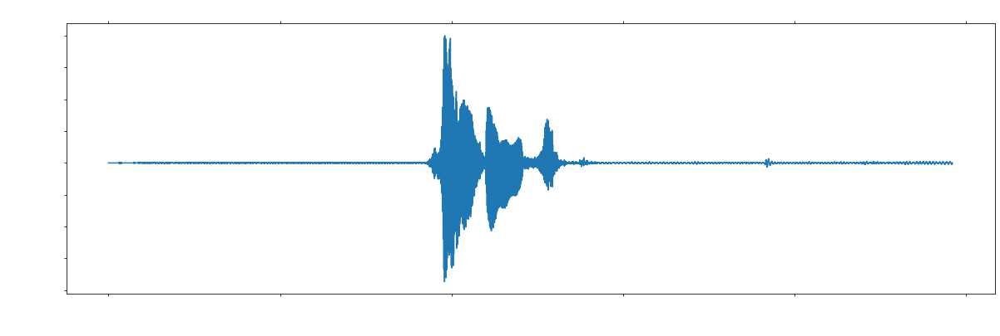

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 380160 bytes, expected 380196 bytes from header.
  sr, wav = wavfile.read(wav_loc)


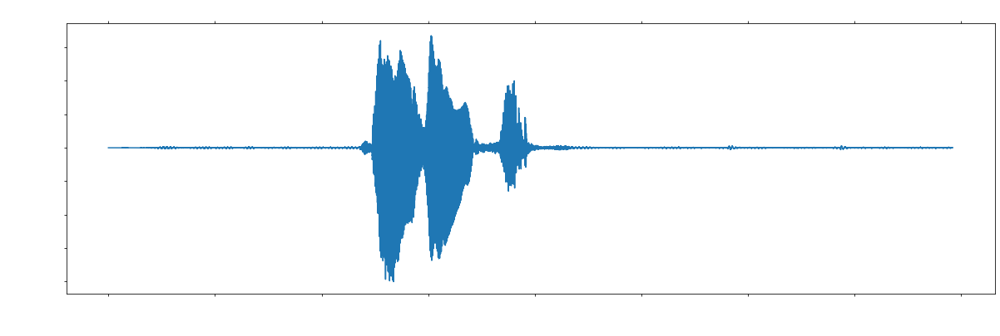

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 430080 bytes, expected 430116 bytes from header.
  sr, wav = wavfile.read(wav_loc)


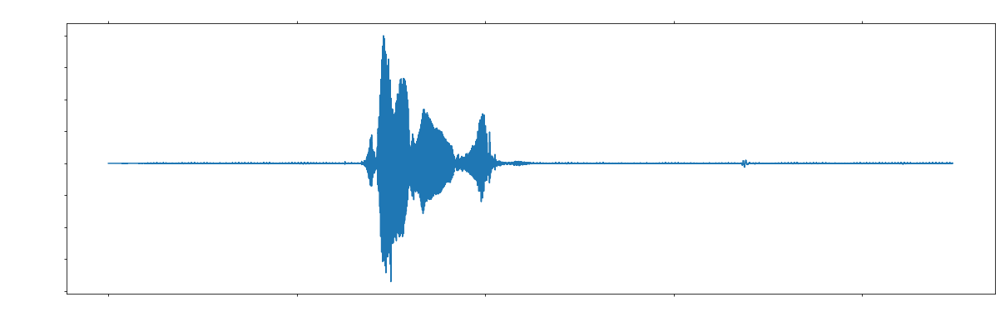

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 437760 bytes, expected 437796 bytes from header.
  sr, wav = wavfile.read(wav_loc)


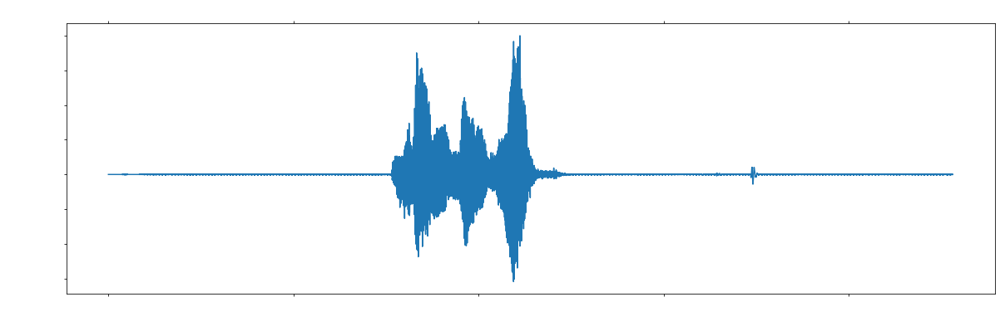

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 441600 bytes, expected 441636 bytes from header.
  sr, wav = wavfile.read(wav_loc)


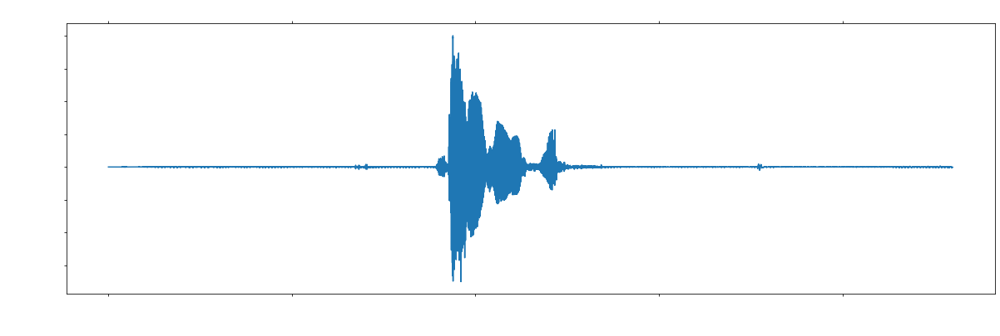

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 476160 bytes, expected 476196 bytes from header.
  sr, wav = wavfile.read(wav_loc)


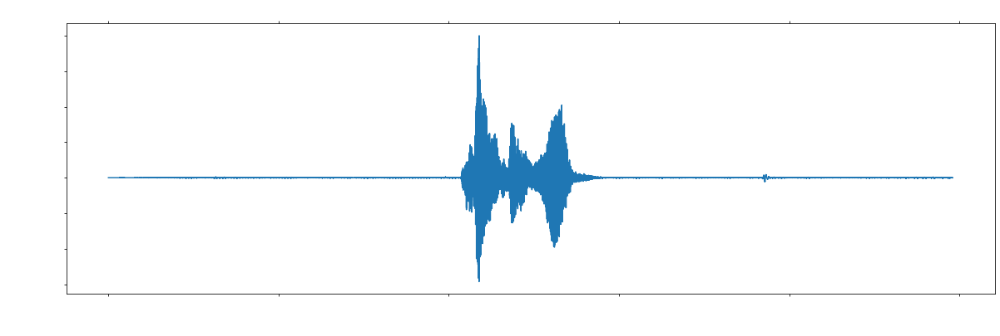

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 456960 bytes, expected 456996 bytes from header.
  sr, wav = wavfile.read(wav_loc)


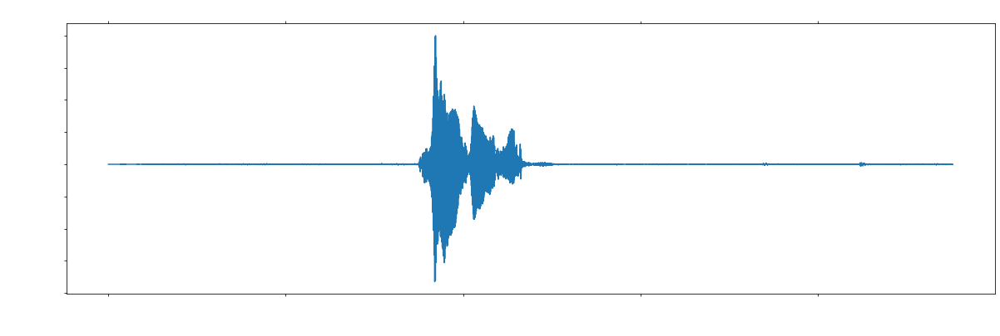

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 441600 bytes, expected 441636 bytes from header.
  sr, wav = wavfile.read(wav_loc)


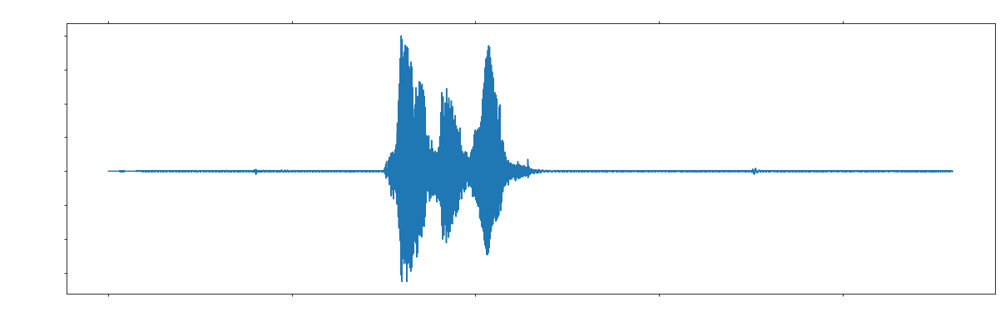

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 456960 bytes, expected 456996 bytes from header.
  sr, wav = wavfile.read(wav_loc)


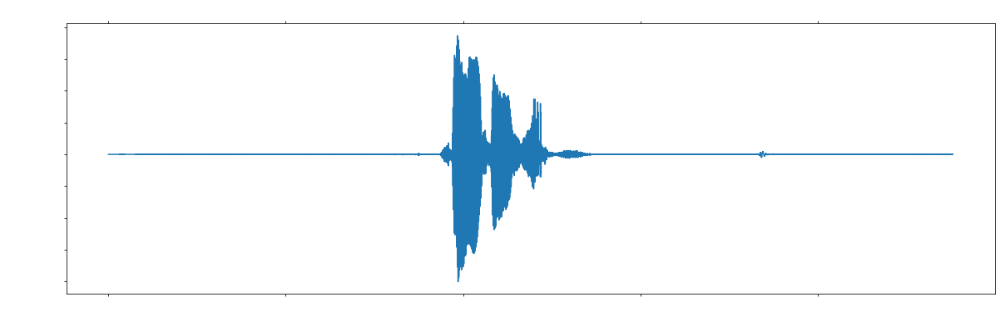

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 456960 bytes, expected 456996 bytes from header.
  sr, wav = wavfile.read(wav_loc)


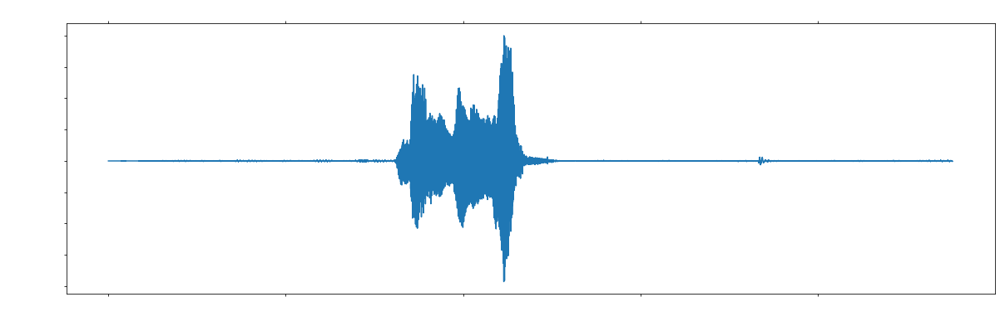

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 487680 bytes, expected 487716 bytes from header.
  sr, wav = wavfile.read(wav_loc)


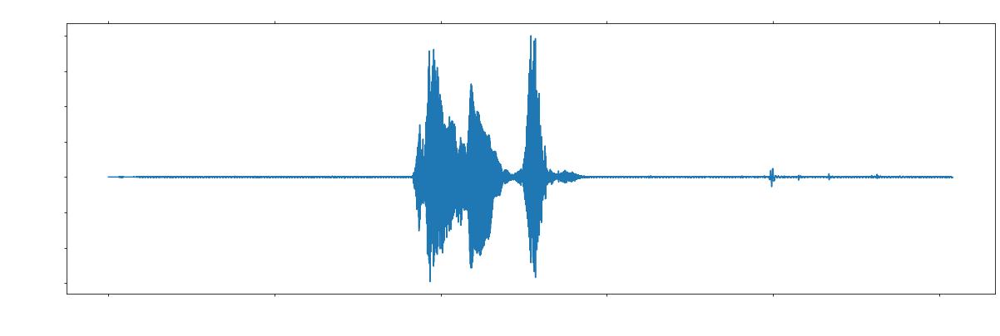

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 483840 bytes, expected 483876 bytes from header.
  sr, wav = wavfile.read(wav_loc)


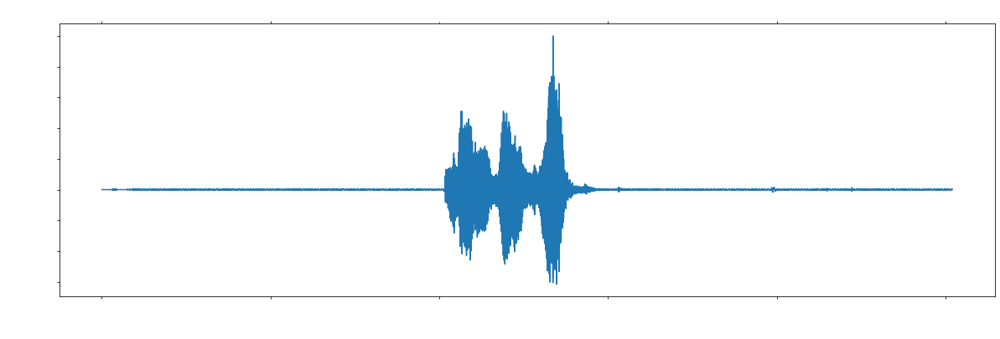

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 418560 bytes, expected 418596 bytes from header.
  sr, wav = wavfile.read(wav_loc)


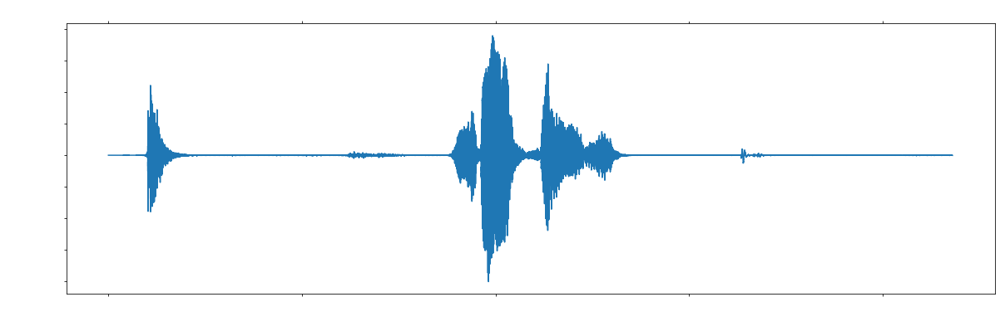

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 476160 bytes, expected 476196 bytes from header.
  sr, wav = wavfile.read(wav_loc)


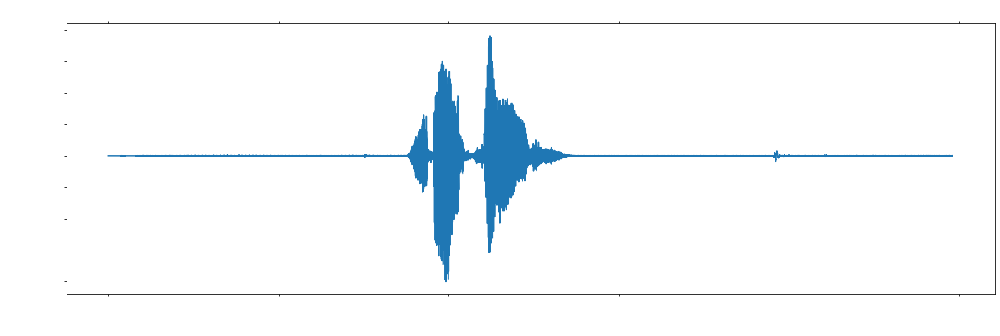

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 426240 bytes, expected 426276 bytes from header.
  sr, wav = wavfile.read(wav_loc)


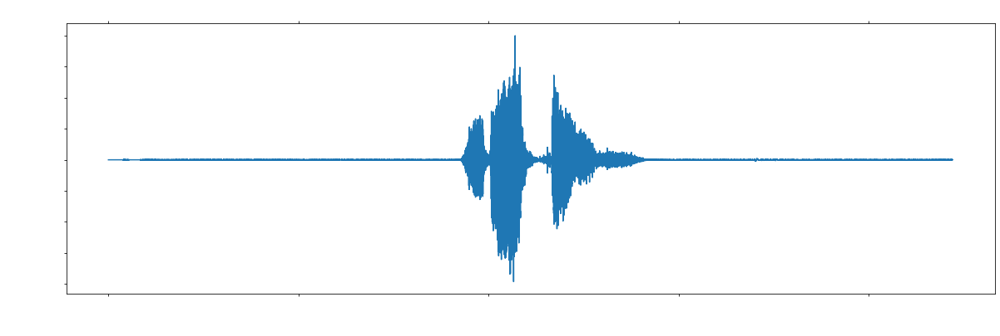

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 449280 bytes, expected 449316 bytes from header.
  sr, wav = wavfile.read(wav_loc)


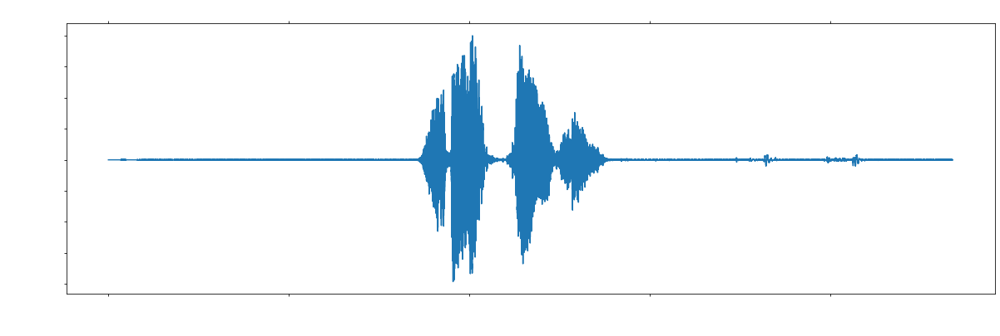

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 445440 bytes, expected 445476 bytes from header.
  sr, wav = wavfile.read(wav_loc)


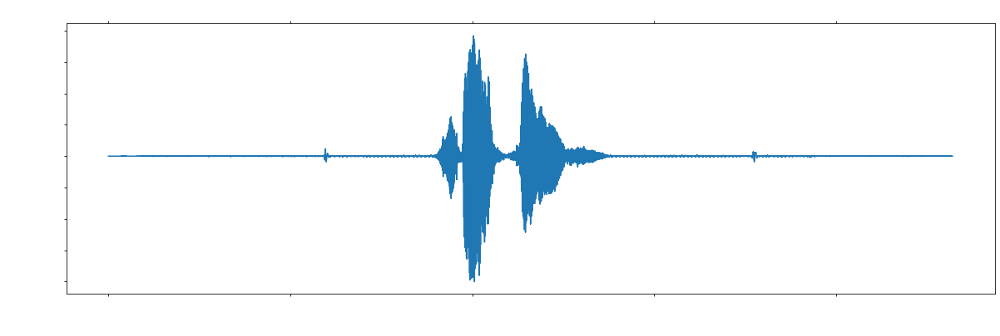

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 407040 bytes, expected 407076 bytes from header.
  sr, wav = wavfile.read(wav_loc)


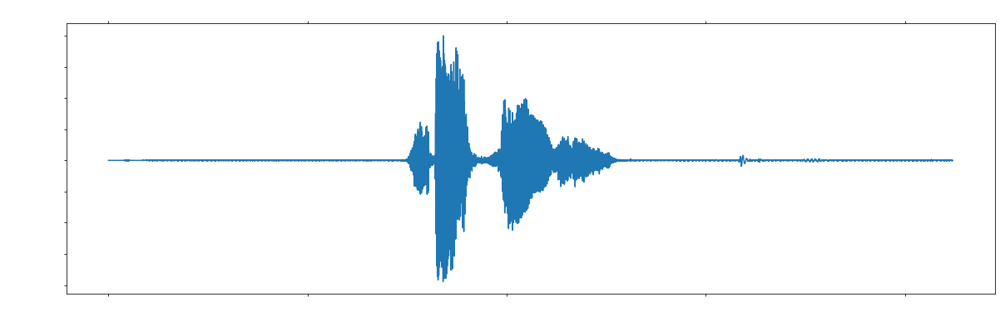

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 430080 bytes, expected 430116 bytes from header.
  sr, wav = wavfile.read(wav_loc)


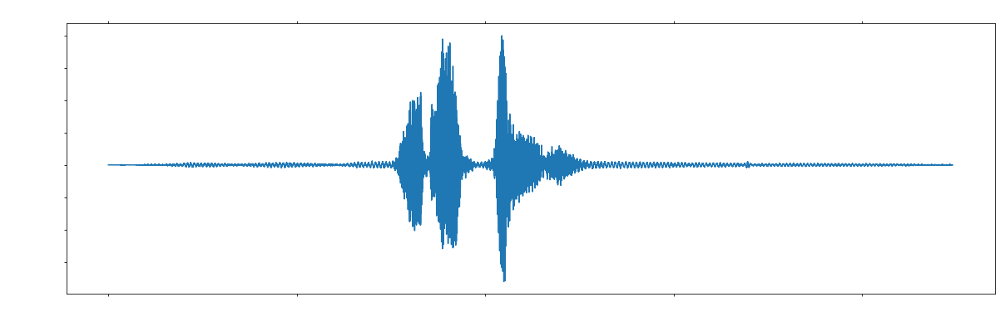

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 449280 bytes, expected 449316 bytes from header.
  sr, wav = wavfile.read(wav_loc)


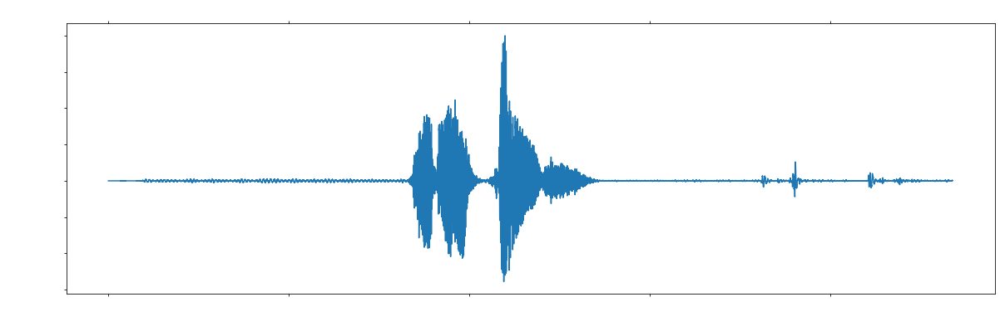

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 468480 bytes, expected 468516 bytes from header.
  sr, wav = wavfile.read(wav_loc)


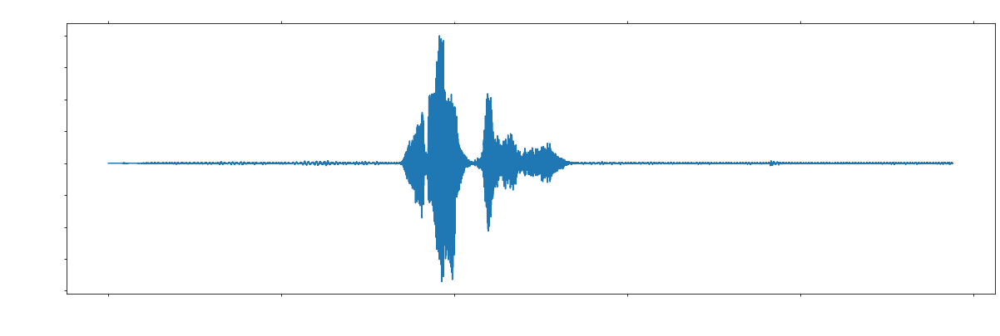

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 395520 bytes, expected 395556 bytes from header.
  sr, wav = wavfile.read(wav_loc)


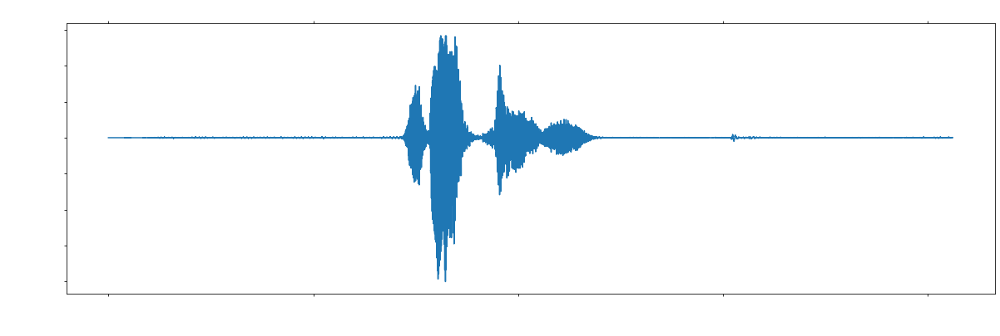

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 445440 bytes, expected 445476 bytes from header.
  sr, wav = wavfile.read(wav_loc)


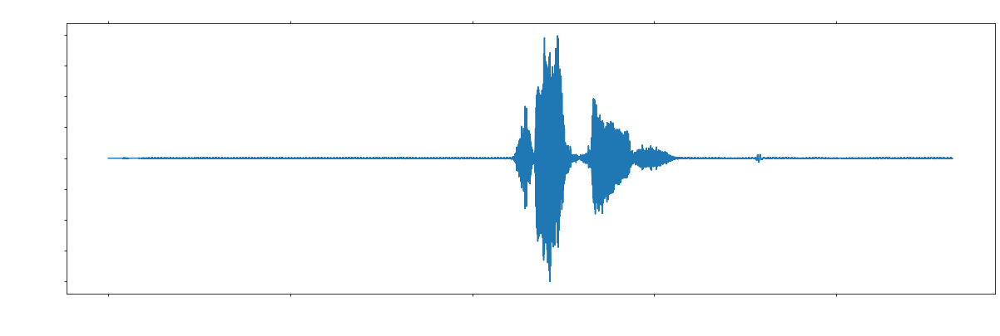

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 441600 bytes, expected 441636 bytes from header.
  sr, wav = wavfile.read(wav_loc)


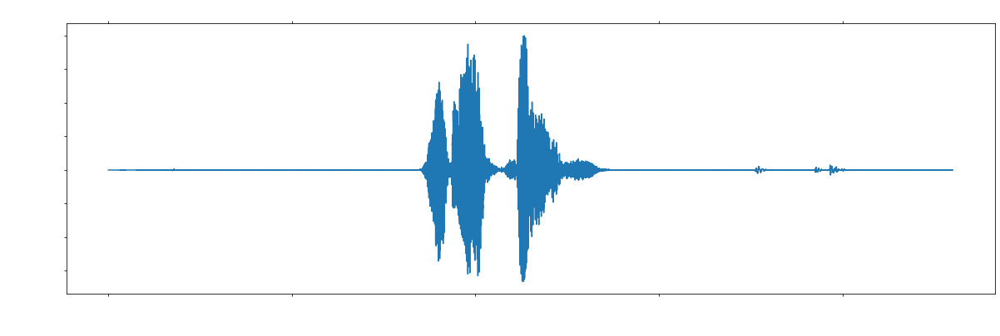

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 449280 bytes, expected 449316 bytes from header.
  sr, wav = wavfile.read(wav_loc)


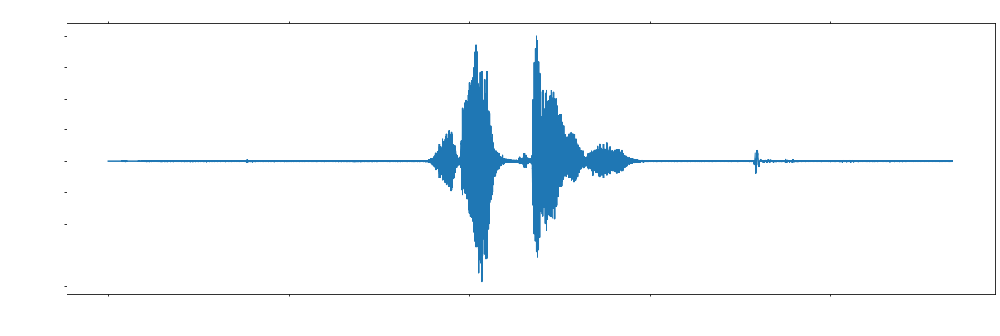

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 403200 bytes, expected 403236 bytes from header.
  sr, wav = wavfile.read(wav_loc)


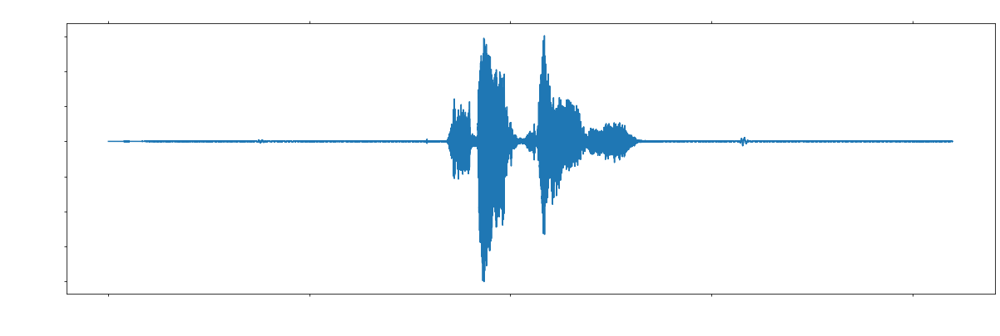

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 410880 bytes, expected 410916 bytes from header.
  sr, wav = wavfile.read(wav_loc)


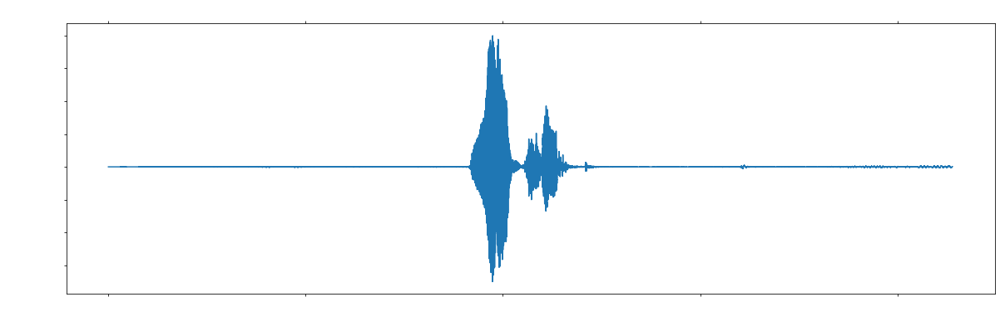

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 337920 bytes, expected 337956 bytes from header.
  sr, wav = wavfile.read(wav_loc)


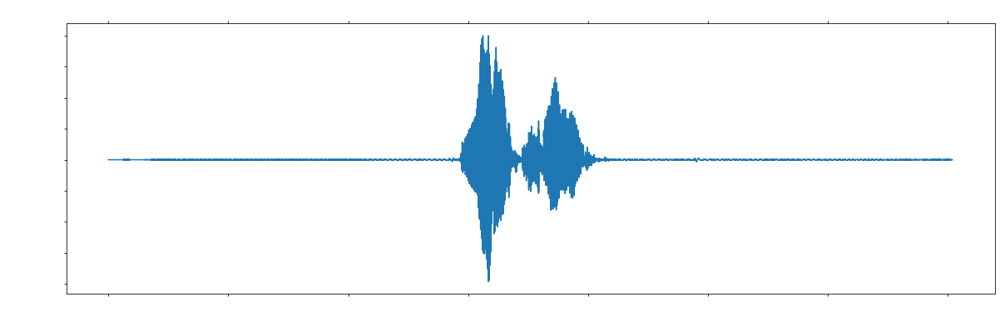

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 387840 bytes, expected 387876 bytes from header.
  sr, wav = wavfile.read(wav_loc)


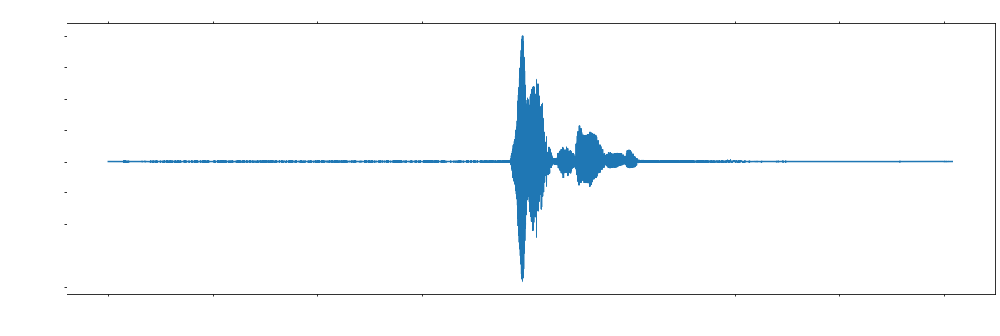

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 384000 bytes, expected 384036 bytes from header.
  sr, wav = wavfile.read(wav_loc)


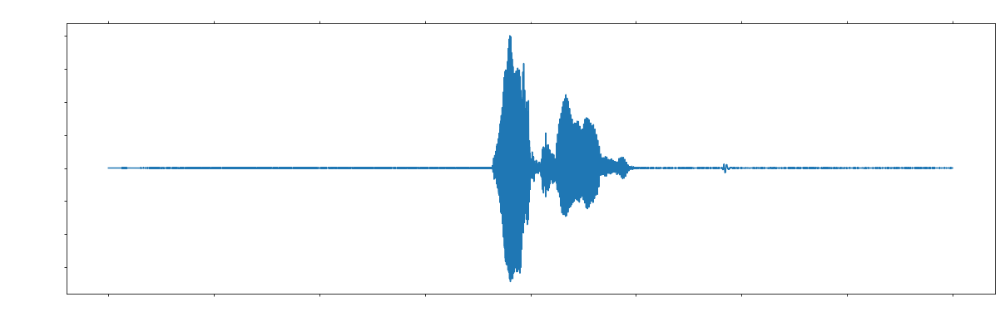

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 414720 bytes, expected 414756 bytes from header.
  sr, wav = wavfile.read(wav_loc)


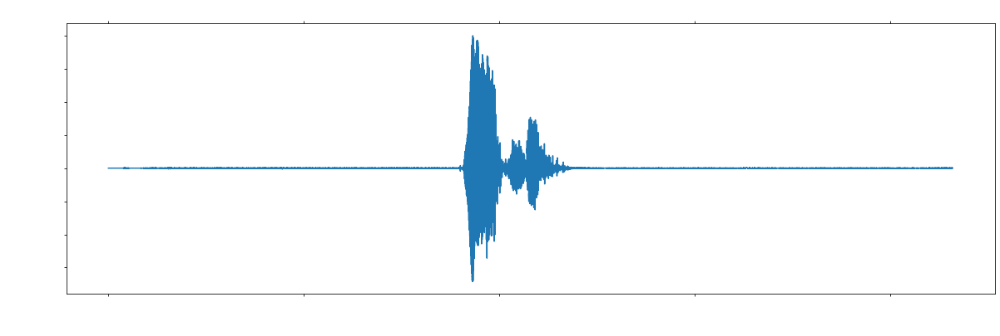

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 384000 bytes, expected 384036 bytes from header.
  sr, wav = wavfile.read(wav_loc)


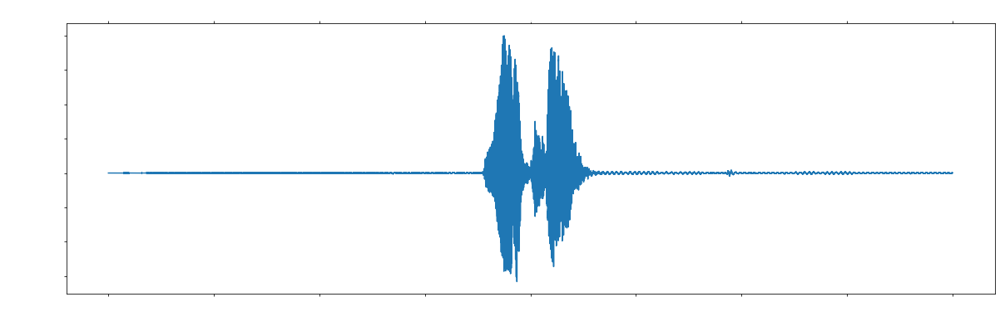

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 380160 bytes, expected 380196 bytes from header.
  sr, wav = wavfile.read(wav_loc)


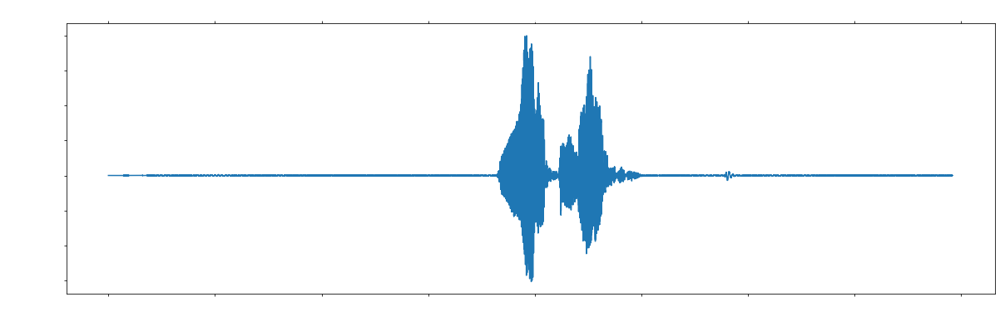

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 353280 bytes, expected 353316 bytes from header.
  sr, wav = wavfile.read(wav_loc)


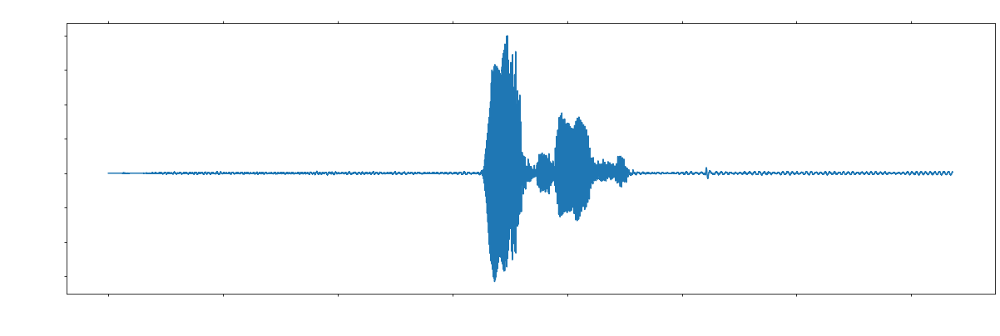

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 334080 bytes, expected 334116 bytes from header.
  sr, wav = wavfile.read(wav_loc)


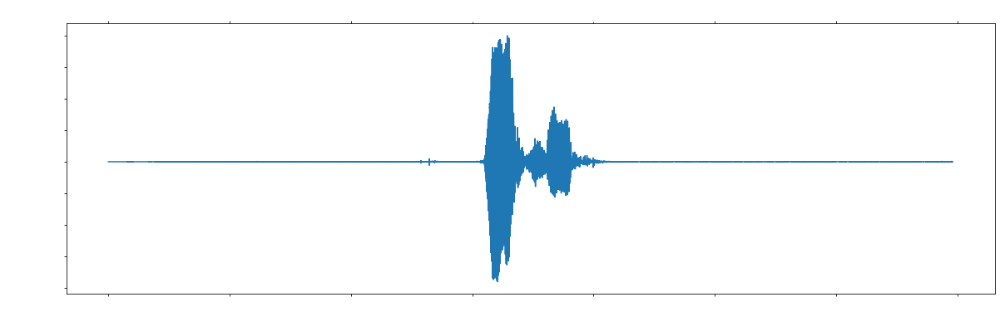

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 399360 bytes, expected 399396 bytes from header.
  sr, wav = wavfile.read(wav_loc)


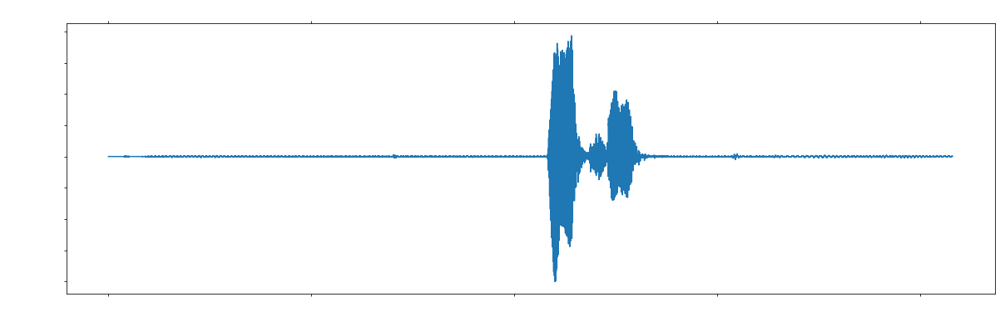

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 399360 bytes, expected 399396 bytes from header.
  sr, wav = wavfile.read(wav_loc)


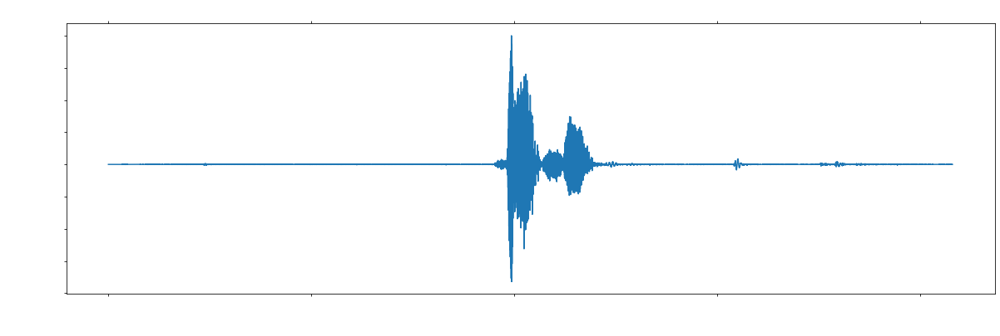

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 441600 bytes, expected 441636 bytes from header.
  sr, wav = wavfile.read(wav_loc)


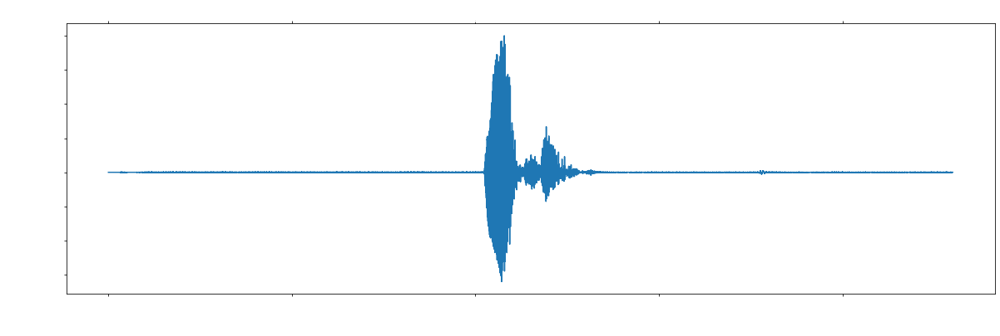

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 357120 bytes, expected 357156 bytes from header.
  sr, wav = wavfile.read(wav_loc)


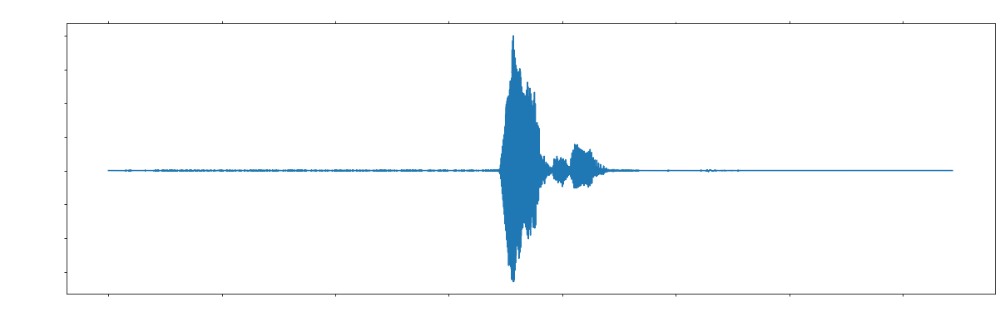

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 353280 bytes, expected 353316 bytes from header.
  sr, wav = wavfile.read(wav_loc)


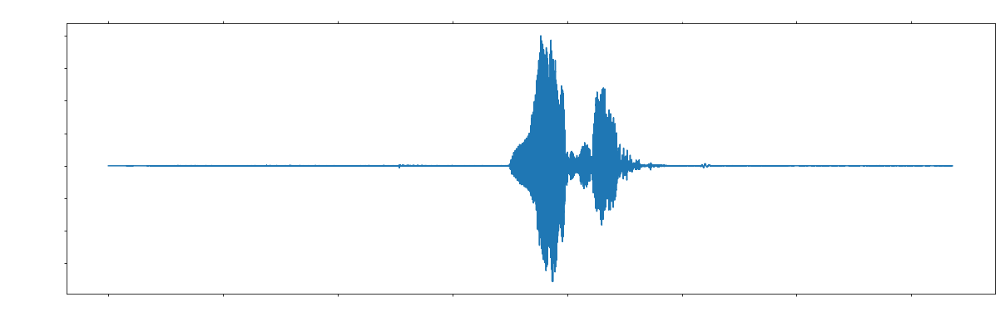

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 349440 bytes, expected 349476 bytes from header.
  sr, wav = wavfile.read(wav_loc)


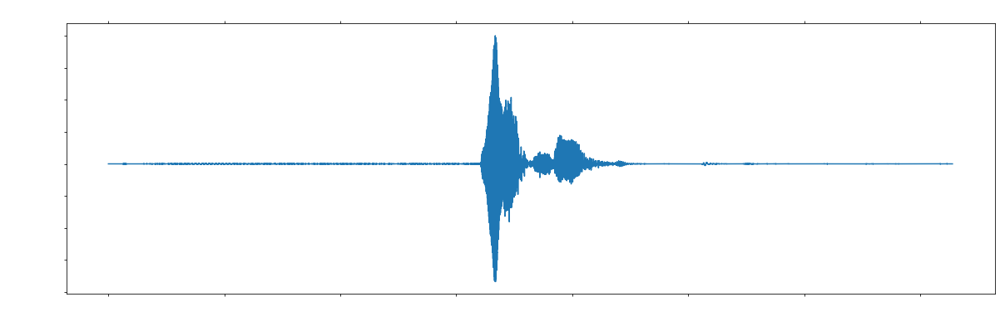

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 345600 bytes, expected 345636 bytes from header.
  sr, wav = wavfile.read(wav_loc)


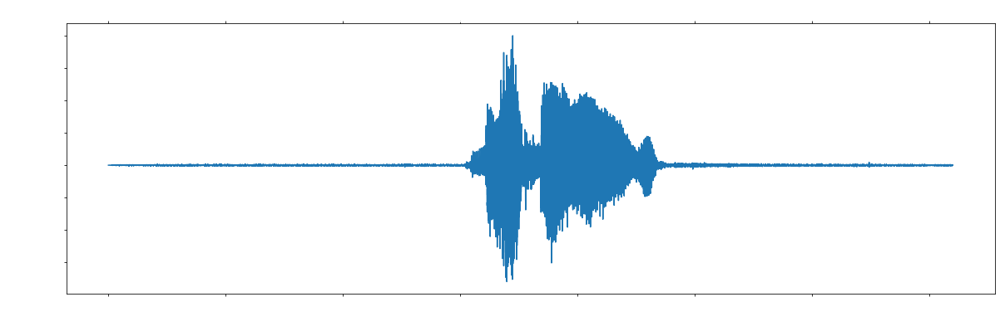

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 284160 bytes, expected 284196 bytes from header.
  sr, wav = wavfile.read(wav_loc)


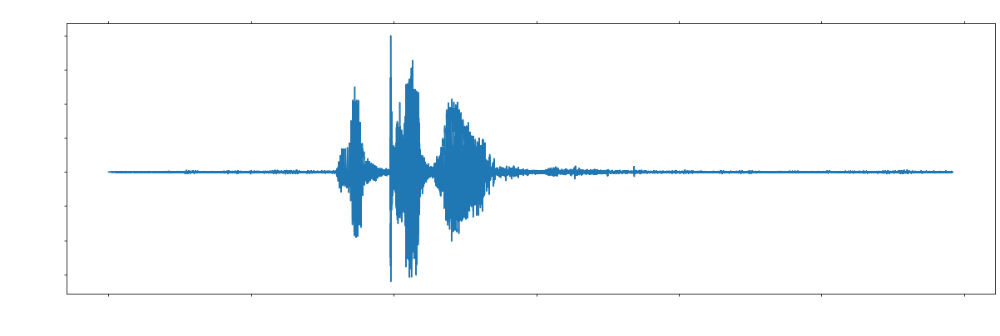

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 330240 bytes, expected 330276 bytes from header.
  sr, wav = wavfile.read(wav_loc)


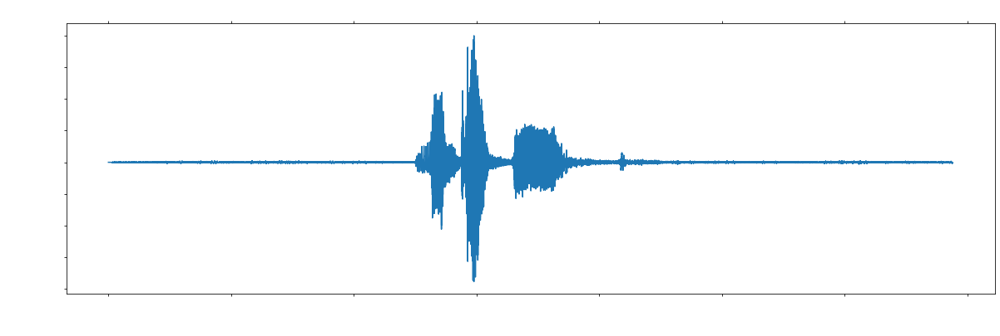

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 341760 bytes, expected 341796 bytes from header.
  sr, wav = wavfile.read(wav_loc)


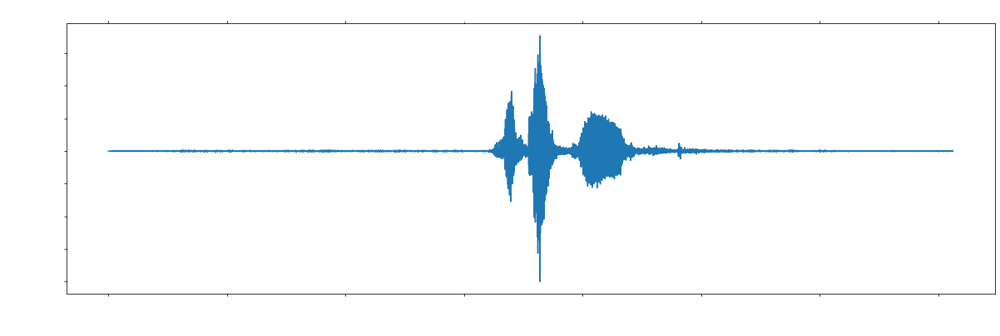

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 330240 bytes, expected 330276 bytes from header.
  sr, wav = wavfile.read(wav_loc)


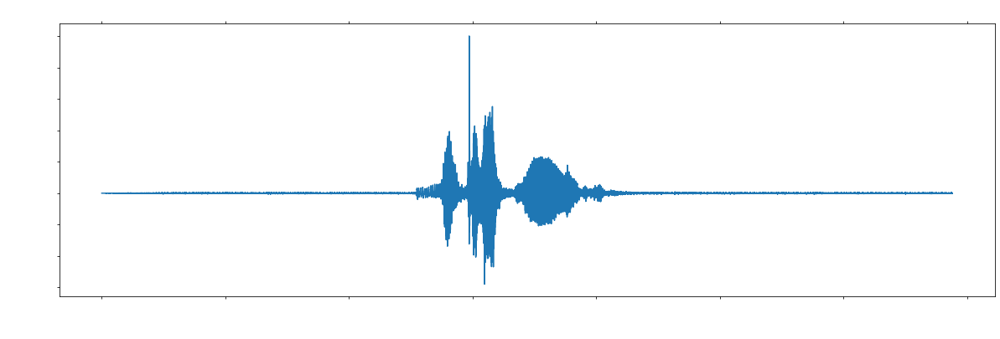

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 353280 bytes, expected 353316 bytes from header.
  sr, wav = wavfile.read(wav_loc)


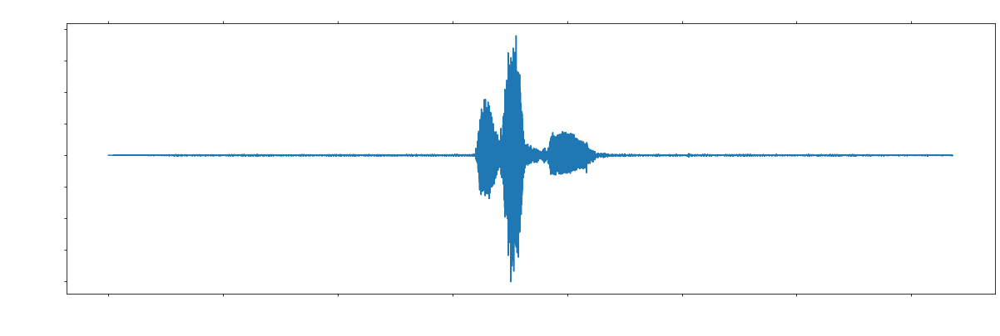

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 384000 bytes, expected 384036 bytes from header.
  sr, wav = wavfile.read(wav_loc)


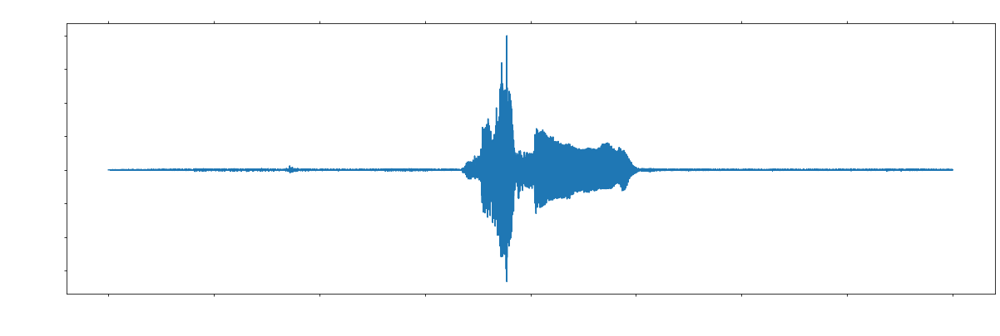

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 453120 bytes, expected 453156 bytes from header.
  sr, wav = wavfile.read(wav_loc)


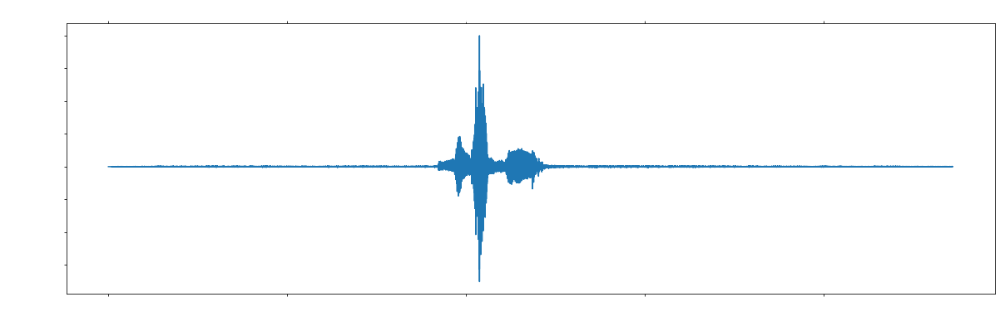

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 349440 bytes, expected 349476 bytes from header.
  sr, wav = wavfile.read(wav_loc)


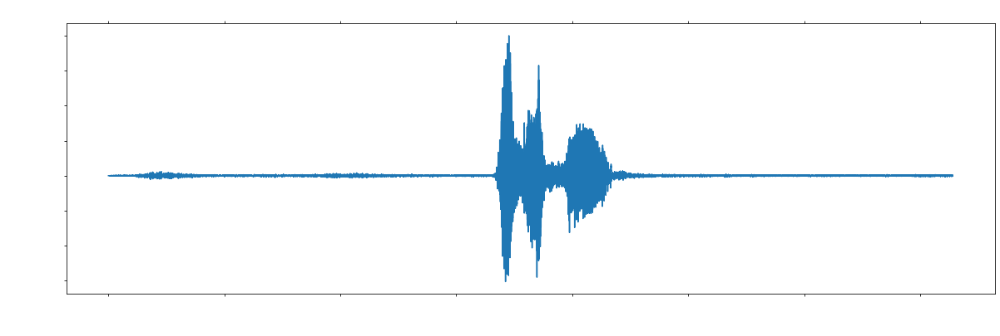

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 387840 bytes, expected 387876 bytes from header.
  sr, wav = wavfile.read(wav_loc)


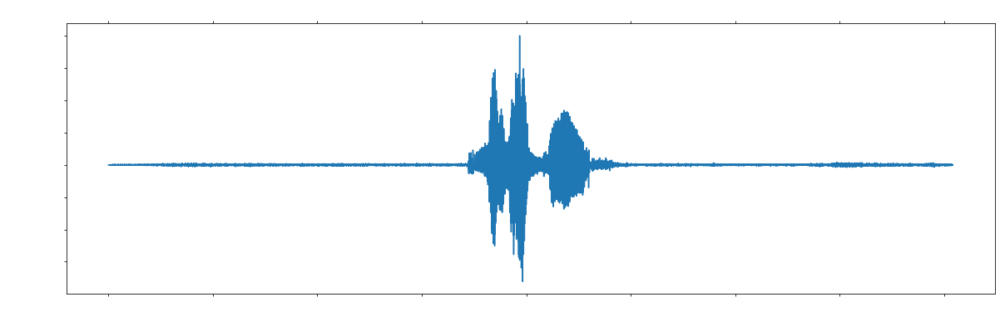

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 353280 bytes, expected 353316 bytes from header.
  sr, wav = wavfile.read(wav_loc)


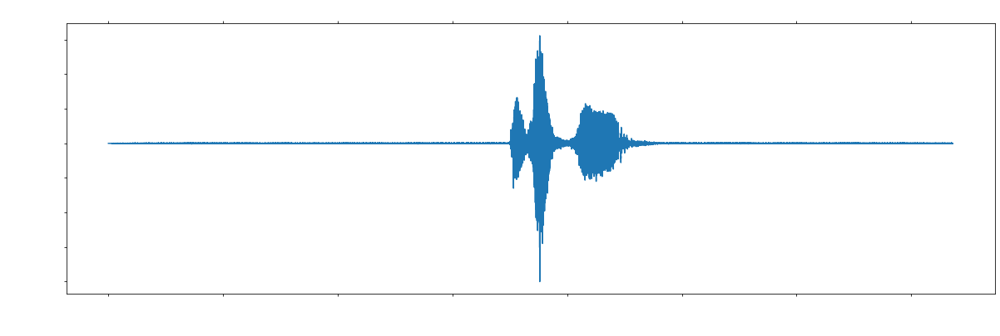

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 360960 bytes, expected 360996 bytes from header.
  sr, wav = wavfile.read(wav_loc)


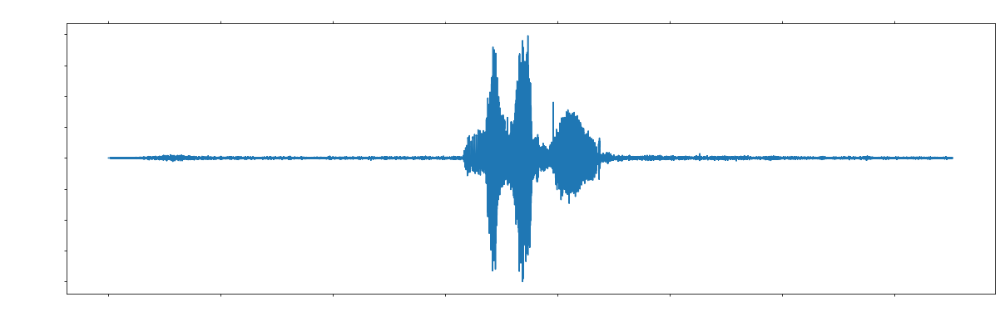

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 349440 bytes, expected 349476 bytes from header.
  sr, wav = wavfile.read(wav_loc)


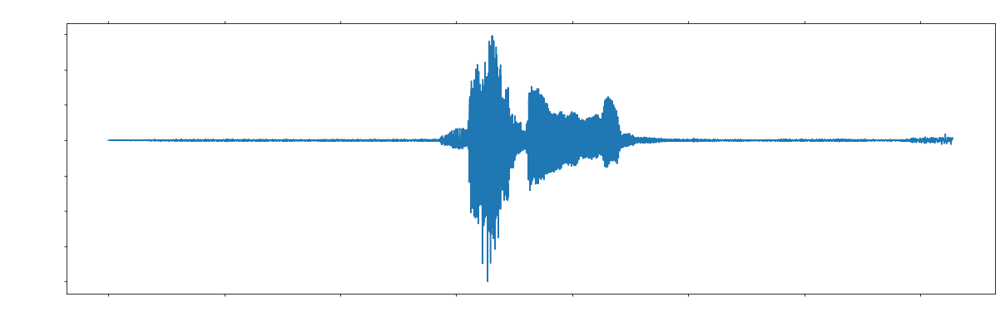

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 345600 bytes, expected 345636 bytes from header.
  sr, wav = wavfile.read(wav_loc)


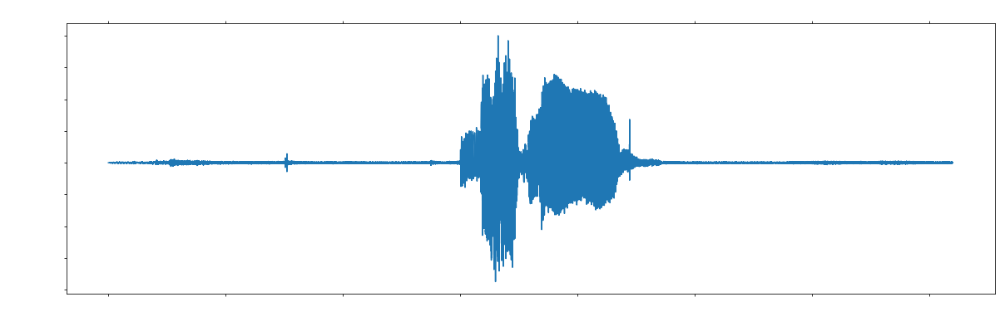

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 326400 bytes, expected 326436 bytes from header.
  sr, wav = wavfile.read(wav_loc)


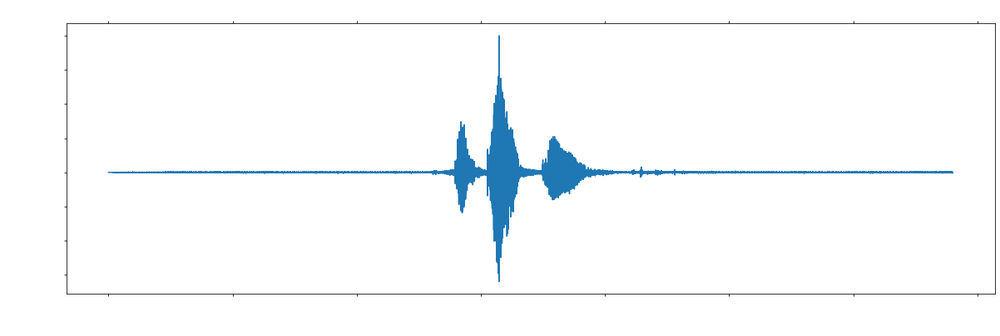

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 391680 bytes, expected 391716 bytes from header.
  sr, wav = wavfile.read(wav_loc)


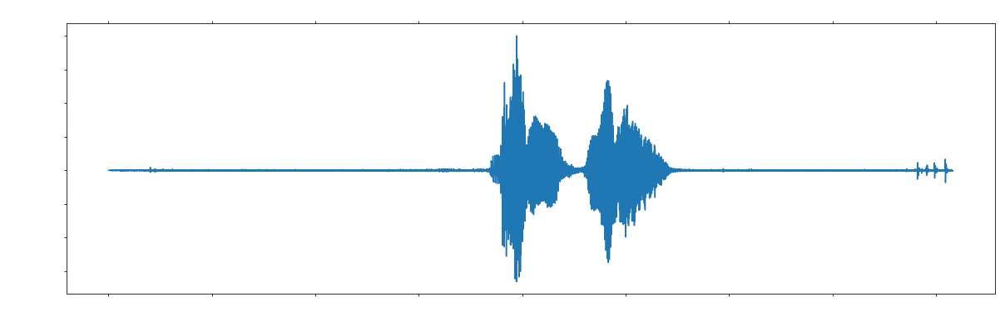

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 360960 bytes, expected 360996 bytes from header.
  sr, wav = wavfile.read(wav_loc)


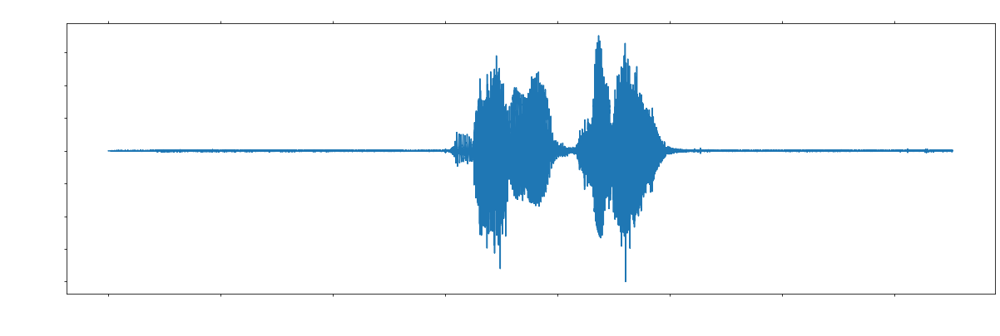

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 449280 bytes, expected 449316 bytes from header.
  sr, wav = wavfile.read(wav_loc)


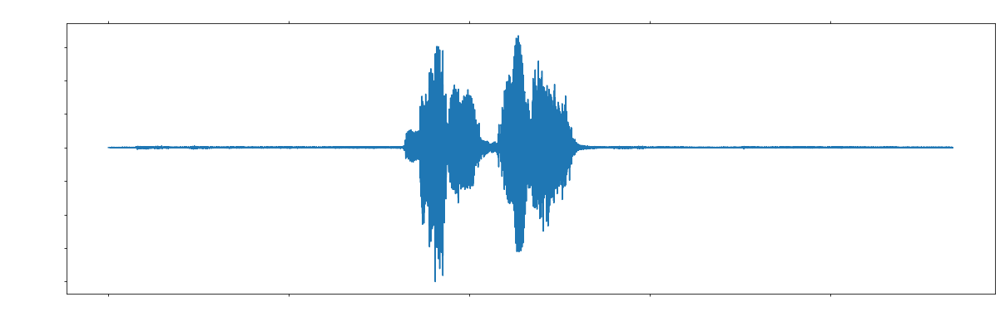

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 441600 bytes, expected 441636 bytes from header.
  sr, wav = wavfile.read(wav_loc)


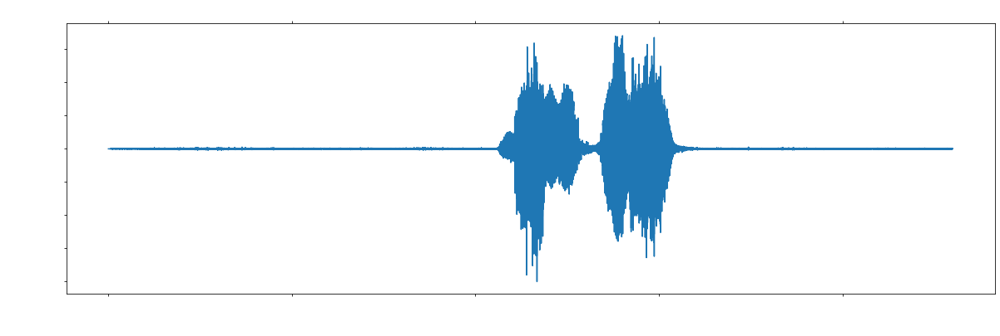

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 391680 bytes, expected 391716 bytes from header.
  sr, wav = wavfile.read(wav_loc)


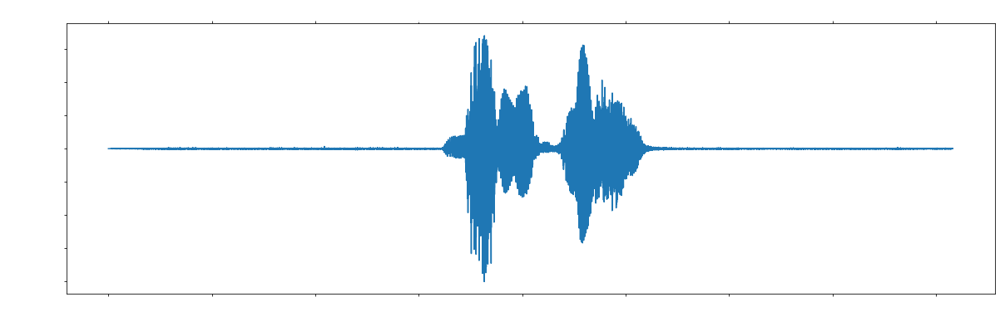

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 376320 bytes, expected 376356 bytes from header.
  sr, wav = wavfile.read(wav_loc)


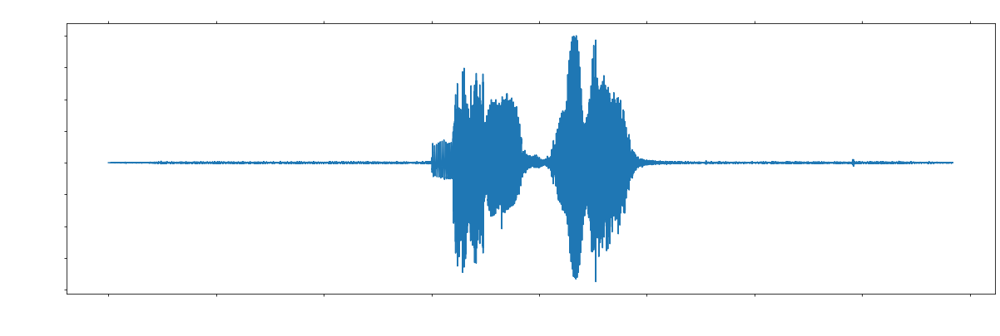

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 372480 bytes, expected 372516 bytes from header.
  sr, wav = wavfile.read(wav_loc)


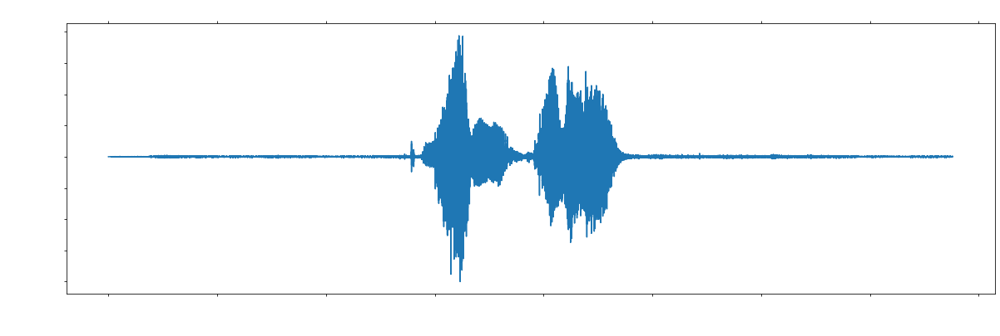

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 380160 bytes, expected 380196 bytes from header.
  sr, wav = wavfile.read(wav_loc)


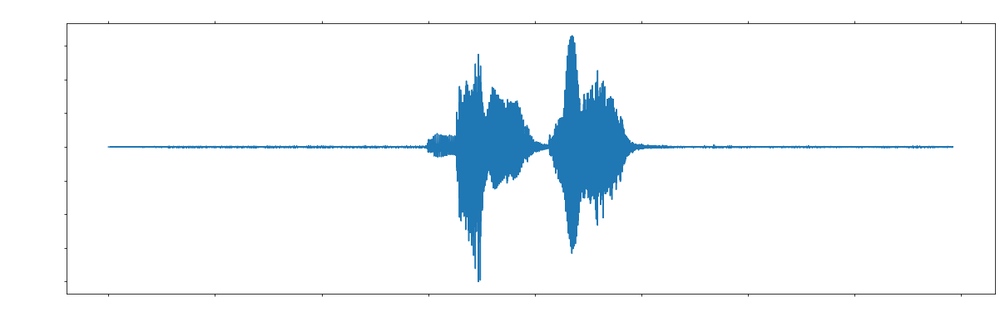

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 395520 bytes, expected 395556 bytes from header.
  sr, wav = wavfile.read(wav_loc)


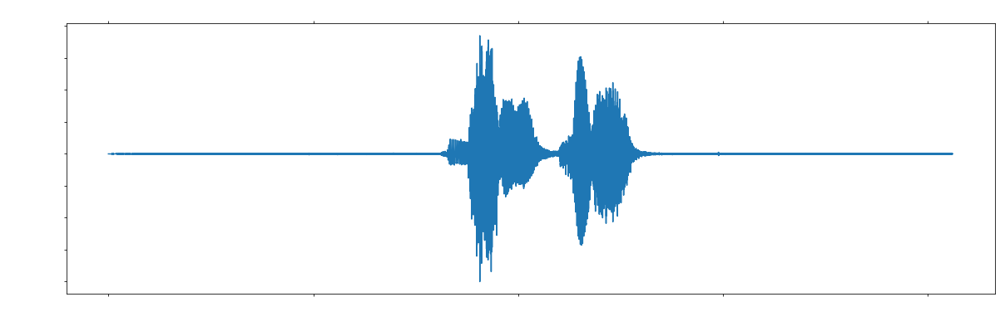

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 395520 bytes, expected 395556 bytes from header.
  sr, wav = wavfile.read(wav_loc)


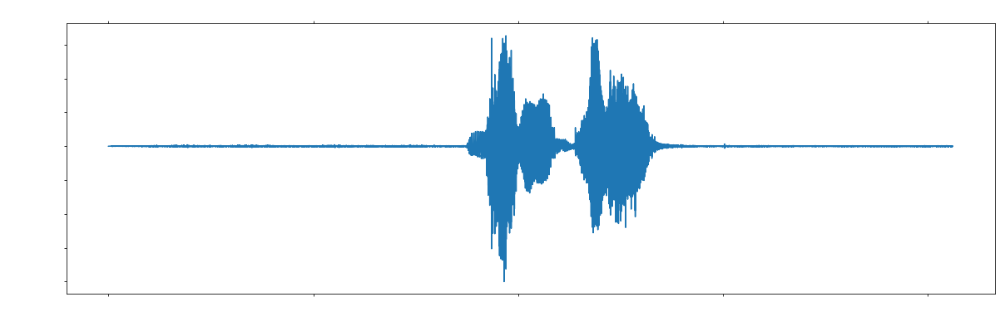

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 430080 bytes, expected 430116 bytes from header.
  sr, wav = wavfile.read(wav_loc)


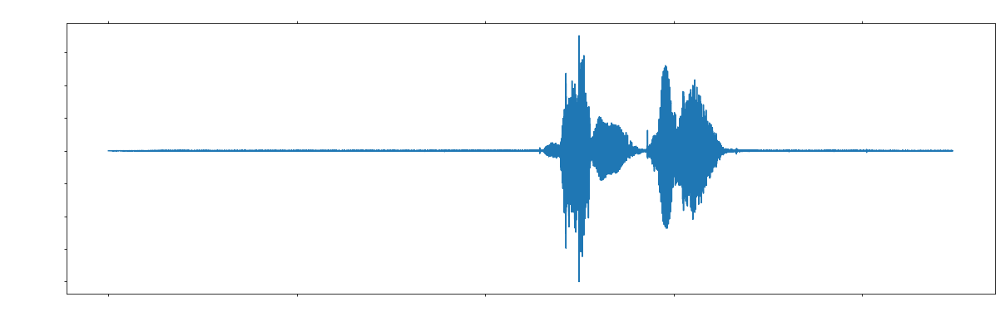

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 410880 bytes, expected 410916 bytes from header.
  sr, wav = wavfile.read(wav_loc)


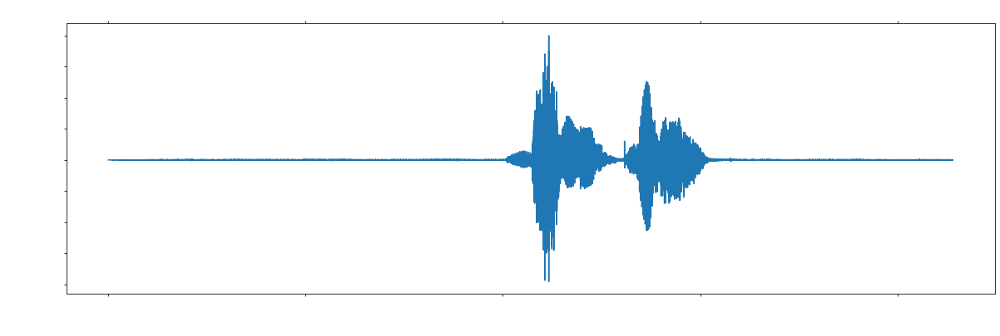

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 353280 bytes, expected 353316 bytes from header.
  sr, wav = wavfile.read(wav_loc)


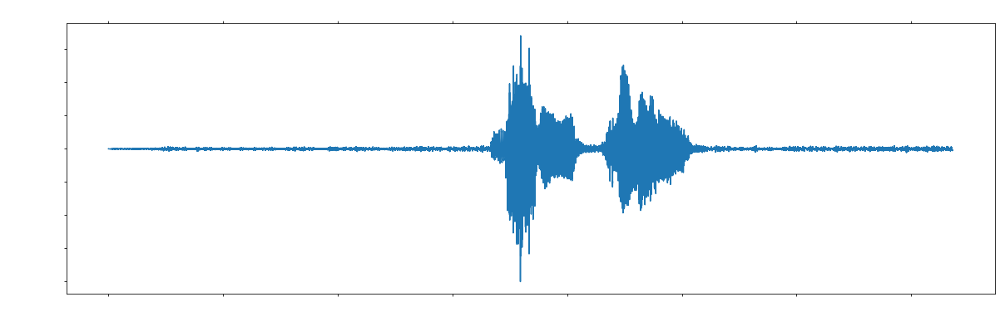

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 380160 bytes, expected 380196 bytes from header.
  sr, wav = wavfile.read(wav_loc)


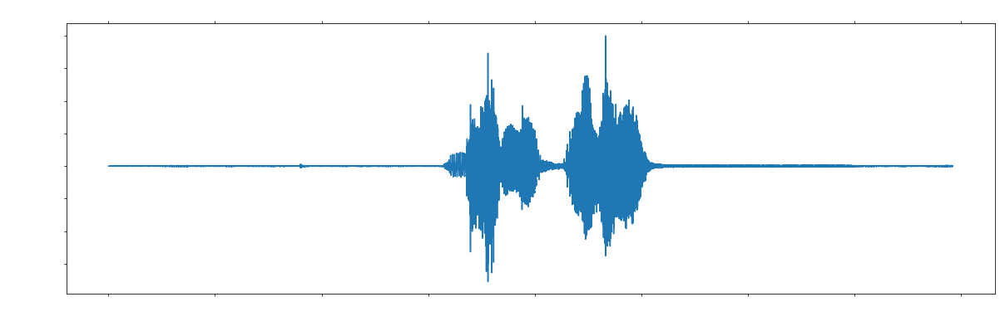

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 403200 bytes, expected 403236 bytes from header.
  sr, wav = wavfile.read(wav_loc)


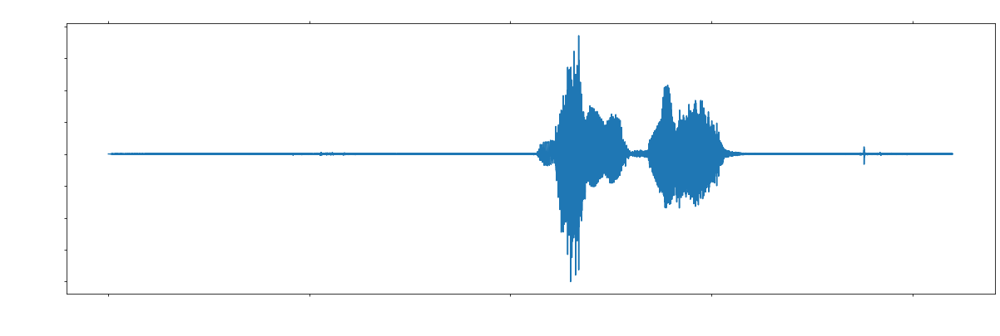

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 407040 bytes, expected 407076 bytes from header.
  sr, wav = wavfile.read(wav_loc)


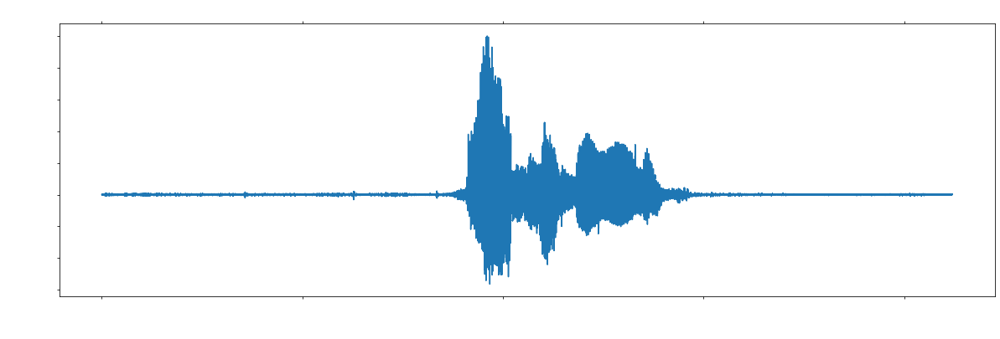

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 391680 bytes, expected 391716 bytes from header.
  sr, wav = wavfile.read(wav_loc)


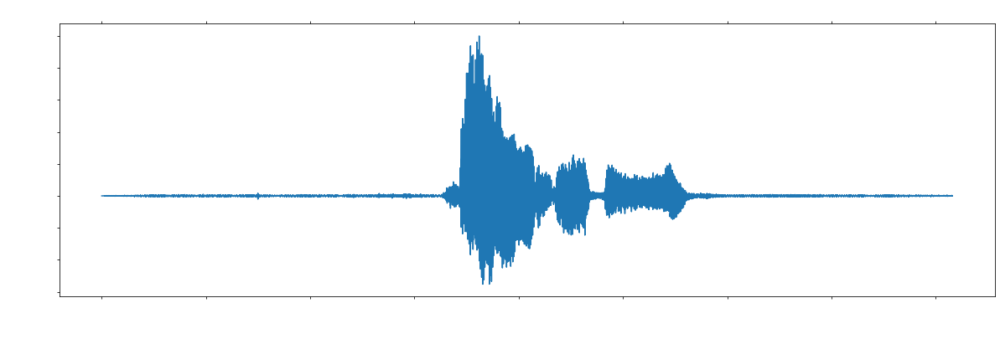

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 380160 bytes, expected 380196 bytes from header.
  sr, wav = wavfile.read(wav_loc)


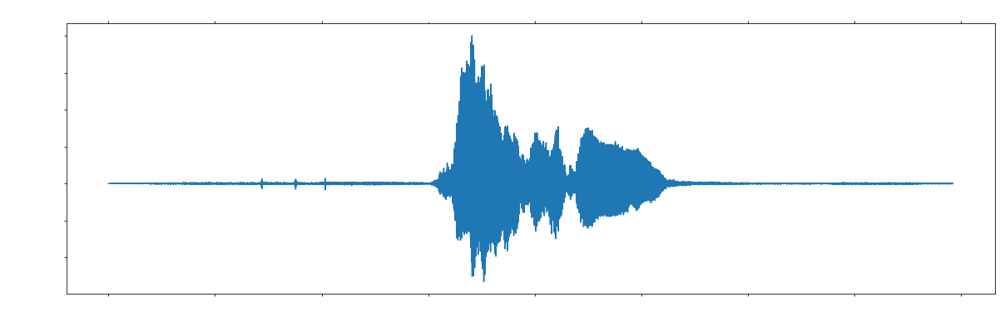

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 387840 bytes, expected 387876 bytes from header.
  sr, wav = wavfile.read(wav_loc)


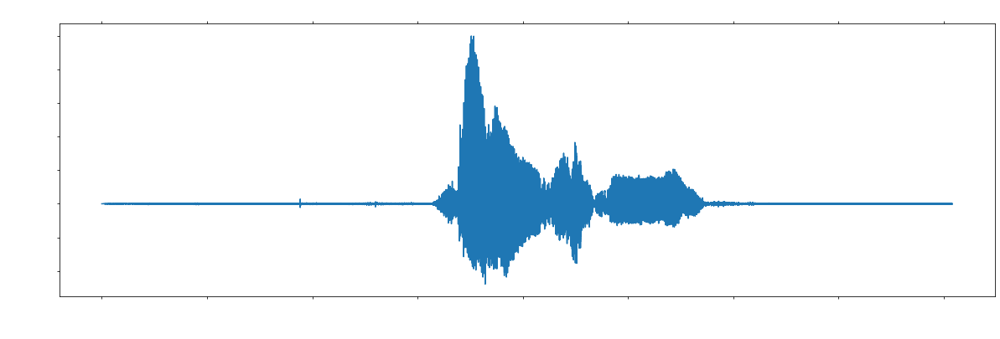

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 368640 bytes, expected 368676 bytes from header.
  sr, wav = wavfile.read(wav_loc)


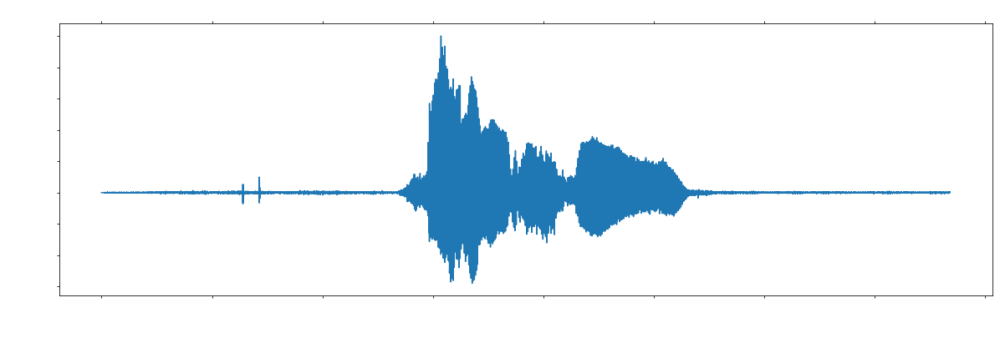

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 380160 bytes, expected 380196 bytes from header.
  sr, wav = wavfile.read(wav_loc)


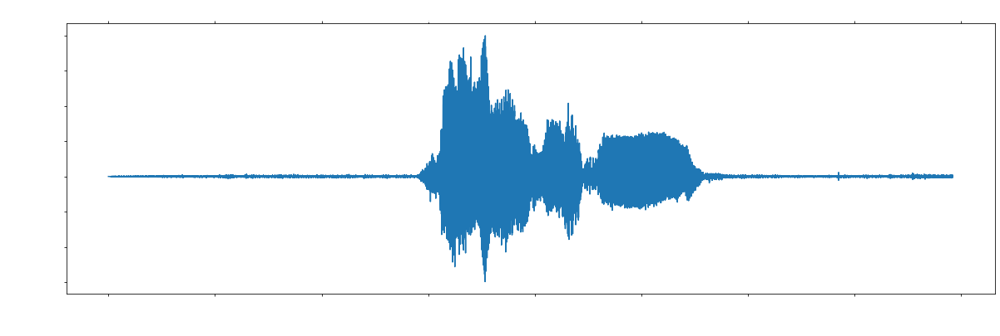

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 422400 bytes, expected 422436 bytes from header.
  sr, wav = wavfile.read(wav_loc)


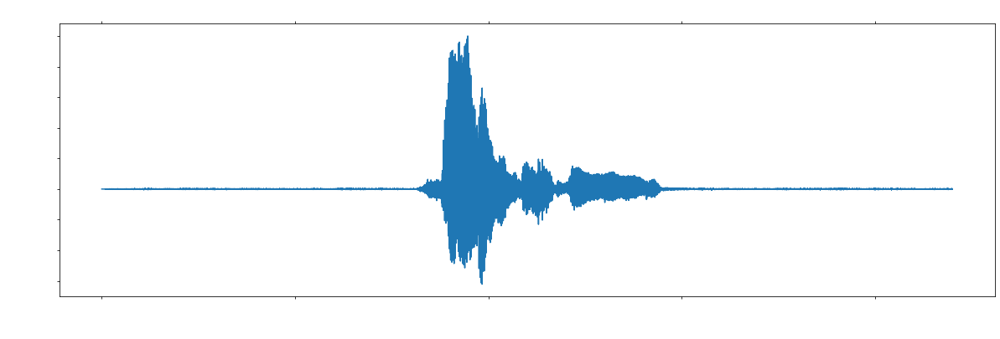

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 360960 bytes, expected 360996 bytes from header.
  sr, wav = wavfile.read(wav_loc)


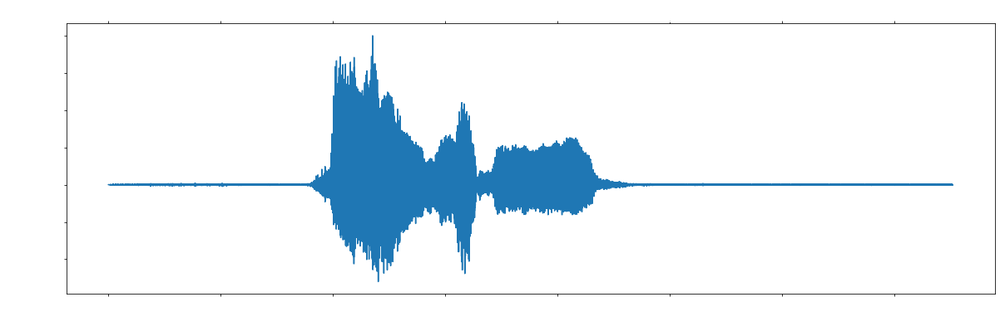

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 360960 bytes, expected 360996 bytes from header.
  sr, wav = wavfile.read(wav_loc)


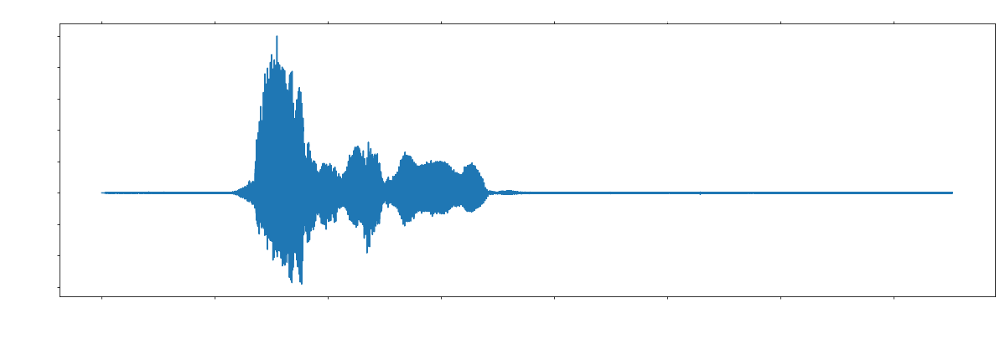

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 364800 bytes, expected 364836 bytes from header.
  sr, wav = wavfile.read(wav_loc)


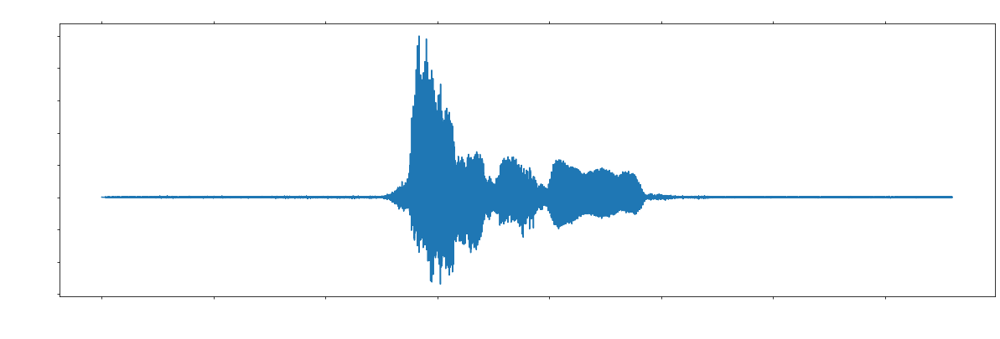

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 391680 bytes, expected 391716 bytes from header.
  sr, wav = wavfile.read(wav_loc)


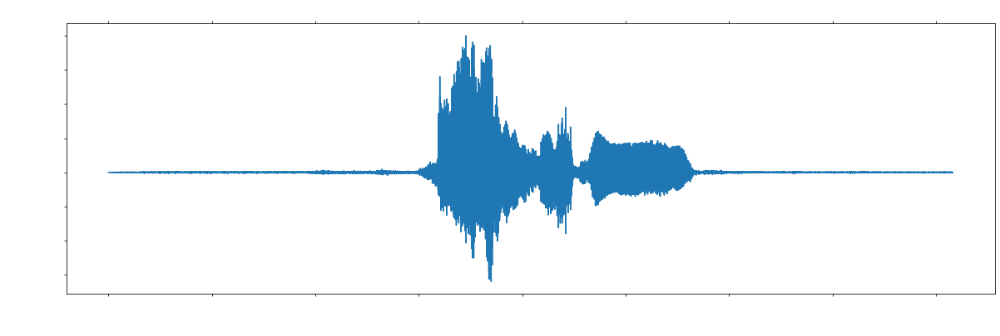

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 410880 bytes, expected 410916 bytes from header.
  sr, wav = wavfile.read(wav_loc)


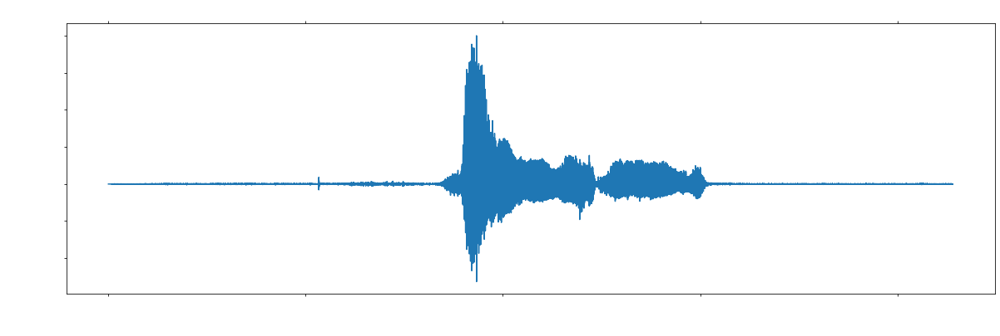

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 422400 bytes, expected 422436 bytes from header.
  sr, wav = wavfile.read(wav_loc)


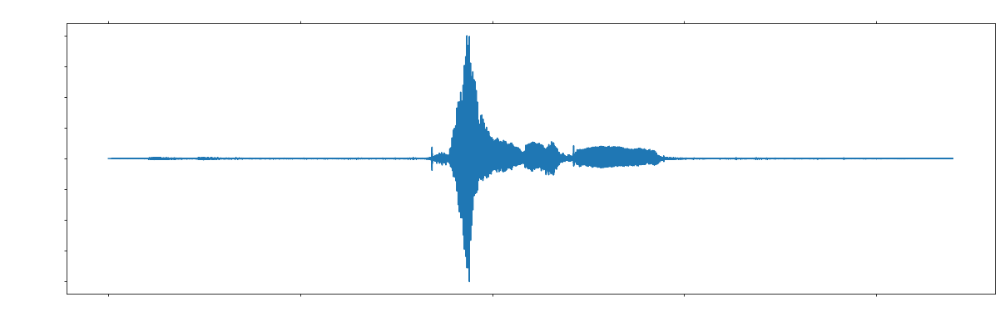

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 395520 bytes, expected 395556 bytes from header.
  sr, wav = wavfile.read(wav_loc)


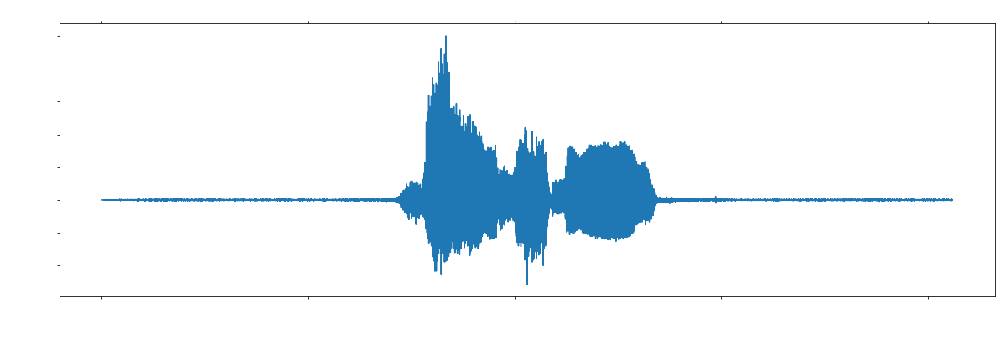

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 480000 bytes, expected 480036 bytes from header.
  sr, wav = wavfile.read(wav_loc)


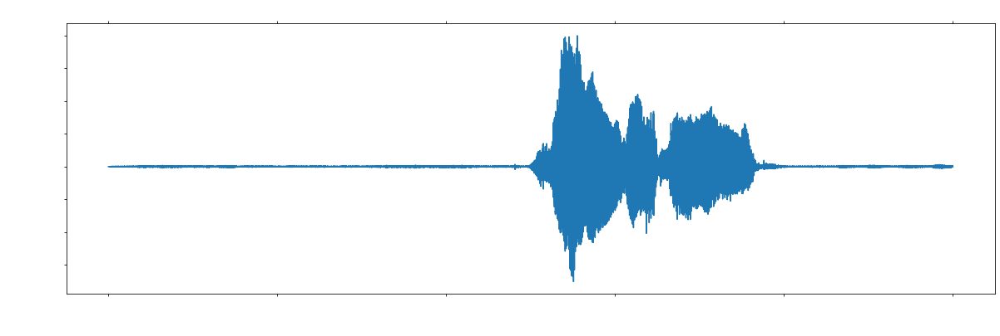

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 357120 bytes, expected 357156 bytes from header.
  sr, wav = wavfile.read(wav_loc)


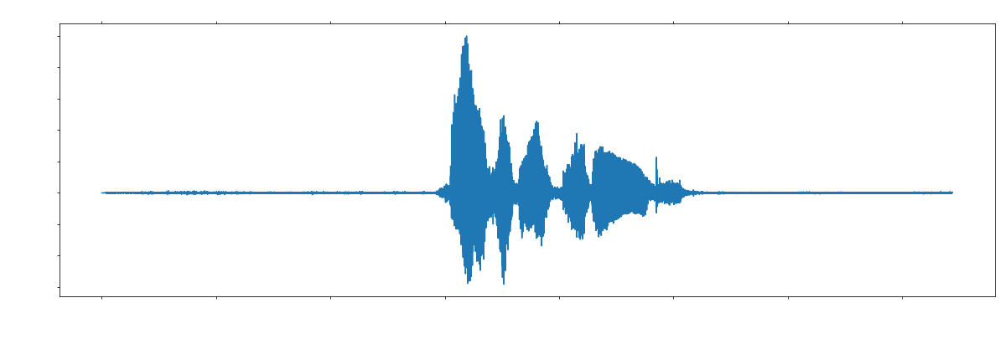

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 368640 bytes, expected 368676 bytes from header.
  sr, wav = wavfile.read(wav_loc)


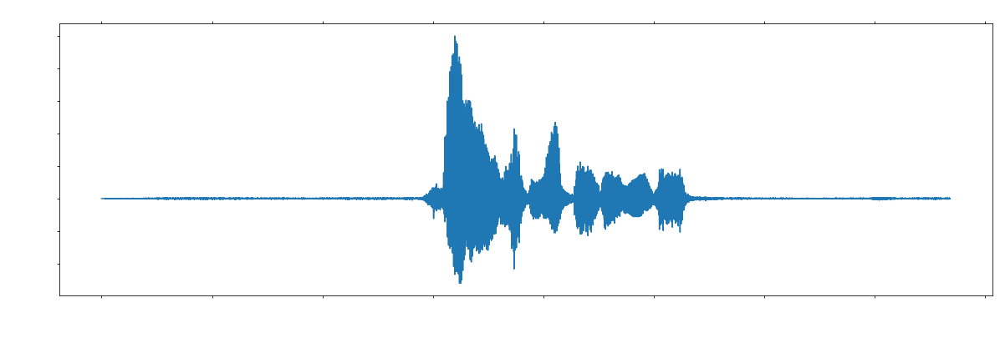

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 372480 bytes, expected 372516 bytes from header.
  sr, wav = wavfile.read(wav_loc)


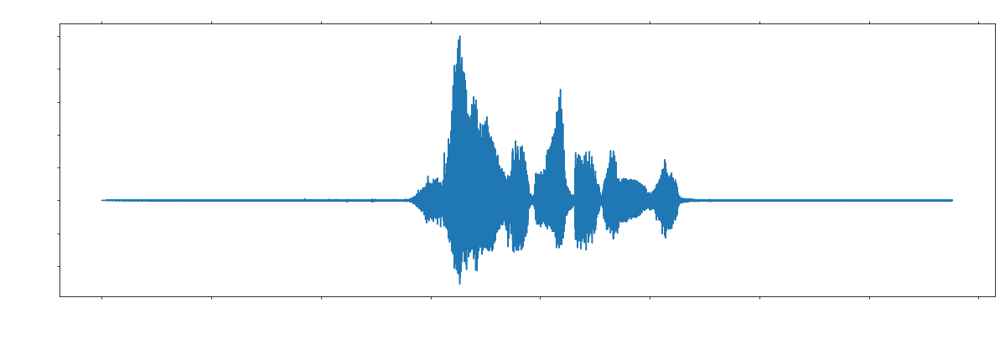

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 387840 bytes, expected 387876 bytes from header.
  sr, wav = wavfile.read(wav_loc)


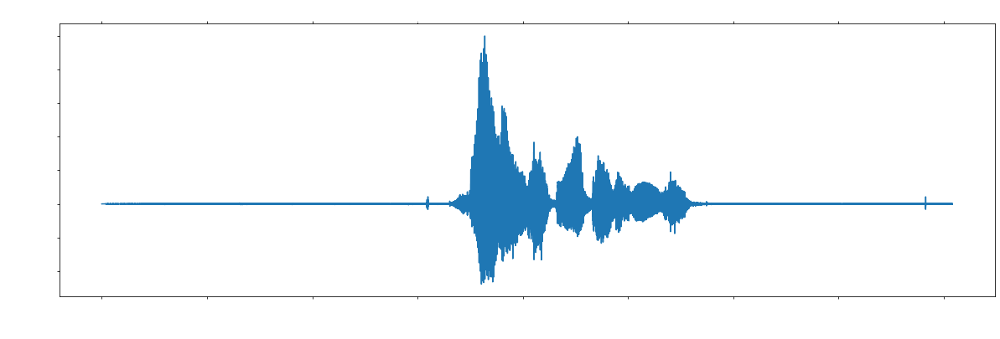

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 368640 bytes, expected 368676 bytes from header.
  sr, wav = wavfile.read(wav_loc)


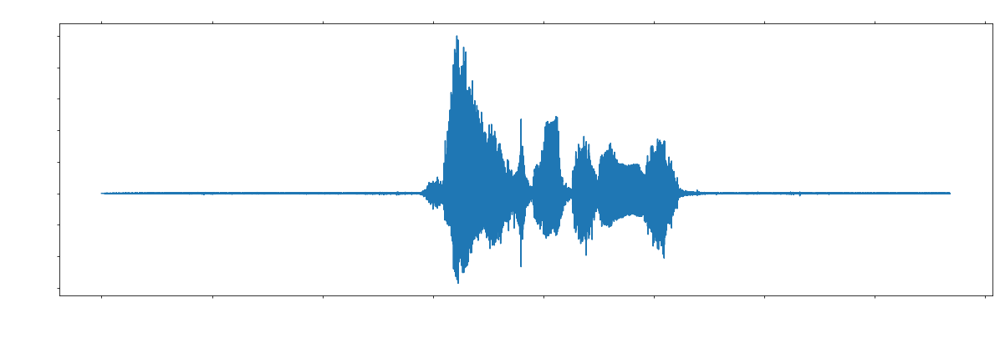

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 368640 bytes, expected 368676 bytes from header.
  sr, wav = wavfile.read(wav_loc)


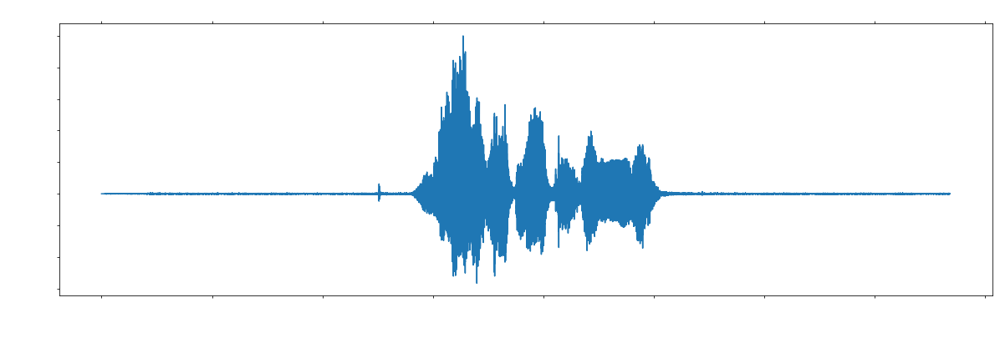

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 364800 bytes, expected 364836 bytes from header.
  sr, wav = wavfile.read(wav_loc)


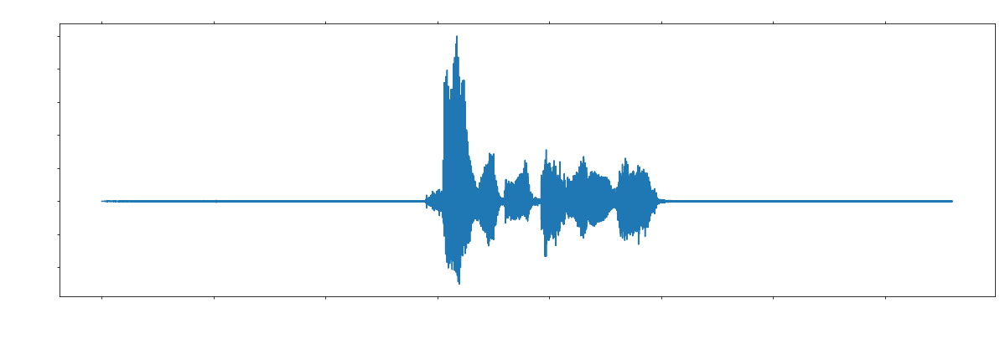

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 387840 bytes, expected 387876 bytes from header.
  sr, wav = wavfile.read(wav_loc)


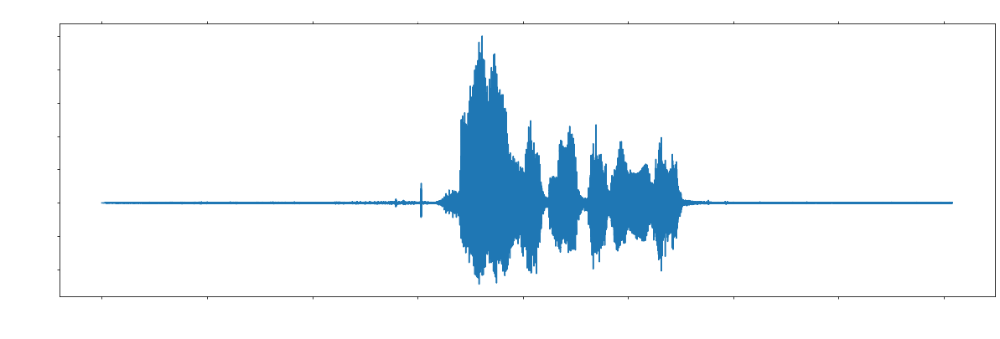

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 357120 bytes, expected 357156 bytes from header.
  sr, wav = wavfile.read(wav_loc)


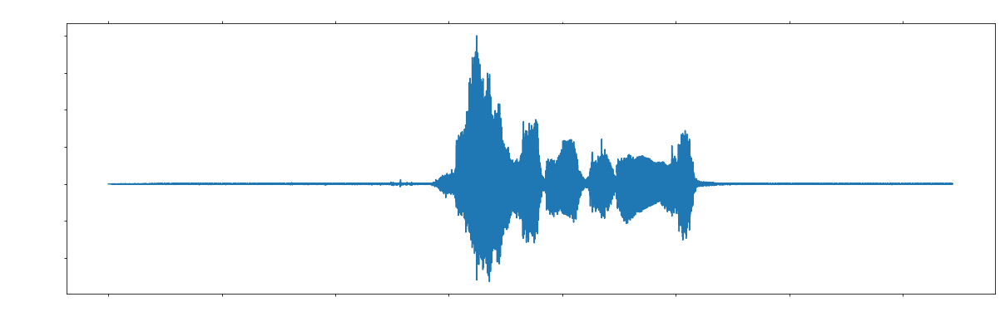

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 360960 bytes, expected 360996 bytes from header.
  sr, wav = wavfile.read(wav_loc)


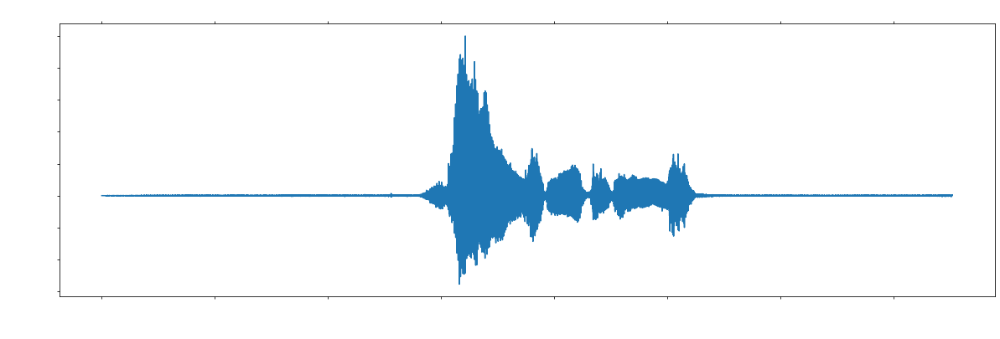

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 426240 bytes, expected 426276 bytes from header.
  sr, wav = wavfile.read(wav_loc)


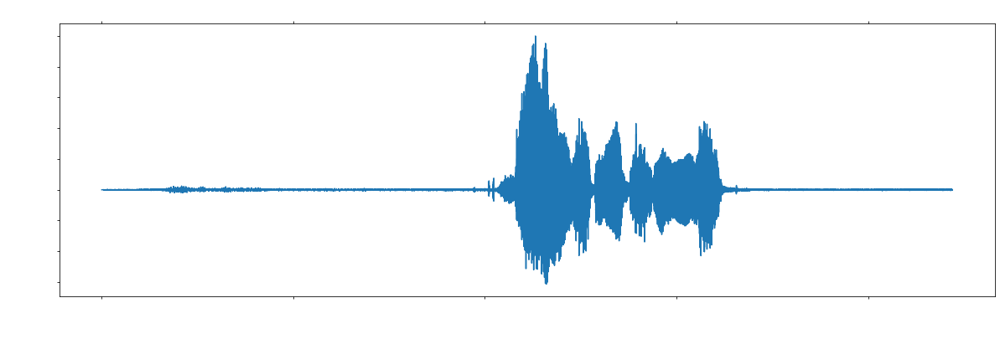

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 395520 bytes, expected 395556 bytes from header.
  sr, wav = wavfile.read(wav_loc)


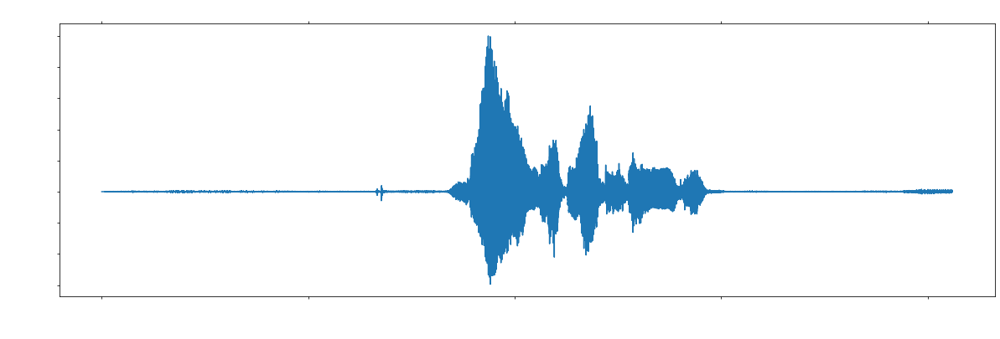

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 334080 bytes, expected 334116 bytes from header.
  sr, wav = wavfile.read(wav_loc)


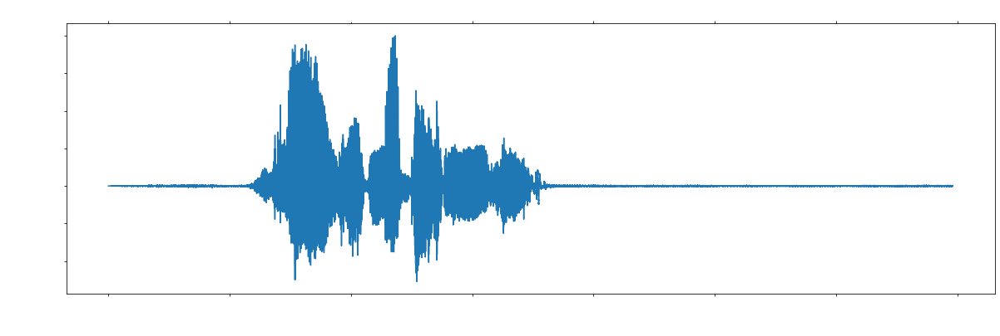

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 449280 bytes, expected 449316 bytes from header.
  sr, wav = wavfile.read(wav_loc)


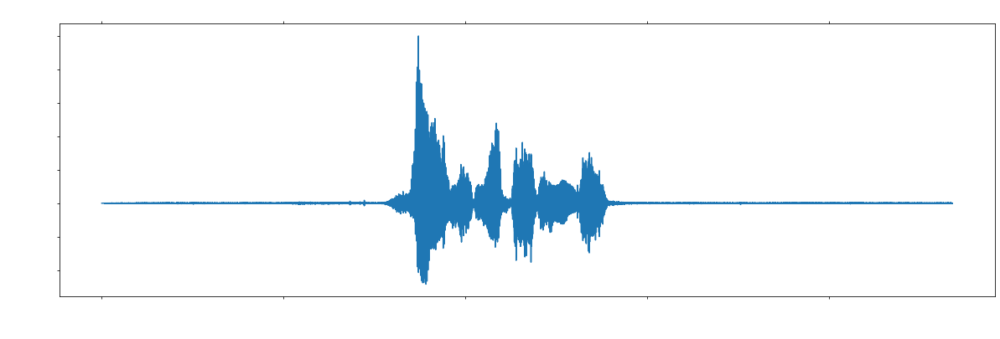

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 391680 bytes, expected 391716 bytes from header.
  sr, wav = wavfile.read(wav_loc)


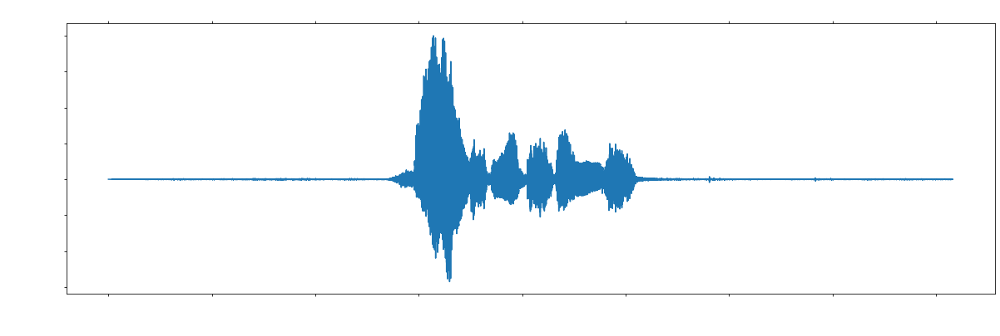

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 307200 bytes, expected 307236 bytes from header.
  sr, wav = wavfile.read(wav_loc)


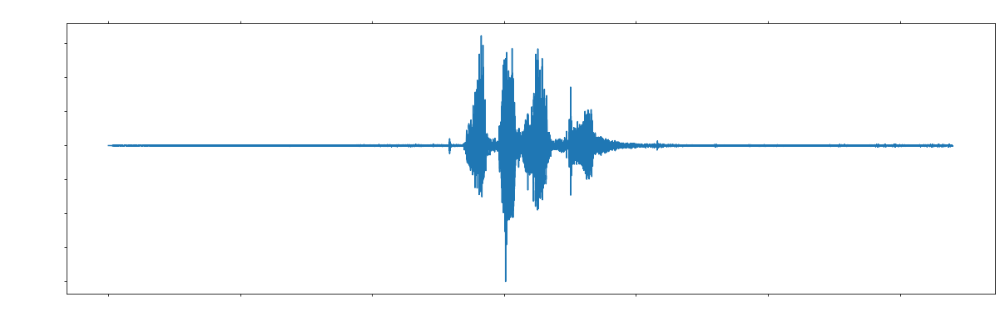

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 349440 bytes, expected 349476 bytes from header.
  sr, wav = wavfile.read(wav_loc)


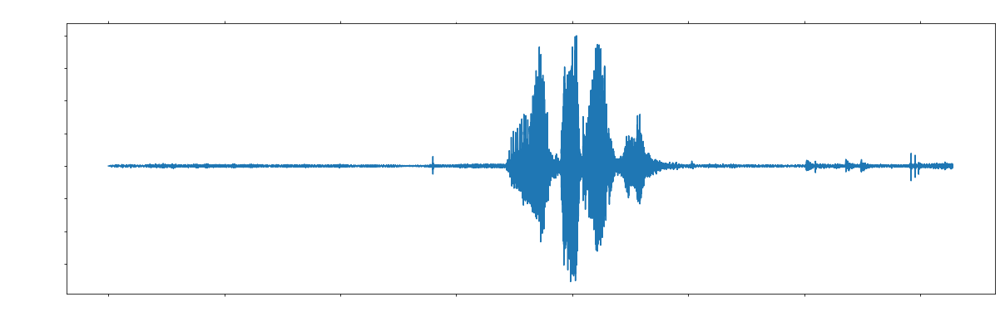

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 368640 bytes, expected 368676 bytes from header.
  sr, wav = wavfile.read(wav_loc)


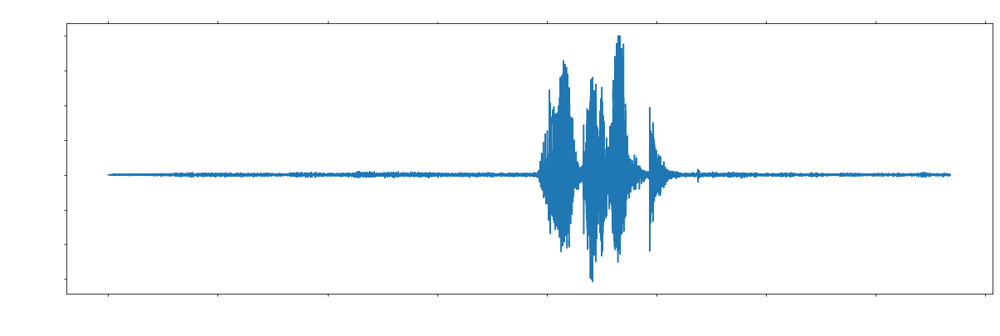

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 384000 bytes, expected 384036 bytes from header.
  sr, wav = wavfile.read(wav_loc)


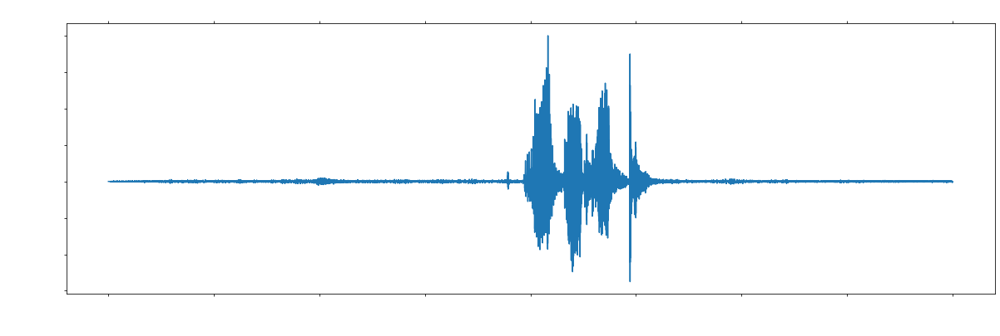

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 376320 bytes, expected 376356 bytes from header.
  sr, wav = wavfile.read(wav_loc)


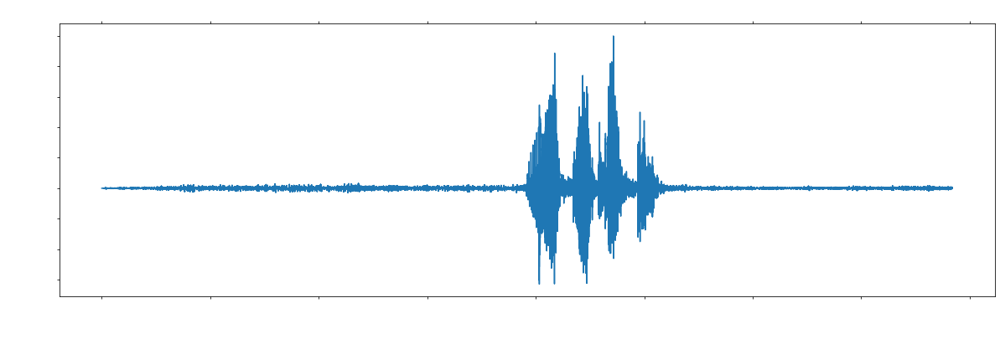

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 353280 bytes, expected 353316 bytes from header.
  sr, wav = wavfile.read(wav_loc)


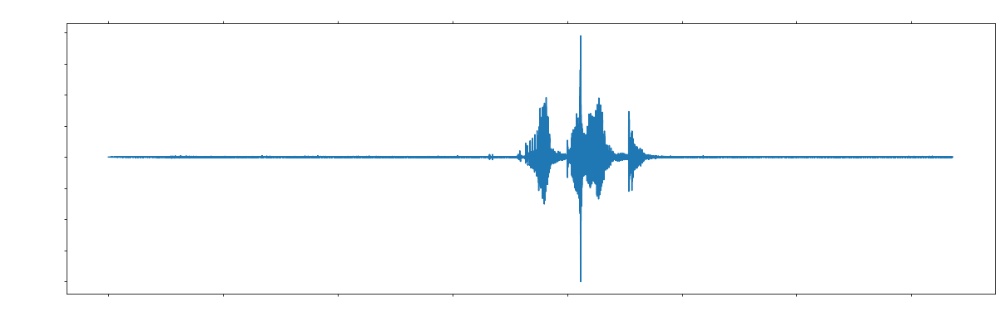

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 349440 bytes, expected 349476 bytes from header.
  sr, wav = wavfile.read(wav_loc)


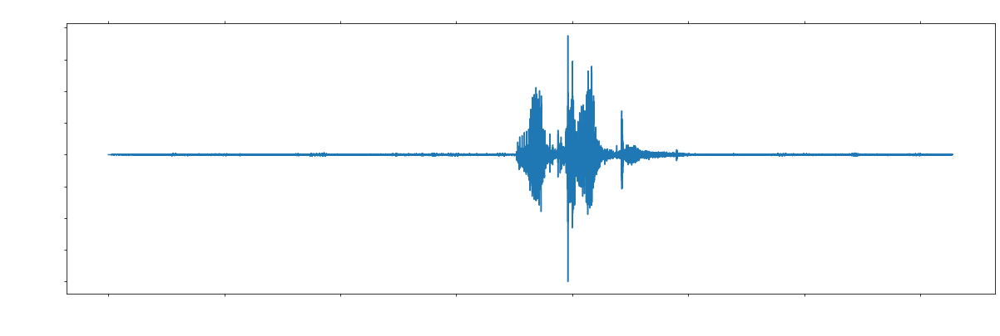

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 368640 bytes, expected 368676 bytes from header.
  sr, wav = wavfile.read(wav_loc)


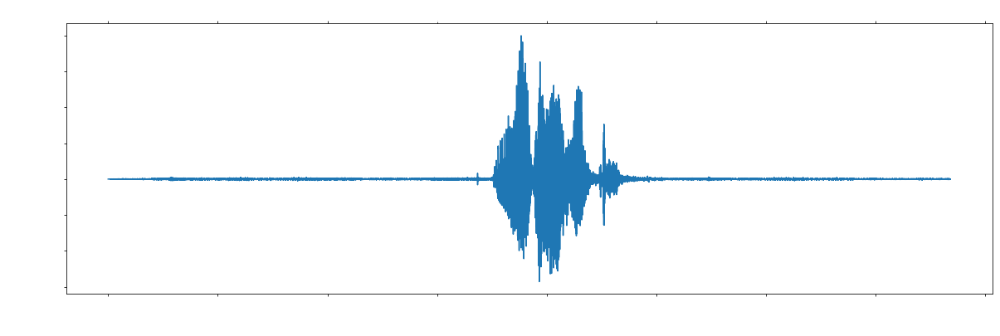

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 311040 bytes, expected 311076 bytes from header.
  sr, wav = wavfile.read(wav_loc)


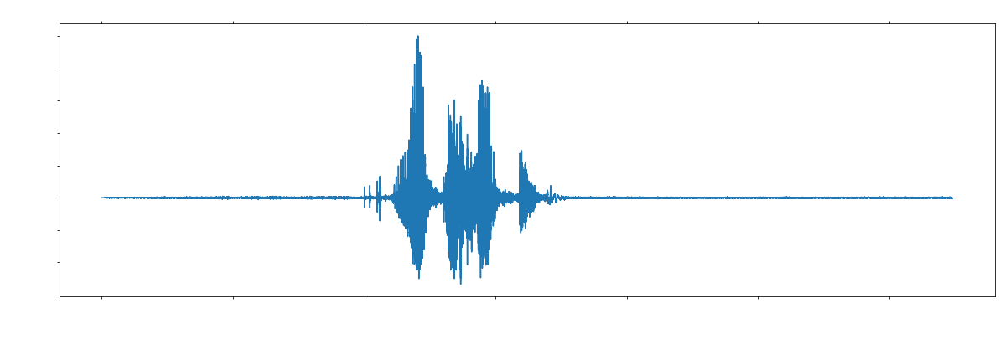

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 330240 bytes, expected 330276 bytes from header.
  sr, wav = wavfile.read(wav_loc)


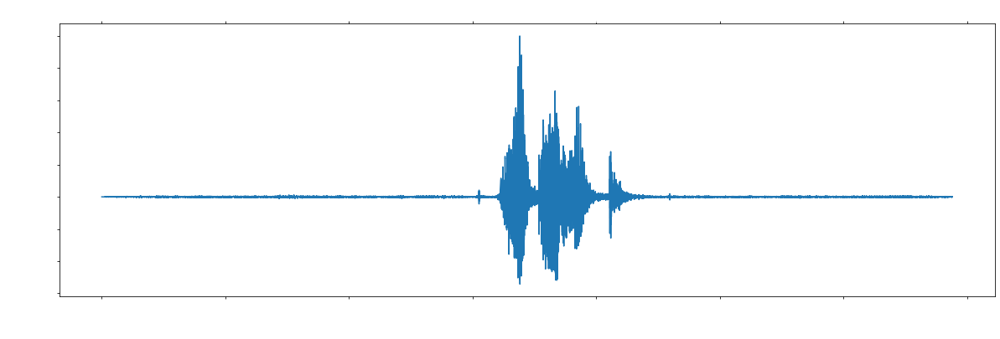

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 318720 bytes, expected 318756 bytes from header.
  sr, wav = wavfile.read(wav_loc)


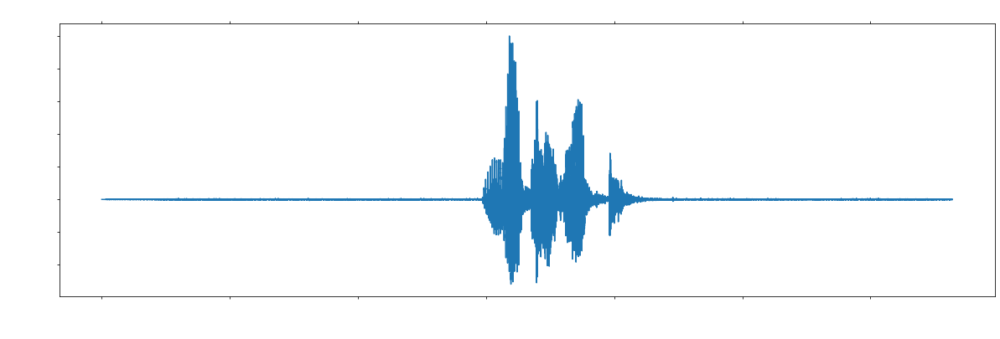

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 334080 bytes, expected 334116 bytes from header.
  sr, wav = wavfile.read(wav_loc)


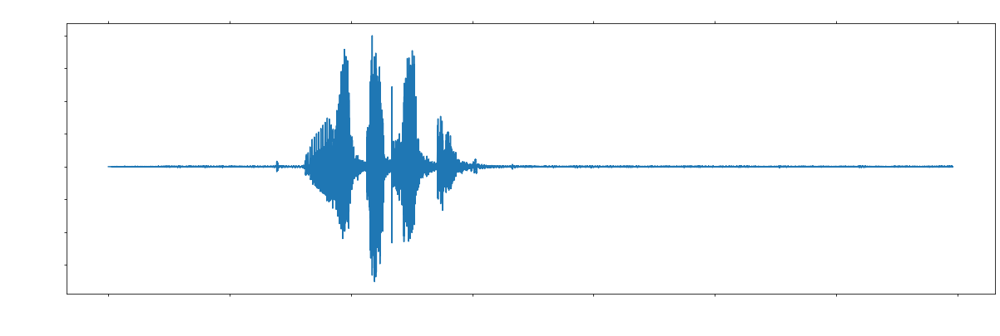

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 330240 bytes, expected 330276 bytes from header.
  sr, wav = wavfile.read(wav_loc)


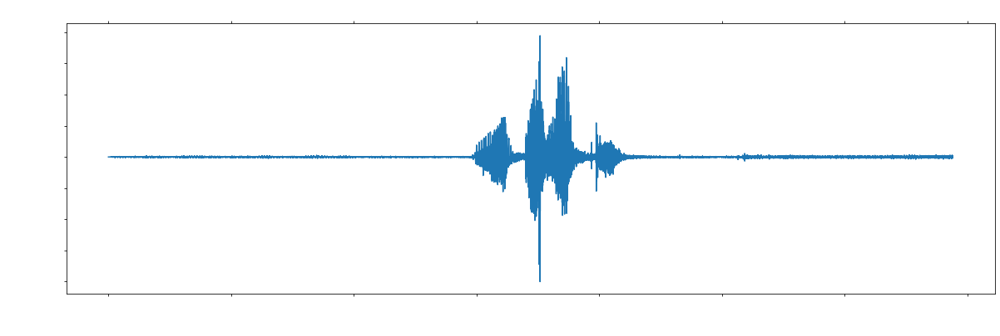

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 357120 bytes, expected 357156 bytes from header.
  sr, wav = wavfile.read(wav_loc)


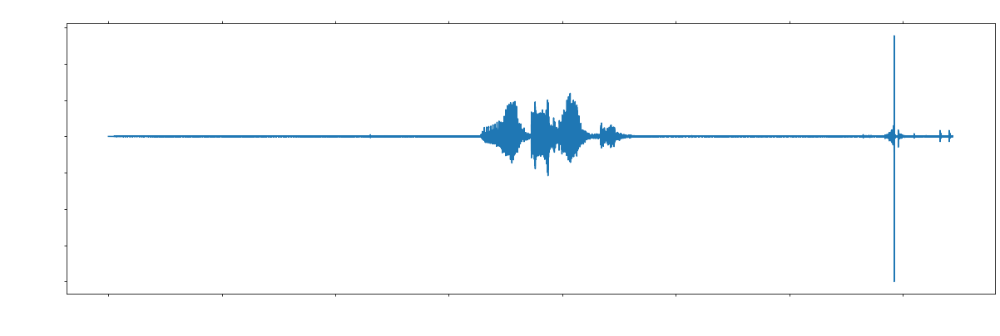

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 395520 bytes, expected 395556 bytes from header.
  sr, wav = wavfile.read(wav_loc)


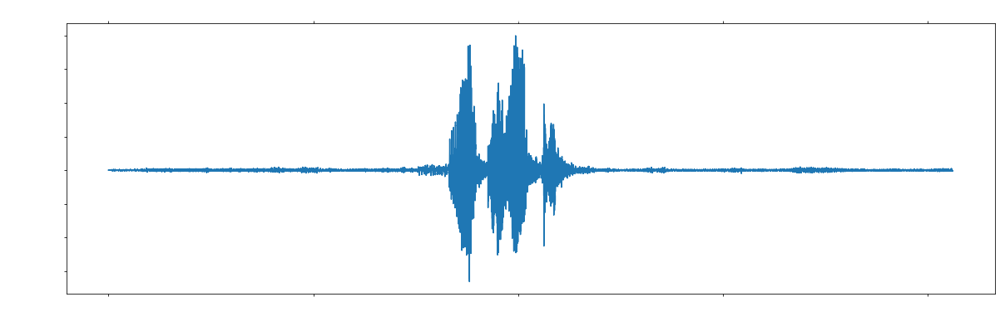

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 410880 bytes, expected 410916 bytes from header.
  sr, wav = wavfile.read(wav_loc)


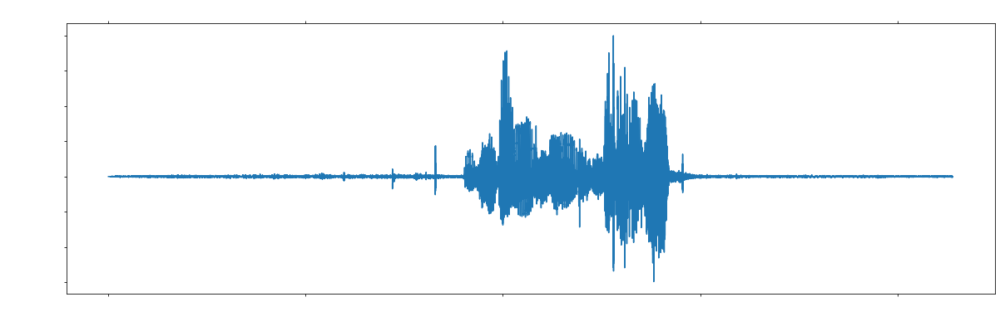

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 384000 bytes, expected 384036 bytes from header.
  sr, wav = wavfile.read(wav_loc)


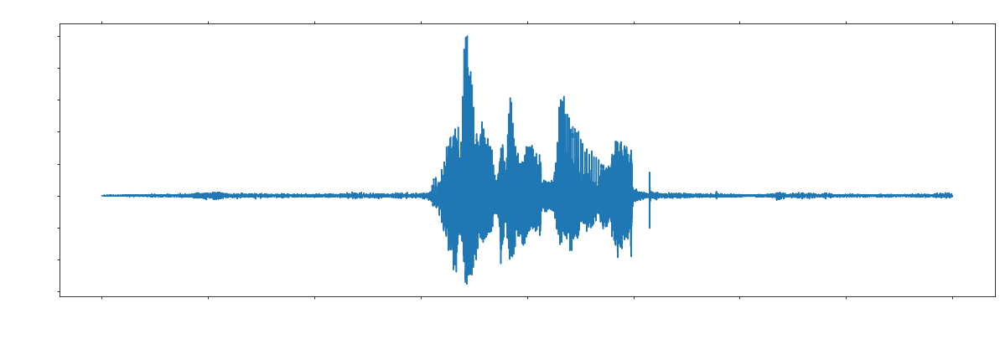

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 460800 bytes, expected 460836 bytes from header.
  sr, wav = wavfile.read(wav_loc)


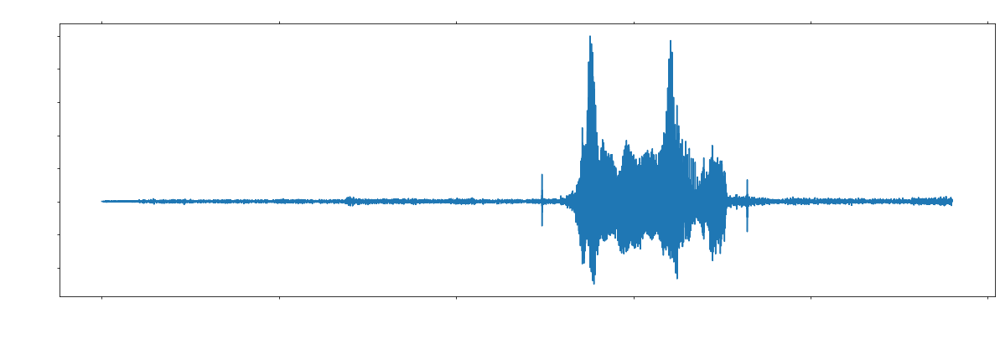

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 364800 bytes, expected 364836 bytes from header.
  sr, wav = wavfile.read(wav_loc)


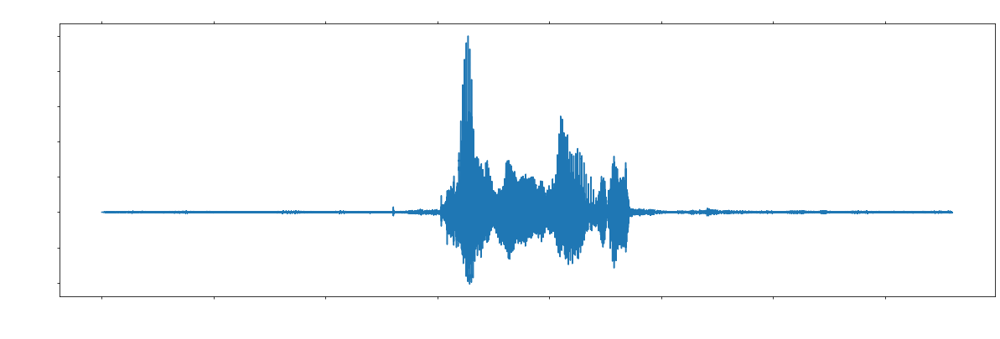

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 360960 bytes, expected 360996 bytes from header.
  sr, wav = wavfile.read(wav_loc)


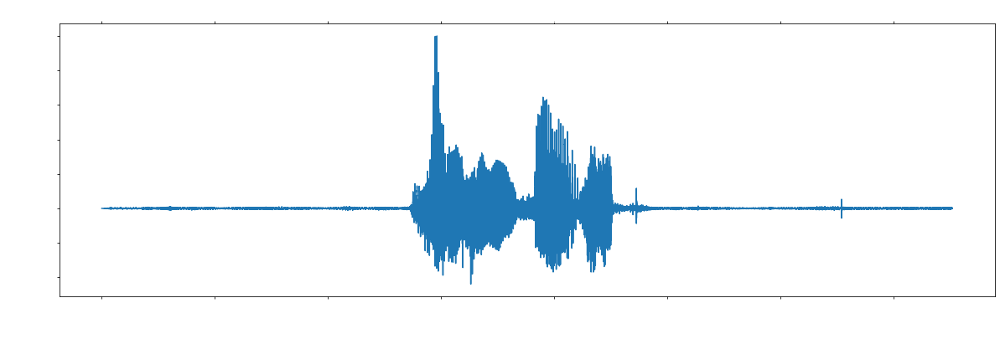

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 376320 bytes, expected 376356 bytes from header.
  sr, wav = wavfile.read(wav_loc)


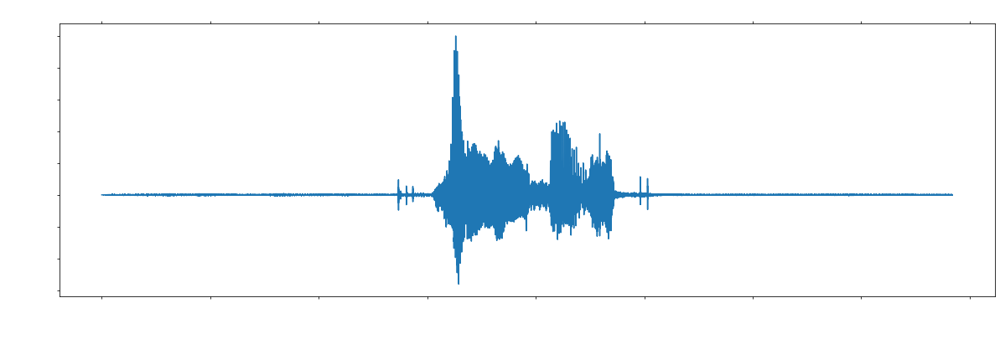

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 380160 bytes, expected 380196 bytes from header.
  sr, wav = wavfile.read(wav_loc)


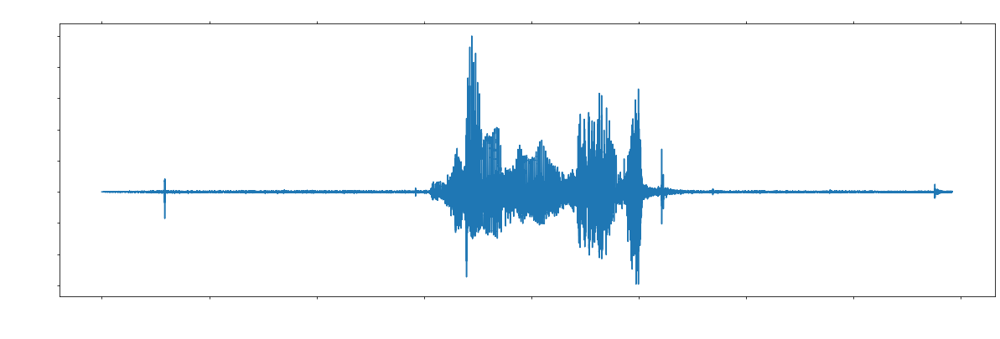

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 403200 bytes, expected 403236 bytes from header.
  sr, wav = wavfile.read(wav_loc)


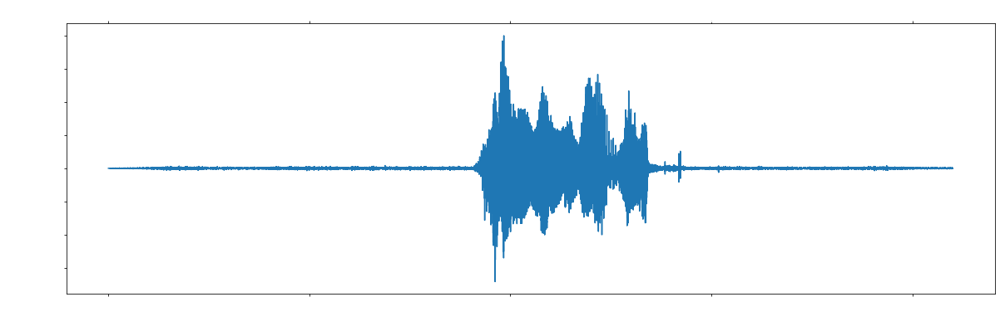

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 483840 bytes, expected 483876 bytes from header.
  sr, wav = wavfile.read(wav_loc)


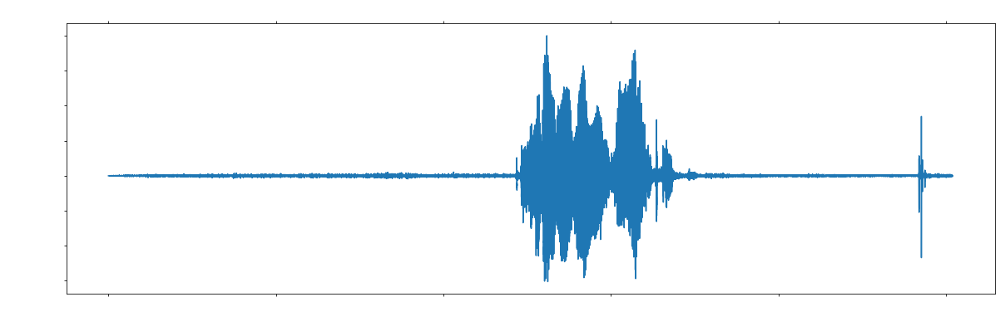

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 391680 bytes, expected 391716 bytes from header.
  sr, wav = wavfile.read(wav_loc)


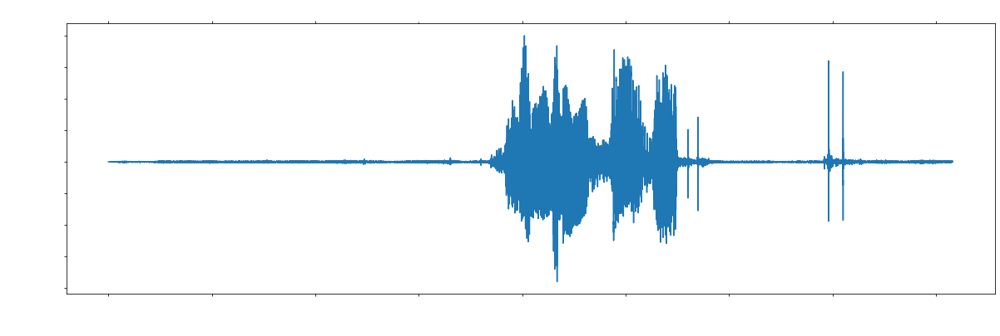

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 422400 bytes, expected 422436 bytes from header.
  sr, wav = wavfile.read(wav_loc)


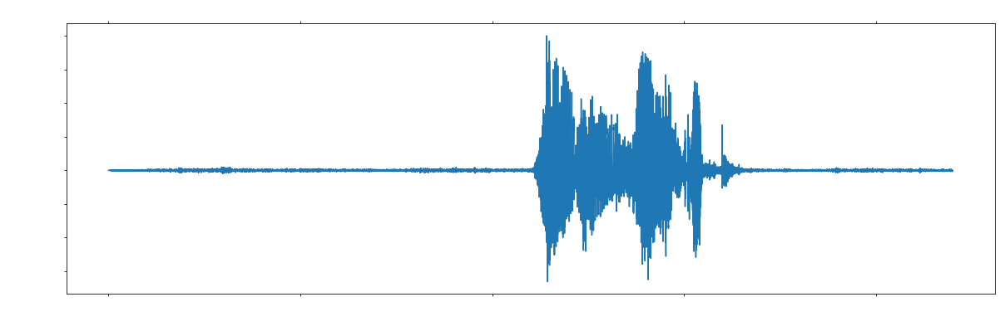

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 353280 bytes, expected 353316 bytes from header.
  sr, wav = wavfile.read(wav_loc)


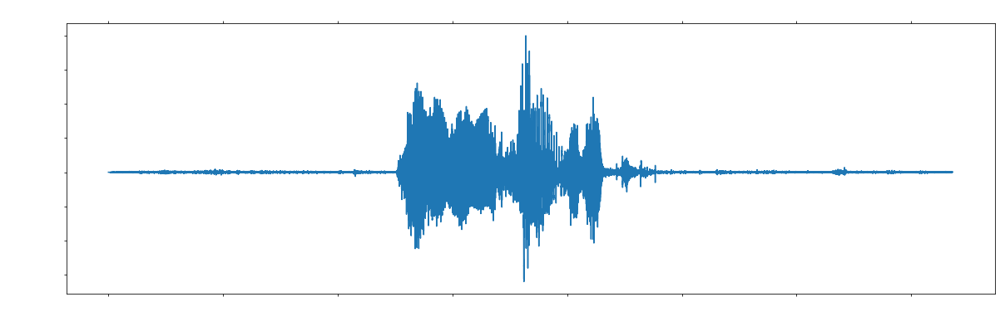

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 372480 bytes, expected 372516 bytes from header.
  sr, wav = wavfile.read(wav_loc)


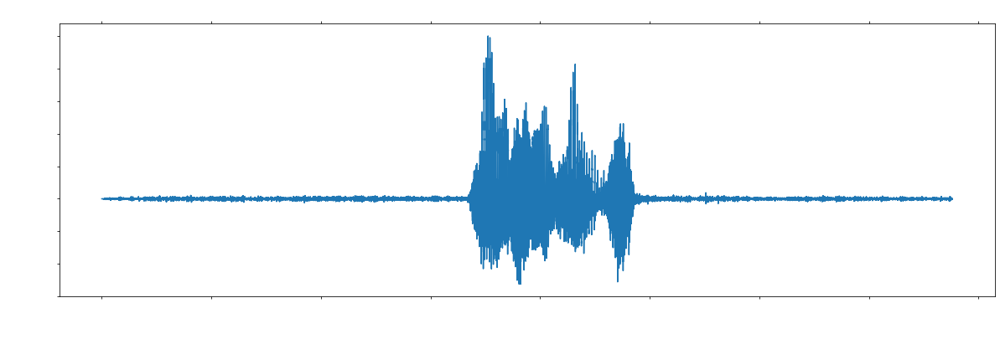

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 483840 bytes, expected 483876 bytes from header.
  sr, wav = wavfile.read(wav_loc)


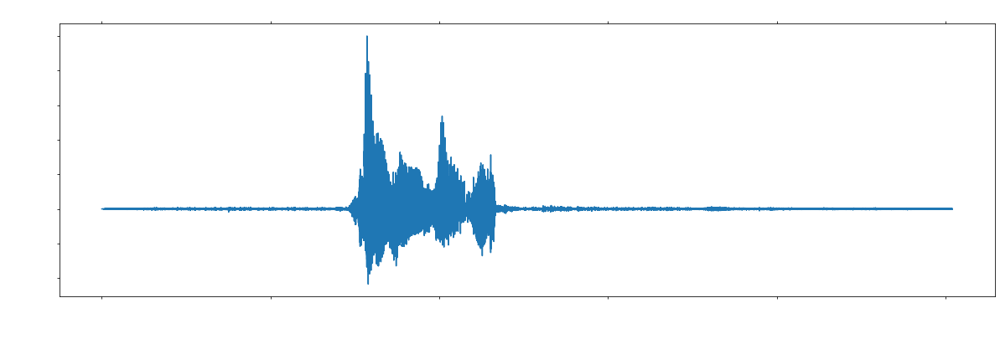

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 376320 bytes, expected 376356 bytes from header.
  sr, wav = wavfile.read(wav_loc)


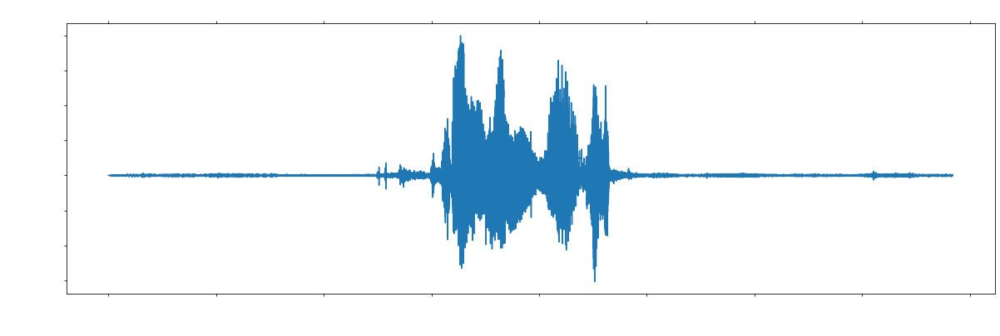

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 380160 bytes, expected 380196 bytes from header.
  sr, wav = wavfile.read(wav_loc)


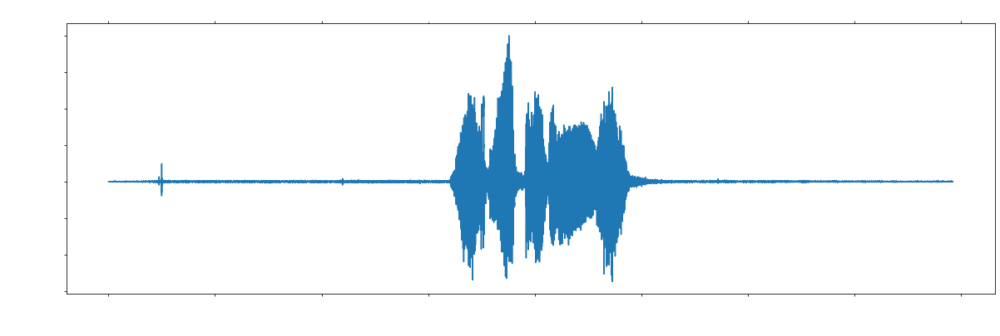

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 384000 bytes, expected 384036 bytes from header.
  sr, wav = wavfile.read(wav_loc)


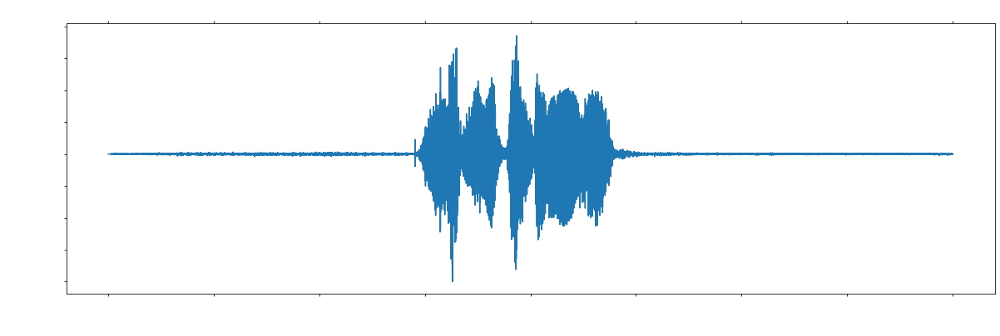

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 449280 bytes, expected 449316 bytes from header.
  sr, wav = wavfile.read(wav_loc)


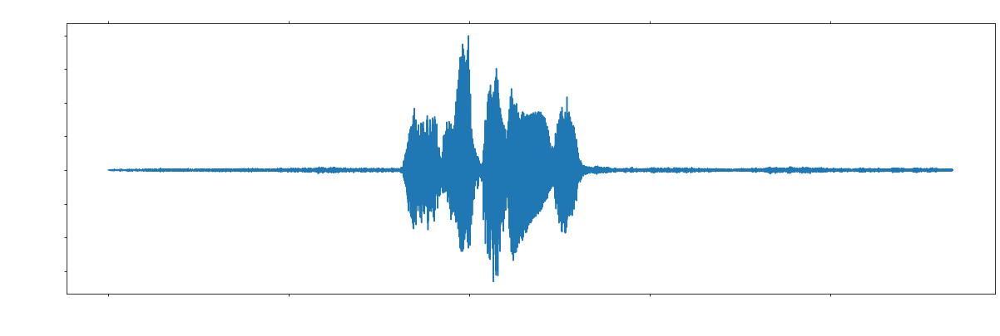

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 399360 bytes, expected 399396 bytes from header.
  sr, wav = wavfile.read(wav_loc)


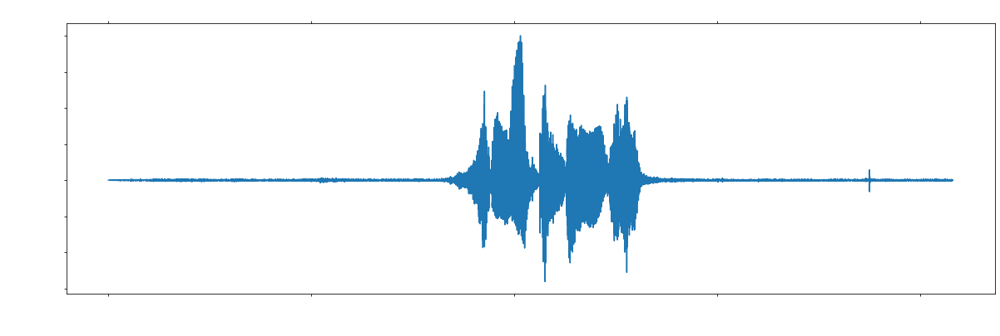

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 384000 bytes, expected 384036 bytes from header.
  sr, wav = wavfile.read(wav_loc)


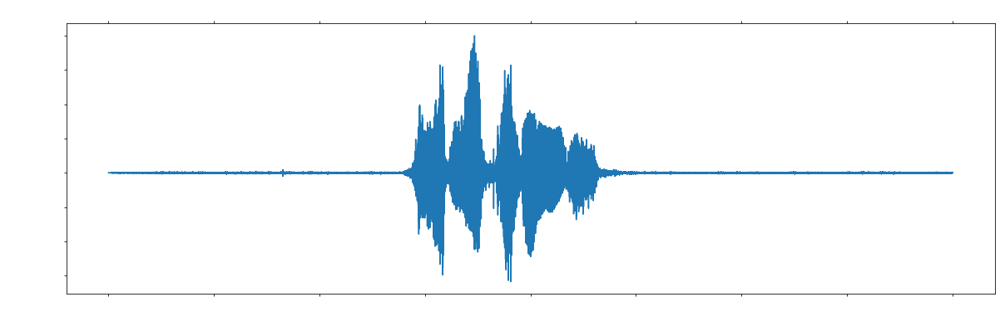

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 372480 bytes, expected 372516 bytes from header.
  sr, wav = wavfile.read(wav_loc)


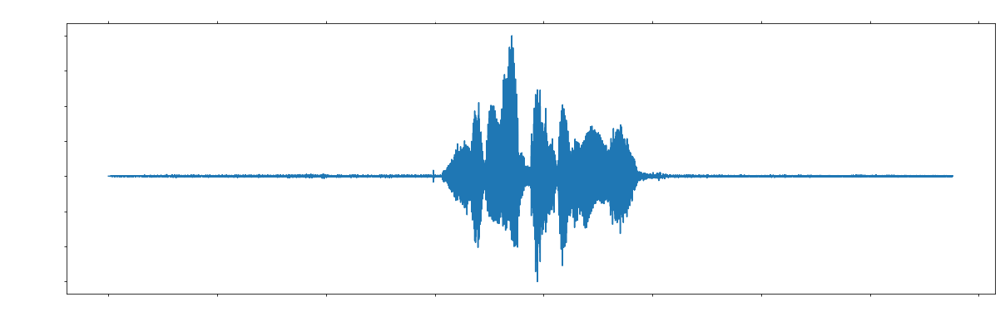

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 372480 bytes, expected 372516 bytes from header.
  sr, wav = wavfile.read(wav_loc)


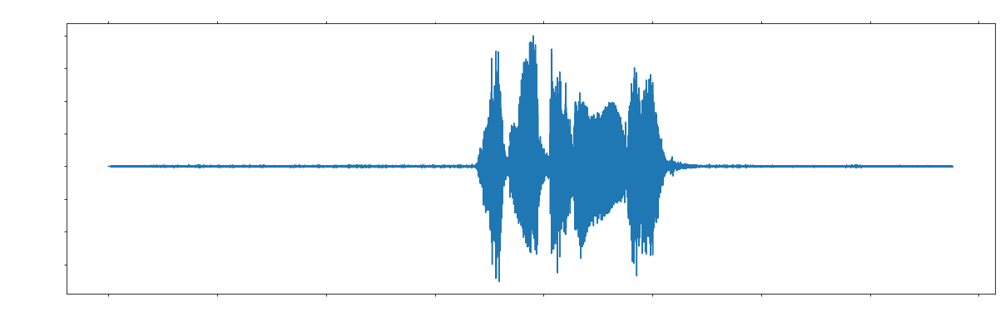

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 368640 bytes, expected 368676 bytes from header.
  sr, wav = wavfile.read(wav_loc)


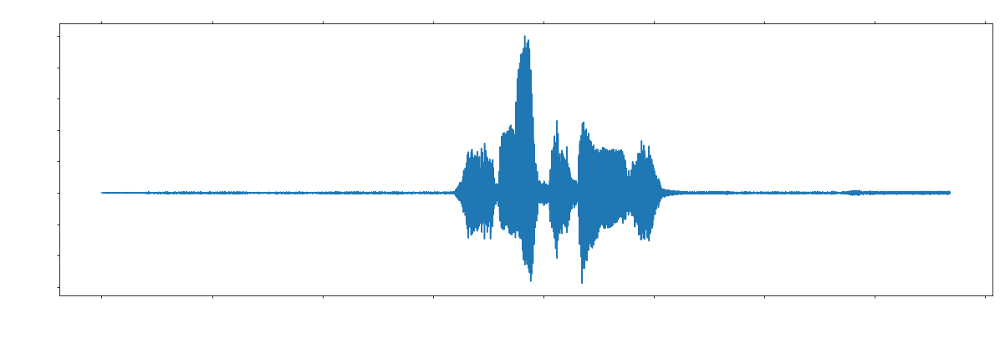

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 414720 bytes, expected 414756 bytes from header.
  sr, wav = wavfile.read(wav_loc)


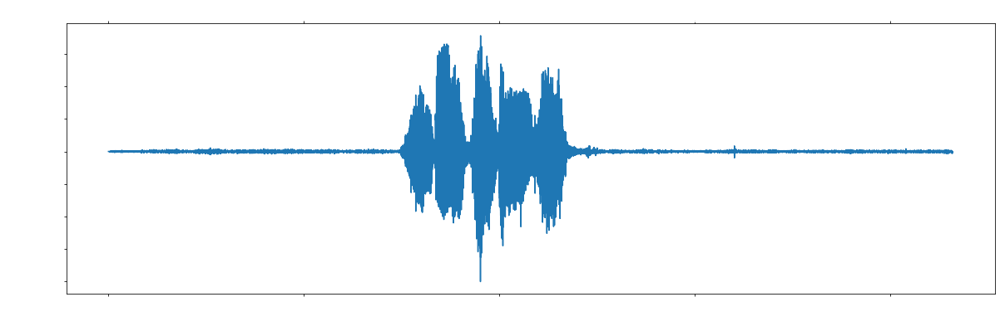

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 433920 bytes, expected 433956 bytes from header.
  sr, wav = wavfile.read(wav_loc)


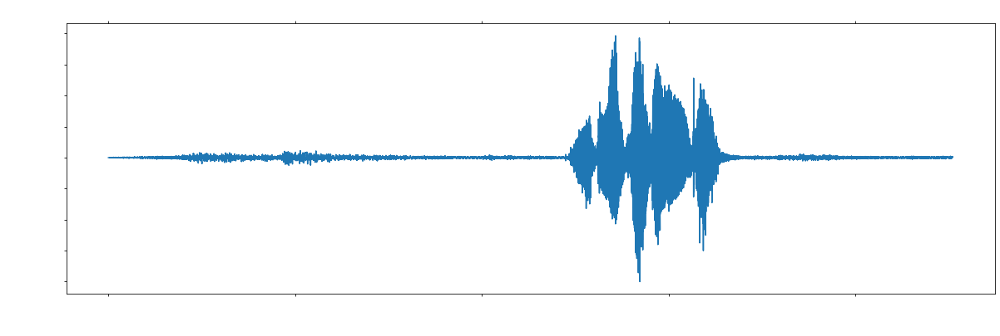

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 345600 bytes, expected 345636 bytes from header.
  sr, wav = wavfile.read(wav_loc)


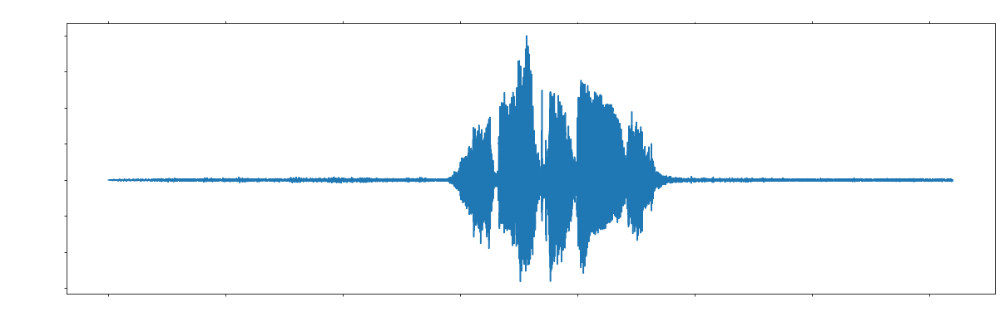

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 418560 bytes, expected 418596 bytes from header.
  sr, wav = wavfile.read(wav_loc)


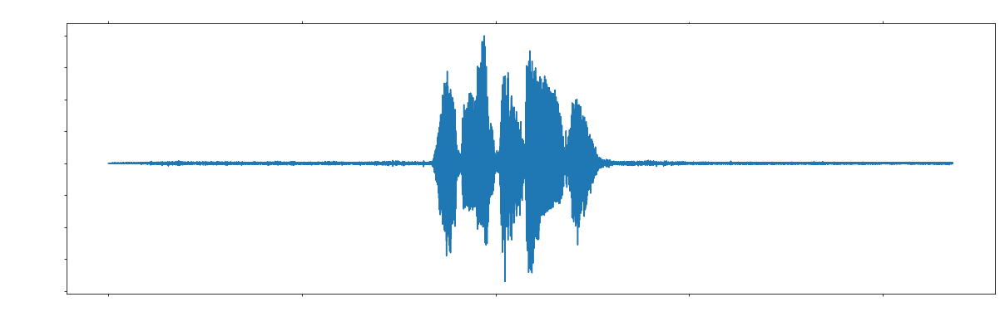

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 337920 bytes, expected 337956 bytes from header.
  sr, wav = wavfile.read(wav_loc)


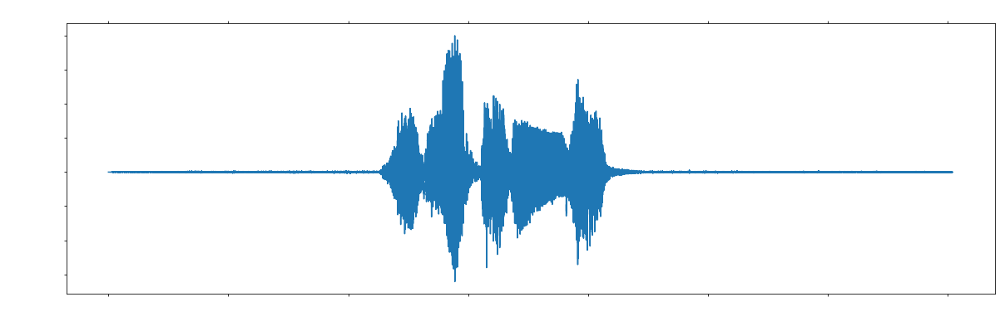

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 376320 bytes, expected 376356 bytes from header.
  sr, wav = wavfile.read(wav_loc)


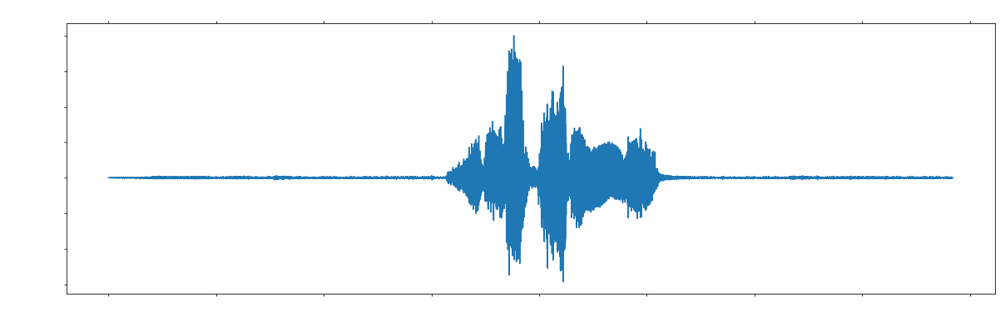

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 353280 bytes, expected 353316 bytes from header.
  sr, wav = wavfile.read(wav_loc)


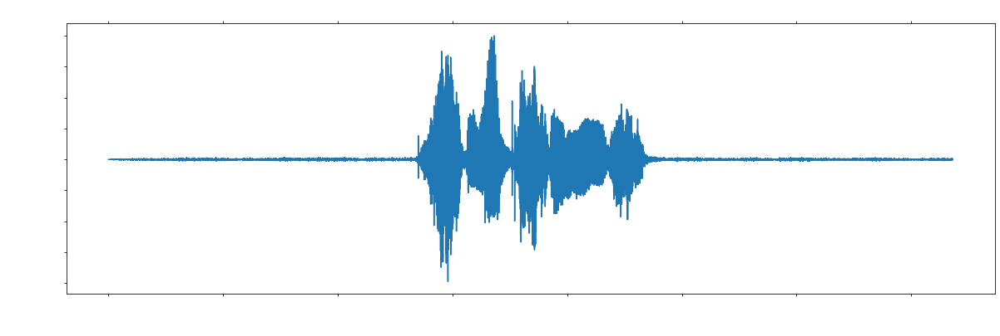

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 330240 bytes, expected 330276 bytes from header.
  sr, wav = wavfile.read(wav_loc)


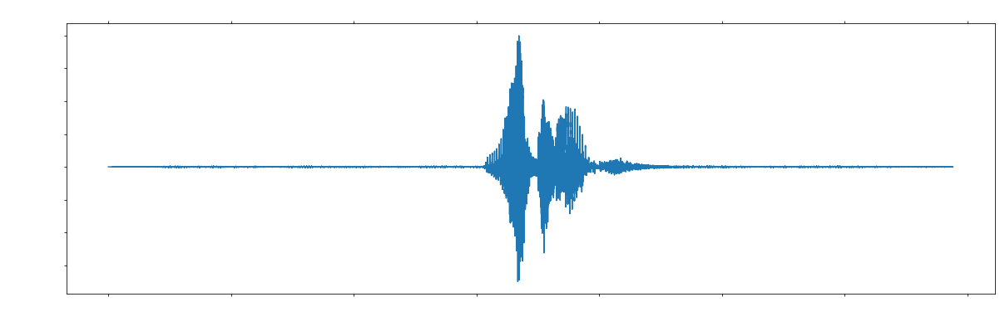

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 322560 bytes, expected 322596 bytes from header.
  sr, wav = wavfile.read(wav_loc)


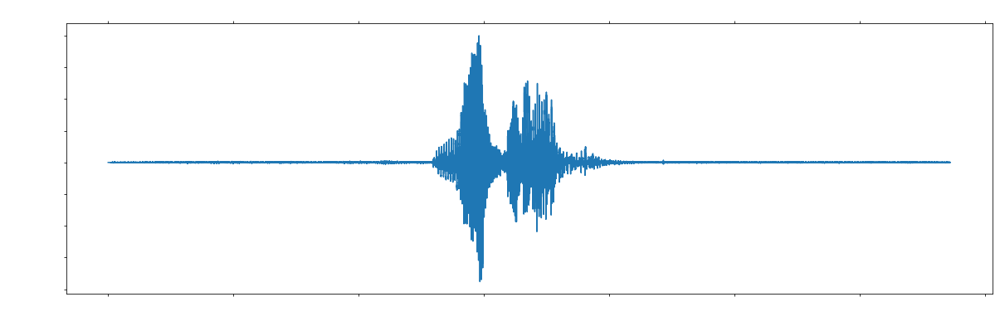

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 391680 bytes, expected 391716 bytes from header.
  sr, wav = wavfile.read(wav_loc)


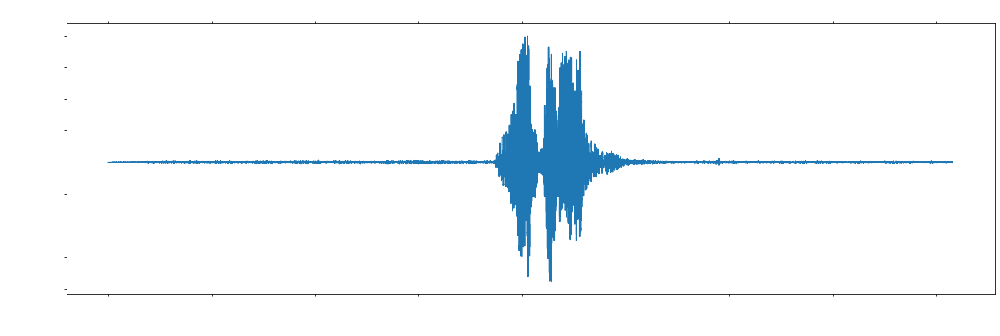

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 360960 bytes, expected 360996 bytes from header.
  sr, wav = wavfile.read(wav_loc)


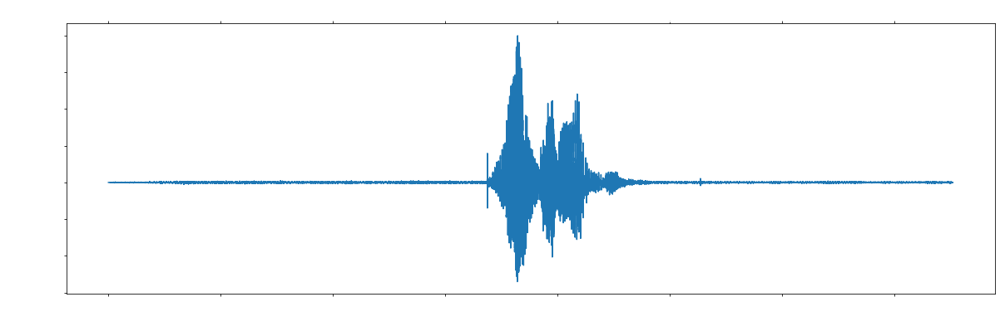

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 345600 bytes, expected 345636 bytes from header.
  sr, wav = wavfile.read(wav_loc)


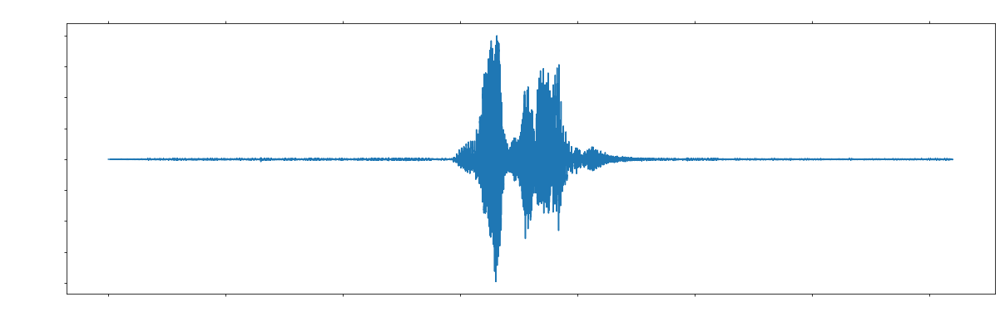

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 360960 bytes, expected 360996 bytes from header.
  sr, wav = wavfile.read(wav_loc)


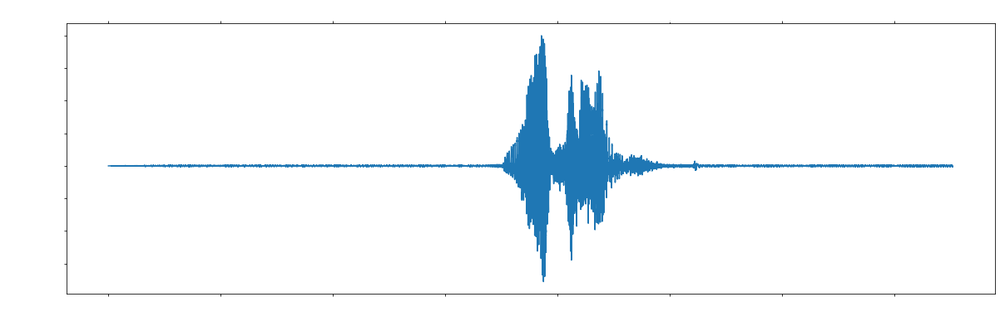

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 318720 bytes, expected 318756 bytes from header.
  sr, wav = wavfile.read(wav_loc)


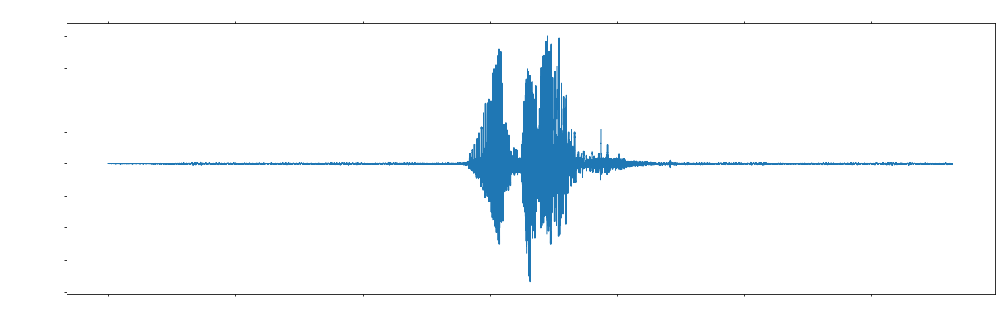

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 380160 bytes, expected 380196 bytes from header.
  sr, wav = wavfile.read(wav_loc)


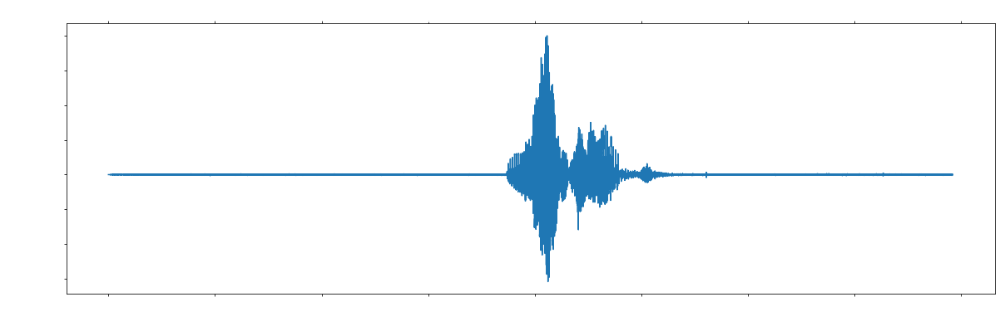

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 433920 bytes, expected 433956 bytes from header.
  sr, wav = wavfile.read(wav_loc)


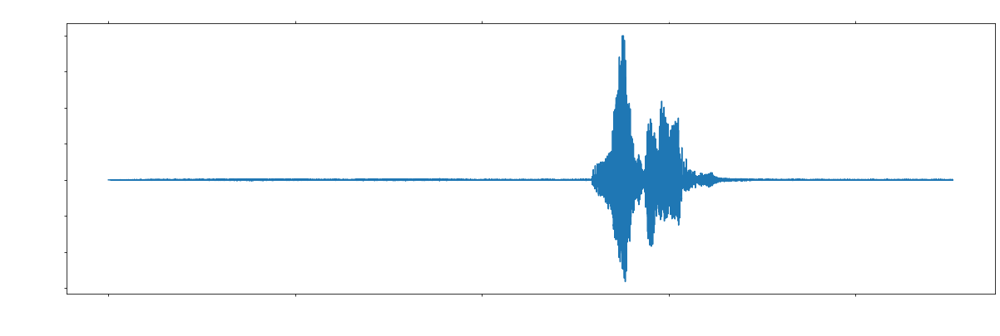

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 357120 bytes, expected 357156 bytes from header.
  sr, wav = wavfile.read(wav_loc)


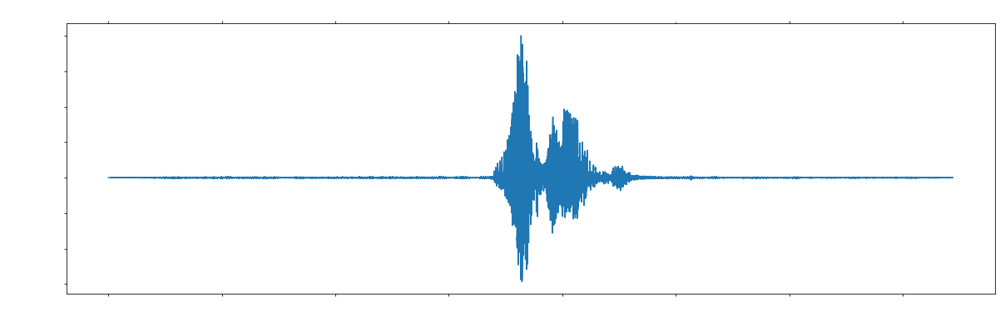

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 334080 bytes, expected 334116 bytes from header.
  sr, wav = wavfile.read(wav_loc)


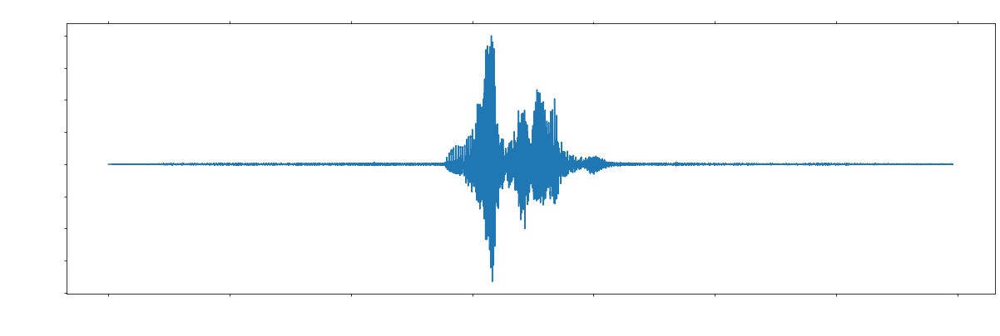

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 372480 bytes, expected 372516 bytes from header.
  sr, wav = wavfile.read(wav_loc)


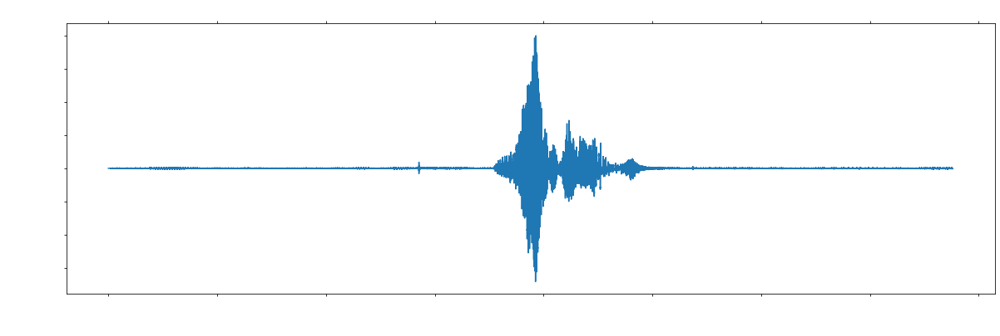

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 349440 bytes, expected 349476 bytes from header.
  sr, wav = wavfile.read(wav_loc)


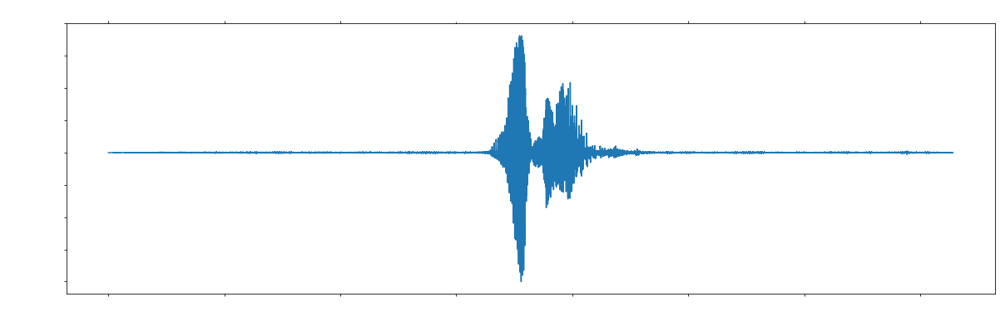

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 368640 bytes, expected 368676 bytes from header.
  sr, wav = wavfile.read(wav_loc)


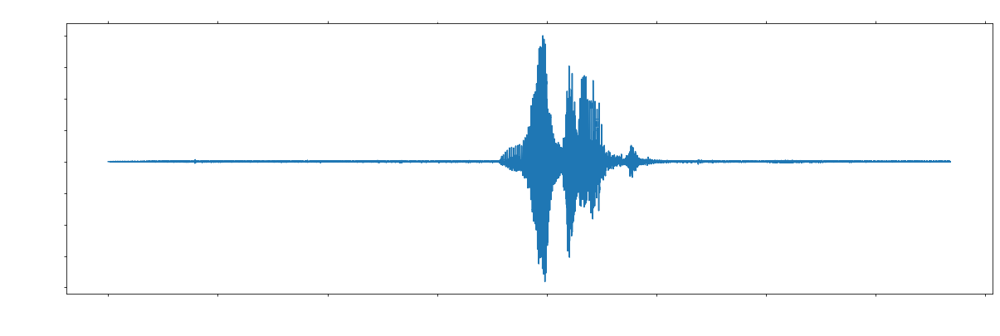

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2244043319.py:3: WavFileWarning: Reached EOF prematurely; finished at 453120 bytes, expected 453156 bytes from header.
  sr, wav = wavfile.read(wav_loc)


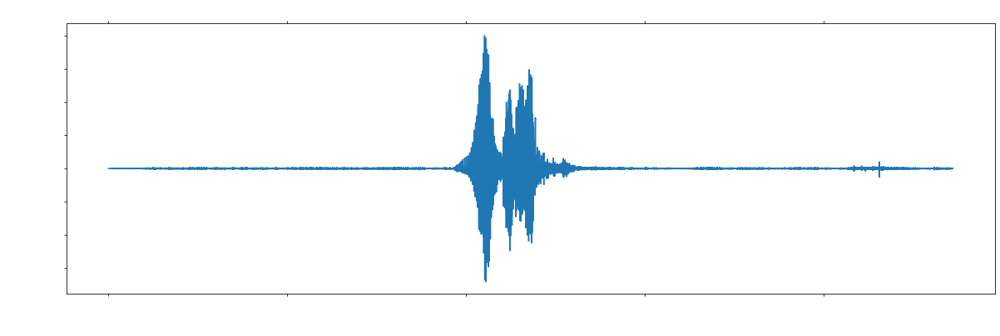

In [263]:
TRAIN_DIR = './../data/train/'

train_files = os.listdir(TRAIN_DIR)

outlier=[]
for file in tqdm(train_files):
    result = plot_audio(TRAIN_DIR + file)
    if result != None:
        outlier.append(result)
#     sr, wav = wavfile.read(TRAIN_DIR + file)
#     print(np.abs(wav).max())

In [353]:
def plot_audio_peaks(wav_loc):
    try:
        sr, wav = wavfile.read(wav_loc)
    #     wav, sr = librosa.load(wav_loc,
    #                            sr=None
    #                           )
    except UnboundLocalError:
        return {'UnboundLocalError': wav_loc.split('/')[-1]}
    
    if len(wav)==0:
        wav = wav
        return {'Format Error': wav_loc.split('/')[-1]}
    
    elif np.abs(wav).max() <= 1000:
        print('Silence!', wav_loc.split('/')[-1])
        return {'Silence': wav_loc.split('/')[-1]}
    
    else:
        wav = wav / np.abs(wav).max()
    sec = np.arange(len(wav))/float(sr)
    
    plt.figure(figsize=(15,5))
    peaks, _ = find_peaks(wav, width=100, height=(0,0.20))
    plt.plot(wav)
    
    plt.plot(peaks, wav[peaks], "or", markersize=5)
    plt.tick_params(length=3, labelsize=14, labelcolor='white', top=True)
    plt.xlabel('Time(sec)', fontdict={'color':'white', 'size':20})
    plt.ylabel('Scailed Amplitude', fontdict={'color':'white', 'size':20})
    plt.title(wav_loc.split('/')[-1], fontdict={'color':'white', 'size':20})
    plt.show()
    
    return None

In [354]:
outliers = {'Noise' : ['de-DE_Bahner_F_10-50_Germany _Bixby_16.wav',
                       'de-DE_Bahner_F_10-50_Germany _Hi Bixby_4.wav',
                       'de-DE_Bahner_F_10-50_Germany _Hi Bixby_8.wav',
                       'de-DE_Bahner_F_10-50_Germany _Samsung Health_12.wav',
                       'de-DE_Bahner_F_10-50_Germany _Samsung Health_14.wav',
                       'de-DE_Becker _F_10-50_Germany_Hi Bixby_21.wav',
                       'de-DE_Christine_F_10-50_France_Hi Bixby_12.wav',
                       'de-DE_Christine_F_10-50_France_SmartThings.wav',
                       'de-DE_Klaus_M_10-50_Germany_Netflix_6.wav',
                       'de-DE_Klaus_M_10-50_Germany_Samsung Health_23.wav',
                       'de-DE_Klaus_M_10-50_Germany_Samsung Health_25.wav'
                      ],
            'NoBlank' : ['de-DE_Bahner_F_10-50_Germany _Hi SmartThings_10.wav',
                         'de-DE_Klaus_M_10-50_Germany_Hi Bixby_23.wav',
                         'de-DE_Klaus_M_10-50_Germany_Hi SmartThings_4.wav',
                        ],
            'Silence' : ['de-DE_Becker _F_10-50_Germany_YouTube_4.wav',
                        ],
            'UnboundLocalError' : ['de-DE_Christine_F_10-50_France_SmartThings_23.wav'
                                  ]
           }

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\3945781438.py:3: WavFileWarning: Reached EOF prematurely; finished at 387840 bytes, expected 387876 bytes from header.
  sr, wav = wavfile.read(wav_loc)


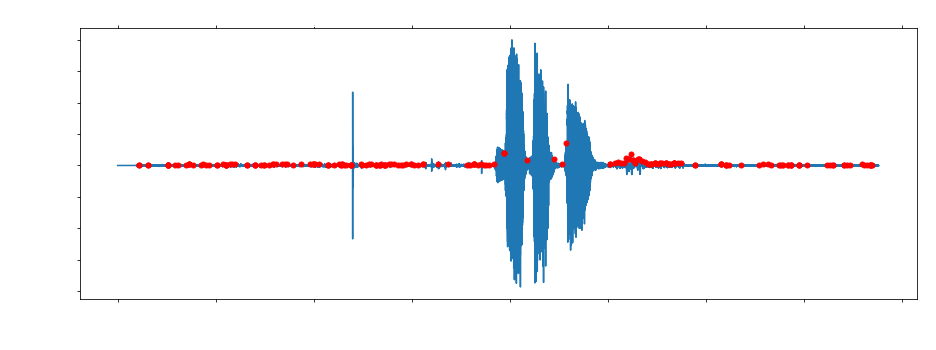

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\3945781438.py:3: WavFileWarning: Reached EOF prematurely; finished at 418560 bytes, expected 418596 bytes from header.
  sr, wav = wavfile.read(wav_loc)


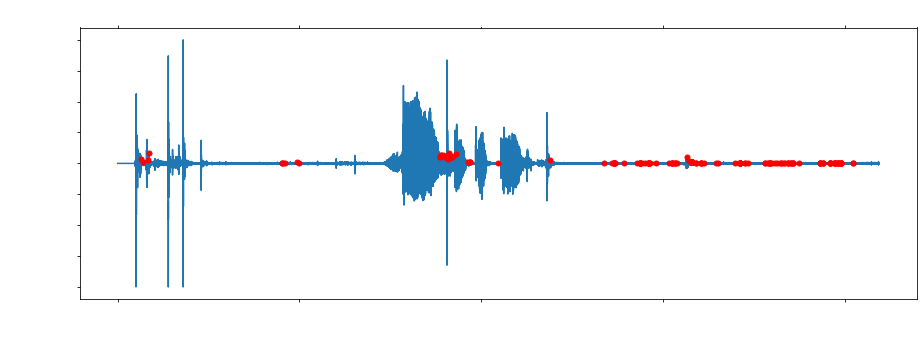

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\3945781438.py:3: WavFileWarning: Reached EOF prematurely; finished at 533760 bytes, expected 533796 bytes from header.
  sr, wav = wavfile.read(wav_loc)


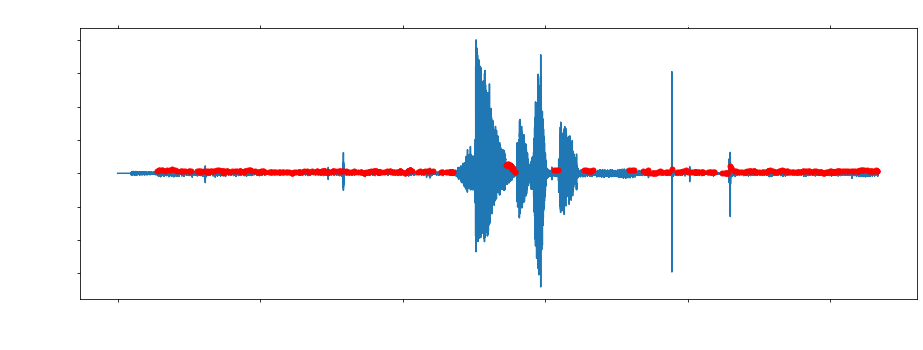

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\3945781438.py:3: WavFileWarning: Reached EOF prematurely; finished at 384000 bytes, expected 384036 bytes from header.
  sr, wav = wavfile.read(wav_loc)


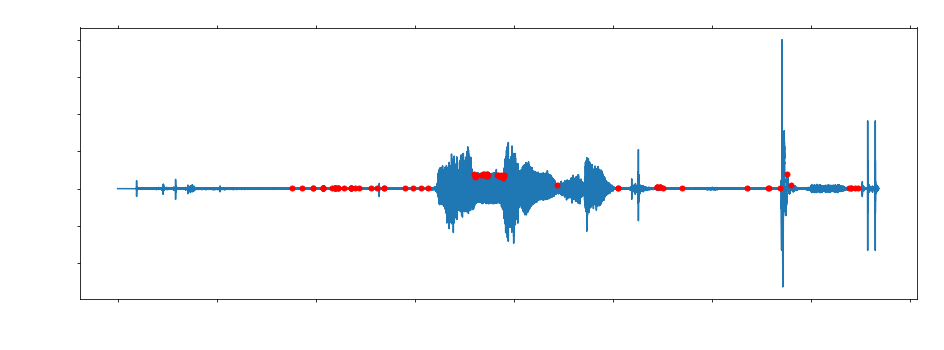

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\3945781438.py:3: WavFileWarning: Reached EOF prematurely; finished at 449280 bytes, expected 449316 bytes from header.
  sr, wav = wavfile.read(wav_loc)


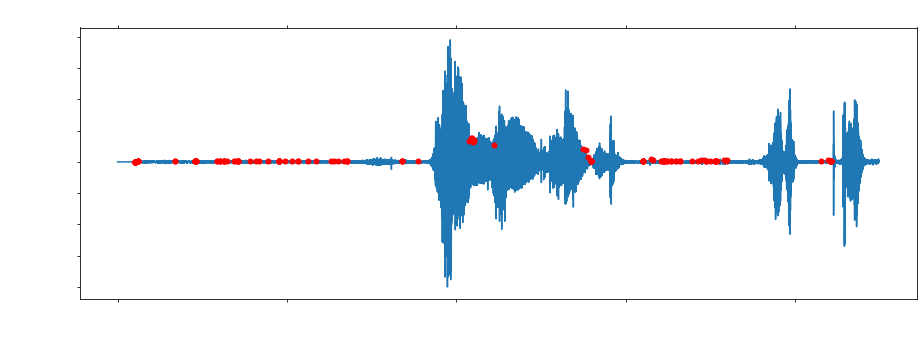

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\3945781438.py:3: WavFileWarning: Reached EOF prematurely; finished at 330240 bytes, expected 330276 bytes from header.
  sr, wav = wavfile.read(wav_loc)


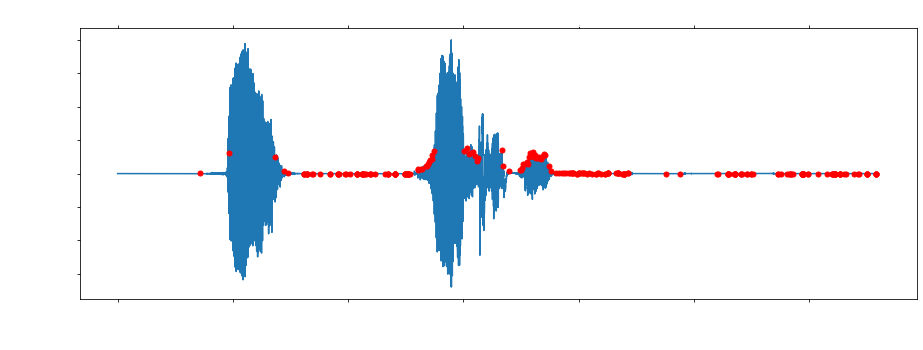

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\3945781438.py:3: WavFileWarning: Reached EOF prematurely; finished at 426240 bytes, expected 426276 bytes from header.
  sr, wav = wavfile.read(wav_loc)


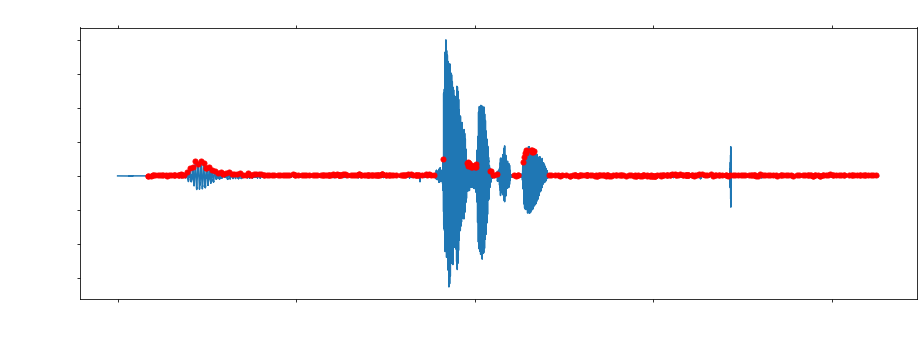

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\3945781438.py:3: WavFileWarning: Reached EOF prematurely; finished at 418560 bytes, expected 418596 bytes from header.
  sr, wav = wavfile.read(wav_loc)


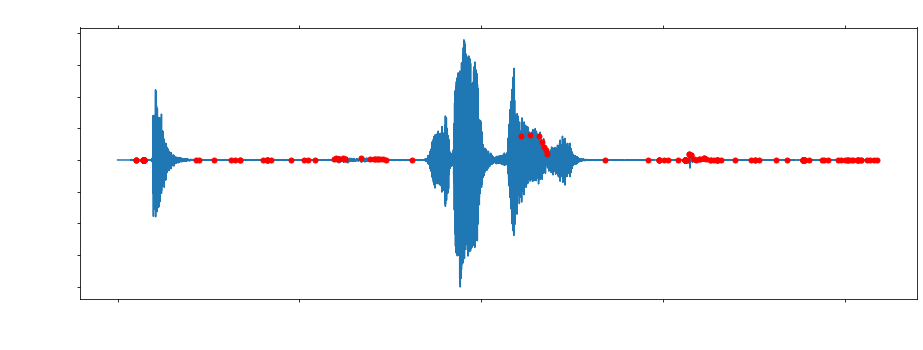

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\3945781438.py:3: WavFileWarning: Reached EOF prematurely; finished at 357120 bytes, expected 357156 bytes from header.
  sr, wav = wavfile.read(wav_loc)


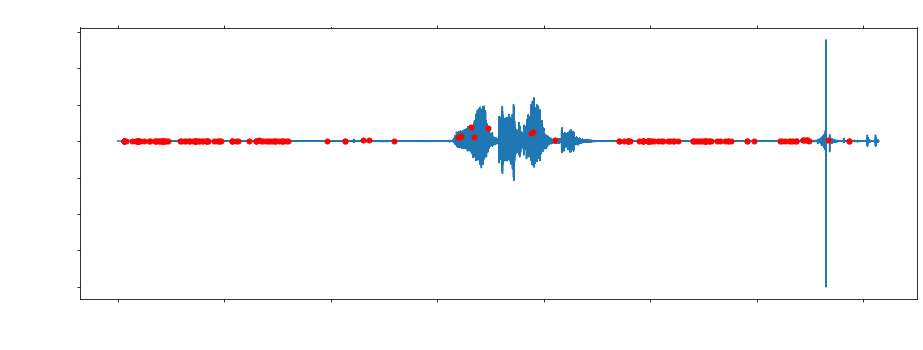

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\3945781438.py:3: WavFileWarning: Reached EOF prematurely; finished at 483840 bytes, expected 483876 bytes from header.
  sr, wav = wavfile.read(wav_loc)


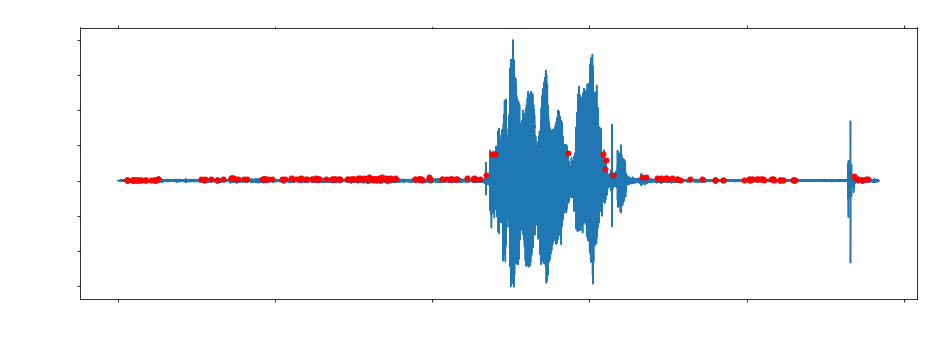

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\3945781438.py:3: WavFileWarning: Reached EOF prematurely; finished at 391680 bytes, expected 391716 bytes from header.
  sr, wav = wavfile.read(wav_loc)


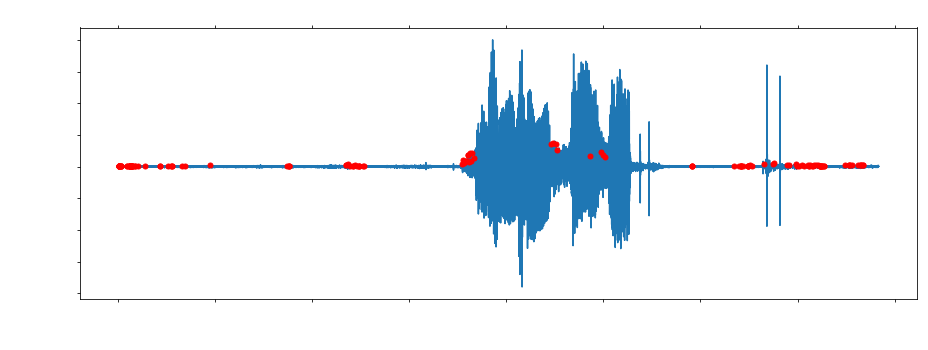

In [355]:
for file in outliers['Noise']:
    plot_audio_peaks(TRAIN_DIR + file)
    plt.show()

C:\Users\lynn1\AppData\Local\Temp\ipykernel_6808\2684722620.py:3: WavFileWarning: Reached EOF prematurely; finished at 391680 bytes, expected 391716 bytes from header.
  sr, wav = wavfile.read(wav_loc)


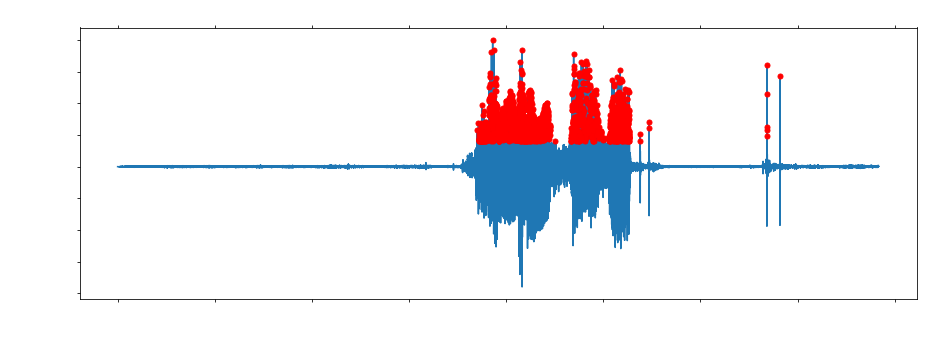

In [343]:
plot_audio_peaks(TRAIN_DIR + 'de-DE_Klaus_M_10-50_Germany_Samsung Health_25.wav')
plt.show()